In [1]:
%%html
<img src="AliceBandit_Logo.png", width=400, height=400>

# ADVERSARIAL THRESHOLDING SEMI-BANDIT for ALICE DCS

AliceBandit is an adversarial multi-armed semi-bandit for the thresholding bandit problem with K arms. In a repeated game over T rounds, played against an oblivious adversary that generates feedback for each arm. A player decides which k out of K arms to pull each round, where $k\leq k$ and the player's objective is to only pull arms that return values exceeding some pre-defined threshold $\theta$. 

AliceBandit is applied to the problem of efficiently monitoring multiple streams of control parameters associated with one of the detectors on ALICE (A Large Ion Collider Experiment) at the LHC, CERN. In this case, each arm represents a high voltage channel on the TRD (Transition Radiation Detector). Currently, conditions data for the experiment are collected at the end of a data-taking run for validating the physics data. In 2021, ALICE will move to continuous operations and conditions data will need to be monitored continuously. 

AliceBandit increases the efficiency over current approaches by reducing the need to observe every channel, whilst retaining the ability to identify anomalous behaviour. The threshold used in this example adapts dynamically for each channel and uses a controllable range centred on the value of that channel's previous feedback.

In [2]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
#import functions as fns
%matplotlib inline

## We would like to thank the ALICE Detector Control System (DCS) team for providing the TRD HV dataset

In [3]:
TRD_HV_files = sorted(os.listdir(os.getcwd()+'/TRD_DATA'))
Data = [[] for i in range(len(TRD_HV_files))]
for i in range(len(TRD_HV_files)):
    print('Downloading ALICE TRD High Voltage {} file'.format(TRD_HV_files[i]))
    df=pd.read_csv(os.getcwd()+'/TRD_DATA/'+str(TRD_HV_files[i]), sep=',',header=None,warn_bad_lines=True, error_bad_lines=False)
    Data[i] = np.array(df.iloc[:,1])    

/home/bower5005/ALICE_TRD/ALICE_TRD_HV/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


b'Skipping line 1102096: expected 3 fields, saw 5\n'


In [4]:
# Files to add:
# 1013.csv,

## Set time horizon T and number of arms K

In [5]:
T = 100000
dim = np.int(np.sqrt(len(Data)))
print('Number of rounds to be played:',T)
print('Number of arms:',dim**2)

for i in range(len(Data)):
    Data[i] = Data[i][:T]

Number of rounds to be played: 100000
Number of arms: 144


## Plot of entire dataset for 144 TRD high voltage channels between Jan 2015 and May 2015

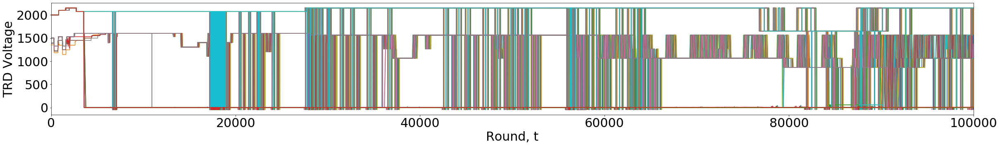

In [6]:
plt.figure(figsize=(40,5))
for i in range(dim**2):
    plt.plot(Data[i])
plt.xlabel('Round, t', fontsize=30)
plt.ylabel('TRD Voltage', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlim([0,T+1])
plt.show()

## Normalise data

In [8]:
Y1 = np.zeros([T,dim**2])
for i in range(dim**2):
    Y1[:,i] = Data[i]
Y = Y1
max_val = np.max(Y)
min_val = np.min(Y)
diff = max_val - min_val
for j in range(dim**2):
    for i in range(T):
        Y[i,j] = (Y[i,j] - min_val) / np.float(diff)

D = [[] for i in range(T)]
Concern_list = [[] for i in range(T)]
Optimal_list = [[] for i in range(T)]
Test1 = [[] for i in range(T)]
for i in range(T):
    Test1[i] = np.zeros([dim,dim])
    D[i] = np.zeros([dim,dim])
        
for t in range(T):
    D[t] = np.reshape(Y[t,:], (dim,dim))

## Decide number of arms to select each round, k

In [9]:
num_samples = np.int(0.33*dim**2)
print('{} samples taken each round for {} rounds'.format(num_samples,T))
print('Every channel is potentially sampled at least once every {} rounds.'.format(np.divmod(dim**2, num_samples)[0]+1))
power_reduction = 1 - (num_samples)/np.float(dim**2)
print('Power reduction:', power_reduction)

47 samples taken each round for 100000 rounds
Every channel is potentially sampled at least once every 4 rounds.
Power reduction: 0.6736111111111112


## Run simulation

In [10]:
%matplotlib notebook
from matplotlib import animation, rc
from IPython.display import HTML
import time
np.random.seed(1)
p = np.random.rand(T)
#p = np.ones(T)*0.9
np.random.seed(4)
p_ = np.random.rand(T)
#p_ = np.ones(T)*0.9
Reset_counter = np.ones(dim**2)
flag = 1
if flag == 1:
    #plt.figure(figsize=(12,12))
    #fig = plt.gcf()
    #fig.show()
    #fig.canvas.draw()
    gamma = 0.8
    Prev_t = [[] for i in range(dim**2)]
    Pull_counter = np.zeros([T,dim**2])
    Threshold_count = np.zeros(dim**2)
    pull_p = np.ones(dim**2)
    Pull_p = np.zeros([T,dim**2])
    old_pull_p = np.zeros(dim**2)
    X = np.zeros([T,dim**2])
    X_hat = np.zeros(dim**2)
    sigma_hat = np.zeros(dim**2)
    Threshold_list = np.zeros([T,dim**2])
    Threshold_arms = []
    Reward = np.zeros(T)
    Threshold_upper1 = np.ones(dim**2)
    Threshold_lower1 = np.zeros(dim**2)
    boundary = 0.0001

    for t in range(T):
        print('Round ',t)
        ARMS = []
        if np.mod(t,np.divmod(dim**2,num_samples)[0]) == 0:
            choice = np.random.permutation(dim**2) # choose a random permutation of 1 to dim**2

        if np.mod(t,np.divmod(dim**2,num_samples)[0]) < np.divmod(dim**2,num_samples)[0]-1:
            # choose a subset of size num_samples from choice list
            for j in range(num_samples):
                arm = choice[num_samples*np.mod(t,np.divmod(dim**2,num_samples)[0])+j]
                if pull_p[arm] > p[t]:
                    ARMS.append(arm)
                    Pull_counter[t,arm] = 1
                    X[t,arm] = Y[t,arm]
                    
                    if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                        Threshold_list[t,arm] = 1
                        Threshold_count[arm] += 1
                        pull_p[arm] = 1
                    else:
                        new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                        pull_p[arm] = pull_p[arm]*new_pull*gamma
                    
                    Threshold_upper1[arm] = X[t,arm] + boundary
                    Threshold_lower1[arm] = X[t,arm] - boundary
                    
                    prev_t = t
                    if prev_t == 0:
                        Prev_t[arm] = np.array([t])
                        X_hat[arm] = X[t,arm]
                    else:
                        Prev_t[arm] = np.append(Prev_t[arm],t)
                        X_hat[arm] = np.mean(Y[Prev_t[arm].astype(int),arm])
                        sigma_hat[arm] = np.var(Y[Prev_t[arm].astype(int),arm])
                    
                    Pull_p[t,arm] = pull_p[arm]
                
                if not Prev_t[arm][-1].astype(int) == t:
                    if len(Prev_t[arm]) > 1:
                        if t - Prev_t[arm][-1].astype(int) > 0.05*T:
                            Prev_t[arm] = np.append(Prev_t[arm],t)
                            Pull_counter[t,arm] = 1
                            X[t,arm] = Y[t,arm]
                            if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                                Threshold_list[t,arm] = 1
                                Threshold_count[arm] += 1
                                pull_p[arm] = 1
                            else:
                                new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                                pull_p[arm] = pull_p[arm]*new_pull*gamma
                                
                            Threshold_upper1[arm] = X[t,arm] + boundary
                            Threshold_lower1[arm] = X[t,arm] - boundary
                            
        elif np.divmod(dim**2,num_samples)[0] > np.divmod(dim**2,num_samples)[1]:
            for j in range(num_samples+np.divmod(dim**2,num_samples)[1]):
                arm = choice[num_samples*np.mod(t,np.divmod(dim**2,num_samples)[0])+j]
                if pull_p[arm] > p[t]:
                    ARMS.append(arm)
                    Pull_counter[t,arm] = 1
                    X[t,arm] = Y[t,arm]

                    if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                        Threshold_list[t,arm] = 1
                        Threshold_count[arm] += 1
                        pull_p[arm] = 1
                    else:
                        new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                        pull_p[arm] = pull_p[arm]*new_pull*gamma

                    Threshold_upper1[arm] = X[t,arm] + boundary
                    Threshold_lower1[arm] = X[t,arm] - boundary

                    prev_t = t
                    if prev_t == 0:
                        Prev_t[arm] = np.array([t])
                        X_hat[arm] = X[t,arm]
                    else:
                        Prev_t[arm] = np.append(Prev_t[arm],t)
                        X_hat[arm] = np.mean(Y[Prev_t[arm].astype(int),arm])
                        sigma_hat[arm] = np.var(Y[Prev_t[arm].astype(int),arm])

                    Pull_p[t,arm] = pull_p[arm]
                    
                if not Prev_t[arm][-1].astype(int) == t:
                    if len(Prev_t[arm]) > 1:
                        if t - Prev_t[arm][-1].astype(int) > 0.05*T:
                            Prev_t[arm] = np.append(Prev_t[arm],t)
                            Pull_counter[t,arm] = 1
                            X[t,arm] = Y[t,arm]
                            if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                                Threshold_list[t,arm] = 1
                                Threshold_count[arm] += 1
                                pull_p[arm] = 1
                            else:
                                new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                                pull_p[arm] = pull_p[arm]*new_pull*gamma
                                
                            Threshold_upper1[arm] = X[t,arm] + boundary
                            Threshold_lower1[arm] = X[t,arm] - boundary
                                
            else:
                for j in range(num_samples+np.divmod(dim**2,num_samples)[1]):
                    arm = choice[num_samples*np.mod(t,np.divmod(dim**2,num_samples)[0])+j]
                    if pull_p[arm] > p[t]:
                        ARMS.append(arm)
                        Pull_counter[t,arm] = 1
                        X[t,arm] = Y[t,arm]

                        if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                            Threshold_list[t,arm] = 1
                            Threshold_count[arm] += 1
                            pull_p[arm] = 1
                        else:
                            new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                            pull_p[arm] = pull_p[arm]*new_pull*gamma

                        Threshold_upper1[arm] = X[t,arm] + boundary
                        Threshold_lower1[arm] = X[t,arm] - boundary

                        prev_t = t
                        if prev_t == 0:
                            Prev_t[arm] = np.array([t])
                            X_hat[arm] = X[t,arm]
                        else:
                            Prev_t[arm] = np.append(Prev_t[arm],t)
                            X_hat[arm] = np.mean(Y[Prev_t[arm].astype(int),arm])
                            sigma_hat[arm] = np.var(Y[Prev_t[arm].astype(int),arm])

                        Pull_p[t,arm] = pull_p[arm]
                        
                    if not Prev_t[arm][-1].astype(int) == t:
                        if len(Prev_t[arm]) > 1:
                            if t - Prev_t[arm][-1].astype(int) > 0.05*T:
                                Prev_t[arm] = np.append(Prev_t[arm],t)
                                Pull_counter[t,arm] = 1
                                X[t,arm] = Y[t,arm]
                                if X[t,arm] > Threshold_upper1[arm] or X[t,arm] < Threshold_lower1[arm]:
                                    Threshold_list[t,arm] = 1
                                    Threshold_count[arm] += 1
                                    pull_p[arm] = 1
                                else:
                                    new_pull = np.exp(-np.min([np.abs(Threshold_upper1[arm]-X[t,arm]),np.abs(X[t,arm]-Threshold_lower1[arm])]))
                                    pull_p[arm] = pull_p[arm]*new_pull*gamma

                                Threshold_upper1[arm] = X[t,arm] + boundary
                                Threshold_lower1[arm] = X[t,arm] - boundary
                                
        if t > 0:
            Threshold_arms = np.where(Threshold_list[t-1,:])[0]
            Pull_counter[t,Threshold_arms] = 1
            X[t,Threshold_arms] = Y[t,Threshold_arms]
            for i in range(len(Threshold_arms)):
                if X[t,Threshold_arms[i]] > Threshold_upper1[Threshold_arms[i]] or X[t,Threshold_arms[i]] < Threshold_lower1[Threshold_arms[i]]:
                    Threshold_list[t,Threshold_arms[i]] = 1
                    Threshold_count[Threshold_arms[i]] += 1
                    Prev_t[Threshold_arms[i]] = np.append(Prev_t[Threshold_arms[i]],t)
                    #pull_p[Threshold_arms[i]] = 0
                    Pull_p[t,Threshold_arms[i]] = pull_p[Threshold_arms[i]]
                    #X_hat[Threshold_arms[i]] = np.mean(Y[Prev_t[Threshold_arms[i]].astype(int),Threshold_arms[i]])
                    #sigma_hat[Threshold_arms[i]] = np.var(Y[Prev_t[Threshold_arms[i]].astype(int),Threshold_arms[i]])
                else:
                    Threshold_list[t,Threshold_arms[i]] = 0
                    Prev_t[Threshold_arms[i]] = np.append(Prev_t[Threshold_arms[i]],t)
                    #X_hat[Threshold_arms[i]] = np.mean(Y[Prev_t[Threshold_arms[i]].astype(int),Threshold_arms[i]])
                    #sigma_hat[Threshold_arms[i]] = np.var(Y[Prev_t[Threshold_arms[i]].astype(int),Threshold_arms[i]])
                    #new_pull = np.float(np.sqrt(Reset_counter[Threshold_arms[i]]**2))*np.abs(X_hat[Threshold_arms[i]] - np.mean([Threshold_upper,Threshold_lower])) + np.float(sigma_hat[Threshold_arms[i]]+epsilon)
                    #pull_p[Threshold_arms[i]] = pull_p[Threshold_arms[i]] + new_pull 
                    #pull_p[Threshold_arms[i]] = gamma*pull_p[Threshold_arms[i]]
                    Pull_p[t,Threshold_arms[i]] = pull_p[Threshold_arms[i]]
                    #if pull_p[Threshold_arms[i]] > 0.999 and p_[t] > 0.5 or (t - Prev_t[Threshold_arms[i]][-1].astype(int) > 0.1*T):
                    #    Reset_counter[arm] += 1
                    #    pull_p[Threshold_arms[i]] = 0
                    #    Pull_p[t,Threshold_arms[i]] = pull_p[Threshold_arms[i]]
                if np.sum(np.isin(ARMS,Threshold_arms[i])) == 0:
                    Threshold_upper1[Threshold_arms[i]] = X[t,Threshold_arms[i]] + boundary
                    Threshold_lower1[Threshold_arms[i]] = X[t,Threshold_arms[i]] - boundary
        Test = np.reshape(X[t,:], (dim,dim))
        Test1[t] = Test
        #plt.imshow(Test, cmap=cmap, norm=norm)
        #plt.colorbar()
        #if len(np.where(Threshold_list[t,:]==1)[0]) == 1:
        #    plt.title('1 arm detected exceeding Threshold in round {}'.format(t))
        #else:
        #   plt.title('{} arms detected exceeding Threshold in Round {}'.format(len(np.where(Threshold_list[t,:]==1)[0]),t))
        #fig.canvas.draw()
        #plt.clf()
        print('Arms pulled:',np.unique(ARMS))
        print('Arms on Threshold list:',Threshold_arms)

Round  0
Arms pulled: [  0   3   7   8  11  12  29  30  31  34  44  50  51  54  55  56  57  63
  64  65  66  68  76  77  78  85  86  89  90  91  93  94  98  99 100 101
 103 106 109 110 115 117 120 123 139 140 142]
Arms on Threshold list: []
Round  1
Arms pulled: [  2   5   9  10  14  15  16  18  22  24  26  28  33  37  38  39  40  41
  43  45  47  53  59  62  67  69  70  74  75  81  87  92  97 102 105 114
 116 122 124 126 128 130 131 133 134 141 143]
Arms on Threshold list: []
Round  2
Arms pulled: []
Arms on Threshold list: []
Round  3
Arms pulled: [  3   7  10  16  26  30  32  36  37  42  43  46  48  49  50  55  58  62
  68  70  72  73  74  76  77  79  82  88  90  91  92  98 100 102 103 106
 112 116 117 118 119 124 127 137 139 140 143]
Arms on Threshold list: []
Round  4
Arms pulled: [  1   2   6  11  12  14  15  20  21  24  25  27  28  29  33  38  40  41
  44  51  53  56  59  61  63  65  66  67  75  80  81  84  89  94  96  97
 105 107 110 111 115 123 126 130 131 141 142]
Arms on Thr

Arms pulled: [  1   4   5   6   7   8  15  16  18  20  28  34  39  40  42  55  56  58
  65  68  69  74  75  76  79  90  91  94  99 100 101 102 104 105 108 111
 112 113 114 115 117 119 121 122 131 143]
Arms on Threshold list: []
Round  91
Arms pulled: []
Arms on Threshold list: []
Round  92
Arms pulled: []
Arms on Threshold list: []
Round  93
Arms pulled: []
Arms on Threshold list: []
Round  94
Arms pulled: []
Arms on Threshold list: []
Round  95
Arms pulled: []
Arms on Threshold list: []
Round  96
Arms pulled: []
Arms on Threshold list: []
Round  97
Arms pulled: []
Arms on Threshold list: []
Round  98
Arms pulled: []
Arms on Threshold list: []
Round  99
Arms pulled: []
Arms on Threshold list: []
Round  100
Arms pulled: []
Arms on Threshold list: []
Round  101
Arms pulled: []
Arms on Threshold list: []
Round  102
Arms pulled: []
Arms on Threshold list: []
Round  103
Arms pulled: []
Arms on Threshold list: []
Round  104
Arms pulled: []
Arms on Threshold list: []
Round  105
Arms pulled: [

Round  228
Arms pulled: []
Arms on Threshold list: []
Round  229
Arms pulled: []
Arms on Threshold list: []
Round  230
Arms pulled: []
Arms on Threshold list: []
Round  231
Arms pulled: []
Arms on Threshold list: []
Round  232
Arms pulled: []
Arms on Threshold list: []
Round  233
Arms pulled: []
Arms on Threshold list: []
Round  234
Arms pulled: []
Arms on Threshold list: []
Round  235
Arms pulled: []
Arms on Threshold list: []
Round  236
Arms pulled: []
Arms on Threshold list: []
Round  237
Arms pulled: []
Arms on Threshold list: []
Round  238
Arms pulled: []
Arms on Threshold list: []
Round  239
Arms pulled: []
Arms on Threshold list: []
Round  240
Arms pulled: []
Arms on Threshold list: []
Round  241
Arms pulled: []
Arms on Threshold list: []
Round  242
Arms pulled: []
Arms on Threshold list: []
Round  243
Arms pulled: []
Arms on Threshold list: []
Round  244
Arms pulled: []
Arms on Threshold list: []
Round  245
Arms pulled: []
Arms on Threshold list: []
Round  246
Arms pulled: [  1

Arms pulled: []
Arms on Threshold list: []
Round  379
Arms pulled: [  4   7  46  49  62  65  98  99 104 107 108 109 127]
Arms on Threshold list: []
Round  380
Arms pulled: []
Arms on Threshold list: []
Round  381
Arms pulled: []
Arms on Threshold list: []
Round  382
Arms pulled: []
Arms on Threshold list: []
Round  383
Arms pulled: []
Arms on Threshold list: []
Round  384
Arms pulled: [  7  40  46  49  59  62  98 103 104 108 119 127]
Arms on Threshold list: []
Round  385
Arms pulled: [ 39  54  63  65 116]
Arms on Threshold list: []
Round  386
Arms pulled: []
Arms on Threshold list: []
Round  387
Arms pulled: []
Arms on Threshold list: []
Round  388
Arms pulled: [  1   4  17  46  49  50  54  62 107 108 109 120 121 141]
Arms on Threshold list: []
Round  389
Arms pulled: []
Arms on Threshold list: [50]
Round  390
Arms pulled: [ 65 107 119 121]
Arms on Threshold list: []
Round  391
Arms pulled: []
Arms on Threshold list: []
Round  392
Arms pulled: []
Arms on Threshold list: []
Round  393
A

Round  514
Arms pulled: []
Arms on Threshold list: []
Round  515
Arms pulled: []
Arms on Threshold list: []
Round  516
Arms pulled: []
Arms on Threshold list: []
Round  517
Arms pulled: [ 41  50  55  56  67 102 114 118]
Arms on Threshold list: []
Round  518
Arms pulled: []
Arms on Threshold list: []
Round  519
Arms pulled: []
Arms on Threshold list: []
Round  520
Arms pulled: []
Arms on Threshold list: []
Round  521
Arms pulled: []
Arms on Threshold list: []
Round  522
Arms pulled: []
Arms on Threshold list: []
Round  523
Arms pulled: []
Arms on Threshold list: []
Round  524
Arms pulled: []
Arms on Threshold list: []
Round  525
Arms pulled: [  0   4   6   7   8  26  32  41  42  44  49  53  58  64  69  70  71  78
  85  86  93  97 102 103 104 105 107 114 116 118 121 122 127 132 139 141]
Arms on Threshold list: []
Round  526
Arms pulled: [  5  39  46  47  51  54  55  56  61  62  65  66  67  98 101 111 123]
Arms on Threshold list: []
Round  527
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  684
Arms pulled: []
Arms on Threshold list: []
Round  685
Arms pulled: []
Arms on Threshold list: []
Round  686
Arms pulled: []
Arms on Threshold list: []
Round  687
Arms pulled: []
Arms on Threshold list: []
Round  688
Arms pulled: []
Arms on Threshold list: []
Round  689
Arms pulled: []
Arms on Threshold list: []
Round  690
Arms pulled: [  3   6   7  10  11  13  22  23  24  35  44  51  54  55  57  58  59  60
  61  67  70  71  74  76  80  81  86  88  90  97  98  99 101 103 109 118
 119 120 122 123 124 125 131 134 136 137 138]
Arms on Threshold list: []
Round  691
Arms pulled: []
Arms on Threshold list: [3]
Round  692
Arms pulled: []
Arms on Threshold list: []
Round  693
Arms pulled: [3]
Arms on Threshold list: []
Round  694
Arms pulled: [2]
Arms on Threshold list: []
Round  695
Arms pulled: []
Arms on Threshold list: []
Round  696
Arms pulled: [112]
Arms on Threshold list: []
Round  697
Arms pulled: []
Arms on Threshold list: []
Round 

Arms pulled: [ 38  39  40  50  52  53  54  62  63  66 100 103 104 109 112 115 123 126]
Arms on Threshold list: [  1  49  63 109 117 126]
Round  793
Arms pulled: [  3   4  47  49  55  57  60  61 101 106 111 114 121 124 125]
Arms on Threshold list: [  1  40  49  50  52  66 103]
Round  794
Arms pulled: []
Arms on Threshold list: [  3  50  52  60  66 101 106 121 124 125]
Round  795
Arms pulled: [  1   7  45  50 106 124 125]
Arms on Threshold list: [ 50 106 121 124]
Round  796
Arms pulled: [  4  38  39  41  42  47  52  54  55  61  63  65  98  99 102 104 117 123]
Arms on Threshold list: [ 7 45]
Round  797
Arms pulled: []
Arms on Threshold list: [  4   7  41  47  61  65 102 117 123]
Round  798
Arms pulled: [  1   7  38  39  47  54  57  60  65  98 100 101 103 106 107 109 115 118
 122 126]
Arms on Threshold list: [47 61]
Round  799
Arms pulled: [ 40  41  45  61 117 121 123 124]
Arms on Threshold list: [ 60 107 109 122]
Round  800
Arms pulled: []
Arms on Threshold list: [124]
Round  801
Arms pul

Arms on Threshold list: []
Round  932
Arms pulled: []
Arms on Threshold list: []
Round  933
Arms pulled: [ 0 67 95]
Arms on Threshold list: []
Round  934
Arms pulled: []
Arms on Threshold list: []
Round  935
Arms pulled: []
Arms on Threshold list: []
Round  936
Arms pulled: [ 52  54  60  63  64 106 110 111 112 113 117 119]
Arms on Threshold list: []
Round  937
Arms pulled: []
Arms on Threshold list: []
Round  938
Arms pulled: []
Arms on Threshold list: []
Round  939
Arms pulled: []
Arms on Threshold list: []
Round  940
Arms pulled: [  8  55 110]
Arms on Threshold list: []
Round  941
Arms pulled: []
Arms on Threshold list: []
Round  942
Arms pulled: [95]
Arms on Threshold list: []
Round  943
Arms pulled: []
Arms on Threshold list: []
Round  944
Arms pulled: []
Arms on Threshold list: []
Round  945
Arms pulled: []
Arms on Threshold list: []
Round  946
Arms pulled: [128]
Arms on Threshold list: []
Round  947
Arms pulled: []
Arms on Threshold list: []
Round  948
Arms pulled: [  2   3  16  

Arms pulled: []
Arms on Threshold list: []
Round  1052
Arms pulled: []
Arms on Threshold list: []
Round  1053
Arms pulled: [  7  28  49  50  55  59  63  75  80  93  99 103 113 114 115 120 121]
Arms on Threshold list: []
Round  1054
Arms pulled: []
Arms on Threshold list: []
Round  1055
Arms pulled: []
Arms on Threshold list: []
Round  1056
Arms pulled: []
Arms on Threshold list: []
Round  1057
Arms pulled: []
Arms on Threshold list: []
Round  1058
Arms pulled: []
Arms on Threshold list: []
Round  1059
Arms pulled: []
Arms on Threshold list: []
Round  1060
Arms pulled: []
Arms on Threshold list: []
Round  1061
Arms pulled: []
Arms on Threshold list: []
Round  1062
Arms pulled: [31 76 92 94]
Arms on Threshold list: []
Round  1063
Arms pulled: []
Arms on Threshold list: []
Round  1064
Arms pulled: []
Arms on Threshold list: []
Round  1065
Arms pulled: []
Arms on Threshold list: []
Round  1066
Arms pulled: []
Arms on Threshold list: []
Round  1067
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  1201
Arms pulled: []
Arms on Threshold list: []
Round  1202
Arms pulled: []
Arms on Threshold list: []
Round  1203
Arms pulled: []
Arms on Threshold list: []
Round  1204
Arms pulled: [25]
Arms on Threshold list: []
Round  1205
Arms pulled: []
Arms on Threshold list: []
Round  1206
Arms pulled: [138]
Arms on Threshold list: []
Round  1207
Arms pulled: []
Arms on Threshold list: []
Round  1208
Arms pulled: []
Arms on Threshold list: []
Round  1209
Arms pulled: []
Arms on Threshold list: []
Round  1210
Arms pulled: []
Arms on Threshold list: []
Round  1211
Arms pulled: []
Arms on Threshold list: []
Round  1212
Arms pulled: [  9  17  19  21  25  26  27  32  76 131 133]
Arms on Threshold list: []
Round  1213
Arms pulled: []
Arms on Threshold list: []
Round  1214
Arms pulled: []
Arms on Threshold list: []
Round  1215
Arms pulled: []
Arms on Threshold list: []
Round  1216
Arms pulled: []
Arms on Threshold list: []
Round  1217
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  1321
Arms pulled: []
Arms on Threshold list: []
Round  1322
Arms pulled: []
Arms on Threshold list: []
Round  1323
Arms pulled: [  1  33  46  49  51  53  91 106 108 110 115 121 122 127 140]
Arms on Threshold list: []
Round  1324
Arms pulled: []
Arms on Threshold list: []
Round  1325
Arms pulled: []
Arms on Threshold list: []
Round  1326
Arms pulled: []
Arms on Threshold list: []
Round  1327
Arms pulled: [38 39]
Arms on Threshold list: []
Round  1328
Arms pulled: []
Arms on Threshold list: []
Round  1329
Arms pulled: [  0  13  33  34  40  45  48  50  53  57  58  66  90 106 119 121 130 142]
Arms on Threshold list: []
Round  1330
Arms pulled: [ 38  39  67  70 122]
Arms on Threshold list: []
Round  1331
Arms pulled: []
Arms on Threshold list: []
Round  1332
Arms pulled: [ 13  32  34  45  46  47  48  51  71 111 114 115 116 119 143]
Arms on Threshold list: []
Round  1333
Arms pulled: []
Arms on Threshold list: []
Round  1334
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  1446
Arms pulled: []
Arms on Threshold list: []
Round  1447
Arms pulled: [ 4 10 15 86]
Arms on Threshold list: []
Round  1448
Arms pulled: []
Arms on Threshold list: []
Round  1449
Arms pulled: [  3   4  12  15  22  37  42  52  63  65  86 112 113 118 136]
Arms on Threshold list: []
Round  1450
Arms pulled: [126]
Arms on Threshold list: []
Round  1451
Arms pulled: []
Arms on Threshold list: []
Round  1452
Arms pulled: [  7  15  22  44  55  61  68  99 112 126]
Arms on Threshold list: []
Round  1453
Arms pulled: [ 43  65  86  89 102 105 118 136]
Arms on Threshold list: []
Round  1454
Arms pulled: []
Arms on Threshold list: []
Round  1455
Arms pulled: []
Arms on Threshold list: []
Round  1456
Arms pulled: []
Arms on Threshold list: []
Round  1457
Arms pulled: []
Arms on Threshold list: []
Round  1458
Arms pulled: []
Arms on Threshold list: []
Round  1459
Arms pulled: [  1   2   3   7   9  10  13  18  20  22  31  37  40  41  44  48  50  51
 

Arms on Threshold list: []
Round  1568
Arms pulled: []
Arms on Threshold list: []
Round  1569
Arms pulled: []
Arms on Threshold list: []
Round  1570
Arms pulled: []
Arms on Threshold list: []
Round  1571
Arms pulled: []
Arms on Threshold list: []
Round  1572
Arms pulled: [ 12  24  39  55  60  62  78  85  97  99 104 112 120 123 126 132 136]
Arms on Threshold list: []
Round  1573
Arms pulled: [74]
Arms on Threshold list: [132 136]
Round  1574
Arms pulled: []
Arms on Threshold list: []
Round  1575
Arms pulled: []
Arms on Threshold list: []
Round  1576
Arms pulled: []
Arms on Threshold list: []
Round  1577
Arms pulled: []
Arms on Threshold list: []
Round  1578
Arms pulled: [  5  30  74 113]
Arms on Threshold list: []
Round  1579
Arms pulled: [ 44  52  54  61  81 101 102 104 120 123 124 125]
Arms on Threshold list: []
Round  1580
Arms pulled: []
Arms on Threshold list: []
Round  1581
Arms pulled: [132 136]
Arms on Threshold list: []
Round  1582
Arms pulled: [ 15  30  41  44  81 101 111 125]

Arms pulled: [  0   3   4  22  30  39  44  58  59  60  64  68  70  74  78  85 102 107
 108 110 114 121 124 130 132 136 138 140]
Arms on Threshold list: []
Round  1687
Arms pulled: [ 52 101 104 111 120 125 131]
Arms on Threshold list: [  4  30  58  60  64 102 110 114 121 138]
Round  1688
Arms pulled: []
Arms on Threshold list: [114]
Round  1689
Arms pulled: [ 60  64 113 114 138]
Arms on Threshold list: []
Round  1690
Arms pulled: [ 30 101 118 121]
Arms on Threshold list: [113]
Round  1691
Arms pulled: []
Arms on Threshold list: [101 118]
Round  1692
Arms pulled: [  4   5  12  20  22  26  30  39  42  55  57  62  63  64  66  67  79  89
  97  98  99 104 109 112 113 117 120 121 125 127 130 136 140 142]
Arms on Threshold list: []
Round  1693
Arms pulled: [ 58 101 118]
Arms on Threshold list: [ 12  20  26  62  66  67  98  99 104 112 113 117]
Round  1694
Arms pulled: []
Arms on Threshold list: [118]
Round  1695
Arms pulled: [ 20  43  60 102 138]
Arms on Threshold list: [118]
Round  1696
Arms p

Arms pulled: [  5  15  27  41  61  99 110 120]
Arms on Threshold list: []
Round  1802
Arms pulled: []
Arms on Threshold list: []
Round  1803
Arms pulled: []
Arms on Threshold list: []
Round  1804
Arms pulled: []
Arms on Threshold list: []
Round  1805
Arms pulled: []
Arms on Threshold list: []
Round  1806
Arms pulled: [  3   4   6   8  12  13  19  20  24  26  34  38  47  51  53  56  59  61
  63  64  65  74  75  79  82  85  91  92  98  99 104 106 110 111 112 120
 123 124 127 128 129 133 134 135 138 141]
Arms on Threshold list: []
Round  1807
Arms pulled: [  7  17 105 125]
Arms on Threshold list: [ 13  19  34  47  51 106 123 128 129 133 135 141]
Round  1808
Arms pulled: []
Arms on Threshold list: []
Round  1809
Arms pulled: [  4   7  17 128 135]
Arms on Threshold list: []
Round  1810
Arms pulled: [ 19  34  51 106 129 133 141]
Arms on Threshold list: []
Round  1811
Arms pulled: []
Arms on Threshold list: []
Round  1812
Arms pulled: [123]
Arms on Threshold list: []
Round  1813
Arms pulled: 

Arms pulled: [123]
Arms on Threshold list: []
Round  1928
Arms pulled: []
Arms on Threshold list: []
Round  1929
Arms pulled: []
Arms on Threshold list: []
Round  1930
Arms pulled: []
Arms on Threshold list: []
Round  1931
Arms pulled: []
Arms on Threshold list: []
Round  1932
Arms pulled: [2]
Arms on Threshold list: []
Round  1933
Arms pulled: [37]
Arms on Threshold list: []
Round  1934
Arms pulled: []
Arms on Threshold list: []
Round  1935
Arms pulled: [123]
Arms on Threshold list: []
Round  1936
Arms pulled: []
Arms on Threshold list: [123]
Round  1937
Arms pulled: []
Arms on Threshold list: []
Round  1938
Arms pulled: [123]
Arms on Threshold list: []
Round  1939
Arms pulled: []
Arms on Threshold list: []
Round  1940
Arms pulled: []
Arms on Threshold list: []
Round  1941
Arms pulled: [  2   3   5   7  13  20  27  40  41  47  58  59  74  86  98 100 104 106
 108 110 117 121 123 126 127 131 138]
Arms on Threshold list: []
Round  1942
Arms pulled: []
Arms on Threshold list: [123]
Round 

Arms pulled: [ 41 123]
Arms on Threshold list: []
Round  2050
Arms pulled: []
Arms on Threshold list: []
Round  2051
Arms pulled: []
Arms on Threshold list: []
Round  2052
Arms pulled: [ 41  43  44  51  58  60  63  81 117 125]
Arms on Threshold list: []
Round  2053
Arms pulled: [ 36  38  40  42  50  54  55  62  65  66  68  73  78 123]
Arms on Threshold list: []
Round  2054
Arms pulled: []
Arms on Threshold list: [123]
Round  2055
Arms pulled: [ 50  65  78 117 123]
Arms on Threshold list: []
Round  2056
Arms pulled: [47 58 61 89]
Arms on Threshold list: []
Round  2057
Arms pulled: []
Arms on Threshold list: []
Round  2058
Arms pulled: [ 42  44  47  55  66  68 117]
Arms on Threshold list: []
Round  2059
Arms pulled: [  9  14  39  41  50  51  62  63  64  65  73  89 125]
Arms on Threshold list: []
Round  2060
Arms pulled: []
Arms on Threshold list: []
Round  2061
Arms pulled: [14 37 40 60 62 89 96]
Arms on Threshold list: []
Round  2062
Arms pulled: []
Arms on Threshold list: []
Round  206

Round  2213
Arms pulled: []
Arms on Threshold list: []
Round  2214
Arms pulled: []
Arms on Threshold list: []
Round  2215
Arms pulled: []
Arms on Threshold list: []
Round  2216
Arms pulled: []
Arms on Threshold list: []
Round  2217
Arms pulled: [ 17  29  33  38  39  44  47  56  61  64  65  66  69  72  73  78  81  84
  93  97 106 108 115 118 125 140 141]
Arms on Threshold list: []
Round  2218
Arms pulled: [11]
Arms on Threshold list: []
Round  2219
Arms pulled: []
Arms on Threshold list: []
Round  2220
Arms pulled: []
Arms on Threshold list: []
Round  2221
Arms pulled: [29 31 45 49 54 58 63 83 86 90 92 93]
Arms on Threshold list: []
Round  2222
Arms pulled: []
Arms on Threshold list: []
Round  2223
Arms pulled: []
Arms on Threshold list: []
Round  2224
Arms pulled: []
Arms on Threshold list: []
Round  2225
Arms pulled: []
Arms on Threshold list: []
Round  2226
Arms pulled: [49 53 56 79 82 93 95]
Arms on Threshold list: []
Round  2227
Arms pulled: [11 70]
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  2365
Arms pulled: []
Arms on Threshold list: []
Round  2366
Arms pulled: []
Arms on Threshold list: []
Round  2367
Arms pulled: []
Arms on Threshold list: []
Round  2368
Arms pulled: []
Arms on Threshold list: []
Round  2369
Arms pulled: []
Arms on Threshold list: []
Round  2370
Arms pulled: [  0   3  14  21  22  24  29  34  40  42  43  47  48  53  64  72  77  78
  79  81  82  84  85  90  92  95  99 100 103 105 106 111 112 118 121 123
 141 143]
Arms on Threshold list: []
Round  2371
Arms pulled: [ 18  46  52  71  74  97 139]
Arms on Threshold list: []
Round  2372
Arms pulled: []
Arms on Threshold list: []
Round  2373
Arms pulled: [  5  11  13  14  20  21  24  30  32  44  46  47  49  50  52  59  61  62
  68  69  70  73  74  76  77  80  87  89  93  95  99 100 104 105 106 122
 129 134 138 141 142]
Arms on Threshold list: []
Round  2374
Arms pulled: []
Arms on Threshold list: []
Round  2375
Arms pulled: []
Arms on Threshold list: []
Round  

Arms pulled: []
Arms on Threshold list: [46 56]
Round  2519
Arms pulled: []
Arms on Threshold list: []
Round  2520
Arms pulled: [46 56]
Arms on Threshold list: []
Round  2521
Arms pulled: []
Arms on Threshold list: []
Round  2522
Arms pulled: []
Arms on Threshold list: []
Round  2523
Arms pulled: []
Arms on Threshold list: []
Round  2524
Arms pulled: []
Arms on Threshold list: []
Round  2525
Arms pulled: []
Arms on Threshold list: []
Round  2526
Arms pulled: [56]
Arms on Threshold list: []
Round  2527
Arms pulled: []
Arms on Threshold list: []
Round  2528
Arms pulled: []
Arms on Threshold list: []
Round  2529
Arms pulled: [56]
Arms on Threshold list: []
Round  2530
Arms pulled: [46]
Arms on Threshold list: []
Round  2531
Arms pulled: []
Arms on Threshold list: [46]
Round  2532
Arms pulled: []
Arms on Threshold list: []
Round  2533
Arms pulled: []
Arms on Threshold list: []
Round  2534
Arms pulled: []
Arms on Threshold list: []
Round  2535
Arms pulled: [46]
Arms on Threshold list: []
Ro

Arms pulled: [  3   4  38  42  60  75 109 118 121 124 127]
Arms on Threshold list: []
Round  2653
Arms pulled: []
Arms on Threshold list: []
Round  2654
Arms pulled: []
Arms on Threshold list: []
Round  2655
Arms pulled: [  5  41  66  98 120]
Arms on Threshold list: []
Round  2656
Arms pulled: [  4 112]
Arms on Threshold list: []
Round  2657
Arms pulled: []
Arms on Threshold list: []
Round  2658
Arms pulled: [  5  42  66  75 120]
Arms on Threshold list: []
Round  2659
Arms pulled: [  1   2  23  44  48  57  58  91  98 100 102 103 113 114 122 126]
Arms on Threshold list: []
Round  2660
Arms pulled: []
Arms on Threshold list: []
Round  2661
Arms pulled: [112]
Arms on Threshold list: []
Round  2662
Arms pulled: [66 75]
Arms on Threshold list: []
Round  2663
Arms pulled: []
Arms on Threshold list: []
Round  2664
Arms pulled: []
Arms on Threshold list: []
Round  2665
Arms pulled: [  4  43  48  57 101 109 110 118 124]
Arms on Threshold list: []
Round  2666
Arms pulled: []
Arms on Threshold li

Arms pulled: [  5  15  23  28  31  42  46  48  51  57  59  64  66  74  75  82  90  91
  92  93  94 107 111 113 115 116 119 120 121 128]
Arms on Threshold list: []
Round  2794
Arms pulled: []
Arms on Threshold list: [ 31  74  82  91  92  93  94 128]
Round  2795
Arms pulled: []
Arms on Threshold list: []
Round  2796
Arms pulled: [  3   5  23  31  52  61  65  66  87  93  98 109 120 124 139]
Arms on Threshold list: []
Round  2797
Arms pulled: [ 70  85  91  94 115]
Arms on Threshold list: []
Round  2798
Arms pulled: []
Arms on Threshold list: []
Round  2799
Arms pulled: [ 15  31  41  49  75  87  91  92  93  94 115 128 139]
Arms on Threshold list: []
Round  2800
Arms pulled: [  5  28  29  50  52  74  85  90 120]
Arms on Threshold list: []
Round  2801
Arms pulled: []
Arms on Threshold list: []
Round  2802
Arms pulled: []
Arms on Threshold list: []
Round  2803
Arms pulled: [ 15  28  38  82  91 139]
Arms on Threshold list: []
Round  2804
Arms pulled: []
Arms on Threshold list: []
Round  2805
Ar

Arms pulled: []
Arms on Threshold list: [ 10  16  17  18  27  36  79 133 134 137 140 142]
Round  2913
Arms pulled: [ 10  16  17  36  79 137]
Arms on Threshold list: []
Round  2914
Arms pulled: [ 27 133 140 142]
Arms on Threshold list: []
Round  2915
Arms pulled: []
Arms on Threshold list: []
Round  2916
Arms pulled: [ 18 140 142]
Arms on Threshold list: []
Round  2917
Arms pulled: []
Arms on Threshold list: []
Round  2918
Arms pulled: []
Arms on Threshold list: []
Round  2919
Arms pulled: [ 16  18  36 133 137]
Arms on Threshold list: []
Round  2920
Arms pulled: [ 27 134]
Arms on Threshold list: []
Round  2921
Arms pulled: []
Arms on Threshold list: []
Round  2922
Arms pulled: [ 17  18  96 128 130]
Arms on Threshold list: []
Round  2923
Arms pulled: [ 10  16  36  47 133 134 140 142]
Arms on Threshold list: []
Round  2924
Arms pulled: []
Arms on Threshold list: []
Round  2925
Arms pulled: []
Arms on Threshold list: []
Round  2926
Arms pulled: [  8  10  27  36  39  79  89 132 133 140]
Arm

Arms pulled: [ 22  37  84 137 140]
Arms on Threshold list: []
Round  3043
Arms pulled: []
Arms on Threshold list: []
Round  3044
Arms pulled: []
Arms on Threshold list: []
Round  3045
Arms pulled: []
Arms on Threshold list: []
Round  3046
Arms pulled: [  1   2   4   6   8  12  14  17  24  26  27  29  31  34  38  43  44  49
  53  54  58  59  64  68  71  73  77  79  81  87  88  89  90  91  95  97
  99 100 102 107 116 118 122 123 134 135 140]
Arms on Threshold list: []
Round  3047
Arms pulled: []
Arms on Threshold list: [ 12  26  34  95 135]
Round  3048
Arms pulled: [26]
Arms on Threshold list: []
Round  3049
Arms pulled: [ 11  12  13  21  27  28  31  33  37  52  68  71  72  76  78  79  80  82
  83  84  89  91  92  93  94  95 128 135 139 140 143]
Arms on Threshold list: []
Round  3050
Arms pulled: []
Arms on Threshold list: []
Round  3051
Arms pulled: [ 12  26 135]
Arms on Threshold list: []
Round  3052
Arms pulled: [34]
Arms on Threshold list: []
Round  3053
Arms pulled: []
Arms on Thres

Arms on Threshold list: []
Round  3168
Arms pulled: []
Arms on Threshold list: []
Round  3169
Arms pulled: []
Arms on Threshold list: []
Round  3170
Arms pulled: []
Arms on Threshold list: []
Round  3171
Arms pulled: []
Arms on Threshold list: []
Round  3172
Arms pulled: [129 141]
Arms on Threshold list: []
Round  3173
Arms pulled: []
Arms on Threshold list: []
Round  3174
Arms pulled: [19 95]
Arms on Threshold list: []
Round  3175
Arms pulled: []
Arms on Threshold list: []
Round  3176
Arms pulled: []
Arms on Threshold list: []
Round  3177
Arms pulled: []
Arms on Threshold list: []
Round  3178
Arms pulled: []
Arms on Threshold list: []
Round  3179
Arms pulled: []
Arms on Threshold list: []
Round  3180
Arms pulled: []
Arms on Threshold list: []
Round  3181
Arms pulled: [  7  17  19  22  27  33  34  84  95 137]
Arms on Threshold list: []
Round  3182
Arms pulled: []
Arms on Threshold list: []
Round  3183
Arms pulled: []
Arms on Threshold list: []
Round  3184
Arms pulled: []
Arms on Thresh

Arms pulled: []
Arms on Threshold list: []
Round  3328
Arms pulled: []
Arms on Threshold list: []
Round  3329
Arms pulled: []
Arms on Threshold list: []
Round  3330
Arms pulled: []
Arms on Threshold list: []
Round  3331
Arms pulled: []
Arms on Threshold list: []
Round  3332
Arms pulled: []
Arms on Threshold list: []
Round  3333
Arms pulled: []
Arms on Threshold list: []
Round  3334
Arms pulled: []
Arms on Threshold list: []
Round  3335
Arms pulled: []
Arms on Threshold list: []
Round  3336
Arms pulled: []
Arms on Threshold list: []
Round  3337
Arms pulled: []
Arms on Threshold list: []
Round  3338
Arms pulled: []
Arms on Threshold list: []
Round  3339
Arms pulled: []
Arms on Threshold list: []
Round  3340
Arms pulled: []
Arms on Threshold list: []
Round  3341
Arms pulled: []
Arms on Threshold list: []
Round  3342
Arms pulled: []
Arms on Threshold list: []
Round  3343
Arms pulled: []
Arms on Threshold list: []
Round  3344
Arms pulled: []
Arms on Threshold list: []
Round  3345
Arms pulle

Arms pulled: [136]
Arms on Threshold list: []
Round  3523
Arms pulled: []
Arms on Threshold list: []
Round  3524
Arms pulled: []
Arms on Threshold list: []
Round  3525
Arms pulled: []
Arms on Threshold list: []
Round  3526
Arms pulled: []
Arms on Threshold list: []
Round  3527
Arms pulled: []
Arms on Threshold list: []
Round  3528
Arms pulled: []
Arms on Threshold list: []
Round  3529
Arms pulled: [  8   9  10  12  15  17  18  20  24  26  39  41  47  53  54  59  61  73
  75  78  82  84  86  93  96 115 129 130 131 138]
Arms on Threshold list: []
Round  3530
Arms pulled: []
Arms on Threshold list: [24 26]
Round  3531
Arms pulled: []
Arms on Threshold list: [24 26]
Round  3532
Arms pulled: [26]
Arms on Threshold list: [24 26]
Round  3533
Arms pulled: []
Arms on Threshold list: [24]
Round  3534
Arms pulled: []
Arms on Threshold list: [24]
Round  3535
Arms pulled: [24]
Arms on Threshold list: [24]
Round  3536
Arms pulled: []
Arms on Threshold list: []
Round  3537
Arms pulled: []
Arms on Thr

Arms pulled: [113 114]
Arms on Threshold list: [114]
Round  3658
Arms pulled: [ 21  24 112]
Arms on Threshold list: [113]
Round  3659
Arms pulled: []
Arms on Threshold list: [112 113]
Round  3660
Arms pulled: []
Arms on Threshold list: [112 113]
Round  3661
Arms pulled: [113 115]
Arms on Threshold list: [112 113]
Round  3662
Arms pulled: []
Arms on Threshold list: [112 115]
Round  3663
Arms pulled: [ 22 115 125 143]
Arms on Threshold list: [112 115]
Round  3664
Arms pulled: [112 114]
Arms on Threshold list: [112]
Round  3665
Arms pulled: []
Arms on Threshold list: [114]
Round  3666
Arms pulled: []
Arms on Threshold list: [114]
Round  3667
Arms pulled: [ 21  22 112 115 140 142 143]
Arms on Threshold list: [114]
Round  3668
Arms pulled: []
Arms on Threshold list: [112 114 115]
Round  3669
Arms pulled: [113]
Arms on Threshold list: [112 114 115]
Round  3670
Arms pulled: [ 23 112]
Arms on Threshold list: [112 113 114 115]
Round  3671
Arms pulled: []
Arms on Threshold list: [113 114 115]
Ro

Arms on Threshold list: []
Round  3790
Arms pulled: []
Arms on Threshold list: []
Round  3791
Arms pulled: []
Arms on Threshold list: []
Round  3792
Arms pulled: []
Arms on Threshold list: []
Round  3793
Arms pulled: [ 30 112 115 141]
Arms on Threshold list: []
Round  3794
Arms pulled: []
Arms on Threshold list: [112]
Round  3795
Arms pulled: [111 112 113]
Arms on Threshold list: []
Round  3796
Arms pulled: []
Arms on Threshold list: []
Round  3797
Arms pulled: []
Arms on Threshold list: []
Round  3798
Arms pulled: []
Arms on Threshold list: []
Round  3799
Arms pulled: []
Arms on Threshold list: []
Round  3800
Arms pulled: []
Arms on Threshold list: []
Round  3801
Arms pulled: []
Arms on Threshold list: []
Round  3802
Arms pulled: []
Arms on Threshold list: []
Round  3803
Arms pulled: []
Arms on Threshold list: []
Round  3804
Arms pulled: []
Arms on Threshold list: []
Round  3805
Arms pulled: []
Arms on Threshold list: []
Round  3806
Arms pulled: []
Arms on Threshold list: []
Round  38

Round  3952
Arms pulled: [112 140 142 143]
Arms on Threshold list: []
Round  3953
Arms pulled: []
Arms on Threshold list: []
Round  3954
Arms pulled: []
Arms on Threshold list: []
Round  3955
Arms pulled: []
Arms on Threshold list: []
Round  3956
Arms pulled: []
Arms on Threshold list: []
Round  3957
Arms pulled: [111 112]
Arms on Threshold list: []
Round  3958
Arms pulled: []
Arms on Threshold list: []
Round  3959
Arms pulled: []
Arms on Threshold list: []
Round  3960
Arms pulled: []
Arms on Threshold list: []
Round  3961
Arms pulled: []
Arms on Threshold list: []
Round  3962
Arms pulled: []
Arms on Threshold list: []
Round  3963
Arms pulled: []
Arms on Threshold list: []
Round  3964
Arms pulled: [  0   6  11  12  14  18  21  22  23  24  26  28  37  47  84  96  97  98
 108 112 114 138 140 143]
Arms on Threshold list: []
Round  3965
Arms pulled: []
Arms on Threshold list: []
Round  3966
Arms pulled: [  2   4   5   6   7  13  15  16  19  20  24  27  28  30  36  45  49  53
  60  61  65  

Round  4100
Arms pulled: []
Arms on Threshold list: []
Round  4101
Arms pulled: [ 41 115]
Arms on Threshold list: []
Round  4102
Arms pulled: []
Arms on Threshold list: []
Round  4103
Arms pulled: []
Arms on Threshold list: []
Round  4104
Arms pulled: []
Arms on Threshold list: []
Round  4105
Arms pulled: []
Arms on Threshold list: []
Round  4106
Arms pulled: []
Arms on Threshold list: []
Round  4107
Arms pulled: [  0   3   7   8  12  16  19  21  26  27  30  34  36  40  43  47  49  52
  57  58  59  64  68  71  73  74  88  89  93  98 103 106 118 119 129 130
 134 135 136 140 141]
Arms on Threshold list: []
Round  4108
Arms pulled: []
Arms on Threshold list: []
Round  4109
Arms pulled: []
Arms on Threshold list: []
Round  4110
Arms pulled: [41]
Arms on Threshold list: []
Round  4111
Arms pulled: []
Arms on Threshold list: []
Round  4112
Arms pulled: []
Arms on Threshold list: []
Round  4113
Arms pulled: []
Arms on Threshold list: []
Round  4114
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: []
Arms on Threshold list: []
Round  4241
Arms pulled: []
Arms on Threshold list: []
Round  4242
Arms pulled: []
Arms on Threshold list: []
Round  4243
Arms pulled: []
Arms on Threshold list: []
Round  4244
Arms pulled: []
Arms on Threshold list: []
Round  4245
Arms pulled: []
Arms on Threshold list: []
Round  4246
Arms pulled: []
Arms on Threshold list: []
Round  4247
Arms pulled: []
Arms on Threshold list: []
Round  4248
Arms pulled: []
Arms on Threshold list: []
Round  4249
Arms pulled: []
Arms on Threshold list: []
Round  4250
Arms pulled: []
Arms on Threshold list: []
Round  4251
Arms pulled: []
Arms on Threshold list: []
Round  4252
Arms pulled: []
Arms on Threshold list: []
Round  4253
Arms pulled: []
Arms on Threshold list: []
Round  4254
Arms pulled: []
Arms on Threshold list: []
Round  4255
Arms pulled: []
Arms on Threshold list: []
Round  4256
Arms pulled: []
Arms on Threshold list: []
Round  4257
Arms pulled: []
Arms on Threshold list: []
Round  4258
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  4391
Arms pulled: []
Arms on Threshold list: []
Round  4392
Arms pulled: []
Arms on Threshold list: []
Round  4393
Arms pulled: []
Arms on Threshold list: []
Round  4394
Arms pulled: []
Arms on Threshold list: []
Round  4395
Arms pulled: []
Arms on Threshold list: []
Round  4396
Arms pulled: []
Arms on Threshold list: []
Round  4397
Arms pulled: []
Arms on Threshold list: []
Round  4398
Arms pulled: []
Arms on Threshold list: []
Round  4399
Arms pulled: []
Arms on Threshold list: []
Round  4400
Arms pulled: []
Arms on Threshold list: []
Round  4401
Arms pulled: []
Arms on Threshold list: []
Round  4402
Arms pulled: []
Arms on Threshold list: []
Round  4403
Arms pulled: []
Arms on Threshold list: []
Round  4404
Arms pulled: []
Arms on Threshold list: []
Round  4405
Arms pulled: []
Arms on Threshold list: []
Round  4406
Arms pulled: []
Arms on Threshold list: []
Round  4407
Arms pulled: []
Arms on Threshold list: []
Round  4408
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  4545
Arms pulled: []
Arms on Threshold list: []
Round  4546
Arms pulled: []
Arms on Threshold list: []
Round  4547
Arms pulled: []
Arms on Threshold list: []
Round  4548
Arms pulled: []
Arms on Threshold list: []
Round  4549
Arms pulled: []
Arms on Threshold list: []
Round  4550
Arms pulled: []
Arms on Threshold list: []
Round  4551
Arms pulled: []
Arms on Threshold list: []
Round  4552
Arms pulled: []
Arms on Threshold list: []
Round  4553
Arms pulled: []
Arms on Threshold list: []
Round  4554
Arms pulled: [ 41 125]
Arms on Threshold list: []
Round  4555
Arms pulled: []
Arms on Threshold list: []
Round  4556
Arms pulled: []
Arms on Threshold list: []
Round  4557
Arms pulled: []
Arms on Threshold list: []
Round  4558
Arms pulled: []
Arms on Threshold list: []
Round  4559
Arms pulled: []
Arms on Threshold list: []
Round  4560
Arms pulled: []
Arms on Threshold list: []
Round  4561
Arms pulled: []
Arms on Threshold list: []
Round  4562
Arm

Arms pulled: []
Arms on Threshold list: []
Round  4695
Arms pulled: []
Arms on Threshold list: []
Round  4696
Arms pulled: []
Arms on Threshold list: []
Round  4697
Arms pulled: []
Arms on Threshold list: []
Round  4698
Arms pulled: []
Arms on Threshold list: []
Round  4699
Arms pulled: []
Arms on Threshold list: []
Round  4700
Arms pulled: []
Arms on Threshold list: []
Round  4701
Arms pulled: []
Arms on Threshold list: []
Round  4702
Arms pulled: []
Arms on Threshold list: []
Round  4703
Arms pulled: []
Arms on Threshold list: []
Round  4704
Arms pulled: []
Arms on Threshold list: []
Round  4705
Arms pulled: []
Arms on Threshold list: []
Round  4706
Arms pulled: []
Arms on Threshold list: []
Round  4707
Arms pulled: []
Arms on Threshold list: []
Round  4708
Arms pulled: []
Arms on Threshold list: []
Round  4709
Arms pulled: []
Arms on Threshold list: []
Round  4710
Arms pulled: [ 41 125]
Arms on Threshold list: []
Round  4711
Arms pulled: []
Arms on Threshold list: []
Round  4712
Arm

Arms pulled: []
Arms on Threshold list: []
Round  4858
Arms pulled: []
Arms on Threshold list: []
Round  4859
Arms pulled: []
Arms on Threshold list: []
Round  4860
Arms pulled: []
Arms on Threshold list: []
Round  4861
Arms pulled: []
Arms on Threshold list: []
Round  4862
Arms pulled: []
Arms on Threshold list: []
Round  4863
Arms pulled: []
Arms on Threshold list: []
Round  4864
Arms pulled: []
Arms on Threshold list: []
Round  4865
Arms pulled: []
Arms on Threshold list: []
Round  4866
Arms pulled: []
Arms on Threshold list: []
Round  4867
Arms pulled: []
Arms on Threshold list: []
Round  4868
Arms pulled: []
Arms on Threshold list: []
Round  4869
Arms pulled: []
Arms on Threshold list: []
Round  4870
Arms pulled: []
Arms on Threshold list: []
Round  4871
Arms pulled: []
Arms on Threshold list: []
Round  4872
Arms pulled: [117]
Arms on Threshold list: []
Round  4873
Arms pulled: []
Arms on Threshold list: []
Round  4874
Arms pulled: []
Arms on Threshold list: []
Round  4875
Arms pu

Round  5010
Arms pulled: []
Arms on Threshold list: []
Round  5011
Arms pulled: []
Arms on Threshold list: []
Round  5012
Arms pulled: []
Arms on Threshold list: []
Round  5013
Arms pulled: [117 125]
Arms on Threshold list: []
Round  5014
Arms pulled: []
Arms on Threshold list: []
Round  5015
Arms pulled: []
Arms on Threshold list: []
Round  5016
Arms pulled: []
Arms on Threshold list: []
Round  5017
Arms pulled: []
Arms on Threshold list: []
Round  5018
Arms pulled: []
Arms on Threshold list: []
Round  5019
Arms pulled: []
Arms on Threshold list: []
Round  5020
Arms pulled: []
Arms on Threshold list: []
Round  5021
Arms pulled: []
Arms on Threshold list: []
Round  5022
Arms pulled: [  0   3  13  14  15  22  24  25  27  37  39  43  45  48  67  73  76  78
  84  89  91  92  97 106 108 109 111 118 120 127 130 131 136 137 141 142]
Arms on Threshold list: []
Round  5023
Arms pulled: []
Arms on Threshold list: []
Round  5024
Arms pulled: []
Arms on Threshold list: []
Round  5025
Arms pulled:

Round  5176
Arms pulled: []
Arms on Threshold list: []
Round  5177
Arms pulled: []
Arms on Threshold list: []
Round  5178
Arms pulled: []
Arms on Threshold list: []
Round  5179
Arms pulled: []
Arms on Threshold list: []
Round  5180
Arms pulled: []
Arms on Threshold list: []
Round  5181
Arms pulled: [ 41 117]
Arms on Threshold list: []
Round  5182
Arms pulled: []
Arms on Threshold list: []
Round  5183
Arms pulled: []
Arms on Threshold list: []
Round  5184
Arms pulled: []
Arms on Threshold list: []
Round  5185
Arms pulled: []
Arms on Threshold list: []
Round  5186
Arms pulled: []
Arms on Threshold list: []
Round  5187
Arms pulled: []
Arms on Threshold list: []
Round  5188
Arms pulled: []
Arms on Threshold list: []
Round  5189
Arms pulled: []
Arms on Threshold list: []
Round  5190
Arms pulled: []
Arms on Threshold list: []
Round  5191
Arms pulled: []
Arms on Threshold list: []
Round  5192
Arms pulled: []
Arms on Threshold list: []
Round  5193
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  5336
Arms pulled: []
Arms on Threshold list: []
Round  5337
Arms pulled: []
Arms on Threshold list: []
Round  5338
Arms pulled: []
Arms on Threshold list: []
Round  5339
Arms pulled: []
Arms on Threshold list: []
Round  5340
Arms pulled: [117]
Arms on Threshold list: []
Round  5341
Arms pulled: []
Arms on Threshold list: []
Round  5342
Arms pulled: []
Arms on Threshold list: []
Round  5343
Arms pulled: []
Arms on Threshold list: []
Round  5344
Arms pulled: [41]
Arms on Threshold list: []
Round  5345
Arms pulled: []
Arms on Threshold list: []
Round  5346
Arms pulled: [ 41 117]
Arms on Threshold list: []
Round  5347
Arms pulled: []
Arms on Threshold list: []
Round  5348
Arms pulled: []
Arms on Threshold list: []
Round  5349
Arms pulled: []
Arms on Threshold list: []
Round  5350
Arms pulled: []
Arms on Threshold list: []
Round  5351
Arms pulled: []
Arms on Threshold list: []
Round  5352
Arms pulled: []
Arms on Threshold list: []
Round  535

Arms pulled: []
Arms on Threshold list: []
Round  5513
Arms pulled: []
Arms on Threshold list: []
Round  5514
Arms pulled: []
Arms on Threshold list: []
Round  5515
Arms pulled: []
Arms on Threshold list: []
Round  5516
Arms pulled: []
Arms on Threshold list: []
Round  5517
Arms pulled: []
Arms on Threshold list: []
Round  5518
Arms pulled: []
Arms on Threshold list: []
Round  5519
Arms pulled: []
Arms on Threshold list: []
Round  5520
Arms pulled: []
Arms on Threshold list: []
Round  5521
Arms pulled: []
Arms on Threshold list: []
Round  5522
Arms pulled: []
Arms on Threshold list: []
Round  5523
Arms pulled: []
Arms on Threshold list: []
Round  5524
Arms pulled: []
Arms on Threshold list: []
Round  5525
Arms pulled: []
Arms on Threshold list: []
Round  5526
Arms pulled: []
Arms on Threshold list: []
Round  5527
Arms pulled: []
Arms on Threshold list: []
Round  5528
Arms pulled: []
Arms on Threshold list: []
Round  5529
Arms pulled: []
Arms on Threshold list: []
Round  5530
Arms pulle

Arms pulled: [123]
Arms on Threshold list: []
Round  5672
Arms pulled: []
Arms on Threshold list: []
Round  5673
Arms pulled: []
Arms on Threshold list: []
Round  5674
Arms pulled: []
Arms on Threshold list: []
Round  5675
Arms pulled: []
Arms on Threshold list: []
Round  5676
Arms pulled: []
Arms on Threshold list: []
Round  5677
Arms pulled: []
Arms on Threshold list: []
Round  5678
Arms pulled: []
Arms on Threshold list: []
Round  5679
Arms pulled: []
Arms on Threshold list: []
Round  5680
Arms pulled: []
Arms on Threshold list: []
Round  5681
Arms pulled: []
Arms on Threshold list: []
Round  5682
Arms pulled: [125]
Arms on Threshold list: []
Round  5683
Arms pulled: []
Arms on Threshold list: []
Round  5684
Arms pulled: []
Arms on Threshold list: []
Round  5685
Arms pulled: [125]
Arms on Threshold list: []
Round  5686
Arms pulled: []
Arms on Threshold list: []
Round  5687
Arms pulled: []
Arms on Threshold list: []
Round  5688
Arms pulled: []
Arms on Threshold list: []
Round  5689
A

Round  5826
Arms pulled: []
Arms on Threshold list: []
Round  5827
Arms pulled: []
Arms on Threshold list: []
Round  5828
Arms pulled: []
Arms on Threshold list: []
Round  5829
Arms pulled: []
Arms on Threshold list: []
Round  5830
Arms pulled: []
Arms on Threshold list: []
Round  5831
Arms pulled: []
Arms on Threshold list: []
Round  5832
Arms pulled: []
Arms on Threshold list: []
Round  5833
Arms pulled: []
Arms on Threshold list: []
Round  5834
Arms pulled: []
Arms on Threshold list: []
Round  5835
Arms pulled: []
Arms on Threshold list: []
Round  5836
Arms pulled: []
Arms on Threshold list: []
Round  5837
Arms pulled: []
Arms on Threshold list: []
Round  5838
Arms pulled: []
Arms on Threshold list: []
Round  5839
Arms pulled: []
Arms on Threshold list: []
Round  5840
Arms pulled: []
Arms on Threshold list: []
Round  5841
Arms pulled: []
Arms on Threshold list: []
Round  5842
Arms pulled: []
Arms on Threshold list: []
Round  5843
Arms pulled: []
Arms on Threshold list: []
Round  584

Arms pulled: []
Arms on Threshold list: []
Round  6007
Arms pulled: [117]
Arms on Threshold list: []
Round  6008
Arms pulled: []
Arms on Threshold list: []
Round  6009
Arms pulled: [123]
Arms on Threshold list: []
Round  6010
Arms pulled: []
Arms on Threshold list: []
Round  6011
Arms pulled: []
Arms on Threshold list: []
Round  6012
Arms pulled: []
Arms on Threshold list: []
Round  6013
Arms pulled: [123]
Arms on Threshold list: []
Round  6014
Arms pulled: []
Arms on Threshold list: []
Round  6015
Arms pulled: []
Arms on Threshold list: []
Round  6016
Arms pulled: []
Arms on Threshold list: []
Round  6017
Arms pulled: []
Arms on Threshold list: []
Round  6018
Arms pulled: []
Arms on Threshold list: []
Round  6019
Arms pulled: [125]
Arms on Threshold list: []
Round  6020
Arms pulled: []
Arms on Threshold list: []
Round  6021
Arms pulled: []
Arms on Threshold list: []
Round  6022
Arms pulled: [117 123]
Arms on Threshold list: []
Round  6023
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: [ 41 117]
Arms on Threshold list: []
Round  6160
Arms pulled: []
Arms on Threshold list: []
Round  6161
Arms pulled: []
Arms on Threshold list: []
Round  6162
Arms pulled: []
Arms on Threshold list: []
Round  6163
Arms pulled: []
Arms on Threshold list: []
Round  6164
Arms pulled: []
Arms on Threshold list: []
Round  6165
Arms pulled: []
Arms on Threshold list: []
Round  6166
Arms pulled: [123]
Arms on Threshold list: []
Round  6167
Arms pulled: []
Arms on Threshold list: []
Round  6168
Arms pulled: [125]
Arms on Threshold list: []
Round  6169
Arms pulled: []
Arms on Threshold list: []
Round  6170
Arms pulled: []
Arms on Threshold list: []
Round  6171
Arms pulled: []
Arms on Threshold list: []
Round  6172
Arms pulled: []
Arms on Threshold list: []
Round  6173
Arms pulled: []
Arms on Threshold list: []
Round  6174
Arms pulled: []
Arms on Threshold list: []
Round  6175
Arms pulled: [ 41 125]
Arms on Threshold list: []
Round  6176
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  6311
Arms pulled: []
Arms on Threshold list: []
Round  6312
Arms pulled: []
Arms on Threshold list: []
Round  6313
Arms pulled: [123]
Arms on Threshold list: []
Round  6314
Arms pulled: []
Arms on Threshold list: []
Round  6315
Arms pulled: []
Arms on Threshold list: []
Round  6316
Arms pulled: [123]
Arms on Threshold list: []
Round  6317
Arms pulled: []
Arms on Threshold list: []
Round  6318
Arms pulled: []
Arms on Threshold list: []
Round  6319
Arms pulled: []
Arms on Threshold list: []
Round  6320
Arms pulled: []
Arms on Threshold list: []
Round  6321
Arms pulled: []
Arms on Threshold list: []
Round  6322
Arms pulled: []
Arms on Threshold list: []
Round  6323
Arms pulled: []
Arms on Threshold list: []
Round  6324
Arms pulled: []
Arms on Threshold list: []
Round  6325
Arms pulled: [123]
Arms on Threshold list: []
Round  6326
Arms pulled: []
Arms on Threshold list: []
Round  6327
Arms pulled: []
Arms on Threshold list: []
Round  6328
A

Arms pulled: [123]
Arms on Threshold list: []
Round  6496
Arms pulled: []
Arms on Threshold list: []
Round  6497
Arms pulled: []
Arms on Threshold list: []
Round  6498
Arms pulled: [123]
Arms on Threshold list: []
Round  6499
Arms pulled: []
Arms on Threshold list: []
Round  6500
Arms pulled: []
Arms on Threshold list: []
Round  6501
Arms pulled: []
Arms on Threshold list: []
Round  6502
Arms pulled: [117]
Arms on Threshold list: []
Round  6503
Arms pulled: []
Arms on Threshold list: []
Round  6504
Arms pulled: []
Arms on Threshold list: []
Round  6505
Arms pulled: []
Arms on Threshold list: []
Round  6506
Arms pulled: []
Arms on Threshold list: []
Round  6507
Arms pulled: []
Arms on Threshold list: []
Round  6508
Arms pulled: []
Arms on Threshold list: []
Round  6509
Arms pulled: []
Arms on Threshold list: []
Round  6510
Arms pulled: []
Arms on Threshold list: []
Round  6511
Arms pulled: []
Arms on Threshold list: []
Round  6512
Arms pulled: []
Arms on Threshold list: []
Round  6513
A

Arms pulled: []
Arms on Threshold list: []
Round  6649
Arms pulled: []
Arms on Threshold list: []
Round  6650
Arms pulled: []
Arms on Threshold list: []
Round  6651
Arms pulled: []
Arms on Threshold list: []
Round  6652
Arms pulled: []
Arms on Threshold list: []
Round  6653
Arms pulled: []
Arms on Threshold list: []
Round  6654
Arms pulled: []
Arms on Threshold list: []
Round  6655
Arms pulled: []
Arms on Threshold list: []
Round  6656
Arms pulled: []
Arms on Threshold list: []
Round  6657
Arms pulled: []
Arms on Threshold list: []
Round  6658
Arms pulled: []
Arms on Threshold list: []
Round  6659
Arms pulled: []
Arms on Threshold list: []
Round  6660
Arms pulled: []
Arms on Threshold list: []
Round  6661
Arms pulled: []
Arms on Threshold list: []
Round  6662
Arms pulled: []
Arms on Threshold list: []
Round  6663
Arms pulled: []
Arms on Threshold list: []
Round  6664
Arms pulled: []
Arms on Threshold list: []
Round  6665
Arms pulled: []
Arms on Threshold list: []
Round  6666
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  6816
Arms pulled: []
Arms on Threshold list: []
Round  6817
Arms pulled: []
Arms on Threshold list: []
Round  6818
Arms pulled: []
Arms on Threshold list: []
Round  6819
Arms pulled: []
Arms on Threshold list: []
Round  6820
Arms pulled: []
Arms on Threshold list: []
Round  6821
Arms pulled: []
Arms on Threshold list: []
Round  6822
Arms pulled: []
Arms on Threshold list: []
Round  6823
Arms pulled: []
Arms on Threshold list: []
Round  6824
Arms pulled: []
Arms on Threshold list: []
Round  6825
Arms pulled: []
Arms on Threshold list: []
Round  6826
Arms pulled: []
Arms on Threshold list: []
Round  6827
Arms pulled: []
Arms on Threshold list: []
Round  6828
Arms pulled: []
Arms on Threshold list: []
Round  6829
Arms pulled: []
Arms on Threshold list: []
Round  6830
Arms pulled: []
Arms on Threshold list: []
Round  6831
Arms pulled: []
Arms on Threshold list: []
Round  6832
Arms pulled: []
Arms on Threshold list: []
Round  6833
Arms pulle

Arms on Threshold list: []
Round  6971
Arms pulled: []
Arms on Threshold list: []
Round  6972
Arms pulled: []
Arms on Threshold list: []
Round  6973
Arms pulled: []
Arms on Threshold list: []
Round  6974
Arms pulled: []
Arms on Threshold list: []
Round  6975
Arms pulled: []
Arms on Threshold list: []
Round  6976
Arms pulled: []
Arms on Threshold list: []
Round  6977
Arms pulled: []
Arms on Threshold list: []
Round  6978
Arms pulled: []
Arms on Threshold list: []
Round  6979
Arms pulled: []
Arms on Threshold list: []
Round  6980
Arms pulled: []
Arms on Threshold list: []
Round  6981
Arms pulled: []
Arms on Threshold list: []
Round  6982
Arms pulled: []
Arms on Threshold list: []
Round  6983
Arms pulled: []
Arms on Threshold list: []
Round  6984
Arms pulled: []
Arms on Threshold list: []
Round  6985
Arms pulled: []
Arms on Threshold list: []
Round  6986
Arms pulled: []
Arms on Threshold list: []
Round  6987
Arms pulled: []
Arms on Threshold list: []
Round  6988
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  7120
Arms pulled: []
Arms on Threshold list: []
Round  7121
Arms pulled: []
Arms on Threshold list: []
Round  7122
Arms pulled: []
Arms on Threshold list: []
Round  7123
Arms pulled: []
Arms on Threshold list: []
Round  7124
Arms pulled: []
Arms on Threshold list: []
Round  7125
Arms pulled: [140]
Arms on Threshold list: []
Round  7126
Arms pulled: []
Arms on Threshold list: []
Round  7127
Arms pulled: []
Arms on Threshold list: []
Round  7128
Arms pulled: []
Arms on Threshold list: []
Round  7129
Arms pulled: []
Arms on Threshold list: []
Round  7130
Arms pulled: []
Arms on Threshold list: []
Round  7131
Arms pulled: []
Arms on Threshold list: []
Round  7132
Arms pulled: []
Arms on Threshold list: []
Round  7133
Arms pulled: []
Arms on Threshold list: []
Round  7134
Arms pulled: []
Arms on Threshold list: []
Round  7135
Arms pulled: []
Arms on Threshold list: []
Round  7136
Arms pulled: []
Arms on Threshold list: []
Round  7137
Arms pu

Arms pulled: []
Arms on Threshold list: []
Round  7268
Arms pulled: []
Arms on Threshold list: []
Round  7269
Arms pulled: []
Arms on Threshold list: []
Round  7270
Arms pulled: []
Arms on Threshold list: []
Round  7271
Arms pulled: []
Arms on Threshold list: []
Round  7272
Arms pulled: []
Arms on Threshold list: []
Round  7273
Arms pulled: []
Arms on Threshold list: []
Round  7274
Arms pulled: []
Arms on Threshold list: []
Round  7275
Arms pulled: [114]
Arms on Threshold list: []
Round  7276
Arms pulled: []
Arms on Threshold list: []
Round  7277
Arms pulled: []
Arms on Threshold list: []
Round  7278
Arms pulled: []
Arms on Threshold list: []
Round  7279
Arms pulled: []
Arms on Threshold list: []
Round  7280
Arms pulled: []
Arms on Threshold list: []
Round  7281
Arms pulled: []
Arms on Threshold list: []
Round  7282
Arms pulled: []
Arms on Threshold list: []
Round  7283
Arms pulled: []
Arms on Threshold list: []
Round  7284
Arms pulled: []
Arms on Threshold list: []
Round  7285
Arms pu

Round  7424
Arms pulled: []
Arms on Threshold list: []
Round  7425
Arms pulled: []
Arms on Threshold list: []
Round  7426
Arms pulled: []
Arms on Threshold list: []
Round  7427
Arms pulled: []
Arms on Threshold list: []
Round  7428
Arms pulled: []
Arms on Threshold list: []
Round  7429
Arms pulled: []
Arms on Threshold list: []
Round  7430
Arms pulled: []
Arms on Threshold list: []
Round  7431
Arms pulled: []
Arms on Threshold list: []
Round  7432
Arms pulled: []
Arms on Threshold list: []
Round  7433
Arms pulled: []
Arms on Threshold list: []
Round  7434
Arms pulled: []
Arms on Threshold list: []
Round  7435
Arms pulled: []
Arms on Threshold list: []
Round  7436
Arms pulled: []
Arms on Threshold list: []
Round  7437
Arms pulled: []
Arms on Threshold list: []
Round  7438
Arms pulled: []
Arms on Threshold list: []
Round  7439
Arms pulled: []
Arms on Threshold list: []
Round  7440
Arms pulled: []
Arms on Threshold list: []
Round  7441
Arms pulled: []
Arms on Threshold list: []
Round  744

Arms pulled: []
Arms on Threshold list: []
Round  7571
Arms pulled: []
Arms on Threshold list: []
Round  7572
Arms pulled: []
Arms on Threshold list: []
Round  7573
Arms pulled: []
Arms on Threshold list: []
Round  7574
Arms pulled: []
Arms on Threshold list: []
Round  7575
Arms pulled: []
Arms on Threshold list: []
Round  7576
Arms pulled: []
Arms on Threshold list: []
Round  7577
Arms pulled: []
Arms on Threshold list: []
Round  7578
Arms pulled: []
Arms on Threshold list: []
Round  7579
Arms pulled: [ 10 126 140]
Arms on Threshold list: []
Round  7580
Arms pulled: []
Arms on Threshold list: []
Round  7581
Arms pulled: []
Arms on Threshold list: []
Round  7582
Arms pulled: []
Arms on Threshold list: []
Round  7583
Arms pulled: []
Arms on Threshold list: []
Round  7584
Arms pulled: []
Arms on Threshold list: []
Round  7585
Arms pulled: []
Arms on Threshold list: []
Round  7586
Arms pulled: []
Arms on Threshold list: []
Round  7587
Arms pulled: []
Arms on Threshold list: []
Round  7588

Arms pulled: []
Arms on Threshold list: []
Round  7721
Arms pulled: []
Arms on Threshold list: []
Round  7722
Arms pulled: []
Arms on Threshold list: []
Round  7723
Arms pulled: []
Arms on Threshold list: []
Round  7724
Arms pulled: []
Arms on Threshold list: []
Round  7725
Arms pulled: []
Arms on Threshold list: []
Round  7726
Arms pulled: []
Arms on Threshold list: []
Round  7727
Arms pulled: []
Arms on Threshold list: []
Round  7728
Arms pulled: []
Arms on Threshold list: []
Round  7729
Arms pulled: []
Arms on Threshold list: []
Round  7730
Arms pulled: []
Arms on Threshold list: []
Round  7731
Arms pulled: []
Arms on Threshold list: []
Round  7732
Arms pulled: []
Arms on Threshold list: []
Round  7733
Arms pulled: []
Arms on Threshold list: []
Round  7734
Arms pulled: []
Arms on Threshold list: []
Round  7735
Arms pulled: []
Arms on Threshold list: []
Round  7736
Arms pulled: []
Arms on Threshold list: []
Round  7737
Arms pulled: []
Arms on Threshold list: []
Round  7738
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  7888
Arms pulled: []
Arms on Threshold list: []
Round  7889
Arms pulled: []
Arms on Threshold list: []
Round  7890
Arms pulled: []
Arms on Threshold list: []
Round  7891
Arms pulled: []
Arms on Threshold list: []
Round  7892
Arms pulled: []
Arms on Threshold list: []
Round  7893
Arms pulled: []
Arms on Threshold list: []
Round  7894
Arms pulled: []
Arms on Threshold list: []
Round  7895
Arms pulled: []
Arms on Threshold list: []
Round  7896
Arms pulled: []
Arms on Threshold list: []
Round  7897
Arms pulled: []
Arms on Threshold list: []
Round  7898
Arms pulled: []
Arms on Threshold list: []
Round  7899
Arms pulled: []
Arms on Threshold list: []
Round  7900
Arms pulled: []
Arms on Threshold list: []
Round  7901
Arms pulled: []
Arms on Threshold list: []
Round  7902
Arms pulled: []
Arms on Threshold list: []
Round  7903
Arms pulled: []
Arms on Threshold list: []
Round  7904
Arms pulled: []
Arms on Threshold list: []
Round  7905
Arms pulle

Round  8041
Arms pulled: []
Arms on Threshold list: []
Round  8042
Arms pulled: []
Arms on Threshold list: []
Round  8043
Arms pulled: []
Arms on Threshold list: []
Round  8044
Arms pulled: []
Arms on Threshold list: []
Round  8045
Arms pulled: []
Arms on Threshold list: []
Round  8046
Arms pulled: []
Arms on Threshold list: []
Round  8047
Arms pulled: []
Arms on Threshold list: []
Round  8048
Arms pulled: []
Arms on Threshold list: []
Round  8049
Arms pulled: []
Arms on Threshold list: []
Round  8050
Arms pulled: []
Arms on Threshold list: []
Round  8051
Arms pulled: []
Arms on Threshold list: []
Round  8052
Arms pulled: []
Arms on Threshold list: []
Round  8053
Arms pulled: []
Arms on Threshold list: []
Round  8054
Arms pulled: []
Arms on Threshold list: []
Round  8055
Arms pulled: []
Arms on Threshold list: []
Round  8056
Arms pulled: []
Arms on Threshold list: []
Round  8057
Arms pulled: []
Arms on Threshold list: []
Round  8058
Arms pulled: []
Arms on Threshold list: []
Round  805

Arms pulled: []
Arms on Threshold list: []
Round  8225
Arms pulled: []
Arms on Threshold list: []
Round  8226
Arms pulled: []
Arms on Threshold list: []
Round  8227
Arms pulled: []
Arms on Threshold list: []
Round  8228
Arms pulled: []
Arms on Threshold list: []
Round  8229
Arms pulled: []
Arms on Threshold list: []
Round  8230
Arms pulled: []
Arms on Threshold list: []
Round  8231
Arms pulled: []
Arms on Threshold list: []
Round  8232
Arms pulled: []
Arms on Threshold list: []
Round  8233
Arms pulled: []
Arms on Threshold list: []
Round  8234
Arms pulled: []
Arms on Threshold list: []
Round  8235
Arms pulled: []
Arms on Threshold list: []
Round  8236
Arms pulled: []
Arms on Threshold list: []
Round  8237
Arms pulled: []
Arms on Threshold list: []
Round  8238
Arms pulled: []
Arms on Threshold list: []
Round  8239
Arms pulled: []
Arms on Threshold list: []
Round  8240
Arms pulled: []
Arms on Threshold list: []
Round  8241
Arms pulled: []
Arms on Threshold list: []
Round  8242
Arms pulle

Round  8423
Arms pulled: []
Arms on Threshold list: []
Round  8424
Arms pulled: []
Arms on Threshold list: []
Round  8425
Arms pulled: []
Arms on Threshold list: []
Round  8426
Arms pulled: []
Arms on Threshold list: []
Round  8427
Arms pulled: []
Arms on Threshold list: []
Round  8428
Arms pulled: []
Arms on Threshold list: []
Round  8429
Arms pulled: []
Arms on Threshold list: []
Round  8430
Arms pulled: []
Arms on Threshold list: []
Round  8431
Arms pulled: []
Arms on Threshold list: []
Round  8432
Arms pulled: []
Arms on Threshold list: []
Round  8433
Arms pulled: []
Arms on Threshold list: []
Round  8434
Arms pulled: []
Arms on Threshold list: []
Round  8435
Arms pulled: []
Arms on Threshold list: []
Round  8436
Arms pulled: []
Arms on Threshold list: []
Round  8437
Arms pulled: []
Arms on Threshold list: []
Round  8438
Arms pulled: []
Arms on Threshold list: []
Round  8439
Arms pulled: []
Arms on Threshold list: []
Round  8440
Arms pulled: []
Arms on Threshold list: []
Round  844

Arms on Threshold list: []
Round  8576
Arms pulled: []
Arms on Threshold list: []
Round  8577
Arms pulled: []
Arms on Threshold list: []
Round  8578
Arms pulled: []
Arms on Threshold list: []
Round  8579
Arms pulled: []
Arms on Threshold list: []
Round  8580
Arms pulled: []
Arms on Threshold list: []
Round  8581
Arms pulled: []
Arms on Threshold list: []
Round  8582
Arms pulled: []
Arms on Threshold list: []
Round  8583
Arms pulled: []
Arms on Threshold list: []
Round  8584
Arms pulled: []
Arms on Threshold list: []
Round  8585
Arms pulled: []
Arms on Threshold list: []
Round  8586
Arms pulled: []
Arms on Threshold list: []
Round  8587
Arms pulled: []
Arms on Threshold list: []
Round  8588
Arms pulled: []
Arms on Threshold list: []
Round  8589
Arms pulled: []
Arms on Threshold list: []
Round  8590
Arms pulled: []
Arms on Threshold list: []
Round  8591
Arms pulled: []
Arms on Threshold list: []
Round  8592
Arms pulled: []
Arms on Threshold list: []
Round  8593
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: []
Round  8751
Arms pulled: []
Arms on Threshold list: []
Round  8752
Arms pulled: []
Arms on Threshold list: []
Round  8753
Arms pulled: []
Arms on Threshold list: []
Round  8754
Arms pulled: []
Arms on Threshold list: []
Round  8755
Arms pulled: []
Arms on Threshold list: []
Round  8756
Arms pulled: []
Arms on Threshold list: []
Round  8757
Arms pulled: []
Arms on Threshold list: []
Round  8758
Arms pulled: []
Arms on Threshold list: []
Round  8759
Arms pulled: []
Arms on Threshold list: []
Round  8760
Arms pulled: []
Arms on Threshold list: []
Round  8761
Arms pulled: []
Arms on Threshold list: []
Round  8762
Arms pulled: []
Arms on Threshold list: []
Round  8763
Arms pulled: []
Arms on Threshold list: []
Round  8764
Arms pulled: []
Arms on Threshold list: []
Round  8765
Arms pulled: []
Arms on Threshold list: []
Round  8766
Arms pulled: []
Arms on Threshold list: []
Round  8767
Arms pulled: []
Arms on Threshold list: []
Round  8768
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  8902
Arms pulled: []
Arms on Threshold list: []
Round  8903
Arms pulled: []
Arms on Threshold list: []
Round  8904
Arms pulled: []
Arms on Threshold list: []
Round  8905
Arms pulled: []
Arms on Threshold list: []
Round  8906
Arms pulled: []
Arms on Threshold list: []
Round  8907
Arms pulled: []
Arms on Threshold list: []
Round  8908
Arms pulled: []
Arms on Threshold list: []
Round  8909
Arms pulled: []
Arms on Threshold list: []
Round  8910
Arms pulled: []
Arms on Threshold list: []
Round  8911
Arms pulled: []
Arms on Threshold list: []
Round  8912
Arms pulled: []
Arms on Threshold list: []
Round  8913
Arms pulled: []
Arms on Threshold list: []
Round  8914
Arms pulled: []
Arms on Threshold list: []
Round  8915
Arms pulled: []
Arms on Threshold list: []
Round  8916
Arms pulled: []
Arms on Threshold list: []
Round  8917
Arms pulled: []
Arms on Threshold list: []
Round  8918
Arms pulled: []
Arms on Threshold list: []
Round  8919
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  9089
Arms pulled: []
Arms on Threshold list: []
Round  9090
Arms pulled: []
Arms on Threshold list: []
Round  9091
Arms pulled: []
Arms on Threshold list: []
Round  9092
Arms pulled: []
Arms on Threshold list: []
Round  9093
Arms pulled: []
Arms on Threshold list: []
Round  9094
Arms pulled: []
Arms on Threshold list: []
Round  9095
Arms pulled: []
Arms on Threshold list: []
Round  9096
Arms pulled: []
Arms on Threshold list: []
Round  9097
Arms pulled: []
Arms on Threshold list: []
Round  9098
Arms pulled: []
Arms on Threshold list: []
Round  9099
Arms pulled: []
Arms on Threshold list: []
Round  9100
Arms pulled: []
Arms on Threshold list: []
Round  9101
Arms pulled: []
Arms on Threshold list: []
Round  9102
Arms pulled: []
Arms on Threshold list: []
Round  9103
Arms pulled: []
Arms on Threshold list: []
Round  9104
Arms pulled: []
Arms on Threshold list: []
Round  9105
Arms pulled: []
Arms on Threshold list: []
Round  9106
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  9284
Arms pulled: []
Arms on Threshold list: []
Round  9285
Arms pulled: []
Arms on Threshold list: []
Round  9286
Arms pulled: []
Arms on Threshold list: []
Round  9287
Arms pulled: []
Arms on Threshold list: []
Round  9288
Arms pulled: []
Arms on Threshold list: []
Round  9289
Arms pulled: []
Arms on Threshold list: []
Round  9290
Arms pulled: []
Arms on Threshold list: []
Round  9291
Arms pulled: []
Arms on Threshold list: []
Round  9292
Arms pulled: []
Arms on Threshold list: []
Round  9293
Arms pulled: []
Arms on Threshold list: []
Round  9294
Arms pulled: []
Arms on Threshold list: []
Round  9295
Arms pulled: []
Arms on Threshold list: []
Round  9296
Arms pulled: []
Arms on Threshold list: []
Round  9297
Arms pulled: []
Arms on Threshold list: []
Round  9298
Arms pulled: []
Arms on Threshold list: []
Round  9299
Arms pulled: []
Arms on Threshold list: []
Round  9300
Arms pulled: []
Arms on Threshold list: []
Round  9301
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  9485
Arms pulled: []
Arms on Threshold list: []
Round  9486
Arms pulled: []
Arms on Threshold list: []
Round  9487
Arms pulled: []
Arms on Threshold list: []
Round  9488
Arms pulled: []
Arms on Threshold list: []
Round  9489
Arms pulled: []
Arms on Threshold list: []
Round  9490
Arms pulled: []
Arms on Threshold list: []
Round  9491
Arms pulled: []
Arms on Threshold list: []
Round  9492
Arms pulled: []
Arms on Threshold list: []
Round  9493
Arms pulled: []
Arms on Threshold list: []
Round  9494
Arms pulled: []
Arms on Threshold list: []
Round  9495
Arms pulled: []
Arms on Threshold list: []
Round  9496
Arms pulled: []
Arms on Threshold list: []
Round  9497
Arms pulled: []
Arms on Threshold list: []
Round  9498
Arms pulled: []
Arms on Threshold list: []
Round  9499
Arms pulled: []
Arms on Threshold list: []
Round  9500
Arms pulled: []
Arms on Threshold list: []
Round  9501
Arms pulled: []
Arms on Threshold list: []
Round  9502
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  9644
Arms pulled: []
Arms on Threshold list: []
Round  9645
Arms pulled: []
Arms on Threshold list: []
Round  9646
Arms pulled: []
Arms on Threshold list: []
Round  9647
Arms pulled: []
Arms on Threshold list: []
Round  9648
Arms pulled: []
Arms on Threshold list: []
Round  9649
Arms pulled: []
Arms on Threshold list: []
Round  9650
Arms pulled: []
Arms on Threshold list: []
Round  9651
Arms pulled: []
Arms on Threshold list: []
Round  9652
Arms pulled: []
Arms on Threshold list: []
Round  9653
Arms pulled: []
Arms on Threshold list: []
Round  9654
Arms pulled: []
Arms on Threshold list: []
Round  9655
Arms pulled: []
Arms on Threshold list: []
Round  9656
Arms pulled: []
Arms on Threshold list: []
Round  9657
Arms pulled: [ 49 110 124]
Arms on Threshold list: []
Round  9658
Arms pulled: []
Arms on Threshold list: []
Round  9659
Arms pulled: []
Arms on Threshold list: []
Round  9660
Arms pulled: []
Arms on Threshold list: []
Round  9661

Arms pulled: []
Arms on Threshold list: []
Round  9797
Arms pulled: []
Arms on Threshold list: []
Round  9798
Arms pulled: []
Arms on Threshold list: []
Round  9799
Arms pulled: []
Arms on Threshold list: []
Round  9800
Arms pulled: []
Arms on Threshold list: []
Round  9801
Arms pulled: []
Arms on Threshold list: []
Round  9802
Arms pulled: []
Arms on Threshold list: []
Round  9803
Arms pulled: []
Arms on Threshold list: []
Round  9804
Arms pulled: []
Arms on Threshold list: []
Round  9805
Arms pulled: []
Arms on Threshold list: []
Round  9806
Arms pulled: []
Arms on Threshold list: []
Round  9807
Arms pulled: []
Arms on Threshold list: []
Round  9808
Arms pulled: []
Arms on Threshold list: []
Round  9809
Arms pulled: []
Arms on Threshold list: []
Round  9810
Arms pulled: []
Arms on Threshold list: []
Round  9811
Arms pulled: []
Arms on Threshold list: []
Round  9812
Arms pulled: []
Arms on Threshold list: []
Round  9813
Arms pulled: []
Arms on Threshold list: []
Round  9814
Arms pulle

Arms on Threshold list: []
Round  9951
Arms pulled: []
Arms on Threshold list: []
Round  9952
Arms pulled: []
Arms on Threshold list: []
Round  9953
Arms pulled: []
Arms on Threshold list: []
Round  9954
Arms pulled: []
Arms on Threshold list: []
Round  9955
Arms pulled: []
Arms on Threshold list: []
Round  9956
Arms pulled: []
Arms on Threshold list: []
Round  9957
Arms pulled: []
Arms on Threshold list: []
Round  9958
Arms pulled: [140]
Arms on Threshold list: []
Round  9959
Arms pulled: []
Arms on Threshold list: []
Round  9960
Arms pulled: []
Arms on Threshold list: []
Round  9961
Arms pulled: []
Arms on Threshold list: []
Round  9962
Arms pulled: []
Arms on Threshold list: []
Round  9963
Arms pulled: []
Arms on Threshold list: []
Round  9964
Arms pulled: []
Arms on Threshold list: []
Round  9965
Arms pulled: []
Arms on Threshold list: []
Round  9966
Arms pulled: []
Arms on Threshold list: []
Round  9967
Arms pulled: []
Arms on Threshold list: []
Round  9968
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round  10115
Arms pulled: []
Arms on Threshold list: []
Round  10116
Arms pulled: []
Arms on Threshold list: []
Round  10117
Arms pulled: []
Arms on Threshold list: []
Round  10118
Arms pulled: []
Arms on Threshold list: []
Round  10119
Arms pulled: []
Arms on Threshold list: []
Round  10120
Arms pulled: []
Arms on Threshold list: []
Round  10121
Arms pulled: []
Arms on Threshold list: []
Round  10122
Arms pulled: []
Arms on Threshold list: []
Round  10123
Arms pulled: []
Arms on Threshold list: []
Round  10124
Arms pulled: []
Arms on Threshold list: []
Round  10125
Arms pulled: []
Arms on Threshold list: []
Round  10126
Arms pulled: []
Arms on Threshold list: []
Round  10127
Arms pulled: []
Arms on Threshold list: []
Round  10128
Arms pulled: []
Arms on Threshold list: []
Round  10129
Arms pulled: []
Arms on Threshold list: []
Round  10130
Arms pulled: []
Arms on Threshold list: []
Round  10131
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  10292
Arms pulled: []
Arms on Threshold list: []
Round  10293
Arms pulled: []
Arms on Threshold list: []
Round  10294
Arms pulled: []
Arms on Threshold list: []
Round  10295
Arms pulled: []
Arms on Threshold list: []
Round  10296
Arms pulled: []
Arms on Threshold list: []
Round  10297
Arms pulled: []
Arms on Threshold list: []
Round  10298
Arms pulled: []
Arms on Threshold list: []
Round  10299
Arms pulled: []
Arms on Threshold list: []
Round  10300
Arms pulled: []
Arms on Threshold list: []
Round  10301
Arms pulled: []
Arms on Threshold list: []
Round  10302
Arms pulled: []
Arms on Threshold list: []
Round  10303
Arms pulled: []
Arms on Threshold list: []
Round  10304
Arms pulled: []
Arms on Threshold list: []
Round  10305
Arms pulled: []
Arms on Threshold list: []
Round  10306
Arms pulled: []
Arms on Threshold list: []
Round  10307
Arms pulled: []
Arms on Threshold list: []
Round  10308
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  10445
Arms pulled: []
Arms on Threshold list: []
Round  10446
Arms pulled: []
Arms on Threshold list: []
Round  10447
Arms pulled: []
Arms on Threshold list: []
Round  10448
Arms pulled: []
Arms on Threshold list: []
Round  10449
Arms pulled: []
Arms on Threshold list: []
Round  10450
Arms pulled: []
Arms on Threshold list: []
Round  10451
Arms pulled: []
Arms on Threshold list: []
Round  10452
Arms pulled: []
Arms on Threshold list: []
Round  10453
Arms pulled: []
Arms on Threshold list: []
Round  10454
Arms pulled: []
Arms on Threshold list: []
Round  10455
Arms pulled: []
Arms on Threshold list: []
Round  10456
Arms pulled: []
Arms on Threshold list: []
Round  10457
Arms pulled: []
Arms on Threshold list: []
Round  10458
Arms pulled: []
Arms on Threshold list: []
Round  10459
Arms pulled: []
Arms on Threshold list: []
Round  10460
Arms pulled: []
Arms on Threshold list: []
Round  10461
Arms pulled: []
Arms on Threshold list: []
Round  10462
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  10646
Arms pulled: []
Arms on Threshold list: []
Round  10647
Arms pulled: []
Arms on Threshold list: []
Round  10648
Arms pulled: []
Arms on Threshold list: []
Round  10649
Arms pulled: []
Arms on Threshold list: []
Round  10650
Arms pulled: []
Arms on Threshold list: []
Round  10651
Arms pulled: []
Arms on Threshold list: []
Round  10652
Arms pulled: []
Arms on Threshold list: []
Round  10653
Arms pulled: []
Arms on Threshold list: []
Round  10654
Arms pulled: []
Arms on Threshold list: []
Round  10655
Arms pulled: []
Arms on Threshold list: []
Round  10656
Arms pulled: []
Arms on Threshold list: []
Round  10657
Arms pulled: []
Arms on Threshold list: []
Round  10658
Arms pulled: []
Arms on Threshold list: []
Round  10659
Arms pulled: []
Arms on Threshold list: []
Round  10660
Arms pulled: []
Arms on Threshold list: []
Round  10661
Arms pulled: []
Arms on Threshold list: []
Round  10662
Arms pulled: []
Arms on Threshold list: []
Round

Round  10793
Arms pulled: []
Arms on Threshold list: []
Round  10794
Arms pulled: []
Arms on Threshold list: []
Round  10795
Arms pulled: []
Arms on Threshold list: []
Round  10796
Arms pulled: []
Arms on Threshold list: []
Round  10797
Arms pulled: []
Arms on Threshold list: []
Round  10798
Arms pulled: []
Arms on Threshold list: []
Round  10799
Arms pulled: []
Arms on Threshold list: []
Round  10800
Arms pulled: []
Arms on Threshold list: []
Round  10801
Arms pulled: []
Arms on Threshold list: []
Round  10802
Arms pulled: []
Arms on Threshold list: []
Round  10803
Arms pulled: []
Arms on Threshold list: []
Round  10804
Arms pulled: []
Arms on Threshold list: []
Round  10805
Arms pulled: []
Arms on Threshold list: []
Round  10806
Arms pulled: []
Arms on Threshold list: []
Round  10807
Arms pulled: []
Arms on Threshold list: []
Round  10808
Arms pulled: []
Arms on Threshold list: []
Round  10809
Arms pulled: []
Arms on Threshold list: []
Round  10810
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  10944
Arms pulled: []
Arms on Threshold list: []
Round  10945
Arms pulled: []
Arms on Threshold list: []
Round  10946
Arms pulled: []
Arms on Threshold list: []
Round  10947
Arms pulled: []
Arms on Threshold list: []
Round  10948
Arms pulled: []
Arms on Threshold list: []
Round  10949
Arms pulled: []
Arms on Threshold list: []
Round  10950
Arms pulled: []
Arms on Threshold list: []
Round  10951
Arms pulled: []
Arms on Threshold list: []
Round  10952
Arms pulled: []
Arms on Threshold list: []
Round  10953
Arms pulled: []
Arms on Threshold list: []
Round  10954
Arms pulled: []
Arms on Threshold list: []
Round  10955
Arms pulled: []
Arms on Threshold list: []
Round  10956
Arms pulled: []
Arms on Threshold list: []
Round  10957
Arms pulled: []
Arms on Threshold list: []
Round  10958
Arms pulled: []
Arms on Threshold list: []
Round  10959
Arms pulled: []
Arms on Threshold list: []
Round  10960
Arms pulled: []
Arms on Threshold list: []
Round  10961
Arms pul

Arms pulled: [  1   3   4   8  10  11  15  17  27  29  30  32  33  41  45  47  50  51
  52  55  56  57  61  62  66  71  72  73  74  79  81  82  84  94  96  97
  99 101 103 104 105 114 118 123 137 139 140]
Arms on Threshold list: []
Round  11093
Arms pulled: []
Arms on Threshold list: []
Round  11094
Arms pulled: []
Arms on Threshold list: []
Round  11095
Arms pulled: []
Arms on Threshold list: []
Round  11096
Arms pulled: []
Arms on Threshold list: []
Round  11097
Arms pulled: []
Arms on Threshold list: []
Round  11098
Arms pulled: []
Arms on Threshold list: []
Round  11099
Arms pulled: []
Arms on Threshold list: []
Round  11100
Arms pulled: []
Arms on Threshold list: []
Round  11101
Arms pulled: []
Arms on Threshold list: []
Round  11102
Arms pulled: []
Arms on Threshold list: []
Round  11103
Arms pulled: []
Arms on Threshold list: []
Round  11104
Arms pulled: []
Arms on Threshold list: []
Round  11105
Arms pulled: []
Arms on Threshold list: []
Round  11106
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  11252
Arms pulled: []
Arms on Threshold list: []
Round  11253
Arms pulled: []
Arms on Threshold list: []
Round  11254
Arms pulled: []
Arms on Threshold list: []
Round  11255
Arms pulled: []
Arms on Threshold list: []
Round  11256
Arms pulled: []
Arms on Threshold list: []
Round  11257
Arms pulled: []
Arms on Threshold list: []
Round  11258
Arms pulled: []
Arms on Threshold list: []
Round  11259
Arms pulled: []
Arms on Threshold list: []
Round  11260
Arms pulled: []
Arms on Threshold list: []
Round  11261
Arms pulled: []
Arms on Threshold list: []
Round  11262
Arms pulled: []
Arms on Threshold list: []
Round  11263
Arms pulled: []
Arms on Threshold list: []
Round  11264
Arms pulled: []
Arms on Threshold list: []
Round  11265
Arms pulled: []
Arms on Threshold list: []
Round  11266
Arms pulled: []
Arms on Threshold list: []
Round  11267
Arms pulled: []
Arms on Threshold list: []
Round  11268
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  11438
Arms pulled: []
Arms on Threshold list: []
Round  11439
Arms pulled: []
Arms on Threshold list: []
Round  11440
Arms pulled: []
Arms on Threshold list: []
Round  11441
Arms pulled: []
Arms on Threshold list: []
Round  11442
Arms pulled: []
Arms on Threshold list: []
Round  11443
Arms pulled: []
Arms on Threshold list: []
Round  11444
Arms pulled: []
Arms on Threshold list: []
Round  11445
Arms pulled: []
Arms on Threshold list: []
Round  11446
Arms pulled: []
Arms on Threshold list: []
Round  11447
Arms pulled: []
Arms on Threshold list: []
Round  11448
Arms pulled: []
Arms on Threshold list: []
Round  11449
Arms pulled: []
Arms on Threshold list: []
Round  11450
Arms pulled: []
Arms on Threshold list: []
Round  11451
Arms pulled: []
Arms on Threshold list: []
Round  11452
Arms pulled: []
Arms on Threshold list: []
Round  11453
Arms pulled: []
Arms on Threshold list: []
Round  11454
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  11590
Arms pulled: []
Arms on Threshold list: []
Round  11591
Arms pulled: []
Arms on Threshold list: []
Round  11592
Arms pulled: []
Arms on Threshold list: []
Round  11593
Arms pulled: []
Arms on Threshold list: []
Round  11594
Arms pulled: []
Arms on Threshold list: []
Round  11595
Arms pulled: []
Arms on Threshold list: []
Round  11596
Arms pulled: []
Arms on Threshold list: []
Round  11597
Arms pulled: []
Arms on Threshold list: []
Round  11598
Arms pulled: []
Arms on Threshold list: []
Round  11599
Arms pulled: []
Arms on Threshold list: []
Round  11600
Arms pulled: []
Arms on Threshold list: []
Round  11601
Arms pulled: [ 14  15  18  28  29  42  59  60  75  76  79  85  86  87  91  93  98 106
 108 111 117 122 123 126 130 139 140 142]
Arms on Threshold list: []
Round  11602
Arms pulled: []
Arms on Threshold list: []
Round  11603
Arms pulled: []
Arms on Threshold list: []
Round  11604
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  11734
Arms pulled: []
Arms on Threshold list: []
Round  11735
Arms pulled: []
Arms on Threshold list: []
Round  11736
Arms pulled: []
Arms on Threshold list: []
Round  11737
Arms pulled: []
Arms on Threshold list: []
Round  11738
Arms pulled: []
Arms on Threshold list: []
Round  11739
Arms pulled: []
Arms on Threshold list: []
Round  11740
Arms pulled: []
Arms on Threshold list: []
Round  11741
Arms pulled: []
Arms on Threshold list: []
Round  11742
Arms pulled: []
Arms on Threshold list: []
Round  11743
Arms pulled: []
Arms on Threshold list: []
Round  11744
Arms pulled: []
Arms on Threshold list: []
Round  11745
Arms pulled: []
Arms on Threshold list: []
Round  11746
Arms pulled: []
Arms on Threshold list: []
Round  11747
Arms pulled: []
Arms on Threshold list: []
Round  11748
Arms pulled: []
Arms on Threshold list: []
Round  11749
Arms pulled: []
Arms on Threshold list: []
Round  11750
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  11920
Arms pulled: []
Arms on Threshold list: []
Round  11921
Arms pulled: []
Arms on Threshold list: []
Round  11922
Arms pulled: []
Arms on Threshold list: []
Round  11923
Arms pulled: []
Arms on Threshold list: []
Round  11924
Arms pulled: []
Arms on Threshold list: []
Round  11925
Arms pulled: []
Arms on Threshold list: []
Round  11926
Arms pulled: []
Arms on Threshold list: []
Round  11927
Arms pulled: []
Arms on Threshold list: []
Round  11928
Arms pulled: []
Arms on Threshold list: []
Round  11929
Arms pulled: []
Arms on Threshold list: []
Round  11930
Arms pulled: []
Arms on Threshold list: []
Round  11931
Arms pulled: []
Arms on Threshold list: []
Round  11932
Arms pulled: []
Arms on Threshold list: []
Round  11933
Arms pulled: []
Arms on Threshold list: []
Round  11934
Arms pulled: []
Arms on Threshold list: []
Round  11935
Arms pulled: []
Arms on Threshold list: []
Round  11936
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  12093
Arms pulled: []
Arms on Threshold list: []
Round  12094
Arms pulled: []
Arms on Threshold list: []
Round  12095
Arms pulled: []
Arms on Threshold list: []
Round  12096
Arms pulled: []
Arms on Threshold list: []
Round  12097
Arms pulled: []
Arms on Threshold list: []
Round  12098
Arms pulled: []
Arms on Threshold list: []
Round  12099
Arms pulled: []
Arms on Threshold list: []
Round  12100
Arms pulled: []
Arms on Threshold list: []
Round  12101
Arms pulled: []
Arms on Threshold list: []
Round  12102
Arms pulled: []
Arms on Threshold list: []
Round  12103
Arms pulled: []
Arms on Threshold list: []
Round  12104
Arms pulled: []
Arms on Threshold list: []
Round  12105
Arms pulled: []
Arms on Threshold list: []
Round  12106
Arms pulled: []
Arms on Threshold list: []
Round  12107
Arms pulled: []
Arms on Threshold list: []
Round  12108
Arms pulled: []
Arms on Threshold list: []
Round  12109
Arms pulled: []
Arms on Threshold list: []
Round  12110
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  12245
Arms pulled: []
Arms on Threshold list: []
Round  12246
Arms pulled: []
Arms on Threshold list: []
Round  12247
Arms pulled: [  8  10  16  19  26  35  42  61  64  68  82  87  92  93 102 109 110 111
 122 124 137 140]
Arms on Threshold list: []
Round  12248
Arms pulled: []
Arms on Threshold list: []
Round  12249
Arms pulled: []
Arms on Threshold list: []
Round  12250
Arms pulled: []
Arms on Threshold list: []
Round  12251
Arms pulled: []
Arms on Threshold list: []
Round  12252
Arms pulled: []
Arms on Threshold list: []
Round  12253
Arms pulled: []
Arms on Threshold list: []
Round  12254
Arms pulled: []
Arms on Threshold list: []
Round  12255
Arms pulled: []
Arms on Threshold list: []
Round  12256
Arms pulled: []
Arms on Threshold list: []
Round  12257
Arms pulled: []
Arms on Threshold list: []
Round  12258
Arms pulled: []
Arms on Threshold list: []
Round  12259
Arms pulled: []
Arms on Threshold list: []
Round  12260
Arms pulled: []


Arms on Threshold list: []
Round  12404
Arms pulled: []
Arms on Threshold list: []
Round  12405
Arms pulled: []
Arms on Threshold list: []
Round  12406
Arms pulled: []
Arms on Threshold list: []
Round  12407
Arms pulled: []
Arms on Threshold list: []
Round  12408
Arms pulled: []
Arms on Threshold list: []
Round  12409
Arms pulled: []
Arms on Threshold list: []
Round  12410
Arms pulled: []
Arms on Threshold list: []
Round  12411
Arms pulled: []
Arms on Threshold list: []
Round  12412
Arms pulled: []
Arms on Threshold list: []
Round  12413
Arms pulled: []
Arms on Threshold list: []
Round  12414
Arms pulled: []
Arms on Threshold list: []
Round  12415
Arms pulled: []
Arms on Threshold list: []
Round  12416
Arms pulled: []
Arms on Threshold list: []
Round  12417
Arms pulled: []
Arms on Threshold list: []
Round  12418
Arms pulled: []
Arms on Threshold list: []
Round  12419
Arms pulled: []
Arms on Threshold list: []
Round  12420
Arms pulled: []
Arms on Threshold list: []
Round  12421
Arms pul

Arms on Threshold list: []
Round  12598
Arms pulled: []
Arms on Threshold list: []
Round  12599
Arms pulled: []
Arms on Threshold list: []
Round  12600
Arms pulled: []
Arms on Threshold list: []
Round  12601
Arms pulled: []
Arms on Threshold list: []
Round  12602
Arms pulled: []
Arms on Threshold list: []
Round  12603
Arms pulled: []
Arms on Threshold list: []
Round  12604
Arms pulled: []
Arms on Threshold list: []
Round  12605
Arms pulled: []
Arms on Threshold list: []
Round  12606
Arms pulled: []
Arms on Threshold list: []
Round  12607
Arms pulled: []
Arms on Threshold list: []
Round  12608
Arms pulled: []
Arms on Threshold list: []
Round  12609
Arms pulled: []
Arms on Threshold list: []
Round  12610
Arms pulled: []
Arms on Threshold list: []
Round  12611
Arms pulled: []
Arms on Threshold list: []
Round  12612
Arms pulled: []
Arms on Threshold list: []
Round  12613
Arms pulled: []
Arms on Threshold list: []
Round  12614
Arms pulled: []
Arms on Threshold list: []
Round  12615
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  12766
Arms pulled: []
Arms on Threshold list: []
Round  12767
Arms pulled: []
Arms on Threshold list: []
Round  12768
Arms pulled: []
Arms on Threshold list: []
Round  12769
Arms pulled: []
Arms on Threshold list: []
Round  12770
Arms pulled: []
Arms on Threshold list: []
Round  12771
Arms pulled: []
Arms on Threshold list: []
Round  12772
Arms pulled: []
Arms on Threshold list: []
Round  12773
Arms pulled: []
Arms on Threshold list: []
Round  12774
Arms pulled: []
Arms on Threshold list: []
Round  12775
Arms pulled: []
Arms on Threshold list: []
Round  12776
Arms pulled: []
Arms on Threshold list: []
Round  12777
Arms pulled: []
Arms on Threshold list: []
Round  12778
Arms pulled: []
Arms on Threshold list: []
Round  12779
Arms pulled: []
Arms on Threshold list: []
Round  12780
Arms pulled: []
Arms on Threshold list: []
Round  12781
Arms pulled: []
Arms on Threshold list: []
Round  12782
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  12949
Arms pulled: []
Arms on Threshold list: []
Round  12950
Arms pulled: []
Arms on Threshold list: []
Round  12951
Arms pulled: []
Arms on Threshold list: []
Round  12952
Arms pulled: []
Arms on Threshold list: []
Round  12953
Arms pulled: []
Arms on Threshold list: []
Round  12954
Arms pulled: []
Arms on Threshold list: []
Round  12955
Arms pulled: []
Arms on Threshold list: []
Round  12956
Arms pulled: []
Arms on Threshold list: []
Round  12957
Arms pulled: []
Arms on Threshold list: []
Round  12958
Arms pulled: []
Arms on Threshold list: []
Round  12959
Arms pulled: []
Arms on Threshold list: []
Round  12960
Arms pulled: []
Arms on Threshold list: []
Round  12961
Arms pulled: []
Arms on Threshold list: []
Round  12962
Arms pulled: []
Arms on Threshold list: []
Round  12963
Arms pulled: []
Arms on Threshold list: []
Round  12964
Arms pulled: []
Arms on Threshold list: []
Round  12965
Arms pulled: []
Arms on Threshold list: []
Round  12966
Arms pul

Arms on Threshold list: []
Round  13121
Arms pulled: []
Arms on Threshold list: []
Round  13122
Arms pulled: []
Arms on Threshold list: []
Round  13123
Arms pulled: []
Arms on Threshold list: []
Round  13124
Arms pulled: []
Arms on Threshold list: []
Round  13125
Arms pulled: []
Arms on Threshold list: []
Round  13126
Arms pulled: []
Arms on Threshold list: []
Round  13127
Arms pulled: []
Arms on Threshold list: []
Round  13128
Arms pulled: []
Arms on Threshold list: []
Round  13129
Arms pulled: []
Arms on Threshold list: []
Round  13130
Arms pulled: []
Arms on Threshold list: []
Round  13131
Arms pulled: []
Arms on Threshold list: []
Round  13132
Arms pulled: []
Arms on Threshold list: []
Round  13133
Arms pulled: []
Arms on Threshold list: []
Round  13134
Arms pulled: []
Arms on Threshold list: []
Round  13135
Arms pulled: []
Arms on Threshold list: []
Round  13136
Arms pulled: []
Arms on Threshold list: []
Round  13137
Arms pulled: []
Arms on Threshold list: []
Round  13138
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  13303
Arms pulled: []
Arms on Threshold list: []
Round  13304
Arms pulled: []
Arms on Threshold list: []
Round  13305
Arms pulled: []
Arms on Threshold list: []
Round  13306
Arms pulled: []
Arms on Threshold list: []
Round  13307
Arms pulled: []
Arms on Threshold list: []
Round  13308
Arms pulled: []
Arms on Threshold list: []
Round  13309
Arms pulled: []
Arms on Threshold list: []
Round  13310
Arms pulled: []
Arms on Threshold list: []
Round  13311
Arms pulled: [114 125 141]
Arms on Threshold list: []
Round  13312
Arms pulled: []
Arms on Threshold list: [125]
Round  13313
Arms pulled: []
Arms on Threshold list: []
Round  13314
Arms pulled: [125]
Arms on Threshold list: []
Round  13315
Arms pulled: []
Arms on Threshold list: []
Round  13316
Arms pulled: []
Arms on Threshold list: []
Round  13317
Arms pulled: []
Arms on Threshold list: []
Round  13318
Arms pulled: []
Arms on Threshold list: []
Round  13319
Arms pulled: []
Arms on Thresho

Arms pulled: []
Arms on Threshold list: []
Round  13456
Arms pulled: []
Arms on Threshold list: []
Round  13457
Arms pulled: []
Arms on Threshold list: []
Round  13458
Arms pulled: []
Arms on Threshold list: []
Round  13459
Arms pulled: []
Arms on Threshold list: []
Round  13460
Arms pulled: []
Arms on Threshold list: []
Round  13461
Arms pulled: []
Arms on Threshold list: []
Round  13462
Arms pulled: []
Arms on Threshold list: []
Round  13463
Arms pulled: []
Arms on Threshold list: []
Round  13464
Arms pulled: []
Arms on Threshold list: []
Round  13465
Arms pulled: []
Arms on Threshold list: []
Round  13466
Arms pulled: []
Arms on Threshold list: []
Round  13467
Arms pulled: []
Arms on Threshold list: []
Round  13468
Arms pulled: []
Arms on Threshold list: []
Round  13469
Arms pulled: []
Arms on Threshold list: []
Round  13470
Arms pulled: []
Arms on Threshold list: []
Round  13471
Arms pulled: []
Arms on Threshold list: []
Round  13472
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  13607
Arms pulled: []
Arms on Threshold list: []
Round  13608
Arms pulled: []
Arms on Threshold list: []
Round  13609
Arms pulled: []
Arms on Threshold list: []
Round  13610
Arms pulled: []
Arms on Threshold list: []
Round  13611
Arms pulled: []
Arms on Threshold list: []
Round  13612
Arms pulled: []
Arms on Threshold list: []
Round  13613
Arms pulled: []
Arms on Threshold list: []
Round  13614
Arms pulled: []
Arms on Threshold list: []
Round  13615
Arms pulled: []
Arms on Threshold list: []
Round  13616
Arms pulled: []
Arms on Threshold list: []
Round  13617
Arms pulled: []
Arms on Threshold list: []
Round  13618
Arms pulled: []
Arms on Threshold list: []
Round  13619
Arms pulled: []
Arms on Threshold list: []
Round  13620
Arms pulled: []
Arms on Threshold list: []
Round  13621
Arms pulled: []
Arms on Threshold list: []
Round  13622
Arms pulled: []
Arms on Threshold list: []
Round  13623
Arms pulled: []
Arms on Threshold list: []
Round  13624
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  13787
Arms pulled: []
Arms on Threshold list: []
Round  13788
Arms pulled: []
Arms on Threshold list: []
Round  13789
Arms pulled: []
Arms on Threshold list: []
Round  13790
Arms pulled: []
Arms on Threshold list: []
Round  13791
Arms pulled: []
Arms on Threshold list: []
Round  13792
Arms pulled: []
Arms on Threshold list: []
Round  13793
Arms pulled: []
Arms on Threshold list: []
Round  13794
Arms pulled: []
Arms on Threshold list: []
Round  13795
Arms pulled: []
Arms on Threshold list: []
Round  13796
Arms pulled: []
Arms on Threshold list: []
Round  13797
Arms pulled: []
Arms on Threshold list: []
Round  13798
Arms pulled: []
Arms on Threshold list: []
Round  13799
Arms pulled: []
Arms on Threshold list: []
Round  13800
Arms pulled: []
Arms on Threshold list: []
Round  13801
Arms pulled: []
Arms on Threshold list: []
Round  13802
Arms pulled: []
Arms on Threshold list: []
Round  13803
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  13931
Arms pulled: []
Arms on Threshold list: []
Round  13932
Arms pulled: []
Arms on Threshold list: []
Round  13933
Arms pulled: []
Arms on Threshold list: []
Round  13934
Arms pulled: []
Arms on Threshold list: []
Round  13935
Arms pulled: [ 10  19  38  52  58  72  77  90  92 106 123 127]
Arms on Threshold list: []
Round  13936
Arms pulled: []
Arms on Threshold list: []
Round  13937
Arms pulled: []
Arms on Threshold list: []
Round  13938
Arms pulled: []
Arms on Threshold list: []
Round  13939
Arms pulled: []
Arms on Threshold list: []
Round  13940
Arms pulled: []
Arms on Threshold list: []
Round  13941
Arms pulled: []
Arms on Threshold list: []
Round  13942
Arms pulled: []
Arms on Threshold list: []
Round  13943
Arms pulled: []
Arms on Threshold list: []
Round  13944
Arms pulled: []
Arms on Threshold list: []
Round  13945
Arms pulled: []
Arms on Threshold list: []
Round  13946
Arms pulled: []
Arms on Threshold list: []
Round  13947
A

Arms pulled: []
Arms on Threshold list: []
Round  14089
Arms pulled: []
Arms on Threshold list: []
Round  14090
Arms pulled: []
Arms on Threshold list: []
Round  14091
Arms pulled: []
Arms on Threshold list: []
Round  14092
Arms pulled: []
Arms on Threshold list: []
Round  14093
Arms pulled: []
Arms on Threshold list: []
Round  14094
Arms pulled: []
Arms on Threshold list: []
Round  14095
Arms pulled: []
Arms on Threshold list: []
Round  14096
Arms pulled: []
Arms on Threshold list: []
Round  14097
Arms pulled: []
Arms on Threshold list: []
Round  14098
Arms pulled: []
Arms on Threshold list: []
Round  14099
Arms pulled: []
Arms on Threshold list: []
Round  14100
Arms pulled: []
Arms on Threshold list: []
Round  14101
Arms pulled: []
Arms on Threshold list: []
Round  14102
Arms pulled: []
Arms on Threshold list: []
Round  14103
Arms pulled: []
Arms on Threshold list: []
Round  14104
Arms pulled: []
Arms on Threshold list: []
Round  14105
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  14245
Arms pulled: []
Arms on Threshold list: []
Round  14246
Arms pulled: []
Arms on Threshold list: []
Round  14247
Arms pulled: []
Arms on Threshold list: []
Round  14248
Arms pulled: []
Arms on Threshold list: []
Round  14249
Arms pulled: []
Arms on Threshold list: []
Round  14250
Arms pulled: []
Arms on Threshold list: []
Round  14251
Arms pulled: []
Arms on Threshold list: []
Round  14252
Arms pulled: []
Arms on Threshold list: []
Round  14253
Arms pulled: []
Arms on Threshold list: []
Round  14254
Arms pulled: []
Arms on Threshold list: []
Round  14255
Arms pulled: []
Arms on Threshold list: []
Round  14256
Arms pulled: []
Arms on Threshold list: []
Round  14257
Arms pulled: []
Arms on Threshold list: []
Round  14258
Arms pulled: []
Arms on Threshold list: []
Round  14259
Arms pulled: []
Arms on Threshold list: []
Round  14260
Arms pulled: []
Arms on Threshold list: []
Round  14261
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  14386
Arms pulled: []
Arms on Threshold list: []
Round  14387
Arms pulled: []
Arms on Threshold list: []
Round  14388
Arms pulled: []
Arms on Threshold list: []
Round  14389
Arms pulled: []
Arms on Threshold list: []
Round  14390
Arms pulled: []
Arms on Threshold list: []
Round  14391
Arms pulled: [  1  38  50  61 101 125]
Arms on Threshold list: []
Round  14392
Arms pulled: []
Arms on Threshold list: []
Round  14393
Arms pulled: []
Arms on Threshold list: []
Round  14394
Arms pulled: []
Arms on Threshold list: []
Round  14395
Arms pulled: []
Arms on Threshold list: []
Round  14396
Arms pulled: []
Arms on Threshold list: []
Round  14397
Arms pulled: []
Arms on Threshold list: []
Round  14398
Arms pulled: []
Arms on Threshold list: []
Round  14399
Arms pulled: []
Arms on Threshold list: []
Round  14400
Arms pulled: [ 58  61  62 101]
Arms on Threshold list: []
Round  14401
Arms pulled: [  1  38  39  50  51 116]
Arms on Threshold list: []
Round  14402
Arm

Arms on Threshold list: []
Round  14542
Arms pulled: [39 61 62]
Arms on Threshold list: []
Round  14543
Arms pulled: []
Arms on Threshold list: []
Round  14544
Arms pulled: []
Arms on Threshold list: []
Round  14545
Arms pulled: []
Arms on Threshold list: []
Round  14546
Arms pulled: []
Arms on Threshold list: []
Round  14547
Arms pulled: []
Arms on Threshold list: []
Round  14548
Arms pulled: []
Arms on Threshold list: []
Round  14549
Arms pulled: []
Arms on Threshold list: []
Round  14550
Arms pulled: []
Arms on Threshold list: []
Round  14551
Arms pulled: []
Arms on Threshold list: []
Round  14552
Arms pulled: []
Arms on Threshold list: []
Round  14553
Arms pulled: []
Arms on Threshold list: []
Round  14554
Arms pulled: []
Arms on Threshold list: []
Round  14555
Arms pulled: []
Arms on Threshold list: []
Round  14556
Arms pulled: []
Arms on Threshold list: []
Round  14557
Arms pulled: [  2   4  39  58  62 116]
Arms on Threshold list: []
Round  14558
Arms pulled: []
Arms on Threshold

Arms pulled: [104]
Arms on Threshold list: []
Round  14686
Arms pulled: [109 118]
Arms on Threshold list: []
Round  14687
Arms pulled: []
Arms on Threshold list: []
Round  14688
Arms pulled: []
Arms on Threshold list: []
Round  14689
Arms pulled: []
Arms on Threshold list: []
Round  14690
Arms pulled: []
Arms on Threshold list: []
Round  14691
Arms pulled: []
Arms on Threshold list: []
Round  14692
Arms pulled: []
Arms on Threshold list: []
Round  14693
Arms pulled: []
Arms on Threshold list: []
Round  14694
Arms pulled: [  3   5 118 119]
Arms on Threshold list: []
Round  14695
Arms pulled: [  2  38  47  52  53  58  61 101 104 105]
Arms on Threshold list: []
Round  14696
Arms pulled: []
Arms on Threshold list: []
Round  14697
Arms pulled: []
Arms on Threshold list: []
Round  14698
Arms pulled: []
Arms on Threshold list: []
Round  14699
Arms pulled: []
Arms on Threshold list: []
Round  14700
Arms pulled: []
Arms on Threshold list: []
Round  14701
Arms pulled: [103]
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  14857
Arms pulled: []
Arms on Threshold list: []
Round  14858
Arms pulled: []
Arms on Threshold list: []
Round  14859
Arms pulled: [ 45 102 126]
Arms on Threshold list: []
Round  14860
Arms pulled: []
Arms on Threshold list: []
Round  14861
Arms pulled: []
Arms on Threshold list: []
Round  14862
Arms pulled: []
Arms on Threshold list: []
Round  14863
Arms pulled: [ 60 102]
Arms on Threshold list: []
Round  14864
Arms pulled: []
Arms on Threshold list: []
Round  14865
Arms pulled: [ 45 122]
Arms on Threshold list: []
Round  14866
Arms pulled: []
Arms on Threshold list: []
Round  14867
Arms pulled: []
Arms on Threshold list: []
Round  14868
Arms pulled: []
Arms on Threshold list: []
Round  14869
Arms pulled: []
Arms on Threshold list: []
Round  14870
Arms pulled: []
Arms on Threshold list: []
Round  14871
Arms pulled: [ 65 102 122]
Arms on Threshold list: []
Round  14872
Arms pulled: [57]
Arms on Threshold list: []
Round  14873
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  15041
Arms pulled: []
Arms on Threshold list: []
Round  15042
Arms pulled: []
Arms on Threshold list: []
Round  15043
Arms pulled: []
Arms on Threshold list: []
Round  15044
Arms pulled: []
Arms on Threshold list: []
Round  15045
Arms pulled: []
Arms on Threshold list: []
Round  15046
Arms pulled: []
Arms on Threshold list: []
Round  15047
Arms pulled: []
Arms on Threshold list: []
Round  15048
Arms pulled: []
Arms on Threshold list: []
Round  15049
Arms pulled: []
Arms on Threshold list: []
Round  15050
Arms pulled: []
Arms on Threshold list: []
Round  15051
Arms pulled: []
Arms on Threshold list: []
Round  15052
Arms pulled: []
Arms on Threshold list: []
Round  15053
Arms pulled: []
Arms on Threshold list: []
Round  15054
Arms pulled: []
Arms on Threshold list: []
Round  15055
Arms pulled: [  3  38  45  47  60 103 109]
Arms on Threshold list: []
Round  15056
Arms pulled: []
Arms on Threshold list: []
Round  15057
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  15197
Arms pulled: []
Arms on Threshold list: []
Round  15198
Arms pulled: [  1   2   3   5  39  52  55  58  60  65 103 116 122]
Arms on Threshold list: []
Round  15199
Arms pulled: []
Arms on Threshold list: []
Round  15200
Arms pulled: []
Arms on Threshold list: []
Round  15201
Arms pulled: [  3   4   5  54 101 103 105 114 117 124 128]
Arms on Threshold list: []
Round  15202
Arms pulled: []
Arms on Threshold list: [ 54 117 124]
Round  15203
Arms pulled: []
Arms on Threshold list: []
Round  15204
Arms pulled: []
Arms on Threshold list: []
Round  15205
Arms pulled: [124]
Arms on Threshold list: []
Round  15206
Arms pulled: []
Arms on Threshold list: []
Round  15207
Arms pulled: [ 54 124]
Arms on Threshold list: []
Round  15208
Arms pulled: [117]
Arms on Threshold list: []
Round  15209
Arms pulled: []
Arms on Threshold list: []
Round  15210
Arms pulled: [117]
Arms on Threshold list: []
Round  15211
Arms pulled: [54]
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  15347
Arms pulled: []
Arms on Threshold list: []
Round  15348
Arms pulled: []
Arms on Threshold list: []
Round  15349
Arms pulled: []
Arms on Threshold list: []
Round  15350
Arms pulled: []
Arms on Threshold list: []
Round  15351
Arms pulled: []
Arms on Threshold list: []
Round  15352
Arms pulled: [  5  44  51  57  60  61  62 105 117 122]
Arms on Threshold list: []
Round  15353
Arms pulled: []
Arms on Threshold list: []
Round  15354
Arms pulled: []
Arms on Threshold list: []
Round  15355
Arms pulled: []
Arms on Threshold list: []
Round  15356
Arms pulled: []
Arms on Threshold list: []
Round  15357
Arms pulled: []
Arms on Threshold list: []
Round  15358
Arms pulled: []
Arms on Threshold list: []
Round  15359
Arms pulled: []
Arms on Threshold list: []
Round  15360
Arms pulled: []
Arms on Threshold list: []
Round  15361
Arms pulled: []
Arms on Threshold list: []
Round  15362
Arms pulled: []
Arms on Threshold list: []
Round  15363
Arms pull

Arms pulled: []
Arms on Threshold list: []
Round  15498
Arms pulled: []
Arms on Threshold list: []
Round  15499
Arms pulled: [  4   5  39  44  45  52  56 122]
Arms on Threshold list: []
Round  15500
Arms pulled: []
Arms on Threshold list: []
Round  15501
Arms pulled: []
Arms on Threshold list: []
Round  15502
Arms pulled: []
Arms on Threshold list: []
Round  15503
Arms pulled: []
Arms on Threshold list: []
Round  15504
Arms pulled: []
Arms on Threshold list: []
Round  15505
Arms pulled: []
Arms on Threshold list: []
Round  15506
Arms pulled: []
Arms on Threshold list: []
Round  15507
Arms pulled: []
Arms on Threshold list: []
Round  15508
Arms pulled: []
Arms on Threshold list: []
Round  15509
Arms pulled: []
Arms on Threshold list: []
Round  15510
Arms pulled: []
Arms on Threshold list: []
Round  15511
Arms pulled: []
Arms on Threshold list: []
Round  15512
Arms pulled: []
Arms on Threshold list: []
Round  15513
Arms pulled: []
Arms on Threshold list: []
Round  15514
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  15647
Arms pulled: []
Arms on Threshold list: []
Round  15648
Arms pulled: []
Arms on Threshold list: []
Round  15649
Arms pulled: []
Arms on Threshold list: []
Round  15650
Arms pulled: []
Arms on Threshold list: []
Round  15651
Arms pulled: []
Arms on Threshold list: []
Round  15652
Arms pulled: []
Arms on Threshold list: []
Round  15653
Arms pulled: []
Arms on Threshold list: []
Round  15654
Arms pulled: []
Arms on Threshold list: []
Round  15655
Arms pulled: []
Arms on Threshold list: []
Round  15656
Arms pulled: []
Arms on Threshold list: []
Round  15657
Arms pulled: []
Arms on Threshold list: []
Round  15658
Arms pulled: []
Arms on Threshold list: []
Round  15659
Arms pulled: []
Arms on Threshold list: []
Round  15660
Arms pulled: []
Arms on Threshold list: []
Round  15661
Arms pulled: []
Arms on Threshold list: []
Round  15662
Arms pulled: []
Arms on Threshold list: []
Round  15663
Arms pulled: [6]
Arms on Threshold list: []
Roun

Arms pulled: []
Arms on Threshold list: []
Round  15803
Arms pulled: []
Arms on Threshold list: []
Round  15804
Arms pulled: []
Arms on Threshold list: []
Round  15805
Arms pulled: []
Arms on Threshold list: []
Round  15806
Arms pulled: []
Arms on Threshold list: []
Round  15807
Arms pulled: []
Arms on Threshold list: []
Round  15808
Arms pulled: []
Arms on Threshold list: []
Round  15809
Arms pulled: []
Arms on Threshold list: []
Round  15810
Arms pulled: []
Arms on Threshold list: []
Round  15811
Arms pulled: []
Arms on Threshold list: []
Round  15812
Arms pulled: []
Arms on Threshold list: []
Round  15813
Arms pulled: []
Arms on Threshold list: []
Round  15814
Arms pulled: []
Arms on Threshold list: []
Round  15815
Arms pulled: []
Arms on Threshold list: []
Round  15816
Arms pulled: []
Arms on Threshold list: []
Round  15817
Arms pulled: []
Arms on Threshold list: []
Round  15818
Arms pulled: []
Arms on Threshold list: []
Round  15819
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  15950
Arms pulled: []
Arms on Threshold list: []
Round  15951
Arms pulled: [  1   2   3  44  45  47  51  52  53  56  60 109 114 116 118 119 125 126]
Arms on Threshold list: []
Round  15952
Arms pulled: []
Arms on Threshold list: [ 53  56 109 116 119 125 126]
Round  15953
Arms pulled: []
Arms on Threshold list: [56]
Round  15954
Arms pulled: [119 125]
Arms on Threshold list: [56]
Round  15955
Arms pulled: [ 56 126]
Arms on Threshold list: [56]
Round  15956
Arms pulled: []
Arms on Threshold list: []
Round  15957
Arms pulled: [ 56 116]
Arms on Threshold list: []
Round  15958
Arms pulled: [ 53 109 119 125]
Arms on Threshold list: [56]
Round  15959
Arms pulled: []
Arms on Threshold list: []
Round  15960
Arms pulled: []
Arms on Threshold list: []
Round  15961
Arms pulled: []
Arms on Threshold list: []
Round  15962
Arms pulled: []
Arms on Threshold list: []
Round  15963
Arms pulled: []
Arms on Threshold list: []
Round  15964
Arms pulled: [ 56 

Arms pulled: [ 40  48 109 116 125]
Arms on Threshold list: []
Round  16102
Arms pulled: [124]
Arms on Threshold list: []
Round  16103
Arms pulled: []
Arms on Threshold list: []
Round  16104
Arms pulled: []
Arms on Threshold list: []
Round  16105
Arms pulled: [  4  25  38  41  52  53  57  58  60  73  77 102 103 104 114 117 119 122
 127]
Arms on Threshold list: []
Round  16106
Arms pulled: []
Arms on Threshold list: [  4  38  41  52  57  58  60 103 104 117 122 127]
Round  16107
Arms pulled: [ 40  52  56 103 104 117 118 119 122]
Arms on Threshold list: []
Round  16108
Arms pulled: []
Arms on Threshold list: []
Round  16109
Arms pulled: []
Arms on Threshold list: []
Round  16110
Arms pulled: [  4  57  60 104 122 127]
Arms on Threshold list: []
Round  16111
Arms pulled: [ 41 103]
Arms on Threshold list: []
Round  16112
Arms pulled: []
Arms on Threshold list: []
Round  16113
Arms pulled: [ 38  60 103 104 124 127]
Arms on Threshold list: []
Round  16114
Arms pulled: [58]
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  16240
Arms pulled: []
Arms on Threshold list: []
Round  16241
Arms pulled: []
Arms on Threshold list: []
Round  16242
Arms pulled: []
Arms on Threshold list: []
Round  16243
Arms pulled: []
Arms on Threshold list: []
Round  16244
Arms pulled: []
Arms on Threshold list: []
Round  16245
Arms pulled: []
Arms on Threshold list: []
Round  16246
Arms pulled: []
Arms on Threshold list: []
Round  16247
Arms pulled: []
Arms on Threshold list: []
Round  16248
Arms pulled: [ 3 54]
Arms on Threshold list: []
Round  16249
Arms pulled: [ 60 104 127]
Arms on Threshold list: []
Round  16250
Arms pulled: []
Arms on Threshold list: []
Round  16251
Arms pulled: []
Arms on Threshold list: []
Round  16252
Arms pulled: []
Arms on Threshold list: []
Round  16253
Arms pulled: []
Arms on Threshold list: []
Round  16254
Arms pulled: []
Arms on Threshold list: []
Round  16255
Arms pulled: []
Arms on Threshold list: []
Round  16256
Arms pulled: []
Arms on Threshol

Arms pulled: []
Arms on Threshold list: []
Round  16387
Arms pulled: []
Arms on Threshold list: [107]
Round  16388
Arms pulled: []
Arms on Threshold list: []
Round  16389
Arms pulled: []
Arms on Threshold list: []
Round  16390
Arms pulled: [ 45 107]
Arms on Threshold list: []
Round  16391
Arms pulled: []
Arms on Threshold list: []
Round  16392
Arms pulled: []
Arms on Threshold list: []
Round  16393
Arms pulled: []
Arms on Threshold list: []
Round  16394
Arms pulled: []
Arms on Threshold list: []
Round  16395
Arms pulled: []
Arms on Threshold list: []
Round  16396
Arms pulled: [  5   6  54 105]
Arms on Threshold list: []
Round  16397
Arms pulled: []
Arms on Threshold list: []
Round  16398
Arms pulled: [ 41  51  54  57  60  61 102 105 116 122 126]
Arms on Threshold list: []
Round  16399
Arms pulled: [107]
Arms on Threshold list: [51 61]
Round  16400
Arms pulled: []
Arms on Threshold list: []
Round  16401
Arms pulled: [51 61]
Arms on Threshold list: []
Round  16402
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round  16544
Arms pulled: []
Arms on Threshold list: []
Round  16545
Arms pulled: []
Arms on Threshold list: []
Round  16546
Arms pulled: []
Arms on Threshold list: []
Round  16547
Arms pulled: []
Arms on Threshold list: []
Round  16548
Arms pulled: []
Arms on Threshold list: []
Round  16549
Arms pulled: []
Arms on Threshold list: []
Round  16550
Arms pulled: []
Arms on Threshold list: []
Round  16551
Arms pulled: []
Arms on Threshold list: []
Round  16552
Arms pulled: []
Arms on Threshold list: []
Round  16553
Arms pulled: []
Arms on Threshold list: []
Round  16554
Arms pulled: []
Arms on Threshold list: []
Round  16555
Arms pulled: []
Arms on Threshold list: []
Round  16556
Arms pulled: []
Arms on Threshold list: []
Round  16557
Arms pulled: []
Arms on Threshold list: []
Round  16558
Arms pulled: []
Arms on Threshold list: []
Round  16559
Arms pulled: []
Arms on Threshold list: []
Round  16560
Arms pulled: [51 65]
Arms on Threshold list: []


Arms pulled: [98]
Arms on Threshold list: []
Round  16705
Arms pulled: []
Arms on Threshold list: []
Round  16706
Arms pulled: []
Arms on Threshold list: []
Round  16707
Arms pulled: []
Arms on Threshold list: []
Round  16708
Arms pulled: []
Arms on Threshold list: []
Round  16709
Arms pulled: []
Arms on Threshold list: []
Round  16710
Arms pulled: []
Arms on Threshold list: []
Round  16711
Arms pulled: []
Arms on Threshold list: []
Round  16712
Arms pulled: []
Arms on Threshold list: []
Round  16713
Arms pulled: []
Arms on Threshold list: []
Round  16714
Arms pulled: []
Arms on Threshold list: []
Round  16715
Arms pulled: []
Arms on Threshold list: []
Round  16716
Arms pulled: []
Arms on Threshold list: []
Round  16717
Arms pulled: []
Arms on Threshold list: []
Round  16718
Arms pulled: []
Arms on Threshold list: []
Round  16719
Arms pulled: []
Arms on Threshold list: []
Round  16720
Arms pulled: []
Arms on Threshold list: []
Round  16721
Arms pulled: []
Arms on Threshold list: []
Rou

Arms on Threshold list: [ 55 119]
Round  16869
Arms pulled: [119]
Arms on Threshold list: [119]
Round  16870
Arms pulled: [55]
Arms on Threshold list: []
Round  16871
Arms pulled: []
Arms on Threshold list: []
Round  16872
Arms pulled: []
Arms on Threshold list: []
Round  16873
Arms pulled: [119]
Arms on Threshold list: []
Round  16874
Arms pulled: []
Arms on Threshold list: [119]
Round  16875
Arms pulled: [119]
Arms on Threshold list: [119]
Round  16876
Arms pulled: []
Arms on Threshold list: []
Round  16877
Arms pulled: []
Arms on Threshold list: []
Round  16878
Arms pulled: []
Arms on Threshold list: []
Round  16879
Arms pulled: [  3  45  50  51  55  61 103 104 107]
Arms on Threshold list: []
Round  16880
Arms pulled: []
Arms on Threshold list: [103 104]
Round  16881
Arms pulled: []
Arms on Threshold list: [103 104]
Round  16882
Arms pulled: [ 55 103 119]
Arms on Threshold list: [103 104]
Round  16883
Arms pulled: []
Arms on Threshold list: [104 119]
Round  16884
Arms pulled: []
Arm

Arms pulled: []
Arms on Threshold list: [ 55  98 104]
Round  17010
Arms pulled: [ 55  62 119]
Arms on Threshold list: [55 98]
Round  17011
Arms pulled: [98]
Arms on Threshold list: [ 62  98 119]
Round  17012
Arms pulled: []
Arms on Threshold list: [ 62 119]
Round  17013
Arms pulled: [ 55  62  98 104]
Arms on Threshold list: [ 62 119]
Round  17014
Arms pulled: []
Arms on Threshold list: [ 55  98 119]
Round  17015
Arms pulled: []
Arms on Threshold list: [ 55  98 119]
Round  17016
Arms pulled: [104]
Arms on Threshold list: [ 55  98 119]
Round  17017
Arms pulled: [ 55 103]
Arms on Threshold list: [ 98 119]
Round  17018
Arms pulled: []
Arms on Threshold list: [ 55  98 103 119]
Round  17019
Arms pulled: [55 62]
Arms on Threshold list: [ 55  98 103 119]
Round  17020
Arms pulled: [103 104 119]
Arms on Threshold list: [ 62  98 103 119]
Round  17021
Arms pulled: []
Arms on Threshold list: [98]
Round  17022
Arms pulled: [98]
Arms on Threshold list: [98]
Round  17023
Arms pulled: [ 44  62 103 117]

Arms pulled: [38 44]
Arms on Threshold list: [ 53 109]
Round  17126
Arms pulled: []
Arms on Threshold list: [ 38  53 109]
Round  17127
Arms pulled: [55]
Arms on Threshold list: [ 38  53 109]
Round  17128
Arms pulled: [53]
Arms on Threshold list: [ 38  53  55 109]
Round  17129
Arms pulled: []
Arms on Threshold list: [ 38  55 109]
Round  17130
Arms pulled: [ 38  44  58  61  62 109]
Arms on Threshold list: [ 38  55 109]
Round  17131
Arms pulled: [53 55]
Arms on Threshold list: [55 58 62]
Round  17132
Arms pulled: []
Arms on Threshold list: [53 58 62]
Round  17133
Arms pulled: [ 38  53  55 109]
Arms on Threshold list: [53 58 62]
Round  17134
Arms pulled: [58]
Arms on Threshold list: [ 38  58  62 109]
Round  17135
Arms pulled: []
Arms on Threshold list: [38 62]
Round  17136
Arms pulled: [ 38  58  61 103 104 109 119]
Arms on Threshold list: [62]
Round  17137
Arms pulled: [53]
Arms on Threshold list: [58 61 62]
Round  17138
Arms pulled: []
Arms on Threshold list: [53 58 61 62]
Round  17139
Ar

Round  17224
Arms pulled: [  6  47  65 101 126]
Arms on Threshold list: [ 1  2 51]
Round  17225
Arms pulled: []
Arms on Threshold list: [  1   2   6  51 126]
Round  17226
Arms pulled: [ 47  48  65 126]
Arms on Threshold list: [  1   2   6  51 126]
Round  17227
Arms pulled: [ 2  3 45 51]
Arms on Threshold list: [ 1  2  6 48 51]
Round  17228
Arms pulled: []
Arms on Threshold list: [1 3 6]
Round  17229
Arms pulled: [  6  44  48  54  57  62  65 101 105 119 126]
Arms on Threshold list: [1 3]
Round  17230
Arms pulled: [  3   4 104]
Arms on Threshold list: [  1   3 105 126]
Round  17231
Arms pulled: []
Arms on Threshold list: [  1   4 104 105 126]
Round  17232
Arms pulled: [  3   4   6  38  45  50  62  65 101 104 126 127]
Arms on Threshold list: [  1   4 105 126]
Round  17233
Arms pulled: [ 48 105]
Arms on Threshold list: [  1   3  50 105 127]
Round  17234
Arms pulled: []
Arms on Threshold list: [  1   3 127]
Round  17235
Arms pulled: [  2   5  40  44  45  50  56  58  65 101 108 118 124]
Arms

Arms on Threshold list: [40 60]
Round  17328
Arms pulled: [  1  47  57  58  60  61 102 104 108]
Arms on Threshold list: [40 60]
Round  17329
Arms pulled: []
Arms on Threshold list: [40 61]
Round  17330
Arms pulled: []
Arms on Threshold list: [40 61]
Round  17331
Arms pulled: [40]
Arms on Threshold list: [40 61]
Round  17332
Arms pulled: [ 8 61]
Arms on Threshold list: [61]
Round  17333
Arms pulled: []
Arms on Threshold list: []
Round  17334
Arms pulled: [40 60]
Arms on Threshold list: []
Round  17335
Arms pulled: []
Arms on Threshold list: [40 60]
Round  17336
Arms pulled: []
Arms on Threshold list: [60]
Round  17337
Arms pulled: [  8  38  51  53  54  55  57  61 101 124 127]
Arms on Threshold list: [60]
Round  17338
Arms pulled: [  1   5   6  50  56  58  62  65  98 102 103 105 118 126]
Arms on Threshold list: [60 61]
Round  17339
Arms pulled: []
Arms on Threshold list: [60 61 62 65]
Round  17340
Arms pulled: [61]
Arms on Threshold list: [61 65]
Round  17341
Arms pulled: [  1   2   5  4

Arms pulled: [6]
Arms on Threshold list: []
Round  17479
Arms pulled: [2]
Arms on Threshold list: []
Round  17480
Arms pulled: []
Arms on Threshold list: []
Round  17481
Arms pulled: [107]
Arms on Threshold list: []
Round  17482
Arms pulled: [2 6]
Arms on Threshold list: []
Round  17483
Arms pulled: []
Arms on Threshold list: []
Round  17484
Arms pulled: [  2 107]
Arms on Threshold list: []
Round  17485
Arms pulled: []
Arms on Threshold list: []
Round  17486
Arms pulled: []
Arms on Threshold list: []
Round  17487
Arms pulled: [  4  40  45  50  51  53  55  56  57 104 105 106 108 117 119 121 126]
Arms on Threshold list: []
Round  17488
Arms pulled: [107]
Arms on Threshold list: []
Round  17489
Arms pulled: []
Arms on Threshold list: []
Round  17490
Arms pulled: [  2   3   4  48 106 109 116 123]
Arms on Threshold list: []
Round  17491
Arms pulled: []
Arms on Threshold list: []
Round  17492
Arms pulled: []
Arms on Threshold list: []
Round  17493
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: []
Arms on Threshold list: [101 106 122]
Round  17652
Arms pulled: [116 118]
Arms on Threshold list: [101 106 122]
Round  17653
Arms pulled: [101 106 122]
Arms on Threshold list: [106 122]
Round  17654
Arms pulled: []
Arms on Threshold list: []
Round  17655
Arms pulled: []
Arms on Threshold list: []
Round  17656
Arms pulled: [ 52 106 122]
Arms on Threshold list: []
Round  17657
Arms pulled: []
Arms on Threshold list: [106 122]
Round  17658
Arms pulled: [  4   8  47  52  55  58  65 101 118 122]
Arms on Threshold list: [106 122]
Round  17659
Arms pulled: [102 121]
Arms on Threshold list: [106]
Round  17660
Arms pulled: []
Arms on Threshold list: [106]
Round  17661
Arms pulled: []
Arms on Threshold list: [106]
Round  17662
Arms pulled: [106 117 118]
Arms on Threshold list: [106]
Round  17663
Arms pulled: []
Arms on Threshold list: []
Round  17664
Arms pulled: [101 106 121]
Arms on Threshold list: []
Round  17665
Arms pulled: [  1   2  52 102 122]
Arms on Threshold list: [106]

Arms pulled: [49]
Arms on Threshold list: [ 40  41  45  46  48  49  51  58  61 102 108 116 135]
Round  17780
Arms pulled: []
Arms on Threshold list: [ 41  45  48  51 102 108 116 135]
Round  17781
Arms pulled: [ 40  41  45  58  61  69 102]
Arms on Threshold list: [41 48 51]
Round  17782
Arms pulled: [ 46  53  98 106 108 117 119 122 124 134]
Arms on Threshold list: [40 48 51]
Round  17783
Arms pulled: []
Arms on Threshold list: [ 40  48  51 122]
Round  17784
Arms pulled: [  0  40  45  52  58  69 108 122]
Arms on Threshold list: [48 51]
Round  17785
Arms pulled: [ 41  46  61 116 135]
Arms on Threshold list: [ 0 48 51 52]
Round  17786
Arms pulled: []
Arms on Threshold list: [ 0 41 48 51 52]
Round  17787
Arms pulled: [  3   5  34  38  49  52  53  60  65  69  95  98 103 104 107 117 118 126]
Arms on Threshold list: [ 0 41 48 51 52]
Round  17788
Arms pulled: [ 41  46  48  61 102 122 135]
Arms on Threshold list: [  0  38  41  48  49  51  60  65 104 107 126]
Round  17789
Arms pulled: []
Arms on 

Arms pulled: []
Arms on Threshold list: []
Round  17903
Arms pulled: []
Arms on Threshold list: []
Round  17904
Arms pulled: [46]
Arms on Threshold list: []
Round  17905
Arms pulled: [ 41  58  60 101 102 103 116 117]
Arms on Threshold list: [46]
Round  17906
Arms pulled: []
Arms on Threshold list: [ 41  46 103 117]
Round  17907
Arms pulled: [ 51  52  60  61  98 116]
Arms on Threshold list: [ 41 117]
Round  17908
Arms pulled: [ 46 103 121]
Arms on Threshold list: [117]
Round  17909
Arms pulled: []
Arms on Threshold list: [121]
Round  17910
Arms pulled: [ 38  46 134]
Arms on Threshold list: [121]
Round  17911
Arms pulled: [  0   1   3   8  40  41  43  44  47  48  49  51  55  98 102 105 107 116
 117 122 125 126 127 135]
Arms on Threshold list: [ 38 121]
Round  17912
Arms pulled: []
Arms on Threshold list: [  3   8  38  44  47  48  49  55 105 107 121 122 126 127]
Round  17913
Arms pulled: [ 3  8 41 55]
Arms on Threshold list: [  3   8  48  49 105 107 122 126 127]
Round  17914
Arms pulled: 

Arms pulled: [  1   2   5   8  40  45  61  69  75  98 104 106 109 119 122 125 126 127]
Arms on Threshold list: [ 43  62 119]
Round  18007
Arms pulled: [ 43 107]
Arms on Threshold list: [ 61  62 109 125]
Round  18008
Arms pulled: []
Arms on Threshold list: [61 62]
Round  18009
Arms pulled: [ 52  56 107 125]
Arms on Threshold list: [61 62]
Round  18010
Arms pulled: [  0   2   4   6  39  43  46  49  53  54  55  61  69 105 109 118 119 121
 127]
Arms on Threshold list: [61 62]
Round  18011
Arms pulled: []
Arms on Threshold list: [ 2 46 62]
Round  18012
Arms pulled: [  2  46 109]
Arms on Threshold list: [ 2 46 62]
Round  18013
Arms pulled: [  6  56  57  61  62 119 125]
Arms on Threshold list: [62]
Round  18014
Arms pulled: []
Arms on Threshold list: [61]
Round  18015
Arms pulled: [61 62]
Arms on Threshold list: [61]
Round  18016
Arms pulled: []
Arms on Threshold list: [62]
Round  18017
Arms pulled: []
Arms on Threshold list: []
Round  18018
Arms pulled: [46]
Arms on Threshold list: []
Round 

Arms pulled: [  4 125]
Arms on Threshold list: []
Round  18119
Arms pulled: []
Arms on Threshold list: []
Round  18120
Arms pulled: [  3   6   8  41  49  51  61  65  69 104 119 123 125 134]
Arms on Threshold list: []
Round  18121
Arms pulled: [  1   2   4   5  34  43  46  47  48  52  54  56  58  62 101 103 105 106
 107 108 116 121 126]
Arms on Threshold list: [6 8]
Round  18122
Arms pulled: []
Arms on Threshold list: [  5   8  56 101 106]
Round  18123
Arms pulled: [8]
Arms on Threshold list: [  8  56 101 106]
Round  18124
Arms pulled: [  0   1   2   4   5   6  44  48  56  57  60  98 101 104 106 125]
Arms on Threshold list: [101]
Round  18125
Arms pulled: []
Arms on Threshold list: [1 2]
Round  18126
Arms pulled: [  8  45 101 127]
Arms on Threshold list: [1 2]
Round  18127
Arms pulled: []
Arms on Threshold list: [8]
Round  18128
Arms pulled: []
Arms on Threshold list: []
Round  18129
Arms pulled: [1 2]
Arms on Threshold list: []
Round  18130
Arms pulled: [  8  50 125]
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: []
Round  18251
Arms pulled: []
Arms on Threshold list: []
Round  18252
Arms pulled: []
Arms on Threshold list: []
Round  18253
Arms pulled: [127 134]
Arms on Threshold list: []
Round  18254
Arms pulled: []
Arms on Threshold list: []
Round  18255
Arms pulled: [  5  51  54  61 101 103 127 134]
Arms on Threshold list: []
Round  18256
Arms pulled: [34]
Arms on Threshold list: [127 134]
Round  18257
Arms pulled: []
Arms on Threshold list: [127 134]
Round  18258
Arms pulled: [89]
Arms on Threshold list: []
Round  18259
Arms pulled: [  8  34  56  63 103 134]
Arms on Threshold list: []
Round  18260
Arms pulled: []
Arms on Threshold list: [56]
Round  18261
Arms pulled: [  4  34  56 127 134]
Arms on Threshold list: [56]
Round  18262
Arms pulled: [ 11  45  46  47  54 119 123 125 135]
Arms on Threshold list: []
Round  18263
Arms pulled: []
Arms on Threshold list: [47]
Round  18264
Arms pulled: [56 89]
Arms on Threshold list: [47]
Round  18265
Arms pulled: [

Arms pulled: [119]
Arms on Threshold list: [119]
Round  18424
Arms pulled: [  3   8  11  45  54  60 103 104 106 109 124 132 134]
Arms on Threshold list: []
Round  18425
Arms pulled: []
Arms on Threshold list: [104]
Round  18426
Arms pulled: [  0  56 100 105 124]
Arms on Threshold list: [104]
Round  18427
Arms pulled: []
Arms on Threshold list: [104]
Round  18428
Arms pulled: []
Arms on Threshold list: [104]
Round  18429
Arms pulled: [  4   6  34  45  56  57 108 123 126]
Arms on Threshold list: [104]
Round  18430
Arms pulled: [104 119]
Arms on Threshold list: [  6  34  56 104]
Round  18431
Arms pulled: []
Arms on Threshold list: [  6  34  56 119]
Round  18432
Arms pulled: [ 6 56]
Arms on Threshold list: [  6 119]
Round  18433
Arms pulled: [  1 119]
Arms on Threshold list: []
Round  18434
Arms pulled: []
Arms on Threshold list: []
Round  18435
Arms pulled: [  1   8  56  57 104]
Arms on Threshold list: []
Round  18436
Arms pulled: []
Arms on Threshold list: [104]
Round  18437
Arms pulled:

Arms pulled: []
Arms on Threshold list: []
Round  18554
Arms pulled: []
Arms on Threshold list: []
Round  18555
Arms pulled: []
Arms on Threshold list: []
Round  18556
Arms pulled: []
Arms on Threshold list: []
Round  18557
Arms pulled: []
Arms on Threshold list: []
Round  18558
Arms pulled: []
Arms on Threshold list: []
Round  18559
Arms pulled: []
Arms on Threshold list: []
Round  18560
Arms pulled: []
Arms on Threshold list: []
Round  18561
Arms pulled: [ 56 117 124]
Arms on Threshold list: []
Round  18562
Arms pulled: [125]
Arms on Threshold list: []
Round  18563
Arms pulled: []
Arms on Threshold list: []
Round  18564
Arms pulled: [125]
Arms on Threshold list: []
Round  18565
Arms pulled: []
Arms on Threshold list: []
Round  18566
Arms pulled: []
Arms on Threshold list: []
Round  18567
Arms pulled: [ 56 127]
Arms on Threshold list: []
Round  18568
Arms pulled: [123 125]
Arms on Threshold list: []
Round  18569
Arms pulled: []
Arms on Threshold list: []
Round  18570
Arms pulled: [  6

Round  18702
Arms pulled: [51]
Arms on Threshold list: [51]
Round  18703
Arms pulled: []
Arms on Threshold list: []
Round  18704
Arms pulled: []
Arms on Threshold list: []
Round  18705
Arms pulled: [51]
Arms on Threshold list: []
Round  18706
Arms pulled: []
Arms on Threshold list: []
Round  18707
Arms pulled: []
Arms on Threshold list: []
Round  18708
Arms pulled: []
Arms on Threshold list: []
Round  18709
Arms pulled: []
Arms on Threshold list: []
Round  18710
Arms pulled: []
Arms on Threshold list: []
Round  18711
Arms pulled: [104 117 119 125 127]
Arms on Threshold list: []
Round  18712
Arms pulled: []
Arms on Threshold list: [127]
Round  18713
Arms pulled: []
Arms on Threshold list: [127]
Round  18714
Arms pulled: [127]
Arms on Threshold list: [127]
Round  18715
Arms pulled: []
Arms on Threshold list: []
Round  18716
Arms pulled: []
Arms on Threshold list: []
Round  18717
Arms pulled: [ 51  62 123]
Arms on Threshold list: []
Round  18718
Arms pulled: [127]
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  18841
Arms pulled: [ 51  52  54  61  65 116 124 125 126 127]
Arms on Threshold list: []
Round  18842
Arms pulled: []
Arms on Threshold list: []
Round  18843
Arms pulled: []
Arms on Threshold list: []
Round  18844
Arms pulled: []
Arms on Threshold list: []
Round  18845
Arms pulled: []
Arms on Threshold list: []
Round  18846
Arms pulled: [123]
Arms on Threshold list: []
Round  18847
Arms pulled: [ 57  60  61 107 116 119 122 124 125]
Arms on Threshold list: []
Round  18848
Arms pulled: []
Arms on Threshold list: []
Round  18849
Arms pulled: []
Arms on Threshold list: []
Round  18850
Arms pulled: []
Arms on Threshold list: []
Round  18851
Arms pulled: []
Arms on Threshold list: []
Round  18852
Arms pulled: []
Arms on Threshold list: []
Round  18853
Arms pulled: []
Arms on Threshold list: []
Round  18854
Arms pulled: []
Arms on Threshold list: []
Round  18855
Arms pulled: []
Arms on Threshold list: []
Round  18856
Arms pulled: [43]
Arms on T

Arms pulled: []
Arms on Threshold list: []
Round  18998
Arms pulled: []
Arms on Threshold list: []
Round  18999
Arms pulled: []
Arms on Threshold list: []
Round  19000
Arms pulled: [39]
Arms on Threshold list: []
Round  19001
Arms pulled: []
Arms on Threshold list: []
Round  19002
Arms pulled: []
Arms on Threshold list: []
Round  19003
Arms pulled: []
Arms on Threshold list: []
Round  19004
Arms pulled: []
Arms on Threshold list: []
Round  19005
Arms pulled: [ 8 39 99]
Arms on Threshold list: []
Round  19006
Arms pulled: []
Arms on Threshold list: []
Round  19007
Arms pulled: []
Arms on Threshold list: []
Round  19008
Arms pulled: [39]
Arms on Threshold list: []
Round  19009
Arms pulled: []
Arms on Threshold list: []
Round  19010
Arms pulled: []
Arms on Threshold list: []
Round  19011
Arms pulled: [ 5 39 43 54 65 99]
Arms on Threshold list: []
Round  19012
Arms pulled: []
Arms on Threshold list: []
Round  19013
Arms pulled: []
Arms on Threshold list: []
Round  19014
Arms pulled: [60]
A

Arms pulled: []
Arms on Threshold list: []
Round  19180
Arms pulled: []
Arms on Threshold list: []
Round  19181
Arms pulled: []
Arms on Threshold list: []
Round  19182
Arms pulled: [67]
Arms on Threshold list: []
Round  19183
Arms pulled: [54 60]
Arms on Threshold list: []
Round  19184
Arms pulled: []
Arms on Threshold list: [54]
Round  19185
Arms pulled: [54 67]
Arms on Threshold list: [54]
Round  19186
Arms pulled: []
Arms on Threshold list: []
Round  19187
Arms pulled: []
Arms on Threshold list: []
Round  19188
Arms pulled: [54]
Arms on Threshold list: []
Round  19189
Arms pulled: []
Arms on Threshold list: []
Round  19190
Arms pulled: []
Arms on Threshold list: []
Round  19191
Arms pulled: []
Arms on Threshold list: []
Round  19192
Arms pulled: []
Arms on Threshold list: []
Round  19193
Arms pulled: []
Arms on Threshold list: []
Round  19194
Arms pulled: []
Arms on Threshold list: []
Round  19195
Arms pulled: [  7   8  59  61  65  67  99 119]
Arms on Threshold list: []
Round  19196

Round  19334
Arms pulled: []
Arms on Threshold list: []
Round  19335
Arms pulled: []
Arms on Threshold list: []
Round  19336
Arms pulled: [  8  43  59  61 107 124]
Arms on Threshold list: []
Round  19337
Arms pulled: []
Arms on Threshold list: []
Round  19338
Arms pulled: []
Arms on Threshold list: []
Round  19339
Arms pulled: []
Arms on Threshold list: []
Round  19340
Arms pulled: []
Arms on Threshold list: []
Round  19341
Arms pulled: []
Arms on Threshold list: []
Round  19342
Arms pulled: []
Arms on Threshold list: []
Round  19343
Arms pulled: []
Arms on Threshold list: []
Round  19344
Arms pulled: []
Arms on Threshold list: []
Round  19345
Arms pulled: []
Arms on Threshold list: []
Round  19346
Arms pulled: []
Arms on Threshold list: []
Round  19347
Arms pulled: []
Arms on Threshold list: []
Round  19348
Arms pulled: []
Arms on Threshold list: []
Round  19349
Arms pulled: []
Arms on Threshold list: []
Round  19350
Arms pulled: []
Arms on Threshold list: []
Round  19351
Arms pulled:

Arms on Threshold list: []
Round  19474
Arms pulled: []
Arms on Threshold list: []
Round  19475
Arms pulled: []
Arms on Threshold list: []
Round  19476
Arms pulled: []
Arms on Threshold list: []
Round  19477
Arms pulled: [98 99]
Arms on Threshold list: []
Round  19478
Arms pulled: []
Arms on Threshold list: []
Round  19479
Arms pulled: []
Arms on Threshold list: []
Round  19480
Arms pulled: []
Arms on Threshold list: []
Round  19481
Arms pulled: []
Arms on Threshold list: []
Round  19482
Arms pulled: []
Arms on Threshold list: []
Round  19483
Arms pulled: [ 98 101]
Arms on Threshold list: []
Round  19484
Arms pulled: []
Arms on Threshold list: []
Round  19485
Arms pulled: [  8  98 101]
Arms on Threshold list: []
Round  19486
Arms pulled: []
Arms on Threshold list: []
Round  19487
Arms pulled: []
Arms on Threshold list: []
Round  19488
Arms pulled: []
Arms on Threshold list: []
Round  19489
Arms pulled: []
Arms on Threshold list: []
Round  19490
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [ 38  39  53  56  57 109 118 127]
Arms on Threshold list: []
Round  19643
Arms pulled: []
Arms on Threshold list: []
Round  19644
Arms pulled: [  8  39  56  59 105 122]
Arms on Threshold list: []
Round  19645
Arms pulled: [40]
Arms on Threshold list: [ 59 105]
Round  19646
Arms pulled: []
Arms on Threshold list: []
Round  19647
Arms pulled: [59]
Arms on Threshold list: []
Round  19648
Arms pulled: []
Arms on Threshold list: []
Round  19649
Arms pulled: []
Arms on Threshold list: []
Round  19650
Arms pulled: [118 120]
Arms on Threshold list: []
Round  19651
Arms pulled: []
Arms on Threshold list: []
Round  19652
Arms pulled: []
Arms on Threshold list: []
Round  19653
Arms pulled: [ 53  54  56  59 105 122 127]
Arms on Threshold list: []
Round  19654
Arms pulled: []
Arms on Threshold list: []
Round  19655
Arms pulled: []
Arms on Threshold list: []
Round  19656
Arms pulled: []
Arms on Threshold list: []
Round  19657
Arms pulled: []
Arms on Threshold list: []
Round  19658
Arms 

Round  19809
Arms pulled: []
Arms on Threshold list: []
Round  19810
Arms pulled: [  5   8  39  45  53  62  66 105 106 117 119 121 123]
Arms on Threshold list: [143]
Round  19811
Arms pulled: []
Arms on Threshold list: []
Round  19812
Arms pulled: []
Arms on Threshold list: []
Round  19813
Arms pulled: []
Arms on Threshold list: []
Round  19814
Arms pulled: []
Arms on Threshold list: []
Round  19815
Arms pulled: [143]
Arms on Threshold list: []
Round  19816
Arms pulled: [  7  45  51  66 106]
Arms on Threshold list: []
Round  19817
Arms pulled: []
Arms on Threshold list: []
Round  19818
Arms pulled: [ 5 45]
Arms on Threshold list: []
Round  19819
Arms pulled: [143]
Arms on Threshold list: []
Round  19820
Arms pulled: []
Arms on Threshold list: []
Round  19821
Arms pulled: [ 63 104 143]
Arms on Threshold list: []
Round  19822
Arms pulled: [  5  51  61  62 101 106 117 121 123]
Arms on Threshold list: []
Round  19823
Arms pulled: []
Arms on Threshold list: []
Round  19824
Arms pulled: []
A

Arms on Threshold list: []
Round  19968
Arms pulled: []
Arms on Threshold list: []
Round  19969
Arms pulled: []
Arms on Threshold list: []
Round  19970
Arms pulled: []
Arms on Threshold list: []
Round  19971
Arms pulled: [  0   3   8  40  46  49  59  66  67 123 143]
Arms on Threshold list: []
Round  19972
Arms pulled: [  5   6  43  45  50  56  63  65 100 102 103 106 108 126]
Arms on Threshold list: []
Round  19973
Arms pulled: []
Arms on Threshold list: []
Round  19974
Arms pulled: [0]
Arms on Threshold list: []
Round  19975
Arms pulled: []
Arms on Threshold list: []
Round  19976
Arms pulled: []
Arms on Threshold list: []
Round  19977
Arms pulled: []
Arms on Threshold list: []
Round  19978
Arms pulled: [ 65  67 103 125]
Arms on Threshold list: []
Round  19979
Arms pulled: []
Arms on Threshold list: []
Round  19980
Arms pulled: []
Arms on Threshold list: []
Round  19981
Arms pulled: []
Arms on Threshold list: []
Round  19982
Arms pulled: []
Arms on Threshold list: []
Round  19983
Arms p

Arms on Threshold list: []
Round  20155
Arms pulled: [52]
Arms on Threshold list: []
Round  20156
Arms pulled: []
Arms on Threshold list: []
Round  20157
Arms pulled: []
Arms on Threshold list: []
Round  20158
Arms pulled: []
Arms on Threshold list: []
Round  20159
Arms pulled: []
Arms on Threshold list: []
Round  20160
Arms pulled: []
Arms on Threshold list: []
Round  20161
Arms pulled: []
Arms on Threshold list: []
Round  20162
Arms pulled: []
Arms on Threshold list: []
Round  20163
Arms pulled: []
Arms on Threshold list: []
Round  20164
Arms pulled: []
Arms on Threshold list: []
Round  20165
Arms pulled: []
Arms on Threshold list: []
Round  20166
Arms pulled: []
Arms on Threshold list: []
Round  20167
Arms pulled: [  2  41  46  52  61 100 126]
Arms on Threshold list: []
Round  20168
Arms pulled: []
Arms on Threshold list: []
Round  20169
Arms pulled: [52]
Arms on Threshold list: []
Round  20170
Arms pulled: []
Arms on Threshold list: []
Round  20171
Arms pulled: []
Arms on Threshold

Arms pulled: []
Arms on Threshold list: []
Round  20338
Arms pulled: [  0   6  48  61  65 103]
Arms on Threshold list: []
Round  20339
Arms pulled: []
Arms on Threshold list: []
Round  20340
Arms pulled: []
Arms on Threshold list: []
Round  20341
Arms pulled: [116]
Arms on Threshold list: []
Round  20342
Arms pulled: []
Arms on Threshold list: []
Round  20343
Arms pulled: []
Arms on Threshold list: []
Round  20344
Arms pulled: []
Arms on Threshold list: []
Round  20345
Arms pulled: []
Arms on Threshold list: []
Round  20346
Arms pulled: []
Arms on Threshold list: []
Round  20347
Arms pulled: [42]
Arms on Threshold list: []
Round  20348
Arms pulled: []
Arms on Threshold list: []
Round  20349
Arms pulled: []
Arms on Threshold list: []
Round  20350
Arms pulled: []
Arms on Threshold list: []
Round  20351
Arms pulled: []
Arms on Threshold list: []
Round  20352
Arms pulled: []
Arms on Threshold list: []
Round  20353
Arms pulled: [42]
Arms on Threshold list: []
Round  20354
Arms pulled: []
Ar

Arms pulled: []
Arms on Threshold list: []
Round  20481
Arms pulled: []
Arms on Threshold list: []
Round  20482
Arms pulled: [42 55 67]
Arms on Threshold list: []
Round  20483
Arms pulled: []
Arms on Threshold list: []
Round  20484
Arms pulled: []
Arms on Threshold list: []
Round  20485
Arms pulled: []
Arms on Threshold list: []
Round  20486
Arms pulled: []
Arms on Threshold list: []
Round  20487
Arms pulled: [140]
Arms on Threshold list: []
Round  20488
Arms pulled: []
Arms on Threshold list: []
Round  20489
Arms pulled: []
Arms on Threshold list: []
Round  20490
Arms pulled: []
Arms on Threshold list: []
Round  20491
Arms pulled: []
Arms on Threshold list: []
Round  20492
Arms pulled: []
Arms on Threshold list: []
Round  20493
Arms pulled: []
Arms on Threshold list: []
Round  20494
Arms pulled: []
Arms on Threshold list: []
Round  20495
Arms pulled: []
Arms on Threshold list: []
Round  20496
Arms pulled: []
Arms on Threshold list: []
Round  20497
Arms pulled: [140]
Arms on Threshold 

Round  20639
Arms pulled: []
Arms on Threshold list: []
Round  20640
Arms pulled: []
Arms on Threshold list: []
Round  20641
Arms pulled: [  3  36  41  42  45  46  49  51  54  56  63 100 106 109 117 121 122 124
 126]
Arms on Threshold list: []
Round  20642
Arms pulled: []
Arms on Threshold list: []
Round  20643
Arms pulled: []
Arms on Threshold list: []
Round  20644
Arms pulled: [1]
Arms on Threshold list: []
Round  20645
Arms pulled: []
Arms on Threshold list: []
Round  20646
Arms pulled: []
Arms on Threshold list: []
Round  20647
Arms pulled: []
Arms on Threshold list: []
Round  20648
Arms pulled: []
Arms on Threshold list: []
Round  20649
Arms pulled: []
Arms on Threshold list: []
Round  20650
Arms pulled: []
Arms on Threshold list: []
Round  20651
Arms pulled: []
Arms on Threshold list: []
Round  20652
Arms pulled: []
Arms on Threshold list: []
Round  20653
Arms pulled: [1]
Arms on Threshold list: []
Round  20654
Arms pulled: []
Arms on Threshold list: []
Round  20655
Arms pulled: 

Arms on Threshold list: []
Round  20823
Arms pulled: []
Arms on Threshold list: []
Round  20824
Arms pulled: []
Arms on Threshold list: []
Round  20825
Arms pulled: []
Arms on Threshold list: []
Round  20826
Arms pulled: []
Arms on Threshold list: []
Round  20827
Arms pulled: []
Arms on Threshold list: []
Round  20828
Arms pulled: []
Arms on Threshold list: []
Round  20829
Arms pulled: [  5  43  58 100 105 108 116 140]
Arms on Threshold list: []
Round  20830
Arms pulled: []
Arms on Threshold list: []
Round  20831
Arms pulled: []
Arms on Threshold list: []
Round  20832
Arms pulled: []
Arms on Threshold list: []
Round  20833
Arms pulled: []
Arms on Threshold list: []
Round  20834
Arms pulled: []
Arms on Threshold list: []
Round  20835
Arms pulled: []
Arms on Threshold list: []
Round  20836
Arms pulled: [4]
Arms on Threshold list: []
Round  20837
Arms pulled: []
Arms on Threshold list: []
Round  20838
Arms pulled: []
Arms on Threshold list: []
Round  20839
Arms pulled: []
Arms on Threshol

Arms pulled: []
Arms on Threshold list: []
Round  21007
Arms pulled: []
Arms on Threshold list: []
Round  21008
Arms pulled: []
Arms on Threshold list: []
Round  21009
Arms pulled: []
Arms on Threshold list: []
Round  21010
Arms pulled: []
Arms on Threshold list: []
Round  21011
Arms pulled: []
Arms on Threshold list: []
Round  21012
Arms pulled: []
Arms on Threshold list: []
Round  21013
Arms pulled: []
Arms on Threshold list: []
Round  21014
Arms pulled: []
Arms on Threshold list: []
Round  21015
Arms pulled: []
Arms on Threshold list: []
Round  21016
Arms pulled: []
Arms on Threshold list: []
Round  21017
Arms pulled: []
Arms on Threshold list: []
Round  21018
Arms pulled: []
Arms on Threshold list: []
Round  21019
Arms pulled: []
Arms on Threshold list: []
Round  21020
Arms pulled: []
Arms on Threshold list: []
Round  21021
Arms pulled: [1]
Arms on Threshold list: []
Round  21022
Arms pulled: [  0   6   8  39  42  43  46  47  49  52  55  58 102 119 123 143]
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  21148
Arms pulled: [  3   5   8  11  36  38  41  42  45  48  52  54  59  60  66  75  89  95
  99 103 126 140]
Arms on Threshold list: []
Round  21149
Arms pulled: []
Arms on Threshold list: []
Round  21150
Arms pulled: []
Arms on Threshold list: []
Round  21151
Arms pulled: []
Arms on Threshold list: []
Round  21152
Arms pulled: []
Arms on Threshold list: []
Round  21153
Arms pulled: []
Arms on Threshold list: []
Round  21154
Arms pulled: []
Arms on Threshold list: []
Round  21155
Arms pulled: []
Arms on Threshold list: []
Round  21156
Arms pulled: []
Arms on Threshold list: []
Round  21157
Arms pulled: []
Arms on Threshold list: []
Round  21158
Arms pulled: []
Arms on Threshold list: []
Round  21159
Arms pulled: [44]
Arms on Threshold list: []
Round  21160
Arms pulled: []
Arms on Threshold list: []
Round  21161
Arms pulled: []
Arms on Threshold list: []
Round  21162
Arms pulled: []
Arms on Threshold list: []
Round  21163
Arms pulled: [

Round  21306
Arms pulled: []
Arms on Threshold list: []
Round  21307
Arms pulled: []
Arms on Threshold list: []
Round  21308
Arms pulled: []
Arms on Threshold list: []
Round  21309
Arms pulled: []
Arms on Threshold list: []
Round  21310
Arms pulled: []
Arms on Threshold list: []
Round  21311
Arms pulled: []
Arms on Threshold list: []
Round  21312
Arms pulled: []
Arms on Threshold list: []
Round  21313
Arms pulled: []
Arms on Threshold list: []
Round  21314
Arms pulled: []
Arms on Threshold list: []
Round  21315
Arms pulled: []
Arms on Threshold list: []
Round  21316
Arms pulled: []
Arms on Threshold list: []
Round  21317
Arms pulled: []
Arms on Threshold list: []
Round  21318
Arms pulled: []
Arms on Threshold list: []
Round  21319
Arms pulled: [ 42  46  58  65  67 140]
Arms on Threshold list: []
Round  21320
Arms pulled: []
Arms on Threshold list: []
Round  21321
Arms pulled: []
Arms on Threshold list: []
Round  21322
Arms pulled: []
Arms on Threshold list: []
Round  21323
Arms pulled:

Arms pulled: []
Arms on Threshold list: []
Round  21467
Arms pulled: []
Arms on Threshold list: []
Round  21468
Arms pulled: []
Arms on Threshold list: []
Round  21469
Arms pulled: []
Arms on Threshold list: []
Round  21470
Arms pulled: []
Arms on Threshold list: []
Round  21471
Arms pulled: []
Arms on Threshold list: []
Round  21472
Arms pulled: []
Arms on Threshold list: []
Round  21473
Arms pulled: []
Arms on Threshold list: []
Round  21474
Arms pulled: []
Arms on Threshold list: []
Round  21475
Arms pulled: []
Arms on Threshold list: []
Round  21476
Arms pulled: []
Arms on Threshold list: []
Round  21477
Arms pulled: []
Arms on Threshold list: []
Round  21478
Arms pulled: []
Arms on Threshold list: []
Round  21479
Arms pulled: []
Arms on Threshold list: []
Round  21480
Arms pulled: []
Arms on Threshold list: []
Round  21481
Arms pulled: []
Arms on Threshold list: []
Round  21482
Arms pulled: []
Arms on Threshold list: []
Round  21483
Arms pulled: []
Arms on Threshold list: []
Round

Round  21608
Arms pulled: []
Arms on Threshold list: []
Round  21609
Arms pulled: []
Arms on Threshold list: []
Round  21610
Arms pulled: [22]
Arms on Threshold list: []
Round  21611
Arms pulled: []
Arms on Threshold list: []
Round  21612
Arms pulled: []
Arms on Threshold list: []
Round  21613
Arms pulled: [ 21 143]
Arms on Threshold list: []
Round  21614
Arms pulled: []
Arms on Threshold list: []
Round  21615
Arms pulled: [21 22 26]
Arms on Threshold list: []
Round  21616
Arms pulled: []
Arms on Threshold list: []
Round  21617
Arms pulled: []
Arms on Threshold list: []
Round  21618
Arms pulled: [ 22 142]
Arms on Threshold list: []
Round  21619
Arms pulled: []
Arms on Threshold list: []
Round  21620
Arms pulled: []
Arms on Threshold list: []
Round  21621
Arms pulled: []
Arms on Threshold list: []
Round  21622
Arms pulled: [21]
Arms on Threshold list: []
Round  21623
Arms pulled: []
Arms on Threshold list: []
Round  21624
Arms pulled: []
Arms on Threshold list: []
Round  21625
Arms pull

Arms pulled: []
Arms on Threshold list: []
Round  21764
Arms pulled: []
Arms on Threshold list: []
Round  21765
Arms pulled: []
Arms on Threshold list: []
Round  21766
Arms pulled: []
Arms on Threshold list: []
Round  21767
Arms pulled: []
Arms on Threshold list: []
Round  21768
Arms pulled: []
Arms on Threshold list: []
Round  21769
Arms pulled: []
Arms on Threshold list: []
Round  21770
Arms pulled: []
Arms on Threshold list: []
Round  21771
Arms pulled: []
Arms on Threshold list: []
Round  21772
Arms pulled: []
Arms on Threshold list: []
Round  21773
Arms pulled: []
Arms on Threshold list: []
Round  21774
Arms pulled: []
Arms on Threshold list: []
Round  21775
Arms pulled: []
Arms on Threshold list: []
Round  21776
Arms pulled: []
Arms on Threshold list: []
Round  21777
Arms pulled: []
Arms on Threshold list: []
Round  21778
Arms pulled: []
Arms on Threshold list: []
Round  21779
Arms pulled: []
Arms on Threshold list: []
Round  21780
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [ 21  22  26 142]
Arms on Threshold list: []
Round  21919
Arms pulled: []
Arms on Threshold list: []
Round  21920
Arms pulled: []
Arms on Threshold list: []
Round  21921
Arms pulled: []
Arms on Threshold list: []
Round  21922
Arms pulled: []
Arms on Threshold list: []
Round  21923
Arms pulled: []
Arms on Threshold list: []
Round  21924
Arms pulled: []
Arms on Threshold list: []
Round  21925
Arms pulled: [ 44 108 140 143]
Arms on Threshold list: []
Round  21926
Arms pulled: []
Arms on Threshold list: []
Round  21927
Arms pulled: []
Arms on Threshold list: []
Round  21928
Arms pulled: []
Arms on Threshold list: []
Round  21929
Arms pulled: []
Arms on Threshold list: []
Round  21930
Arms pulled: []
Arms on Threshold list: []
Round  21931
Arms pulled: []
Arms on Threshold list: []
Round  21932
Arms pulled: []
Arms on Threshold list: []
Round  21933
Arms pulled: []
Arms on Threshold list: []
Round  21934
Arms pulled: []
Arms on Threshold list: []
Round  21935
Arms pulled: []
Ar

Arms on Threshold list: []
Round  22095
Arms pulled: []
Arms on Threshold list: []
Round  22096
Arms pulled: []
Arms on Threshold list: []
Round  22097
Arms pulled: []
Arms on Threshold list: []
Round  22098
Arms pulled: []
Arms on Threshold list: []
Round  22099
Arms pulled: []
Arms on Threshold list: []
Round  22100
Arms pulled: []
Arms on Threshold list: []
Round  22101
Arms pulled: []
Arms on Threshold list: []
Round  22102
Arms pulled: [ 21  26 142]
Arms on Threshold list: []
Round  22103
Arms pulled: []
Arms on Threshold list: []
Round  22104
Arms pulled: []
Arms on Threshold list: []
Round  22105
Arms pulled: [143]
Arms on Threshold list: []
Round  22106
Arms pulled: []
Arms on Threshold list: []
Round  22107
Arms pulled: []
Arms on Threshold list: []
Round  22108
Arms pulled: []
Arms on Threshold list: []
Round  22109
Arms pulled: []
Arms on Threshold list: []
Round  22110
Arms pulled: []
Arms on Threshold list: []
Round  22111
Arms pulled: []
Arms on Threshold list: []
Round  

Arms pulled: []
Arms on Threshold list: []
Round  22256
Arms pulled: []
Arms on Threshold list: []
Round  22257
Arms pulled: []
Arms on Threshold list: []
Round  22258
Arms pulled: []
Arms on Threshold list: []
Round  22259
Arms pulled: []
Arms on Threshold list: []
Round  22260
Arms pulled: []
Arms on Threshold list: []
Round  22261
Arms pulled: []
Arms on Threshold list: []
Round  22262
Arms pulled: []
Arms on Threshold list: []
Round  22263
Arms pulled: []
Arms on Threshold list: []
Round  22264
Arms pulled: []
Arms on Threshold list: []
Round  22265
Arms pulled: []
Arms on Threshold list: []
Round  22266
Arms pulled: []
Arms on Threshold list: []
Round  22267
Arms pulled: []
Arms on Threshold list: []
Round  22268
Arms pulled: []
Arms on Threshold list: []
Round  22269
Arms pulled: []
Arms on Threshold list: []
Round  22270
Arms pulled: []
Arms on Threshold list: []
Round  22271
Arms pulled: []
Arms on Threshold list: []
Round  22272
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  22408
Arms pulled: [26]
Arms on Threshold list: []
Round  22409
Arms pulled: []
Arms on Threshold list: []
Round  22410
Arms pulled: []
Arms on Threshold list: []
Round  22411
Arms pulled: []
Arms on Threshold list: []
Round  22412
Arms pulled: []
Arms on Threshold list: []
Round  22413
Arms pulled: []
Arms on Threshold list: []
Round  22414
Arms pulled: []
Arms on Threshold list: []
Round  22415
Arms pulled: []
Arms on Threshold list: []
Round  22416
Arms pulled: []
Arms on Threshold list: []
Round  22417
Arms pulled: [26]
Arms on Threshold list: []
Round  22418
Arms pulled: []
Arms on Threshold list: []
Round  22419
Arms pulled: [26]
Arms on Threshold list: []
Round  22420
Arms pulled: []
Arms on Threshold list: []
Round  22421
Arms pulled: []
Arms on Threshold list: []
Round  22422
Arms pulled: []
Arms on Threshold list: []
Round  22423
Arms pulled: []
Arms on Threshold list: []
Round  22424
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  22558
Arms pulled: []
Arms on Threshold list: []
Round  22559
Arms pulled: []
Arms on Threshold list: []
Round  22560
Arms pulled: []
Arms on Threshold list: []
Round  22561
Arms pulled: []
Arms on Threshold list: []
Round  22562
Arms pulled: []
Arms on Threshold list: []
Round  22563
Arms pulled: []
Arms on Threshold list: []
Round  22564
Arms pulled: []
Arms on Threshold list: []
Round  22565
Arms pulled: []
Arms on Threshold list: []
Round  22566
Arms pulled: []
Arms on Threshold list: []
Round  22567
Arms pulled: []
Arms on Threshold list: []
Round  22568
Arms pulled: []
Arms on Threshold list: []
Round  22569
Arms pulled: []
Arms on Threshold list: []
Round  22570
Arms pulled: []
Arms on Threshold list: []
Round  22571
Arms pulled: []
Arms on Threshold list: []
Round  22572
Arms pulled: []
Arms on Threshold list: []
Round  22573
Arms pulled: []
Arms on Threshold list: []
Round  22574
Arms pulled: []
Arms on Threshold list: []
Round

Round  22714
Arms pulled: []
Arms on Threshold list: []
Round  22715
Arms pulled: []
Arms on Threshold list: []
Round  22716
Arms pulled: []
Arms on Threshold list: []
Round  22717
Arms pulled: []
Arms on Threshold list: []
Round  22718
Arms pulled: []
Arms on Threshold list: []
Round  22719
Arms pulled: []
Arms on Threshold list: []
Round  22720
Arms pulled: []
Arms on Threshold list: []
Round  22721
Arms pulled: []
Arms on Threshold list: []
Round  22722
Arms pulled: []
Arms on Threshold list: []
Round  22723
Arms pulled: []
Arms on Threshold list: []
Round  22724
Arms pulled: []
Arms on Threshold list: []
Round  22725
Arms pulled: []
Arms on Threshold list: []
Round  22726
Arms pulled: []
Arms on Threshold list: []
Round  22727
Arms pulled: []
Arms on Threshold list: []
Round  22728
Arms pulled: []
Arms on Threshold list: []
Round  22729
Arms pulled: []
Arms on Threshold list: []
Round  22730
Arms pulled: []
Arms on Threshold list: []
Round  22731
Arms pulled: []
Arms on Threshold l

Round  22874
Arms pulled: []
Arms on Threshold list: []
Round  22875
Arms pulled: []
Arms on Threshold list: []
Round  22876
Arms pulled: []
Arms on Threshold list: []
Round  22877
Arms pulled: []
Arms on Threshold list: []
Round  22878
Arms pulled: []
Arms on Threshold list: []
Round  22879
Arms pulled: []
Arms on Threshold list: []
Round  22880
Arms pulled: []
Arms on Threshold list: []
Round  22881
Arms pulled: []
Arms on Threshold list: []
Round  22882
Arms pulled: []
Arms on Threshold list: []
Round  22883
Arms pulled: []
Arms on Threshold list: []
Round  22884
Arms pulled: []
Arms on Threshold list: []
Round  22885
Arms pulled: []
Arms on Threshold list: []
Round  22886
Arms pulled: []
Arms on Threshold list: []
Round  22887
Arms pulled: []
Arms on Threshold list: []
Round  22888
Arms pulled: []
Arms on Threshold list: []
Round  22889
Arms pulled: []
Arms on Threshold list: []
Round  22890
Arms pulled: []
Arms on Threshold list: []
Round  22891
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  23039
Arms pulled: []
Arms on Threshold list: []
Round  23040
Arms pulled: []
Arms on Threshold list: []
Round  23041
Arms pulled: []
Arms on Threshold list: []
Round  23042
Arms pulled: []
Arms on Threshold list: []
Round  23043
Arms pulled: []
Arms on Threshold list: []
Round  23044
Arms pulled: []
Arms on Threshold list: []
Round  23045
Arms pulled: []
Arms on Threshold list: []
Round  23046
Arms pulled: []
Arms on Threshold list: []
Round  23047
Arms pulled: []
Arms on Threshold list: []
Round  23048
Arms pulled: []
Arms on Threshold list: []
Round  23049
Arms pulled: []
Arms on Threshold list: []
Round  23050
Arms pulled: []
Arms on Threshold list: []
Round  23051
Arms pulled: []
Arms on Threshold list: []
Round  23052
Arms pulled: []
Arms on Threshold list: []
Round  23053
Arms pulled: []
Arms on Threshold list: []
Round  23054
Arms pulled: []
Arms on Threshold list: []
Round  23055
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  23183
Arms pulled: []
Arms on Threshold list: []
Round  23184
Arms pulled: [  2  24  47 111]
Arms on Threshold list: []
Round  23185
Arms pulled: []
Arms on Threshold list: []
Round  23186
Arms pulled: []
Arms on Threshold list: []
Round  23187
Arms pulled: []
Arms on Threshold list: []
Round  23188
Arms pulled: []
Arms on Threshold list: []
Round  23189
Arms pulled: []
Arms on Threshold list: []
Round  23190
Arms pulled: []
Arms on Threshold list: []
Round  23191
Arms pulled: []
Arms on Threshold list: []
Round  23192
Arms pulled: []
Arms on Threshold list: []
Round  23193
Arms pulled: []
Arms on Threshold list: []
Round  23194
Arms pulled: []
Arms on Threshold list: []
Round  23195
Arms pulled: []
Arms on Threshold list: []
Round  23196
Arms pulled: [24]
Arms on Threshold list: []
Round  23197
Arms pulled: [  2   6  26  42  54  67 125]
Arms on Threshold list: []
Round  23198
Arms pulled: []
Arms on Threshold list: []
Round  23199
Arms

Arms pulled: []
Arms on Threshold list: []
Round  23356
Arms pulled: []
Arms on Threshold list: []
Round  23357
Arms pulled: []
Arms on Threshold list: []
Round  23358
Arms pulled: [111]
Arms on Threshold list: []
Round  23359
Arms pulled: []
Arms on Threshold list: []
Round  23360
Arms pulled: []
Arms on Threshold list: []
Round  23361
Arms pulled: []
Arms on Threshold list: []
Round  23362
Arms pulled: []
Arms on Threshold list: []
Round  23363
Arms pulled: []
Arms on Threshold list: []
Round  23364
Arms pulled: []
Arms on Threshold list: []
Round  23365
Arms pulled: []
Arms on Threshold list: []
Round  23366
Arms pulled: []
Arms on Threshold list: []
Round  23367
Arms pulled: []
Arms on Threshold list: []
Round  23368
Arms pulled: []
Arms on Threshold list: []
Round  23369
Arms pulled: []
Arms on Threshold list: []
Round  23370
Arms pulled: []
Arms on Threshold list: []
Round  23371
Arms pulled: []
Arms on Threshold list: []
Round  23372
Arms pulled: []
Arms on Threshold list: []
Ro

Round  23550
Arms pulled: []
Arms on Threshold list: []
Round  23551
Arms pulled: [2]
Arms on Threshold list: []
Round  23552
Arms pulled: []
Arms on Threshold list: [2]
Round  23553
Arms pulled: [2]
Arms on Threshold list: []
Round  23554
Arms pulled: [24 44]
Arms on Threshold list: []
Round  23555
Arms pulled: []
Arms on Threshold list: [44]
Round  23556
Arms pulled: [44]
Arms on Threshold list: []
Round  23557
Arms pulled: []
Arms on Threshold list: []
Round  23558
Arms pulled: []
Arms on Threshold list: []
Round  23559
Arms pulled: []
Arms on Threshold list: []
Round  23560
Arms pulled: [2]
Arms on Threshold list: []
Round  23561
Arms pulled: []
Arms on Threshold list: []
Round  23562
Arms pulled: []
Arms on Threshold list: []
Round  23563
Arms pulled: []
Arms on Threshold list: []
Round  23564
Arms pulled: []
Arms on Threshold list: []
Round  23565
Arms pulled: []
Arms on Threshold list: []
Round  23566
Arms pulled: [2]
Arms on Threshold list: []
Round  23567
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  23705
Arms pulled: []
Arms on Threshold list: []
Round  23706
Arms pulled: [ 6  8 44 47]
Arms on Threshold list: []
Round  23707
Arms pulled: []
Arms on Threshold list: []
Round  23708
Arms pulled: []
Arms on Threshold list: []
Round  23709
Arms pulled: [106 122]
Arms on Threshold list: []
Round  23710
Arms pulled: [ 54 127]
Arms on Threshold list: []
Round  23711
Arms pulled: []
Arms on Threshold list: [54]
Round  23712
Arms pulled: [127]
Arms on Threshold list: [54]
Round  23713
Arms pulled: []
Arms on Threshold list: [54]
Round  23714
Arms pulled: []
Arms on Threshold list: [54]
Round  23715
Arms pulled: []
Arms on Threshold list: [54]
Round  23716
Arms pulled: []
Arms on Threshold list: [54]
Round  23717
Arms pulled: []
Arms on Threshold list: [54]
Round  23718
Arms pulled: [ 54  63 106 122 127]
Arms on Threshold list: [54]
Round  23719
Arms pulled: []
Arms on Threshold list: []
Round  23720
Arms pulled: []
Arms on Threshold list: [

Round  23883
Arms pulled: [2]
Arms on Threshold list: [2]
Round  23884
Arms pulled: [46 47]
Arms on Threshold list: []
Round  23885
Arms pulled: []
Arms on Threshold list: []
Round  23886
Arms pulled: []
Arms on Threshold list: []
Round  23887
Arms pulled: []
Arms on Threshold list: []
Round  23888
Arms pulled: []
Arms on Threshold list: []
Round  23889
Arms pulled: []
Arms on Threshold list: []
Round  23890
Arms pulled: [2]
Arms on Threshold list: []
Round  23891
Arms pulled: []
Arms on Threshold list: []
Round  23892
Arms pulled: []
Arms on Threshold list: []
Round  23893
Arms pulled: [ 2 24 46]
Arms on Threshold list: []
Round  23894
Arms pulled: []
Arms on Threshold list: [24]
Round  23895
Arms pulled: [ 2 24]
Arms on Threshold list: []
Round  23896
Arms pulled: []
Arms on Threshold list: []
Round  23897
Arms pulled: []
Arms on Threshold list: []
Round  23898
Arms pulled: []
Arms on Threshold list: []
Round  23899
Arms pulled: []
Arms on Threshold list: []
Round  23900
Arms pulled:

Arms pulled: [  8  43  44  53  57  58 127]
Arms on Threshold list: []
Round  24031
Arms pulled: []
Arms on Threshold list: []
Round  24032
Arms pulled: []
Arms on Threshold list: []
Round  24033
Arms pulled: []
Arms on Threshold list: []
Round  24034
Arms pulled: []
Arms on Threshold list: []
Round  24035
Arms pulled: []
Arms on Threshold list: []
Round  24036
Arms pulled: []
Arms on Threshold list: []
Round  24037
Arms pulled: []
Arms on Threshold list: []
Round  24038
Arms pulled: []
Arms on Threshold list: []
Round  24039
Arms pulled: []
Arms on Threshold list: []
Round  24040
Arms pulled: []
Arms on Threshold list: []
Round  24041
Arms pulled: []
Arms on Threshold list: []
Round  24042
Arms pulled: []
Arms on Threshold list: []
Round  24043
Arms pulled: []
Arms on Threshold list: []
Round  24044
Arms pulled: []
Arms on Threshold list: []
Round  24045
Arms pulled: []
Arms on Threshold list: []
Round  24046
Arms pulled: []
Arms on Threshold list: []
Round  24047
Arms pulled: []
Arms 

Arms pulled: [24]
Arms on Threshold list: []
Round  24187
Arms pulled: []
Arms on Threshold list: []
Round  24188
Arms pulled: []
Arms on Threshold list: []
Round  24189
Arms pulled: []
Arms on Threshold list: []
Round  24190
Arms pulled: []
Arms on Threshold list: []
Round  24191
Arms pulled: []
Arms on Threshold list: []
Round  24192
Arms pulled: [ 26  43  58 106 122 127]
Arms on Threshold list: []
Round  24193
Arms pulled: []
Arms on Threshold list: []
Round  24194
Arms pulled: []
Arms on Threshold list: []
Round  24195
Arms pulled: []
Arms on Threshold list: []
Round  24196
Arms pulled: []
Arms on Threshold list: []
Round  24197
Arms pulled: []
Arms on Threshold list: []
Round  24198
Arms pulled: [54 57 63]
Arms on Threshold list: []
Round  24199
Arms pulled: [ 8 67]
Arms on Threshold list: []
Round  24200
Arms pulled: []
Arms on Threshold list: []
Round  24201
Arms pulled: []
Arms on Threshold list: []
Round  24202
Arms pulled: []
Arms on Threshold list: []
Round  24203
Arms pulle

Arms on Threshold list: []
Round  24388
Arms pulled: []
Arms on Threshold list: []
Round  24389
Arms pulled: []
Arms on Threshold list: []
Round  24390
Arms pulled: []
Arms on Threshold list: []
Round  24391
Arms pulled: [47 57]
Arms on Threshold list: []
Round  24392
Arms pulled: []
Arms on Threshold list: []
Round  24393
Arms pulled: []
Arms on Threshold list: []
Round  24394
Arms pulled: []
Arms on Threshold list: []
Round  24395
Arms pulled: []
Arms on Threshold list: []
Round  24396
Arms pulled: []
Arms on Threshold list: []
Round  24397
Arms pulled: []
Arms on Threshold list: []
Round  24398
Arms pulled: []
Arms on Threshold list: []
Round  24399
Arms pulled: []
Arms on Threshold list: []
Round  24400
Arms pulled: []
Arms on Threshold list: []
Round  24401
Arms pulled: []
Arms on Threshold list: []
Round  24402
Arms pulled: []
Arms on Threshold list: []
Round  24403
Arms pulled: []
Arms on Threshold list: []
Round  24404
Arms pulled: []
Arms on Threshold list: []
Round  24405
Arm

Arms pulled: []
Arms on Threshold list: []
Round  24555
Arms pulled: []
Arms on Threshold list: []
Round  24556
Arms pulled: [106]
Arms on Threshold list: []
Round  24557
Arms pulled: []
Arms on Threshold list: []
Round  24558
Arms pulled: []
Arms on Threshold list: []
Round  24559
Arms pulled: []
Arms on Threshold list: []
Round  24560
Arms pulled: []
Arms on Threshold list: []
Round  24561
Arms pulled: []
Arms on Threshold list: []
Round  24562
Arms pulled: [  2   6  54  57  63 119 122]
Arms on Threshold list: []
Round  24563
Arms pulled: []
Arms on Threshold list: []
Round  24564
Arms pulled: []
Arms on Threshold list: []
Round  24565
Arms pulled: []
Arms on Threshold list: []
Round  24566
Arms pulled: []
Arms on Threshold list: []
Round  24567
Arms pulled: [  0   1   2   3   8  11  14  17  20  22  23  25  27  30  35  36  41  46
  56  61  62  65  68  71  72  74  77  79  80  89  90  96 100 102 104 110
 117 118 122 124 125 126 128 131 136 137 142]
Arms on Threshold list: []
Round  245

Arms pulled: []
Arms on Threshold list: []
Round  24737
Arms pulled: []
Arms on Threshold list: []
Round  24738
Arms pulled: []
Arms on Threshold list: []
Round  24739
Arms pulled: [53]
Arms on Threshold list: []
Round  24740
Arms pulled: []
Arms on Threshold list: []
Round  24741
Arms pulled: []
Arms on Threshold list: []
Round  24742
Arms pulled: [ 23 106]
Arms on Threshold list: []
Round  24743
Arms pulled: []
Arms on Threshold list: []
Round  24744
Arms pulled: []
Arms on Threshold list: []
Round  24745
Arms pulled: []
Arms on Threshold list: []
Round  24746
Arms pulled: []
Arms on Threshold list: []
Round  24747
Arms pulled: [ 26  43 110 122 127]
Arms on Threshold list: []
Round  24748
Arms pulled: []
Arms on Threshold list: []
Round  24749
Arms pulled: []
Arms on Threshold list: []
Round  24750
Arms pulled: []
Arms on Threshold list: []
Round  24751
Arms pulled: []
Arms on Threshold list: []
Round  24752
Arms pulled: []
Arms on Threshold list: []
Round  24753
Arms pulled: []
Arms

Arms pulled: [  2   8  26  43  53 113 119 127 143]
Arms on Threshold list: []
Round  24896
Arms pulled: []
Arms on Threshold list: []
Round  24897
Arms pulled: []
Arms on Threshold list: []
Round  24898
Arms pulled: []
Arms on Threshold list: []
Round  24899
Arms pulled: []
Arms on Threshold list: []
Round  24900
Arms pulled: []
Arms on Threshold list: []
Round  24901
Arms pulled: []
Arms on Threshold list: [115]
Round  24902
Arms pulled: []
Arms on Threshold list: []
Round  24903
Arms pulled: []
Arms on Threshold list: []
Round  24904
Arms pulled: [115]
Arms on Threshold list: []
Round  24905
Arms pulled: []
Arms on Threshold list: []
Round  24906
Arms pulled: []
Arms on Threshold list: []
Round  24907
Arms pulled: []
Arms on Threshold list: []
Round  24908
Arms pulled: []
Arms on Threshold list: []
Round  24909
Arms pulled: []
Arms on Threshold list: []
Round  24910
Arms pulled: []
Arms on Threshold list: []
Round  24911
Arms pulled: []
Arms on Threshold list: []
Round  24912
Arms pu

Round  25042
Arms pulled: []
Arms on Threshold list: []
Round  25043
Arms pulled: []
Arms on Threshold list: []
Round  25044
Arms pulled: []
Arms on Threshold list: []
Round  25045
Arms pulled: []
Arms on Threshold list: []
Round  25046
Arms pulled: []
Arms on Threshold list: []
Round  25047
Arms pulled: []
Arms on Threshold list: []
Round  25048
Arms pulled: []
Arms on Threshold list: []
Round  25049
Arms pulled: []
Arms on Threshold list: []
Round  25050
Arms pulled: []
Arms on Threshold list: []
Round  25051
Arms pulled: []
Arms on Threshold list: []
Round  25052
Arms pulled: []
Arms on Threshold list: []
Round  25053
Arms pulled: []
Arms on Threshold list: []
Round  25054
Arms pulled: []
Arms on Threshold list: []
Round  25055
Arms pulled: []
Arms on Threshold list: []
Round  25056
Arms pulled: []
Arms on Threshold list: []
Round  25057
Arms pulled: [  2   3   4   7   8  21  24  40  45  57  98 101 115 116 120 125 132]
Arms on Threshold list: []
Round  25058
Arms pulled: []
Arms on 

Arms pulled: []
Arms on Threshold list: []
Round  25190
Arms pulled: []
Arms on Threshold list: []
Round  25191
Arms pulled: []
Arms on Threshold list: []
Round  25192
Arms pulled: []
Arms on Threshold list: []
Round  25193
Arms pulled: []
Arms on Threshold list: []
Round  25194
Arms pulled: []
Arms on Threshold list: []
Round  25195
Arms pulled: []
Arms on Threshold list: []
Round  25196
Arms pulled: []
Arms on Threshold list: []
Round  25197
Arms pulled: []
Arms on Threshold list: []
Round  25198
Arms pulled: []
Arms on Threshold list: []
Round  25199
Arms pulled: []
Arms on Threshold list: []
Round  25200
Arms pulled: []
Arms on Threshold list: []
Round  25201
Arms pulled: []
Arms on Threshold list: []
Round  25202
Arms pulled: []
Arms on Threshold list: []
Round  25203
Arms pulled: []
Arms on Threshold list: []
Round  25204
Arms pulled: []
Arms on Threshold list: []
Round  25205
Arms pulled: []
Arms on Threshold list: []
Round  25206
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  25390
Arms pulled: []
Arms on Threshold list: []
Round  25391
Arms pulled: []
Arms on Threshold list: []
Round  25392
Arms pulled: []
Arms on Threshold list: []
Round  25393
Arms pulled: []
Arms on Threshold list: []
Round  25394
Arms pulled: []
Arms on Threshold list: []
Round  25395
Arms pulled: []
Arms on Threshold list: []
Round  25396
Arms pulled: []
Arms on Threshold list: []
Round  25397
Arms pulled: []
Arms on Threshold list: []
Round  25398
Arms pulled: []
Arms on Threshold list: []
Round  25399
Arms pulled: []
Arms on Threshold list: []
Round  25400
Arms pulled: []
Arms on Threshold list: []
Round  25401
Arms pulled: []
Arms on Threshold list: []
Round  25402
Arms pulled: []
Arms on Threshold list: []
Round  25403
Arms pulled: []
Arms on Threshold list: []
Round  25404
Arms pulled: []
Arms on Threshold list: []
Round  25405
Arms pulled: []
Arms on Threshold list: []
Round  25406
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  25540
Arms pulled: []
Arms on Threshold list: []
Round  25541
Arms pulled: []
Arms on Threshold list: []
Round  25542
Arms pulled: []
Arms on Threshold list: []
Round  25543
Arms pulled: []
Arms on Threshold list: []
Round  25544
Arms pulled: []
Arms on Threshold list: []
Round  25545
Arms pulled: []
Arms on Threshold list: []
Round  25546
Arms pulled: []
Arms on Threshold list: []
Round  25547
Arms pulled: []
Arms on Threshold list: []
Round  25548
Arms pulled: []
Arms on Threshold list: []
Round  25549
Arms pulled: []
Arms on Threshold list: []
Round  25550
Arms pulled: []
Arms on Threshold list: []
Round  25551
Arms pulled: []
Arms on Threshold list: []
Round  25552
Arms pulled: []
Arms on Threshold list: []
Round  25553
Arms pulled: []
Arms on Threshold list: []
Round  25554
Arms pulled: []
Arms on Threshold list: []
Round  25555
Arms pulled: []
Arms on Threshold list: []
Round  25556
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  25744
Arms pulled: []
Arms on Threshold list: []
Round  25745
Arms pulled: []
Arms on Threshold list: []
Round  25746
Arms pulled: []
Arms on Threshold list: []
Round  25747
Arms pulled: []
Arms on Threshold list: []
Round  25748
Arms pulled: []
Arms on Threshold list: []
Round  25749
Arms pulled: []
Arms on Threshold list: []
Round  25750
Arms pulled: []
Arms on Threshold list: []
Round  25751
Arms pulled: []
Arms on Threshold list: []
Round  25752
Arms pulled: []
Arms on Threshold list: []
Round  25753
Arms pulled: []
Arms on Threshold list: []
Round  25754
Arms pulled: []
Arms on Threshold list: []
Round  25755
Arms pulled: []
Arms on Threshold list: []
Round  25756
Arms pulled: []
Arms on Threshold list: []
Round  25757
Arms pulled: []
Arms on Threshold list: []
Round  25758
Arms pulled: []
Arms on Threshold list: []
Round  25759
Arms pulled: []
Arms on Threshold list: []
Round  25760
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  25925
Arms pulled: []
Arms on Threshold list: []
Round  25926
Arms pulled: []
Arms on Threshold list: []
Round  25927
Arms pulled: []
Arms on Threshold list: []
Round  25928
Arms pulled: []
Arms on Threshold list: []
Round  25929
Arms pulled: []
Arms on Threshold list: []
Round  25930
Arms pulled: []
Arms on Threshold list: []
Round  25931
Arms pulled: []
Arms on Threshold list: []
Round  25932
Arms pulled: []
Arms on Threshold list: []
Round  25933
Arms pulled: []
Arms on Threshold list: []
Round  25934
Arms pulled: []
Arms on Threshold list: []
Round  25935
Arms pulled: []
Arms on Threshold list: []
Round  25936
Arms pulled: []
Arms on Threshold list: []
Round  25937
Arms pulled: []
Arms on Threshold list: []
Round  25938
Arms pulled: []
Arms on Threshold list: []
Round  25939
Arms pulled: []
Arms on Threshold list: []
Round  25940
Arms pulled: []
Arms on Threshold list: []
Round  25941
Arms pulled: [  2 113]
Arms on Threshold list: [

Arms pulled: []
Arms on Threshold list: []
Round  26072
Arms pulled: []
Arms on Threshold list: []
Round  26073
Arms pulled: []
Arms on Threshold list: []
Round  26074
Arms pulled: []
Arms on Threshold list: []
Round  26075
Arms pulled: []
Arms on Threshold list: []
Round  26076
Arms pulled: []
Arms on Threshold list: []
Round  26077
Arms pulled: []
Arms on Threshold list: []
Round  26078
Arms pulled: []
Arms on Threshold list: []
Round  26079
Arms pulled: []
Arms on Threshold list: []
Round  26080
Arms pulled: []
Arms on Threshold list: []
Round  26081
Arms pulled: []
Arms on Threshold list: []
Round  26082
Arms pulled: []
Arms on Threshold list: []
Round  26083
Arms pulled: []
Arms on Threshold list: []
Round  26084
Arms pulled: []
Arms on Threshold list: []
Round  26085
Arms pulled: []
Arms on Threshold list: []
Round  26086
Arms pulled: []
Arms on Threshold list: []
Round  26087
Arms pulled: []
Arms on Threshold list: []
Round  26088
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  26240
Arms pulled: []
Arms on Threshold list: []
Round  26241
Arms pulled: []
Arms on Threshold list: []
Round  26242
Arms pulled: []
Arms on Threshold list: []
Round  26243
Arms pulled: []
Arms on Threshold list: []
Round  26244
Arms pulled: []
Arms on Threshold list: []
Round  26245
Arms pulled: []
Arms on Threshold list: []
Round  26246
Arms pulled: []
Arms on Threshold list: []
Round  26247
Arms pulled: []
Arms on Threshold list: []
Round  26248
Arms pulled: []
Arms on Threshold list: []
Round  26249
Arms pulled: []
Arms on Threshold list: []
Round  26250
Arms pulled: []
Arms on Threshold list: []
Round  26251
Arms pulled: []
Arms on Threshold list: []
Round  26252
Arms pulled: []
Arms on Threshold list: []
Round  26253
Arms pulled: []
Arms on Threshold list: []
Round  26254
Arms pulled: []
Arms on Threshold list: []
Round  26255
Arms pulled: []
Arms on Threshold list: []
Round  26256
Arms pulled: []
Arms on Threshold list: []
Round  26257
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  26409
Arms pulled: []
Arms on Threshold list: []
Round  26410
Arms pulled: []
Arms on Threshold list: []
Round  26411
Arms pulled: []
Arms on Threshold list: []
Round  26412
Arms pulled: []
Arms on Threshold list: []
Round  26413
Arms pulled: []
Arms on Threshold list: []
Round  26414
Arms pulled: []
Arms on Threshold list: []
Round  26415
Arms pulled: []
Arms on Threshold list: []
Round  26416
Arms pulled: []
Arms on Threshold list: []
Round  26417
Arms pulled: []
Arms on Threshold list: []
Round  26418
Arms pulled: []
Arms on Threshold list: []
Round  26419
Arms pulled: []
Arms on Threshold list: []
Round  26420
Arms pulled: []
Arms on Threshold list: []
Round  26421
Arms pulled: []
Arms on Threshold list: []
Round  26422
Arms pulled: []
Arms on Threshold list: []
Round  26423
Arms pulled: []
Arms on Threshold list: []
Round  26424
Arms pulled: []
Arms on Threshold list: []
Round  26425
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  26557
Arms pulled: []
Arms on Threshold list: []
Round  26558
Arms pulled: []
Arms on Threshold list: []
Round  26559
Arms pulled: []
Arms on Threshold list: []
Round  26560
Arms pulled: []
Arms on Threshold list: []
Round  26561
Arms pulled: []
Arms on Threshold list: []
Round  26562
Arms pulled: []
Arms on Threshold list: []
Round  26563
Arms pulled: []
Arms on Threshold list: []
Round  26564
Arms pulled: []
Arms on Threshold list: []
Round  26565
Arms pulled: []
Arms on Threshold list: []
Round  26566
Arms pulled: []
Arms on Threshold list: []
Round  26567
Arms pulled: []
Arms on Threshold list: []
Round  26568
Arms pulled: []
Arms on Threshold list: []
Round  26569
Arms pulled: []
Arms on Threshold list: []
Round  26570
Arms pulled: []
Arms on Threshold list: []
Round  26571
Arms pulled: []
Arms on Threshold list: []
Round  26572
Arms pulled: []
Arms on Threshold list: []
Round  26573
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  26743
Arms pulled: []
Arms on Threshold list: []
Round  26744
Arms pulled: []
Arms on Threshold list: []
Round  26745
Arms pulled: []
Arms on Threshold list: []
Round  26746
Arms pulled: []
Arms on Threshold list: []
Round  26747
Arms pulled: []
Arms on Threshold list: []
Round  26748
Arms pulled: []
Arms on Threshold list: []
Round  26749
Arms pulled: []
Arms on Threshold list: []
Round  26750
Arms pulled: []
Arms on Threshold list: []
Round  26751
Arms pulled: []
Arms on Threshold list: []
Round  26752
Arms pulled: []
Arms on Threshold list: []
Round  26753
Arms pulled: []
Arms on Threshold list: []
Round  26754
Arms pulled: []
Arms on Threshold list: []
Round  26755
Arms pulled: []
Arms on Threshold list: []
Round  26756
Arms pulled: []
Arms on Threshold list: []
Round  26757
Arms pulled: []
Arms on Threshold list: []
Round  26758
Arms pulled: []
Arms on Threshold list: []
Round  26759
Arms pulled: []
Arms on Threshold list: []
Round

Round  26903
Arms pulled: []
Arms on Threshold list: []
Round  26904
Arms pulled: []
Arms on Threshold list: []
Round  26905
Arms pulled: []
Arms on Threshold list: []
Round  26906
Arms pulled: []
Arms on Threshold list: []
Round  26907
Arms pulled: []
Arms on Threshold list: []
Round  26908
Arms pulled: [ 67 110]
Arms on Threshold list: []
Round  26909
Arms pulled: []
Arms on Threshold list: []
Round  26910
Arms pulled: []
Arms on Threshold list: []
Round  26911
Arms pulled: []
Arms on Threshold list: []
Round  26912
Arms pulled: []
Arms on Threshold list: []
Round  26913
Arms pulled: []
Arms on Threshold list: []
Round  26914
Arms pulled: []
Arms on Threshold list: []
Round  26915
Arms pulled: []
Arms on Threshold list: []
Round  26916
Arms pulled: []
Arms on Threshold list: []
Round  26917
Arms pulled: []
Arms on Threshold list: []
Round  26918
Arms pulled: []
Arms on Threshold list: []
Round  26919
Arms pulled: []
Arms on Threshold list: []
Round  26920
Arms pulled: []
Arms on Thre

Arms on Threshold list: []
Round  27056
Arms pulled: []
Arms on Threshold list: []
Round  27057
Arms pulled: []
Arms on Threshold list: []
Round  27058
Arms pulled: []
Arms on Threshold list: []
Round  27059
Arms pulled: []
Arms on Threshold list: []
Round  27060
Arms pulled: []
Arms on Threshold list: []
Round  27061
Arms pulled: []
Arms on Threshold list: []
Round  27062
Arms pulled: []
Arms on Threshold list: []
Round  27063
Arms pulled: []
Arms on Threshold list: []
Round  27064
Arms pulled: []
Arms on Threshold list: []
Round  27065
Arms pulled: []
Arms on Threshold list: []
Round  27066
Arms pulled: []
Arms on Threshold list: []
Round  27067
Arms pulled: []
Arms on Threshold list: []
Round  27068
Arms pulled: []
Arms on Threshold list: []
Round  27069
Arms pulled: []
Arms on Threshold list: []
Round  27070
Arms pulled: []
Arms on Threshold list: []
Round  27071
Arms pulled: []
Arms on Threshold list: []
Round  27072
Arms pulled: []
Arms on Threshold list: []
Round  27073
Arms pul

Round  27244
Arms pulled: []
Arms on Threshold list: []
Round  27245
Arms pulled: []
Arms on Threshold list: []
Round  27246
Arms pulled: []
Arms on Threshold list: []
Round  27247
Arms pulled: []
Arms on Threshold list: []
Round  27248
Arms pulled: []
Arms on Threshold list: []
Round  27249
Arms pulled: []
Arms on Threshold list: []
Round  27250
Arms pulled: []
Arms on Threshold list: []
Round  27251
Arms pulled: []
Arms on Threshold list: []
Round  27252
Arms pulled: []
Arms on Threshold list: []
Round  27253
Arms pulled: []
Arms on Threshold list: []
Round  27254
Arms pulled: []
Arms on Threshold list: []
Round  27255
Arms pulled: []
Arms on Threshold list: []
Round  27256
Arms pulled: []
Arms on Threshold list: []
Round  27257
Arms pulled: []
Arms on Threshold list: []
Round  27258
Arms pulled: []
Arms on Threshold list: []
Round  27259
Arms pulled: []
Arms on Threshold list: []
Round  27260
Arms pulled: []
Arms on Threshold list: []
Round  27261
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  27412
Arms pulled: []
Arms on Threshold list: []
Round  27413
Arms pulled: []
Arms on Threshold list: []
Round  27414
Arms pulled: []
Arms on Threshold list: []
Round  27415
Arms pulled: []
Arms on Threshold list: []
Round  27416
Arms pulled: []
Arms on Threshold list: []
Round  27417
Arms pulled: []
Arms on Threshold list: []
Round  27418
Arms pulled: []
Arms on Threshold list: []
Round  27419
Arms pulled: []
Arms on Threshold list: []
Round  27420
Arms pulled: []
Arms on Threshold list: []
Round  27421
Arms pulled: []
Arms on Threshold list: []
Round  27422
Arms pulled: []
Arms on Threshold list: []
Round  27423
Arms pulled: []
Arms on Threshold list: []
Round  27424
Arms pulled: []
Arms on Threshold list: []
Round  27425
Arms pulled: []
Arms on Threshold list: []
Round  27426
Arms pulled: []
Arms on Threshold list: []
Round  27427
Arms pulled: []
Arms on Threshold list: []
Round  27428
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  27575
Arms pulled: []
Arms on Threshold list: []
Round  27576
Arms pulled: []
Arms on Threshold list: []
Round  27577
Arms pulled: []
Arms on Threshold list: []
Round  27578
Arms pulled: []
Arms on Threshold list: []
Round  27579
Arms pulled: []
Arms on Threshold list: []
Round  27580
Arms pulled: []
Arms on Threshold list: []
Round  27581
Arms pulled: []
Arms on Threshold list: []
Round  27582
Arms pulled: []
Arms on Threshold list: []
Round  27583
Arms pulled: []
Arms on Threshold list: []
Round  27584
Arms pulled: []
Arms on Threshold list: []
Round  27585
Arms pulled: []
Arms on Threshold list: []
Round  27586
Arms pulled: []
Arms on Threshold list: []
Round  27587
Arms pulled: []
Arms on Threshold list: []
Round  27588
Arms pulled: []
Arms on Threshold list: []
Round  27589
Arms pulled: []
Arms on Threshold list: []
Round  27590
Arms pulled: []
Arms on Threshold list: []
Round  27591
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  27748
Arms pulled: []
Arms on Threshold list: []
Round  27749
Arms pulled: []
Arms on Threshold list: []
Round  27750
Arms pulled: []
Arms on Threshold list: []
Round  27751
Arms pulled: []
Arms on Threshold list: []
Round  27752
Arms pulled: []
Arms on Threshold list: []
Round  27753
Arms pulled: []
Arms on Threshold list: []
Round  27754
Arms pulled: []
Arms on Threshold list: []
Round  27755
Arms pulled: []
Arms on Threshold list: []
Round  27756
Arms pulled: []
Arms on Threshold list: []
Round  27757
Arms pulled: []
Arms on Threshold list: []
Round  27758
Arms pulled: []
Arms on Threshold list: []
Round  27759
Arms pulled: []
Arms on Threshold list: []
Round  27760
Arms pulled: []
Arms on Threshold list: []
Round  27761
Arms pulled: []
Arms on Threshold list: []
Round  27762
Arms pulled: []
Arms on Threshold list: []
Round  27763
Arms pulled: []
Arms on Threshold list: []
Round  27764
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  27907
Arms pulled: []
Arms on Threshold list: []
Round  27908
Arms pulled: []
Arms on Threshold list: []
Round  27909
Arms pulled: [26]
Arms on Threshold list: []
Round  27910
Arms pulled: []
Arms on Threshold list: []
Round  27911
Arms pulled: []
Arms on Threshold list: []
Round  27912
Arms pulled: []
Arms on Threshold list: []
Round  27913
Arms pulled: []
Arms on Threshold list: []
Round  27914
Arms pulled: []
Arms on Threshold list: []
Round  27915
Arms pulled: []
Arms on Threshold list: []
Round  27916
Arms pulled: []
Arms on Threshold list: []
Round  27917
Arms pulled: []
Arms on Threshold list: []
Round  27918
Arms pulled: []
Arms on Threshold list: []
Round  27919
Arms pulled: [134]
Arms on Threshold list: []
Round  27920
Arms pulled: []
Arms on Threshold list: []
Round  27921
Arms pulled: [ 26 135]
Arms on Threshold list: []
Round  27922
Arms pulled: []
Arms on Threshold list: []
Round  27923
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  28064
Arms pulled: []
Arms on Threshold list: []
Round  28065
Arms pulled: [135]
Arms on Threshold list: []
Round  28066
Arms pulled: []
Arms on Threshold list: []
Round  28067
Arms pulled: []
Arms on Threshold list: []
Round  28068
Arms pulled: []
Arms on Threshold list: []
Round  28069
Arms pulled: [134 135]
Arms on Threshold list: []
Round  28070
Arms pulled: []
Arms on Threshold list: []
Round  28071
Arms pulled: []
Arms on Threshold list: []
Round  28072
Arms pulled: []
Arms on Threshold list: []
Round  28073
Arms pulled: []
Arms on Threshold list: []
Round  28074
Arms pulled: []
Arms on Threshold list: []
Round  28075
Arms pulled: []
Arms on Threshold list: []
Round  28076
Arms pulled: []
Arms on Threshold list: []
Round  28077
Arms pulled: []
Arms on Threshold list: []
Round  28078
Arms pulled: []
Arms on Threshold list: []
Round  28079
Arms pulled: []
Arms on Threshold list: []
Round  28080
Arms pulled: []
Arms on Threshold list

Arms on Threshold list: []
Round  28219
Arms pulled: []
Arms on Threshold list: []
Round  28220
Arms pulled: []
Arms on Threshold list: []
Round  28221
Arms pulled: []
Arms on Threshold list: []
Round  28222
Arms pulled: []
Arms on Threshold list: []
Round  28223
Arms pulled: []
Arms on Threshold list: []
Round  28224
Arms pulled: []
Arms on Threshold list: []
Round  28225
Arms pulled: []
Arms on Threshold list: []
Round  28226
Arms pulled: []
Arms on Threshold list: []
Round  28227
Arms pulled: [83 87]
Arms on Threshold list: []
Round  28228
Arms pulled: []
Arms on Threshold list: [83 87]
Round  28229
Arms pulled: []
Arms on Threshold list: [83 87]
Round  28230
Arms pulled: [83]
Arms on Threshold list: [83]
Round  28231
Arms pulled: []
Arms on Threshold list: []
Round  28232
Arms pulled: []
Arms on Threshold list: []
Round  28233
Arms pulled: []
Arms on Threshold list: []
Round  28234
Arms pulled: [135]
Arms on Threshold list: []
Round  28235
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  28364
Arms pulled: []
Arms on Threshold list: []
Round  28365
Arms pulled: []
Arms on Threshold list: []
Round  28366
Arms pulled: []
Arms on Threshold list: []
Round  28367
Arms pulled: []
Arms on Threshold list: []
Round  28368
Arms pulled: [87]
Arms on Threshold list: []
Round  28369
Arms pulled: [10]
Arms on Threshold list: []
Round  28370
Arms pulled: []
Arms on Threshold list: []
Round  28371
Arms pulled: [84]
Arms on Threshold list: []
Round  28372
Arms pulled: [10]
Arms on Threshold list: []
Round  28373
Arms pulled: []
Arms on Threshold list: []
Round  28374
Arms pulled: []
Arms on Threshold list: []
Round  28375
Arms pulled: []
Arms on Threshold list: []
Round  28376
Arms pulled: []
Arms on Threshold list: []
Round  28377
Arms pulled: []
Arms on Threshold list: []
Round  28378
Arms pulled: []
Arms on Threshold list: []
Round  28379
Arms pulled: []
Arms on Threshold list: []
Round  28380
Arms pulled: []
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  28517
Arms pulled: []
Arms on Threshold list: []
Round  28518
Arms pulled: []
Arms on Threshold list: []
Round  28519
Arms pulled: []
Arms on Threshold list: []
Round  28520
Arms pulled: []
Arms on Threshold list: []
Round  28521
Arms pulled: []
Arms on Threshold list: []
Round  28522
Arms pulled: []
Arms on Threshold list: []
Round  28523
Arms pulled: []
Arms on Threshold list: []
Round  28524
Arms pulled: [13 87]
Arms on Threshold list: []
Round  28525
Arms pulled: [ 10 130]
Arms on Threshold list: []
Round  28526
Arms pulled: []
Arms on Threshold list: []
Round  28527
Arms pulled: []
Arms on Threshold list: []
Round  28528
Arms pulled: []
Arms on Threshold list: []
Round  28529
Arms pulled: []
Arms on Threshold list: []
Round  28530
Arms pulled: []
Arms on Threshold list: []
Round  28531
Arms pulled: [130]
Arms on Threshold list: []
Round  28532
Arms pulled: []
Arms on Threshold list: []
Round  28533
Arms pulled: []
Arms on Threshold

Arms pulled: []
Arms on Threshold list: [54]
Round  28677
Arms pulled: [54]
Arms on Threshold list: []
Round  28678
Arms pulled: [52]
Arms on Threshold list: []
Round  28679
Arms pulled: []
Arms on Threshold list: []
Round  28680
Arms pulled: [41 48 53]
Arms on Threshold list: []
Round  28681
Arms pulled: []
Arms on Threshold list: []
Round  28682
Arms pulled: []
Arms on Threshold list: []
Round  28683
Arms pulled: []
Arms on Threshold list: []
Round  28684
Arms pulled: []
Arms on Threshold list: []
Round  28685
Arms pulled: []
Arms on Threshold list: []
Round  28686
Arms pulled: []
Arms on Threshold list: []
Round  28687
Arms pulled: []
Arms on Threshold list: []
Round  28688
Arms pulled: []
Arms on Threshold list: []
Round  28689
Arms pulled: [50]
Arms on Threshold list: []
Round  28690
Arms pulled: [54]
Arms on Threshold list: []
Round  28691
Arms pulled: []
Arms on Threshold list: []
Round  28692
Arms pulled: []
Arms on Threshold list: []
Round  28693
Arms pulled: []
Arms on Thresh

Arms pulled: [ 3 62]
Arms on Threshold list: []
Round  28843
Arms pulled: [7 8]
Arms on Threshold list: []
Round  28844
Arms pulled: []
Arms on Threshold list: []
Round  28845
Arms pulled: [ 0 46]
Arms on Threshold list: []
Round  28846
Arms pulled: [7]
Arms on Threshold list: []
Round  28847
Arms pulled: []
Arms on Threshold list: []
Round  28848
Arms pulled: []
Arms on Threshold list: []
Round  28849
Arms pulled: [7]
Arms on Threshold list: []
Round  28850
Arms pulled: []
Arms on Threshold list: []
Round  28851
Arms pulled: [8]
Arms on Threshold list: []
Round  28852
Arms pulled: []
Arms on Threshold list: []
Round  28853
Arms pulled: []
Arms on Threshold list: []
Round  28854
Arms pulled: []
Arms on Threshold list: []
Round  28855
Arms pulled: []
Arms on Threshold list: []
Round  28856
Arms pulled: []
Arms on Threshold list: []
Round  28857
Arms pulled: [0 7]
Arms on Threshold list: []
Round  28858
Arms pulled: [6 8]
Arms on Threshold list: []
Round  28859
Arms pulled: []
Arms on Th

Arms pulled: [7]
Arms on Threshold list: []
Round  28994
Arms pulled: []
Arms on Threshold list: []
Round  28995
Arms pulled: []
Arms on Threshold list: []
Round  28996
Arms pulled: []
Arms on Threshold list: []
Round  28997
Arms pulled: []
Arms on Threshold list: []
Round  28998
Arms pulled: []
Arms on Threshold list: []
Round  28999
Arms pulled: [7]
Arms on Threshold list: []
Round  29000
Arms pulled: []
Arms on Threshold list: []
Round  29001
Arms pulled: []
Arms on Threshold list: []
Round  29002
Arms pulled: []
Arms on Threshold list: []
Round  29003
Arms pulled: []
Arms on Threshold list: []
Round  29004
Arms pulled: []
Arms on Threshold list: []
Round  29005
Arms pulled: []
Arms on Threshold list: []
Round  29006
Arms pulled: []
Arms on Threshold list: []
Round  29007
Arms pulled: []
Arms on Threshold list: []
Round  29008
Arms pulled: []
Arms on Threshold list: []
Round  29009
Arms pulled: []
Arms on Threshold list: []
Round  29010
Arms pulled: []
Arms on Threshold list: []
Rou

Round  29155
Arms pulled: []
Arms on Threshold list: []
Round  29156
Arms pulled: []
Arms on Threshold list: []
Round  29157
Arms pulled: []
Arms on Threshold list: []
Round  29158
Arms pulled: []
Arms on Threshold list: []
Round  29159
Arms pulled: []
Arms on Threshold list: []
Round  29160
Arms pulled: []
Arms on Threshold list: []
Round  29161
Arms pulled: []
Arms on Threshold list: []
Round  29162
Arms pulled: []
Arms on Threshold list: []
Round  29163
Arms pulled: []
Arms on Threshold list: []
Round  29164
Arms pulled: []
Arms on Threshold list: []
Round  29165
Arms pulled: []
Arms on Threshold list: []
Round  29166
Arms pulled: []
Arms on Threshold list: []
Round  29167
Arms pulled: [ 3  6 53]
Arms on Threshold list: []
Round  29168
Arms pulled: []
Arms on Threshold list: []
Round  29169
Arms pulled: []
Arms on Threshold list: []
Round  29170
Arms pulled: []
Arms on Threshold list: []
Round  29171
Arms pulled: []
Arms on Threshold list: []
Round  29172
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  29335
Arms pulled: []
Arms on Threshold list: []
Round  29336
Arms pulled: []
Arms on Threshold list: []
Round  29337
Arms pulled: [ 45  47  57 106]
Arms on Threshold list: []
Round  29338
Arms pulled: []
Arms on Threshold list: []
Round  29339
Arms pulled: []
Arms on Threshold list: []
Round  29340
Arms pulled: []
Arms on Threshold list: []
Round  29341
Arms pulled: []
Arms on Threshold list: []
Round  29342
Arms pulled: []
Arms on Threshold list: []
Round  29343
Arms pulled: []
Arms on Threshold list: []
Round  29344
Arms pulled: []
Arms on Threshold list: []
Round  29345
Arms pulled: []
Arms on Threshold list: []
Round  29346
Arms pulled: []
Arms on Threshold list: []
Round  29347
Arms pulled: []
Arms on Threshold list: []
Round  29348
Arms pulled: []
Arms on Threshold list: []
Round  29349
Arms pulled: []
Arms on Threshold list: []
Round  29350
Arms pulled: []
Arms on Threshold list: []
Round  29351
Arms pulled: []
Arms on Threshold

Round  29477
Arms pulled: []
Arms on Threshold list: []
Round  29478
Arms pulled: []
Arms on Threshold list: []
Round  29479
Arms pulled: [ 42  95 124 125 132]
Arms on Threshold list: []
Round  29480
Arms pulled: []
Arms on Threshold list: []
Round  29481
Arms pulled: []
Arms on Threshold list: []
Round  29482
Arms pulled: []
Arms on Threshold list: []
Round  29483
Arms pulled: []
Arms on Threshold list: []
Round  29484
Arms pulled: []
Arms on Threshold list: []
Round  29485
Arms pulled: [ 1 34 56]
Arms on Threshold list: []
Round  29486
Arms pulled: []
Arms on Threshold list: []
Round  29487
Arms pulled: []
Arms on Threshold list: []
Round  29488
Arms pulled: []
Arms on Threshold list: []
Round  29489
Arms pulled: []
Arms on Threshold list: []
Round  29490
Arms pulled: []
Arms on Threshold list: []
Round  29491
Arms pulled: []
Arms on Threshold list: []
Round  29492
Arms pulled: []
Arms on Threshold list: []
Round  29493
Arms pulled: []
Arms on Threshold list: []
Round  29494
Arms pul

Round  29618
Arms pulled: []
Arms on Threshold list: []
Round  29619
Arms pulled: []
Arms on Threshold list: []
Round  29620
Arms pulled: []
Arms on Threshold list: []
Round  29621
Arms pulled: []
Arms on Threshold list: []
Round  29622
Arms pulled: []
Arms on Threshold list: []
Round  29623
Arms pulled: [68 71 96]
Arms on Threshold list: []
Round  29624
Arms pulled: []
Arms on Threshold list: []
Round  29625
Arms pulled: [74 79 90 96]
Arms on Threshold list: []
Round  29626
Arms pulled: []
Arms on Threshold list: []
Round  29627
Arms pulled: []
Arms on Threshold list: []
Round  29628
Arms pulled: []
Arms on Threshold list: []
Round  29629
Arms pulled: []
Arms on Threshold list: []
Round  29630
Arms pulled: []
Arms on Threshold list: []
Round  29631
Arms pulled: [ 1 14 27 65 67 95]
Arms on Threshold list: []
Round  29632
Arms pulled: []
Arms on Threshold list: []
Round  29633
Arms pulled: []
Arms on Threshold list: []
Round  29634
Arms pulled: [ 0  1  3  5 43 44 57 68 69 81 90]
Arms on

Arms pulled: [127]
Arms on Threshold list: []
Round  29791
Arms pulled: [ 11 104]
Arms on Threshold list: [127]
Round  29792
Arms pulled: []
Arms on Threshold list: [127]
Round  29793
Arms pulled: [127]
Arms on Threshold list: [127]
Round  29794
Arms pulled: []
Arms on Threshold list: []
Round  29795
Arms pulled: []
Arms on Threshold list: []
Round  29796
Arms pulled: [125 127]
Arms on Threshold list: []
Round  29797
Arms pulled: [ 11  36 119]
Arms on Threshold list: [127]
Round  29798
Arms pulled: []
Arms on Threshold list: [127]
Round  29799
Arms pulled: []
Arms on Threshold list: [127]
Round  29800
Arms pulled: [127]
Arms on Threshold list: [127]
Round  29801
Arms pulled: []
Arms on Threshold list: []
Round  29802
Arms pulled: []
Arms on Threshold list: []
Round  29803
Arms pulled: [ 36 125 127]
Arms on Threshold list: []
Round  29804
Arms pulled: []
Arms on Threshold list: [127]
Round  29805
Arms pulled: []
Arms on Threshold list: [127]
Round  29806
Arms pulled: []
Arms on Threshol

Arms pulled: []
Arms on Threshold list: []
Round  29935
Arms pulled: [43 65]
Arms on Threshold list: []
Round  29936
Arms pulled: []
Arms on Threshold list: [43]
Round  29937
Arms pulled: [ 11  12  27  43  70 125]
Arms on Threshold list: []
Round  29938
Arms pulled: []
Arms on Threshold list: []
Round  29939
Arms pulled: []
Arms on Threshold list: []
Round  29940
Arms pulled: []
Arms on Threshold list: []
Round  29941
Arms pulled: [43 65]
Arms on Threshold list: []
Round  29942
Arms pulled: []
Arms on Threshold list: []
Round  29943
Arms pulled: []
Arms on Threshold list: []
Round  29944
Arms pulled: [31 65 70]
Arms on Threshold list: []
Round  29945
Arms pulled: []
Arms on Threshold list: []
Round  29946
Arms pulled: [ 70  86  92 139]
Arms on Threshold list: []
Round  29947
Arms pulled: [ 9 12 43]
Arms on Threshold list: []
Round  29948
Arms pulled: []
Arms on Threshold list: []
Round  29949
Arms pulled: []
Arms on Threshold list: []
Round  29950
Arms pulled: [91]
Arms on Threshold li

Round  30079
Arms pulled: []
Arms on Threshold list: []
Round  30080
Arms pulled: []
Arms on Threshold list: []
Round  30081
Arms pulled: []
Arms on Threshold list: []
Round  30082
Arms pulled: []
Arms on Threshold list: []
Round  30083
Arms pulled: []
Arms on Threshold list: []
Round  30084
Arms pulled: []
Arms on Threshold list: []
Round  30085
Arms pulled: []
Arms on Threshold list: []
Round  30086
Arms pulled: []
Arms on Threshold list: []
Round  30087
Arms pulled: [43 70]
Arms on Threshold list: []
Round  30088
Arms pulled: []
Arms on Threshold list: []
Round  30089
Arms pulled: []
Arms on Threshold list: []
Round  30090
Arms pulled: []
Arms on Threshold list: []
Round  30091
Arms pulled: []
Arms on Threshold list: []
Round  30092
Arms pulled: []
Arms on Threshold list: []
Round  30093
Arms pulled: []
Arms on Threshold list: []
Round  30094
Arms pulled: [ 43 123]
Arms on Threshold list: []
Round  30095
Arms pulled: []
Arms on Threshold list: []
Round  30096
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round  30262
Arms pulled: []
Arms on Threshold list: []
Round  30263
Arms pulled: []
Arms on Threshold list: []
Round  30264
Arms pulled: []
Arms on Threshold list: []
Round  30265
Arms pulled: []
Arms on Threshold list: []
Round  30266
Arms pulled: []
Arms on Threshold list: []
Round  30267
Arms pulled: [  0   1   3   8  34  45  50  59  74  75 124 125 135 139]
Arms on Threshold list: []
Round  30268
Arms pulled: []
Arms on Threshold list: []
Round  30269
Arms pulled: []
Arms on Threshold list: []
Round  30270
Arms pulled: []
Arms on Threshold list: []
Round  30271
Arms pulled: [  9  17  36  65  70  71 104 119 126]
Arms on Threshold list: []
Round  30272
Arms pulled: []
Arms on Threshold list: []
Round  30273
Arms pulled: []
Arms on Threshold list: []
Round  30274
Arms pulled: []
Arms on Threshold list: []
Round  30275
Arms pulled: []
Arms on Threshold list: []
Round  30276
Arms pulled: []
Arms on Threshold list: []
Round  30277
Arms pulled: [

Arms pulled: []
Arms on Threshold list: []
Round  30412
Arms pulled: []
Arms on Threshold list: []
Round  30413
Arms pulled: []
Arms on Threshold list: []
Round  30414
Arms pulled: []
Arms on Threshold list: []
Round  30415
Arms pulled: []
Arms on Threshold list: []
Round  30416
Arms pulled: []
Arms on Threshold list: []
Round  30417
Arms pulled: []
Arms on Threshold list: []
Round  30418
Arms pulled: []
Arms on Threshold list: []
Round  30419
Arms pulled: []
Arms on Threshold list: []
Round  30420
Arms pulled: []
Arms on Threshold list: []
Round  30421
Arms pulled: []
Arms on Threshold list: []
Round  30422
Arms pulled: []
Arms on Threshold list: []
Round  30423
Arms pulled: []
Arms on Threshold list: []
Round  30424
Arms pulled: []
Arms on Threshold list: []
Round  30425
Arms pulled: []
Arms on Threshold list: []
Round  30426
Arms pulled: [12 36]
Arms on Threshold list: []
Round  30427
Arms pulled: []
Arms on Threshold list: []
Round  30428
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  30552
Arms pulled: [ 33  39  80 140]
Arms on Threshold list: []
Round  30553
Arms pulled: [ 65  85 102 138]
Arms on Threshold list: []
Round  30554
Arms pulled: []
Arms on Threshold list: []
Round  30555
Arms pulled: []
Arms on Threshold list: []
Round  30556
Arms pulled: [  4   7  17  34  42  60  67  70  78  80  81  86  95 104 137 139]
Arms on Threshold list: []
Round  30557
Arms pulled: []
Arms on Threshold list: []
Round  30558
Arms pulled: []
Arms on Threshold list: []
Round  30559
Arms pulled: []
Arms on Threshold list: []
Round  30560
Arms pulled: []
Arms on Threshold list: []
Round  30561
Arms pulled: [ 37 102 137]
Arms on Threshold list: []
Round  30562
Arms pulled: []
Arms on Threshold list: []
Round  30563
Arms pulled: []
Arms on Threshold list: []
Round  30564
Arms pulled: [ 20  33  39  68  74  85  86  96 123 126 127 132 138 140]
Arms on Threshold list: []
Round  30565
Arms pulled: []
Arms on Threshold list: []
Round  30566
A

Round  30717
Arms pulled: []
Arms on Threshold list: []
Round  30718
Arms pulled: []
Arms on Threshold list: []
Round  30719
Arms pulled: []
Arms on Threshold list: []
Round  30720
Arms pulled: []
Arms on Threshold list: []
Round  30721
Arms pulled: []
Arms on Threshold list: []
Round  30722
Arms pulled: []
Arms on Threshold list: []
Round  30723
Arms pulled: []
Arms on Threshold list: []
Round  30724
Arms pulled: []
Arms on Threshold list: []
Round  30725
Arms pulled: []
Arms on Threshold list: []
Round  30726
Arms pulled: [107]
Arms on Threshold list: []
Round  30727
Arms pulled: []
Arms on Threshold list: []
Round  30728
Arms pulled: []
Arms on Threshold list: []
Round  30729
Arms pulled: []
Arms on Threshold list: []
Round  30730
Arms pulled: []
Arms on Threshold list: []
Round  30731
Arms pulled: []
Arms on Threshold list: []
Round  30732
Arms pulled: [106]
Arms on Threshold list: []
Round  30733
Arms pulled: []
Arms on Threshold list: []
Round  30734
Arms pulled: []
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  30890
Arms pulled: []
Arms on Threshold list: []
Round  30891
Arms pulled: []
Arms on Threshold list: []
Round  30892
Arms pulled: []
Arms on Threshold list: []
Round  30893
Arms pulled: []
Arms on Threshold list: []
Round  30894
Arms pulled: []
Arms on Threshold list: []
Round  30895
Arms pulled: []
Arms on Threshold list: []
Round  30896
Arms pulled: []
Arms on Threshold list: []
Round  30897
Arms pulled: []
Arms on Threshold list: []
Round  30898
Arms pulled: [ 1 58]
Arms on Threshold list: []
Round  30899
Arms pulled: []
Arms on Threshold list: []
Round  30900
Arms pulled: []
Arms on Threshold list: []
Round  30901
Arms pulled: []
Arms on Threshold list: []
Round  30902
Arms pulled: []
Arms on Threshold list: []
Round  30903
Arms pulled: [1]
Arms on Threshold list: []
Round  30904
Arms pulled: []
Arms on Threshold list: []
Round  30905
Arms pulled: []
Arms on Threshold list: []
Round  30906
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  31049
Arms pulled: []
Arms on Threshold list: []
Round  31050
Arms pulled: []
Arms on Threshold list: []
Round  31051
Arms pulled: []
Arms on Threshold list: []
Round  31052
Arms pulled: []
Arms on Threshold list: []
Round  31053
Arms pulled: []
Arms on Threshold list: []
Round  31054
Arms pulled: []
Arms on Threshold list: []
Round  31055
Arms pulled: []
Arms on Threshold list: []
Round  31056
Arms pulled: [ 11  14  19  27  31  34  36  46  65  80  91  92  95 124 137]
Arms on Threshold list: []
Round  31057
Arms pulled: []
Arms on Threshold list: []
Round  31058
Arms pulled: []
Arms on Threshold list: []
Round  31059
Arms pulled: []
Arms on Threshold list: []
Round  31060
Arms pulled: []
Arms on Threshold list: []
Round  31061
Arms pulled: []
Arms on Threshold list: []
Round  31062
Arms pulled: []
Arms on Threshold list: []
Round  31063
Arms pulled: []
Arms on Threshold list: []
Round  31064
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [101]
Arms on Threshold list: []
Round  31196
Arms pulled: []
Arms on Threshold list: []
Round  31197
Arms pulled: [ 51  59  61  64 102 140]
Arms on Threshold list: []
Round  31198
Arms pulled: [ 1 55]
Arms on Threshold list: []
Round  31199
Arms pulled: []
Arms on Threshold list: []
Round  31200
Arms pulled: []
Arms on Threshold list: []
Round  31201
Arms pulled: []
Arms on Threshold list: []
Round  31202
Arms pulled: []
Arms on Threshold list: []
Round  31203
Arms pulled: []
Arms on Threshold list: []
Round  31204
Arms pulled: [ 55 101]
Arms on Threshold list: []
Round  31205
Arms pulled: []
Arms on Threshold list: []
Round  31206
Arms pulled: []
Arms on Threshold list: []
Round  31207
Arms pulled: []
Arms on Threshold list: []
Round  31208
Arms pulled: []
Arms on Threshold list: []
Round  31209
Arms pulled: []
Arms on Threshold list: []
Round  31210
Arms pulled: []
Arms on Threshold list: []
Round  31211
Arms pulled: []
Arms on Threshold list: []
Round  31212
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  31368
Arms pulled: []
Arms on Threshold list: []
Round  31369
Arms pulled: [ 18  29  72  73  82 136]
Arms on Threshold list: []
Round  31370
Arms pulled: []
Arms on Threshold list: []
Round  31371
Arms pulled: [ 16  18  28  35  40  72  77 116]
Arms on Threshold list: []
Round  31372
Arms pulled: []
Arms on Threshold list: []
Round  31373
Arms pulled: []
Arms on Threshold list: []
Round  31374
Arms pulled: []
Arms on Threshold list: []
Round  31375
Arms pulled: []
Arms on Threshold list: []
Round  31376
Arms pulled: []
Arms on Threshold list: []
Round  31377
Arms pulled: [ 30  40 116]
Arms on Threshold list: []
Round  31378
Arms pulled: []
Arms on Threshold list: []
Round  31379
Arms pulled: []
Arms on Threshold list: []
Round  31380
Arms pulled: []
Arms on Threshold list: []
Round  31381
Arms pulled: []
Arms on Threshold list: []
Round  31382
Arms pulled: []
Arms on Threshold list: []
Round  31383
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  31545
Arms pulled: []
Arms on Threshold list: []
Round  31546
Arms pulled: []
Arms on Threshold list: []
Round  31547
Arms pulled: []
Arms on Threshold list: []
Round  31548
Arms pulled: []
Arms on Threshold list: []
Round  31549
Arms pulled: []
Arms on Threshold list: []
Round  31550
Arms pulled: []
Arms on Threshold list: []
Round  31551
Arms pulled: [ 16  28  29  30  40  73  76  93 101 107 129 133 136]
Arms on Threshold list: []
Round  31552
Arms pulled: []
Arms on Threshold list: []
Round  31553
Arms pulled: []
Arms on Threshold list: []
Round  31554
Arms pulled: []
Arms on Threshold list: []
Round  31555
Arms pulled: []
Arms on Threshold list: []
Round  31556
Arms pulled: []
Arms on Threshold list: []
Round  31557
Arms pulled: [ 15  32  38  55  58 116]
Arms on Threshold list: []
Round  31558
Arms pulled: []
Arms on Threshold list: []
Round  31559
Arms pulled: []
Arms on Threshold list: []
Round  31560
Arms pulled: []
Arms on Thresh

Arms pulled: [72]
Arms on Threshold list: []
Round  31730
Arms pulled: []
Arms on Threshold list: []
Round  31731
Arms pulled: [38 75]
Arms on Threshold list: []
Round  31732
Arms pulled: []
Arms on Threshold list: []
Round  31733
Arms pulled: []
Arms on Threshold list: []
Round  31734
Arms pulled: []
Arms on Threshold list: []
Round  31735
Arms pulled: [76]
Arms on Threshold list: []
Round  31736
Arms pulled: []
Arms on Threshold list: []
Round  31737
Arms pulled: [72 75 77 97]
Arms on Threshold list: []
Round  31738
Arms pulled: []
Arms on Threshold list: []
Round  31739
Arms pulled: []
Arms on Threshold list: []
Round  31740
Arms pulled: []
Arms on Threshold list: []
Round  31741
Arms pulled: []
Arms on Threshold list: []
Round  31742
Arms pulled: []
Arms on Threshold list: []
Round  31743
Arms pulled: [75 76 97]
Arms on Threshold list: []
Round  31744
Arms pulled: []
Arms on Threshold list: []
Round  31745
Arms pulled: []
Arms on Threshold list: []
Round  31746
Arms pulled: []
Arms

Round  31910
Arms pulled: []
Arms on Threshold list: []
Round  31911
Arms pulled: []
Arms on Threshold list: []
Round  31912
Arms pulled: []
Arms on Threshold list: []
Round  31913
Arms pulled: []
Arms on Threshold list: []
Round  31914
Arms pulled: []
Arms on Threshold list: []
Round  31915
Arms pulled: []
Arms on Threshold list: []
Round  31916
Arms pulled: []
Arms on Threshold list: []
Round  31917
Arms pulled: []
Arms on Threshold list: []
Round  31918
Arms pulled: [  1   7   9  11  15  16  18  19  20  31  34  38  43  44  51  57  59  60
  61  62  64  69  71  72  77  80  81  83  86  87  92 103 106 108 113 124
 128 130 131 136]
Arms on Threshold list: []
Round  31919
Arms pulled: []
Arms on Threshold list: []
Round  31920
Arms pulled: []
Arms on Threshold list: []
Round  31921
Arms pulled: []
Arms on Threshold list: []
Round  31922
Arms pulled: []
Arms on Threshold list: []
Round  31923
Arms pulled: []
Arms on Threshold list: []
Round  31924
Arms pulled: []
Arms on Threshold list: []

Round  32054
Arms pulled: []
Arms on Threshold list: []
Round  32055
Arms pulled: []
Arms on Threshold list: []
Round  32056
Arms pulled: []
Arms on Threshold list: []
Round  32057
Arms pulled: []
Arms on Threshold list: []
Round  32058
Arms pulled: []
Arms on Threshold list: []
Round  32059
Arms pulled: []
Arms on Threshold list: []
Round  32060
Arms pulled: []
Arms on Threshold list: []
Round  32061
Arms pulled: []
Arms on Threshold list: []
Round  32062
Arms pulled: []
Arms on Threshold list: []
Round  32063
Arms pulled: []
Arms on Threshold list: []
Round  32064
Arms pulled: []
Arms on Threshold list: []
Round  32065
Arms pulled: []
Arms on Threshold list: []
Round  32066
Arms pulled: []
Arms on Threshold list: []
Round  32067
Arms pulled: []
Arms on Threshold list: []
Round  32068
Arms pulled: []
Arms on Threshold list: []
Round  32069
Arms pulled: []
Arms on Threshold list: []
Round  32070
Arms pulled: []
Arms on Threshold list: []
Round  32071
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  32209
Arms pulled: [143]
Arms on Threshold list: []
Round  32210
Arms pulled: []
Arms on Threshold list: []
Round  32211
Arms pulled: []
Arms on Threshold list: []
Round  32212
Arms pulled: [76]
Arms on Threshold list: []
Round  32213
Arms pulled: []
Arms on Threshold list: []
Round  32214
Arms pulled: []
Arms on Threshold list: []
Round  32215
Arms pulled: []
Arms on Threshold list: []
Round  32216
Arms pulled: []
Arms on Threshold list: []
Round  32217
Arms pulled: []
Arms on Threshold list: []
Round  32218
Arms pulled: []
Arms on Threshold list: []
Round  32219
Arms pulled: []
Arms on Threshold list: []
Round  32220
Arms pulled: []
Arms on Threshold list: []
Round  32221
Arms pulled: []
Arms on Threshold list: []
Round  32222
Arms pulled: []
Arms on Threshold list: []
Round  32223
Arms pulled: [63]
Arms on Threshold list: []
Round  32224
Arms pulled: []
Arms on Threshold list: []
Round  32225
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [143]
Arms on Threshold list: []
Round  32359
Arms pulled: []
Arms on Threshold list: []
Round  32360
Arms pulled: []
Arms on Threshold list: []
Round  32361
Arms pulled: [143]
Arms on Threshold list: []
Round  32362
Arms pulled: []
Arms on Threshold list: []
Round  32363
Arms pulled: []
Arms on Threshold list: []
Round  32364
Arms pulled: []
Arms on Threshold list: []
Round  32365
Arms pulled: []
Arms on Threshold list: []
Round  32366
Arms pulled: []
Arms on Threshold list: []
Round  32367
Arms pulled: []
Arms on Threshold list: []
Round  32368
Arms pulled: []
Arms on Threshold list: []
Round  32369
Arms pulled: []
Arms on Threshold list: []
Round  32370
Arms pulled: []
Arms on Threshold list: []
Round  32371
Arms pulled: []
Arms on Threshold list: []
Round  32372
Arms pulled: []
Arms on Threshold list: []
Round  32373
Arms pulled: []
Arms on Threshold list: []
Round  32374
Arms pulled: []
Arms on Threshold list: []
Round  32375
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  32512
Arms pulled: []
Arms on Threshold list: []
Round  32513
Arms pulled: []
Arms on Threshold list: []
Round  32514
Arms pulled: []
Arms on Threshold list: []
Round  32515
Arms pulled: []
Arms on Threshold list: []
Round  32516
Arms pulled: []
Arms on Threshold list: []
Round  32517
Arms pulled: []
Arms on Threshold list: []
Round  32518
Arms pulled: []
Arms on Threshold list: []
Round  32519
Arms pulled: []
Arms on Threshold list: []
Round  32520
Arms pulled: []
Arms on Threshold list: []
Round  32521
Arms pulled: []
Arms on Threshold list: []
Round  32522
Arms pulled: []
Arms on Threshold list: []
Round  32523
Arms pulled: []
Arms on Threshold list: []
Round  32524
Arms pulled: [  9  12  16  19  28  30  35  40  50  53  55  58  61  63  70  72  75  79
  82  85  90  92  94  97 119 121 122 123 129 133]
Arms on Threshold list: []
Round  32525
Arms pulled: []
Arms on Threshold list: []
Round  32526
Arms pulled: []
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  32676
Arms pulled: []
Arms on Threshold list: []
Round  32677
Arms pulled: []
Arms on Threshold list: []
Round  32678
Arms pulled: []
Arms on Threshold list: []
Round  32679
Arms pulled: []
Arms on Threshold list: []
Round  32680
Arms pulled: []
Arms on Threshold list: []
Round  32681
Arms pulled: []
Arms on Threshold list: []
Round  32682
Arms pulled: []
Arms on Threshold list: []
Round  32683
Arms pulled: []
Arms on Threshold list: []
Round  32684
Arms pulled: []
Arms on Threshold list: []
Round  32685
Arms pulled: []
Arms on Threshold list: []
Round  32686
Arms pulled: []
Arms on Threshold list: []
Round  32687
Arms pulled: []
Arms on Threshold list: []
Round  32688
Arms pulled: []
Arms on Threshold list: []
Round  32689
Arms pulled: []
Arms on Threshold list: []
Round  32690
Arms pulled: []
Arms on Threshold list: []
Round  32691
Arms pulled: []
Arms on Threshold list: []
Round  32692
Arms pulled: []
Arms on Threshold list: []
Round

Round  32846
Arms pulled: []
Arms on Threshold list: []
Round  32847
Arms pulled: []
Arms on Threshold list: []
Round  32848
Arms pulled: []
Arms on Threshold list: []
Round  32849
Arms pulled: []
Arms on Threshold list: []
Round  32850
Arms pulled: []
Arms on Threshold list: []
Round  32851
Arms pulled: []
Arms on Threshold list: []
Round  32852
Arms pulled: []
Arms on Threshold list: []
Round  32853
Arms pulled: []
Arms on Threshold list: []
Round  32854
Arms pulled: []
Arms on Threshold list: []
Round  32855
Arms pulled: []
Arms on Threshold list: []
Round  32856
Arms pulled: []
Arms on Threshold list: []
Round  32857
Arms pulled: []
Arms on Threshold list: []
Round  32858
Arms pulled: []
Arms on Threshold list: []
Round  32859
Arms pulled: []
Arms on Threshold list: []
Round  32860
Arms pulled: []
Arms on Threshold list: []
Round  32861
Arms pulled: []
Arms on Threshold list: []
Round  32862
Arms pulled: []
Arms on Threshold list: []
Round  32863
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  33013
Arms pulled: []
Arms on Threshold list: []
Round  33014
Arms pulled: []
Arms on Threshold list: []
Round  33015
Arms pulled: []
Arms on Threshold list: []
Round  33016
Arms pulled: []
Arms on Threshold list: []
Round  33017
Arms pulled: []
Arms on Threshold list: []
Round  33018
Arms pulled: []
Arms on Threshold list: []
Round  33019
Arms pulled: []
Arms on Threshold list: []
Round  33020
Arms pulled: []
Arms on Threshold list: []
Round  33021
Arms pulled: []
Arms on Threshold list: []
Round  33022
Arms pulled: []
Arms on Threshold list: []
Round  33023
Arms pulled: []
Arms on Threshold list: []
Round  33024
Arms pulled: []
Arms on Threshold list: []
Round  33025
Arms pulled: []
Arms on Threshold list: []
Round  33026
Arms pulled: []
Arms on Threshold list: []
Round  33027
Arms pulled: []
Arms on Threshold list: []
Round  33028
Arms pulled: []
Arms on Threshold list: []
Round  33029
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  33158
Arms pulled: []
Arms on Threshold list: []
Round  33159
Arms pulled: []
Arms on Threshold list: []
Round  33160
Arms pulled: []
Arms on Threshold list: []
Round  33161
Arms pulled: []
Arms on Threshold list: []
Round  33162
Arms pulled: []
Arms on Threshold list: []
Round  33163
Arms pulled: []
Arms on Threshold list: []
Round  33164
Arms pulled: []
Arms on Threshold list: []
Round  33165
Arms pulled: []
Arms on Threshold list: []
Round  33166
Arms pulled: []
Arms on Threshold list: []
Round  33167
Arms pulled: []
Arms on Threshold list: []
Round  33168
Arms pulled: []
Arms on Threshold list: []
Round  33169
Arms pulled: []
Arms on Threshold list: []
Round  33170
Arms pulled: []
Arms on Threshold list: []
Round  33171
Arms pulled: []
Arms on Threshold list: []
Round  33172
Arms pulled: []
Arms on Threshold list: []
Round  33173
Arms pulled: []
Arms on Threshold list: []
Round  33174
Arms pulled: []
Arms on Threshold list: []
Round  33175
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  33326
Arms pulled: []
Arms on Threshold list: []
Round  33327
Arms pulled: []
Arms on Threshold list: []
Round  33328
Arms pulled: []
Arms on Threshold list: []
Round  33329
Arms pulled: []
Arms on Threshold list: []
Round  33330
Arms pulled: []
Arms on Threshold list: []
Round  33331
Arms pulled: []
Arms on Threshold list: []
Round  33332
Arms pulled: []
Arms on Threshold list: []
Round  33333
Arms pulled: []
Arms on Threshold list: []
Round  33334
Arms pulled: []
Arms on Threshold list: []
Round  33335
Arms pulled: []
Arms on Threshold list: []
Round  33336
Arms pulled: []
Arms on Threshold list: []
Round  33337
Arms pulled: []
Arms on Threshold list: []
Round  33338
Arms pulled: []
Arms on Threshold list: []
Round  33339
Arms pulled: []
Arms on Threshold list: []
Round  33340
Arms pulled: []
Arms on Threshold list: []
Round  33341
Arms pulled: []
Arms on Threshold list: []
Round  33342
Arms pulled: [26]
Arms on Threshold list: []
Rou

Arms on Threshold list: []
Round  33487
Arms pulled: []
Arms on Threshold list: []
Round  33488
Arms pulled: []
Arms on Threshold list: []
Round  33489
Arms pulled: []
Arms on Threshold list: []
Round  33490
Arms pulled: [105]
Arms on Threshold list: []
Round  33491
Arms pulled: []
Arms on Threshold list: []
Round  33492
Arms pulled: []
Arms on Threshold list: []
Round  33493
Arms pulled: []
Arms on Threshold list: []
Round  33494
Arms pulled: []
Arms on Threshold list: []
Round  33495
Arms pulled: [143]
Arms on Threshold list: []
Round  33496
Arms pulled: []
Arms on Threshold list: []
Round  33497
Arms pulled: []
Arms on Threshold list: []
Round  33498
Arms pulled: []
Arms on Threshold list: []
Round  33499
Arms pulled: []
Arms on Threshold list: []
Round  33500
Arms pulled: []
Arms on Threshold list: []
Round  33501
Arms pulled: []
Arms on Threshold list: []
Round  33502
Arms pulled: []
Arms on Threshold list: []
Round  33503
Arms pulled: []
Arms on Threshold list: []
Round  33504
Ar

Arms pulled: []
Arms on Threshold list: []
Round  33649
Arms pulled: []
Arms on Threshold list: []
Round  33650
Arms pulled: []
Arms on Threshold list: []
Round  33651
Arms pulled: []
Arms on Threshold list: []
Round  33652
Arms pulled: []
Arms on Threshold list: []
Round  33653
Arms pulled: []
Arms on Threshold list: []
Round  33654
Arms pulled: []
Arms on Threshold list: []
Round  33655
Arms pulled: []
Arms on Threshold list: []
Round  33656
Arms pulled: []
Arms on Threshold list: []
Round  33657
Arms pulled: []
Arms on Threshold list: []
Round  33658
Arms pulled: []
Arms on Threshold list: []
Round  33659
Arms pulled: []
Arms on Threshold list: []
Round  33660
Arms pulled: []
Arms on Threshold list: []
Round  33661
Arms pulled: []
Arms on Threshold list: []
Round  33662
Arms pulled: []
Arms on Threshold list: []
Round  33663
Arms pulled: []
Arms on Threshold list: []
Round  33664
Arms pulled: []
Arms on Threshold list: []
Round  33665
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  33821
Arms pulled: []
Arms on Threshold list: []
Round  33822
Arms pulled: []
Arms on Threshold list: []
Round  33823
Arms pulled: []
Arms on Threshold list: []
Round  33824
Arms pulled: []
Arms on Threshold list: []
Round  33825
Arms pulled: []
Arms on Threshold list: []
Round  33826
Arms pulled: []
Arms on Threshold list: []
Round  33827
Arms pulled: []
Arms on Threshold list: []
Round  33828
Arms pulled: [143]
Arms on Threshold list: []
Round  33829
Arms pulled: [109]
Arms on Threshold list: []
Round  33830
Arms pulled: []
Arms on Threshold list: []
Round  33831
Arms pulled: [117]
Arms on Threshold list: []
Round  33832
Arms pulled: []
Arms on Threshold list: []
Round  33833
Arms pulled: []
Arms on Threshold list: []
Round  33834
Arms pulled: [ 26 143]
Arms on Threshold list: []
Round  33835
Arms pulled: []
Arms on Threshold list: []
Round  33836
Arms pulled: []
Arms on Threshold list: []
Round  33837
Arms pulled: []
Arms on Threshol

Arms on Threshold list: []
Round  33979
Arms pulled: []
Arms on Threshold list: []
Round  33980
Arms pulled: []
Arms on Threshold list: []
Round  33981
Arms pulled: []
Arms on Threshold list: []
Round  33982
Arms pulled: []
Arms on Threshold list: []
Round  33983
Arms pulled: []
Arms on Threshold list: []
Round  33984
Arms pulled: []
Arms on Threshold list: []
Round  33985
Arms pulled: [143]
Arms on Threshold list: []
Round  33986
Arms pulled: []
Arms on Threshold list: []
Round  33987
Arms pulled: []
Arms on Threshold list: []
Round  33988
Arms pulled: []
Arms on Threshold list: []
Round  33989
Arms pulled: []
Arms on Threshold list: []
Round  33990
Arms pulled: [143]
Arms on Threshold list: []
Round  33991
Arms pulled: []
Arms on Threshold list: []
Round  33992
Arms pulled: []
Arms on Threshold list: []
Round  33993
Arms pulled: []
Arms on Threshold list: []
Round  33994
Arms pulled: []
Arms on Threshold list: []
Round  33995
Arms pulled: []
Arms on Threshold list: []
Round  33996
Ar

Arms pulled: [143]
Arms on Threshold list: []
Round  34126
Arms pulled: []
Arms on Threshold list: []
Round  34127
Arms pulled: []
Arms on Threshold list: []
Round  34128
Arms pulled: []
Arms on Threshold list: []
Round  34129
Arms pulled: []
Arms on Threshold list: []
Round  34130
Arms pulled: []
Arms on Threshold list: []
Round  34131
Arms pulled: []
Arms on Threshold list: []
Round  34132
Arms pulled: []
Arms on Threshold list: []
Round  34133
Arms pulled: []
Arms on Threshold list: []
Round  34134
Arms pulled: []
Arms on Threshold list: []
Round  34135
Arms pulled: []
Arms on Threshold list: []
Round  34136
Arms pulled: []
Arms on Threshold list: []
Round  34137
Arms pulled: []
Arms on Threshold list: []
Round  34138
Arms pulled: []
Arms on Threshold list: []
Round  34139
Arms pulled: []
Arms on Threshold list: []
Round  34140
Arms pulled: []
Arms on Threshold list: []
Round  34141
Arms pulled: []
Arms on Threshold list: []
Round  34142
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  34268
Arms pulled: []
Arms on Threshold list: []
Round  34269
Arms pulled: []
Arms on Threshold list: []
Round  34270
Arms pulled: []
Arms on Threshold list: []
Round  34271
Arms pulled: []
Arms on Threshold list: []
Round  34272
Arms pulled: []
Arms on Threshold list: []
Round  34273
Arms pulled: []
Arms on Threshold list: []
Round  34274
Arms pulled: []
Arms on Threshold list: []
Round  34275
Arms pulled: []
Arms on Threshold list: []
Round  34276
Arms pulled: []
Arms on Threshold list: []
Round  34277
Arms pulled: []
Arms on Threshold list: []
Round  34278
Arms pulled: []
Arms on Threshold list: []
Round  34279
Arms pulled: []
Arms on Threshold list: []
Round  34280
Arms pulled: []
Arms on Threshold list: []
Round  34281
Arms pulled: []
Arms on Threshold list: []
Round  34282
Arms pulled: []
Arms on Threshold list: []
Round  34283
Arms pulled: []
Arms on Threshold list: []
Round  34284
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  34440
Arms pulled: []
Arms on Threshold list: []
Round  34441
Arms pulled: []
Arms on Threshold list: []
Round  34442
Arms pulled: []
Arms on Threshold list: []
Round  34443
Arms pulled: []
Arms on Threshold list: []
Round  34444
Arms pulled: []
Arms on Threshold list: []
Round  34445
Arms pulled: []
Arms on Threshold list: []
Round  34446
Arms pulled: []
Arms on Threshold list: []
Round  34447
Arms pulled: []
Arms on Threshold list: []
Round  34448
Arms pulled: []
Arms on Threshold list: []
Round  34449
Arms pulled: []
Arms on Threshold list: []
Round  34450
Arms pulled: []
Arms on Threshold list: []
Round  34451
Arms pulled: []
Arms on Threshold list: []
Round  34452
Arms pulled: []
Arms on Threshold list: []
Round  34453
Arms pulled: []
Arms on Threshold list: []
Round  34454
Arms pulled: []
Arms on Threshold list: []
Round  34455
Arms pulled: []
Arms on Threshold list: []
Round  34456
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  34607
Arms pulled: []
Arms on Threshold list: []
Round  34608
Arms pulled: []
Arms on Threshold list: []
Round  34609
Arms pulled: []
Arms on Threshold list: []
Round  34610
Arms pulled: []
Arms on Threshold list: []
Round  34611
Arms pulled: []
Arms on Threshold list: []
Round  34612
Arms pulled: []
Arms on Threshold list: []
Round  34613
Arms pulled: []
Arms on Threshold list: []
Round  34614
Arms pulled: []
Arms on Threshold list: []
Round  34615
Arms pulled: []
Arms on Threshold list: []
Round  34616
Arms pulled: []
Arms on Threshold list: []
Round  34617
Arms pulled: []
Arms on Threshold list: []
Round  34618
Arms pulled: []
Arms on Threshold list: []
Round  34619
Arms pulled: []
Arms on Threshold list: []
Round  34620
Arms pulled: []
Arms on Threshold list: []
Round  34621
Arms pulled: []
Arms on Threshold list: []
Round  34622
Arms pulled: []
Arms on Threshold list: []
Round  34623
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  34765
Arms pulled: []
Arms on Threshold list: []
Round  34766
Arms pulled: []
Arms on Threshold list: []
Round  34767
Arms pulled: []
Arms on Threshold list: []
Round  34768
Arms pulled: []
Arms on Threshold list: []
Round  34769
Arms pulled: []
Arms on Threshold list: []
Round  34770
Arms pulled: []
Arms on Threshold list: []
Round  34771
Arms pulled: [  0   3   4   5   8  15  16  17  18  20  23  32  48  49  50  52  58  60
  66  76  81  82  85  86  92  94  96  98  99 100 120 122 127 128 130 132
 143]
Arms on Threshold list: []
Round  34772
Arms pulled: []
Arms on Threshold list: []
Round  34773
Arms pulled: []
Arms on Threshold list: []
Round  34774
Arms pulled: []
Arms on Threshold list: []
Round  34775
Arms pulled: []
Arms on Threshold list: []
Round  34776
Arms pulled: []
Arms on Threshold list: []
Round  34777
Arms pulled: []
Arms on Threshold list: []
Round  34778
Arms pulled: []
Arms on Threshold list: []
Round  34779
Arms pulled

Arms on Threshold list: []
Round  34962
Arms pulled: []
Arms on Threshold list: []
Round  34963
Arms pulled: []
Arms on Threshold list: []
Round  34964
Arms pulled: []
Arms on Threshold list: []
Round  34965
Arms pulled: []
Arms on Threshold list: []
Round  34966
Arms pulled: []
Arms on Threshold list: []
Round  34967
Arms pulled: []
Arms on Threshold list: []
Round  34968
Arms pulled: []
Arms on Threshold list: []
Round  34969
Arms pulled: []
Arms on Threshold list: []
Round  34970
Arms pulled: []
Arms on Threshold list: []
Round  34971
Arms pulled: []
Arms on Threshold list: []
Round  34972
Arms pulled: []
Arms on Threshold list: []
Round  34973
Arms pulled: []
Arms on Threshold list: []
Round  34974
Arms pulled: []
Arms on Threshold list: []
Round  34975
Arms pulled: []
Arms on Threshold list: []
Round  34976
Arms pulled: []
Arms on Threshold list: []
Round  34977
Arms pulled: []
Arms on Threshold list: []
Round  34978
Arms pulled: []
Arms on Threshold list: []
Round  34979
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  35116
Arms pulled: []
Arms on Threshold list: []
Round  35117
Arms pulled: []
Arms on Threshold list: []
Round  35118
Arms pulled: []
Arms on Threshold list: []
Round  35119
Arms pulled: []
Arms on Threshold list: []
Round  35120
Arms pulled: []
Arms on Threshold list: []
Round  35121
Arms pulled: []
Arms on Threshold list: []
Round  35122
Arms pulled: []
Arms on Threshold list: []
Round  35123
Arms pulled: []
Arms on Threshold list: []
Round  35124
Arms pulled: []
Arms on Threshold list: []
Round  35125
Arms pulled: []
Arms on Threshold list: []
Round  35126
Arms pulled: []
Arms on Threshold list: []
Round  35127
Arms pulled: []
Arms on Threshold list: []
Round  35128
Arms pulled: []
Arms on Threshold list: []
Round  35129
Arms pulled: []
Arms on Threshold list: []
Round  35130
Arms pulled: []
Arms on Threshold list: []
Round  35131
Arms pulled: []
Arms on Threshold list: []
Round  35132
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  35312
Arms pulled: []
Arms on Threshold list: []
Round  35313
Arms pulled: []
Arms on Threshold list: []
Round  35314
Arms pulled: []
Arms on Threshold list: []
Round  35315
Arms pulled: []
Arms on Threshold list: []
Round  35316
Arms pulled: []
Arms on Threshold list: []
Round  35317
Arms pulled: []
Arms on Threshold list: []
Round  35318
Arms pulled: []
Arms on Threshold list: []
Round  35319
Arms pulled: []
Arms on Threshold list: []
Round  35320
Arms pulled: []
Arms on Threshold list: []
Round  35321
Arms pulled: []
Arms on Threshold list: []
Round  35322
Arms pulled: []
Arms on Threshold list: []
Round  35323
Arms pulled: []
Arms on Threshold list: []
Round  35324
Arms pulled: []
Arms on Threshold list: []
Round  35325
Arms pulled: []
Arms on Threshold list: []
Round  35326
Arms pulled: []
Arms on Threshold list: []
Round  35327
Arms pulled: []
Arms on Threshold list: []
Round  35328
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  35467
Arms pulled: []
Arms on Threshold list: []
Round  35468
Arms pulled: []
Arms on Threshold list: []
Round  35469
Arms pulled: []
Arms on Threshold list: []
Round  35470
Arms pulled: []
Arms on Threshold list: []
Round  35471
Arms pulled: []
Arms on Threshold list: []
Round  35472
Arms pulled: []
Arms on Threshold list: []
Round  35473
Arms pulled: []
Arms on Threshold list: []
Round  35474
Arms pulled: []
Arms on Threshold list: []
Round  35475
Arms pulled: []
Arms on Threshold list: []
Round  35476
Arms pulled: []
Arms on Threshold list: []
Round  35477
Arms pulled: []
Arms on Threshold list: []
Round  35478
Arms pulled: []
Arms on Threshold list: []
Round  35479
Arms pulled: []
Arms on Threshold list: []
Round  35480
Arms pulled: []
Arms on Threshold list: []
Round  35481
Arms pulled: []
Arms on Threshold list: []
Round  35482
Arms pulled: []
Arms on Threshold list: []
Round  35483
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  35662
Arms pulled: []
Arms on Threshold list: []
Round  35663
Arms pulled: []
Arms on Threshold list: []
Round  35664
Arms pulled: []
Arms on Threshold list: []
Round  35665
Arms pulled: []
Arms on Threshold list: []
Round  35666
Arms pulled: []
Arms on Threshold list: []
Round  35667
Arms pulled: []
Arms on Threshold list: []
Round  35668
Arms pulled: []
Arms on Threshold list: []
Round  35669
Arms pulled: []
Arms on Threshold list: []
Round  35670
Arms pulled: []
Arms on Threshold list: []
Round  35671
Arms pulled: []
Arms on Threshold list: []
Round  35672
Arms pulled: []
Arms on Threshold list: []
Round  35673
Arms pulled: []
Arms on Threshold list: []
Round  35674
Arms pulled: []
Arms on Threshold list: []
Round  35675
Arms pulled: []
Arms on Threshold list: []
Round  35676
Arms pulled: []
Arms on Threshold list: []
Round  35677
Arms pulled: []
Arms on Threshold list: []
Round  35678
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  35825
Arms pulled: []
Arms on Threshold list: []
Round  35826
Arms pulled: []
Arms on Threshold list: []
Round  35827
Arms pulled: [114]
Arms on Threshold list: []
Round  35828
Arms pulled: []
Arms on Threshold list: []
Round  35829
Arms pulled: []
Arms on Threshold list: []
Round  35830
Arms pulled: []
Arms on Threshold list: []
Round  35831
Arms pulled: []
Arms on Threshold list: []
Round  35832
Arms pulled: []
Arms on Threshold list: []
Round  35833
Arms pulled: []
Arms on Threshold list: []
Round  35834
Arms pulled: []
Arms on Threshold list: []
Round  35835
Arms pulled: []
Arms on Threshold list: []
Round  35836
Arms pulled: []
Arms on Threshold list: []
Round  35837
Arms pulled: []
Arms on Threshold list: []
Round  35838
Arms pulled: []
Arms on Threshold list: []
Round  35839
Arms pulled: []
Arms on Threshold list: []
Round  35840
Arms pulled: []
Arms on Threshold list: []
Round  35841
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  35970
Arms pulled: []
Arms on Threshold list: []
Round  35971
Arms pulled: []
Arms on Threshold list: []
Round  35972
Arms pulled: []
Arms on Threshold list: []
Round  35973
Arms pulled: []
Arms on Threshold list: []
Round  35974
Arms pulled: []
Arms on Threshold list: []
Round  35975
Arms pulled: []
Arms on Threshold list: []
Round  35976
Arms pulled: []
Arms on Threshold list: []
Round  35977
Arms pulled: []
Arms on Threshold list: []
Round  35978
Arms pulled: []
Arms on Threshold list: []
Round  35979
Arms pulled: []
Arms on Threshold list: []
Round  35980
Arms pulled: []
Arms on Threshold list: []
Round  35981
Arms pulled: []
Arms on Threshold list: []
Round  35982
Arms pulled: []
Arms on Threshold list: []
Round  35983
Arms pulled: []
Arms on Threshold list: []
Round  35984
Arms pulled: []
Arms on Threshold list: []
Round  35985
Arms pulled: []
Arms on Threshold list: []
Round  35986
Arms pulled: []
Arms on Threshold list: []
Round  35987
Arms pul

Arms pulled: [116]
Arms on Threshold list: []
Round  36116
Arms pulled: []
Arms on Threshold list: []
Round  36117
Arms pulled: []
Arms on Threshold list: []
Round  36118
Arms pulled: [100 101]
Arms on Threshold list: []
Round  36119
Arms pulled: []
Arms on Threshold list: []
Round  36120
Arms pulled: []
Arms on Threshold list: []
Round  36121
Arms pulled: []
Arms on Threshold list: []
Round  36122
Arms pulled: []
Arms on Threshold list: []
Round  36123
Arms pulled: [116 120 126]
Arms on Threshold list: []
Round  36124
Arms pulled: []
Arms on Threshold list: [126]
Round  36125
Arms pulled: []
Arms on Threshold list: [126]
Round  36126
Arms pulled: []
Arms on Threshold list: [126]
Round  36127
Arms pulled: [101 120]
Arms on Threshold list: [126]
Round  36128
Arms pulled: []
Arms on Threshold list: [126]
Round  36129
Arms pulled: [116 120]
Arms on Threshold list: [126]
Round  36130
Arms pulled: [100 101]
Arms on Threshold list: [126]
Round  36131
Arms pulled: []
Arms on Threshold list: [

Arms on Threshold list: [125]
Round  36248
Arms pulled: []
Arms on Threshold list: [ 58 125]
Round  36249
Arms pulled: [ 55  59 116 120 125]
Arms on Threshold list: [125]
Round  36250
Arms pulled: [58]
Arms on Threshold list: []
Round  36251
Arms pulled: []
Arms on Threshold list: []
Round  36252
Arms pulled: [ 55  58 100 116 120]
Arms on Threshold list: []
Round  36253
Arms pulled: [109]
Arms on Threshold list: []
Round  36254
Arms pulled: []
Arms on Threshold list: [109]
Round  36255
Arms pulled: [ 54  59 101 116 126]
Arms on Threshold list: [109]
Round  36256
Arms pulled: [109 125]
Arms on Threshold list: [109]
Round  36257
Arms pulled: []
Arms on Threshold list: [125]
Round  36258
Arms pulled: [126]
Arms on Threshold list: [125]
Round  36259
Arms pulled: [ 58 125]
Arms on Threshold list: [125]
Round  36260
Arms pulled: []
Arms on Threshold list: []
Round  36261
Arms pulled: [ 58 109]
Arms on Threshold list: []
Round  36262
Arms pulled: []
Arms on Threshold list: [109]
Round  36263


Arms pulled: []
Arms on Threshold list: [43 62]
Round  36406
Arms pulled: [38]
Arms on Threshold list: [43 62]
Round  36407
Arms pulled: []
Arms on Threshold list: [43 62]
Round  36408
Arms pulled: [43 62]
Arms on Threshold list: [43 62]
Round  36409
Arms pulled: [38 42 55]
Arms on Threshold list: []
Round  36410
Arms pulled: []
Arms on Threshold list: []
Round  36411
Arms pulled: [51 55]
Arms on Threshold list: []
Round  36412
Arms pulled: []
Arms on Threshold list: []
Round  36413
Arms pulled: []
Arms on Threshold list: []
Round  36414
Arms pulled: [62]
Arms on Threshold list: []
Round  36415
Arms pulled: [ 49  51  55  58  59  65 126]
Arms on Threshold list: []
Round  36416
Arms pulled: []
Arms on Threshold list: [65]
Round  36417
Arms pulled: [65]
Arms on Threshold list: [65]
Round  36418
Arms pulled: [43]
Arms on Threshold list: []
Round  36419
Arms pulled: []
Arms on Threshold list: [43]
Round  36420
Arms pulled: [43]
Arms on Threshold list: []
Round  36421
Arms pulled: [62]
Arms 

Arms pulled: [2 4 8]
Arms on Threshold list: []
Round  36553
Arms pulled: [  1   7  42  43  59  60 109 126]
Arms on Threshold list: []
Round  36554
Arms pulled: []
Arms on Threshold list: []
Round  36555
Arms pulled: [2 8]
Arms on Threshold list: []
Round  36556
Arms pulled: []
Arms on Threshold list: []
Round  36557
Arms pulled: []
Arms on Threshold list: []
Round  36558
Arms pulled: [ 1  4  7  8 51]
Arms on Threshold list: []
Round  36559
Arms pulled: [ 2  3 52]
Arms on Threshold list: []
Round  36560
Arms pulled: []
Arms on Threshold list: []
Round  36561
Arms pulled: []
Arms on Threshold list: []
Round  36562
Arms pulled: []
Arms on Threshold list: []
Round  36563
Arms pulled: []
Arms on Threshold list: []
Round  36564
Arms pulled: [46 49 51 65]
Arms on Threshold list: []
Round  36565
Arms pulled: [ 2  7  8 64]
Arms on Threshold list: []
Round  36566
Arms pulled: []
Arms on Threshold list: []
Round  36567
Arms pulled: [1 4]
Arms on Threshold list: []
Round  36568
Arms pulled: [  2 

Arms on Threshold list: []
Round  36700
Arms pulled: [8]
Arms on Threshold list: []
Round  36701
Arms pulled: []
Arms on Threshold list: []
Round  36702
Arms pulled: [3 4 7]
Arms on Threshold list: []
Round  36703
Arms pulled: []
Arms on Threshold list: []
Round  36704
Arms pulled: []
Arms on Threshold list: []
Round  36705
Arms pulled: []
Arms on Threshold list: []
Round  36706
Arms pulled: []
Arms on Threshold list: []
Round  36707
Arms pulled: []
Arms on Threshold list: []
Round  36708
Arms pulled: []
Arms on Threshold list: []
Round  36709
Arms pulled: [1 4]
Arms on Threshold list: []
Round  36710
Arms pulled: []
Arms on Threshold list: []
Round  36711
Arms pulled: []
Arms on Threshold list: []
Round  36712
Arms pulled: []
Arms on Threshold list: []
Round  36713
Arms pulled: []
Arms on Threshold list: []
Round  36714
Arms pulled: [8]
Arms on Threshold list: []
Round  36715
Arms pulled: []
Arms on Threshold list: []
Round  36716
Arms pulled: []
Arms on Threshold list: []
Round  3671

Arms on Threshold list: []
Round  36823
Arms pulled: []
Arms on Threshold list: []
Round  36824
Arms pulled: []
Arms on Threshold list: []
Round  36825
Arms pulled: [116 121 122]
Arms on Threshold list: []
Round  36826
Arms pulled: []
Arms on Threshold list: []
Round  36827
Arms pulled: []
Arms on Threshold list: []
Round  36828
Arms pulled: [143]
Arms on Threshold list: []
Round  36829
Arms pulled: [105]
Arms on Threshold list: []
Round  36830
Arms pulled: []
Arms on Threshold list: []
Round  36831
Arms pulled: [105 124 143]
Arms on Threshold list: []
Round  36832
Arms pulled: []
Arms on Threshold list: []
Round  36833
Arms pulled: []
Arms on Threshold list: []
Round  36834
Arms pulled: [  1   4  46  54  59  64 100 105 122 143]
Arms on Threshold list: []
Round  36835
Arms pulled: []
Arms on Threshold list: []
Round  36836
Arms pulled: []
Arms on Threshold list: []
Round  36837
Arms pulled: []
Arms on Threshold list: []
Round  36838
Arms pulled: []
Arms on Threshold list: []
Round  368

Arms pulled: [ 42  55 109]
Arms on Threshold list: [38]
Round  36956
Arms pulled: []
Arms on Threshold list: [38 42]
Round  36957
Arms pulled: [38]
Arms on Threshold list: [38 42]
Round  36958
Arms pulled: []
Arms on Threshold list: [42]
Round  36959
Arms pulled: []
Arms on Threshold list: [42]
Round  36960
Arms pulled: [  2   4   7   8 116 124 126 143]
Arms on Threshold list: [42]
Round  36961
Arms pulled: [ 38  54 121]
Arms on Threshold list: [ 42 116 124]
Round  36962
Arms pulled: []
Arms on Threshold list: [ 38  42 121 124]
Round  36963
Arms pulled: [ 38  42 116 124]
Arms on Threshold list: [ 38  42 124]
Round  36964
Arms pulled: [121]
Arms on Threshold list: []
Round  36965
Arms pulled: []
Arms on Threshold list: []
Round  36966
Arms pulled: []
Arms on Threshold list: []
Round  36967
Arms pulled: [ 42  54 105 109 116 121]
Arms on Threshold list: []
Round  36968
Arms pulled: []
Arms on Threshold list: [ 42 105]
Round  36969
Arms pulled: [ 38 116 121]
Arms on Threshold list: [ 42 10

Round  37118
Arms pulled: []
Arms on Threshold list: [  2 125]
Round  37119
Arms pulled: [ 2 38 55]
Arms on Threshold list: [  2 125]
Round  37120
Arms pulled: [ 51 122 124 125]
Arms on Threshold list: [ 38 125]
Round  37121
Arms pulled: []
Arms on Threshold list: [38]
Round  37122
Arms pulled: [ 38  55 125]
Arms on Threshold list: [38]
Round  37123
Arms pulled: [  2 126]
Arms on Threshold list: [125]
Round  37124
Arms pulled: []
Arms on Threshold list: [  2 126]
Round  37125
Arms pulled: [55]
Arms on Threshold list: [  2 126]
Round  37126
Arms pulled: [ 38 126]
Arms on Threshold list: [  2 126]
Round  37127
Arms pulled: []
Arms on Threshold list: [ 2 38]
Round  37128
Arms pulled: [125]
Arms on Threshold list: [ 2 38]
Round  37129
Arms pulled: [126]
Arms on Threshold list: [ 2 38]
Round  37130
Arms pulled: []
Arms on Threshold list: [  2  38 126]
Round  37131
Arms pulled: [ 38 125]
Arms on Threshold list: [  2  38 126]
Round  37132
Arms pulled: [2]
Arms on Threshold list: [  2 126]
Rou

Arms pulled: [45 49 52]
Arms on Threshold list: [49 51]
Round  37258
Arms pulled: []
Arms on Threshold list: [51 52]
Round  37259
Arms pulled: []
Arms on Threshold list: [51 52]
Round  37260
Arms pulled: [51 64 65]
Arms on Threshold list: [51]
Round  37261
Arms pulled: [49]
Arms on Threshold list: []
Round  37262
Arms pulled: []
Arms on Threshold list: [49]
Round  37263
Arms pulled: [  4  43  46  49  51  59  65  99 100]
Arms on Threshold list: [49]
Round  37264
Arms pulled: [  2   7  42  52  64 122 124 126]
Arms on Threshold list: [51 59]
Round  37265
Arms pulled: []
Arms on Threshold list: []
Round  37266
Arms pulled: [ 2 38 42 43 46 64]
Arms on Threshold list: []
Round  37267
Arms pulled: [49 51 52 59]
Arms on Threshold list: []
Round  37268
Arms pulled: []
Arms on Threshold list: [49]
Round  37269
Arms pulled: [45 51 65]
Arms on Threshold list: []
Round  37270
Arms pulled: []
Arms on Threshold list: []
Round  37271
Arms pulled: []
Arms on Threshold list: []
Round  37272
Arms pulled:

Arms pulled: [ 41  56 119 127]
Arms on Threshold list: []
Round  37438
Arms pulled: [  0   5  49  65  67 102]
Arms on Threshold list: []
Round  37439
Arms pulled: []
Arms on Threshold list: []
Round  37440
Arms pulled: [ 41  56  67 119 127]
Arms on Threshold list: []
Round  37441
Arms pulled: [  0   2   5   7  47 102]
Arms on Threshold list: []
Round  37442
Arms pulled: []
Arms on Threshold list: []
Round  37443
Arms pulled: [67]
Arms on Threshold list: []
Round  37444
Arms pulled: [ 47  56 127]
Arms on Threshold list: []
Round  37445
Arms pulled: []
Arms on Threshold list: [56]
Round  37446
Arms pulled: [  7  38  39  41  42  43  51  54  55  62  64  67 101 105 108 124 125 127]
Arms on Threshold list: []
Round  37447
Arms pulled: []
Arms on Threshold list: []
Round  37448
Arms pulled: []
Arms on Threshold list: []
Round  37449
Arms pulled: [ 56  67 119]
Arms on Threshold list: []
Round  37450
Arms pulled: []
Arms on Threshold list: [56]
Round  37451
Arms pulled: []
Arms on Threshold lis

Arms pulled: [  0  39  47  49  52  54  56  58  65  67 105 109 120 124 125 127]
Arms on Threshold list: []
Round  37573
Arms pulled: []
Arms on Threshold list: []
Round  37574
Arms pulled: []
Arms on Threshold list: []
Round  37575
Arms pulled: [ 8 41 47 51]
Arms on Threshold list: []
Round  37576
Arms pulled: []
Arms on Threshold list: []
Round  37577
Arms pulled: []
Arms on Threshold list: []
Round  37578
Arms pulled: [3]
Arms on Threshold list: []
Round  37579
Arms pulled: [8]
Arms on Threshold list: []
Round  37580
Arms pulled: []
Arms on Threshold list: []
Round  37581
Arms pulled: []
Arms on Threshold list: []
Round  37582
Arms pulled: []
Arms on Threshold list: []
Round  37583
Arms pulled: []
Arms on Threshold list: []
Round  37584
Arms pulled: []
Arms on Threshold list: []
Round  37585
Arms pulled: []
Arms on Threshold list: []
Round  37586
Arms pulled: []
Arms on Threshold list: []
Round  37587
Arms pulled: [3]
Arms on Threshold list: []
Round  37588
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  37724
Arms pulled: []
Arms on Threshold list: []
Round  37725
Arms pulled: []
Arms on Threshold list: []
Round  37726
Arms pulled: []
Arms on Threshold list: []
Round  37727
Arms pulled: []
Arms on Threshold list: []
Round  37728
Arms pulled: []
Arms on Threshold list: []
Round  37729
Arms pulled: []
Arms on Threshold list: []
Round  37730
Arms pulled: []
Arms on Threshold list: []
Round  37731
Arms pulled: []
Arms on Threshold list: []
Round  37732
Arms pulled: [2]
Arms on Threshold list: []
Round  37733
Arms pulled: []
Arms on Threshold list: []
Round  37734
Arms pulled: [  2   8  38  41  43  51  52  54  56  63  65 102 105 108 114 124 133]
Arms on Threshold list: []
Round  37735
Arms pulled: []
Arms on Threshold list: [63]
Round  37736
Arms pulled: []
Arms on Threshold list: []
Round  37737
Arms pulled: [63]
Arms on Threshold list: []
Round  37738
Arms pulled: []
Arms on Threshold list: []
Round  37739
Arms pulled: []
Arms on Threshol

Arms on Threshold list: []
Round  37891
Arms pulled: []
Arms on Threshold list: []
Round  37892
Arms pulled: []
Arms on Threshold list: []
Round  37893
Arms pulled: []
Arms on Threshold list: []
Round  37894
Arms pulled: []
Arms on Threshold list: []
Round  37895
Arms pulled: []
Arms on Threshold list: []
Round  37896
Arms pulled: []
Arms on Threshold list: []
Round  37897
Arms pulled: []
Arms on Threshold list: []
Round  37898
Arms pulled: []
Arms on Threshold list: []
Round  37899
Arms pulled: [ 41  44  45  52  56  62  99 105 107 108 116 122 123]
Arms on Threshold list: []
Round  37900
Arms pulled: []
Arms on Threshold list: [107]
Round  37901
Arms pulled: []
Arms on Threshold list: []
Round  37902
Arms pulled: []
Arms on Threshold list: []
Round  37903
Arms pulled: []
Arms on Threshold list: []
Round  37904
Arms pulled: []
Arms on Threshold list: []
Round  37905
Arms pulled: []
Arms on Threshold list: []
Round  37906
Arms pulled: [107]
Arms on Threshold list: []
Round  37907
Arms pu

Arms on Threshold list: []
Round  38075
Arms pulled: []
Arms on Threshold list: []
Round  38076
Arms pulled: []
Arms on Threshold list: []
Round  38077
Arms pulled: []
Arms on Threshold list: []
Round  38078
Arms pulled: []
Arms on Threshold list: []
Round  38079
Arms pulled: []
Arms on Threshold list: []
Round  38080
Arms pulled: []
Arms on Threshold list: []
Round  38081
Arms pulled: []
Arms on Threshold list: []
Round  38082
Arms pulled: []
Arms on Threshold list: []
Round  38083
Arms pulled: []
Arms on Threshold list: []
Round  38084
Arms pulled: []
Arms on Threshold list: []
Round  38085
Arms pulled: []
Arms on Threshold list: []
Round  38086
Arms pulled: []
Arms on Threshold list: []
Round  38087
Arms pulled: []
Arms on Threshold list: []
Round  38088
Arms pulled: []
Arms on Threshold list: []
Round  38089
Arms pulled: []
Arms on Threshold list: []
Round  38090
Arms pulled: []
Arms on Threshold list: []
Round  38091
Arms pulled: [ 40  50 107 117]
Arms on Threshold list: []
Round 

Round  38238
Arms pulled: []
Arms on Threshold list: []
Round  38239
Arms pulled: []
Arms on Threshold list: []
Round  38240
Arms pulled: []
Arms on Threshold list: []
Round  38241
Arms pulled: []
Arms on Threshold list: []
Round  38242
Arms pulled: []
Arms on Threshold list: []
Round  38243
Arms pulled: []
Arms on Threshold list: []
Round  38244
Arms pulled: []
Arms on Threshold list: []
Round  38245
Arms pulled: []
Arms on Threshold list: []
Round  38246
Arms pulled: []
Arms on Threshold list: []
Round  38247
Arms pulled: []
Arms on Threshold list: []
Round  38248
Arms pulled: []
Arms on Threshold list: []
Round  38249
Arms pulled: []
Arms on Threshold list: []
Round  38250
Arms pulled: []
Arms on Threshold list: []
Round  38251
Arms pulled: []
Arms on Threshold list: []
Round  38252
Arms pulled: []
Arms on Threshold list: []
Round  38253
Arms pulled: []
Arms on Threshold list: []
Round  38254
Arms pulled: []
Arms on Threshold list: []
Round  38255
Arms pulled: []
Arms on Threshold l

Round  38393
Arms pulled: []
Arms on Threshold list: []
Round  38394
Arms pulled: []
Arms on Threshold list: []
Round  38395
Arms pulled: []
Arms on Threshold list: []
Round  38396
Arms pulled: []
Arms on Threshold list: []
Round  38397
Arms pulled: []
Arms on Threshold list: []
Round  38398
Arms pulled: []
Arms on Threshold list: []
Round  38399
Arms pulled: []
Arms on Threshold list: []
Round  38400
Arms pulled: []
Arms on Threshold list: []
Round  38401
Arms pulled: []
Arms on Threshold list: []
Round  38402
Arms pulled: []
Arms on Threshold list: []
Round  38403
Arms pulled: []
Arms on Threshold list: []
Round  38404
Arms pulled: []
Arms on Threshold list: []
Round  38405
Arms pulled: []
Arms on Threshold list: []
Round  38406
Arms pulled: []
Arms on Threshold list: []
Round  38407
Arms pulled: []
Arms on Threshold list: []
Round  38408
Arms pulled: []
Arms on Threshold list: []
Round  38409
Arms pulled: []
Arms on Threshold list: []
Round  38410
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  38543
Arms pulled: []
Arms on Threshold list: []
Round  38544
Arms pulled: []
Arms on Threshold list: []
Round  38545
Arms pulled: []
Arms on Threshold list: []
Round  38546
Arms pulled: []
Arms on Threshold list: []
Round  38547
Arms pulled: []
Arms on Threshold list: []
Round  38548
Arms pulled: []
Arms on Threshold list: []
Round  38549
Arms pulled: []
Arms on Threshold list: []
Round  38550
Arms pulled: []
Arms on Threshold list: []
Round  38551
Arms pulled: []
Arms on Threshold list: []
Round  38552
Arms pulled: []
Arms on Threshold list: []
Round  38553
Arms pulled: []
Arms on Threshold list: []
Round  38554
Arms pulled: []
Arms on Threshold list: []
Round  38555
Arms pulled: []
Arms on Threshold list: []
Round  38556
Arms pulled: [ 61 118]
Arms on Threshold list: []
Round  38557
Arms pulled: []
Arms on Threshold list: []
Round  38558
Arms pulled: []
Arms on Threshold list: []
Round  38559
Arms pulled: []
Arms on Threshold list: []
Round  38560
A

Arms pulled: [  0   4   6   7  26  27  32  46  47  65  79  84  94  98 100 104 108 114
 116 118 120 122 133]
Arms on Threshold list: []
Round  38714
Arms pulled: []
Arms on Threshold list: [98]
Round  38715
Arms pulled: []
Arms on Threshold list: []
Round  38716
Arms pulled: [98]
Arms on Threshold list: []
Round  38717
Arms pulled: []
Arms on Threshold list: []
Round  38718
Arms pulled: [98]
Arms on Threshold list: []
Round  38719
Arms pulled: []
Arms on Threshold list: []
Round  38720
Arms pulled: []
Arms on Threshold list: []
Round  38721
Arms pulled: []
Arms on Threshold list: []
Round  38722
Arms pulled: []
Arms on Threshold list: []
Round  38723
Arms pulled: []
Arms on Threshold list: []
Round  38724
Arms pulled: []
Arms on Threshold list: []
Round  38725
Arms pulled: []
Arms on Threshold list: []
Round  38726
Arms pulled: []
Arms on Threshold list: []
Round  38727
Arms pulled: []
Arms on Threshold list: []
Round  38728
Arms pulled: []
Arms on Threshold list: []
Round  38729
Arms p

Round  38883
Arms pulled: []
Arms on Threshold list: []
Round  38884
Arms pulled: []
Arms on Threshold list: []
Round  38885
Arms pulled: []
Arms on Threshold list: []
Round  38886
Arms pulled: []
Arms on Threshold list: []
Round  38887
Arms pulled: []
Arms on Threshold list: []
Round  38888
Arms pulled: []
Arms on Threshold list: []
Round  38889
Arms pulled: []
Arms on Threshold list: []
Round  38890
Arms pulled: []
Arms on Threshold list: []
Round  38891
Arms pulled: []
Arms on Threshold list: []
Round  38892
Arms pulled: []
Arms on Threshold list: []
Round  38893
Arms pulled: []
Arms on Threshold list: []
Round  38894
Arms pulled: []
Arms on Threshold list: []
Round  38895
Arms pulled: []
Arms on Threshold list: []
Round  38896
Arms pulled: []
Arms on Threshold list: []
Round  38897
Arms pulled: []
Arms on Threshold list: []
Round  38898
Arms pulled: []
Arms on Threshold list: []
Round  38899
Arms pulled: []
Arms on Threshold list: []
Round  38900
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  39065
Arms pulled: []
Arms on Threshold list: []
Round  39066
Arms pulled: []
Arms on Threshold list: []
Round  39067
Arms pulled: []
Arms on Threshold list: []
Round  39068
Arms pulled: []
Arms on Threshold list: []
Round  39069
Arms pulled: []
Arms on Threshold list: []
Round  39070
Arms pulled: []
Arms on Threshold list: []
Round  39071
Arms pulled: []
Arms on Threshold list: []
Round  39072
Arms pulled: []
Arms on Threshold list: []
Round  39073
Arms pulled: []
Arms on Threshold list: []
Round  39074
Arms pulled: []
Arms on Threshold list: []
Round  39075
Arms pulled: []
Arms on Threshold list: []
Round  39076
Arms pulled: []
Arms on Threshold list: []
Round  39077
Arms pulled: []
Arms on Threshold list: []
Round  39078
Arms pulled: []
Arms on Threshold list: []
Round  39079
Arms pulled: []
Arms on Threshold list: []
Round  39080
Arms pulled: []
Arms on Threshold list: []
Round  39081
Arms pulled: []
Arms on Threshold list: []
Round  39082
Arms pul

Arms pulled: []
Arms on Threshold list: [102 116]
Round  39237
Arms pulled: [101 102 116]
Arms on Threshold list: [102 116]
Round  39238
Arms pulled: []
Arms on Threshold list: [101]
Round  39239
Arms pulled: []
Arms on Threshold list: [101]
Round  39240
Arms pulled: []
Arms on Threshold list: [101]
Round  39241
Arms pulled: [101 102 116]
Arms on Threshold list: []
Round  39242
Arms pulled: []
Arms on Threshold list: [102 116]
Round  39243
Arms pulled: [101 116]
Arms on Threshold list: [102 116]
Round  39244
Arms pulled: [102 118]
Arms on Threshold list: []
Round  39245
Arms pulled: []
Arms on Threshold list: []
Round  39246
Arms pulled: [101]
Arms on Threshold list: []
Round  39247
Arms pulled: [116]
Arms on Threshold list: []
Round  39248
Arms pulled: []
Arms on Threshold list: [116]
Round  39249
Arms pulled: [101 116]
Arms on Threshold list: [116]
Round  39250
Arms pulled: []
Arms on Threshold list: []
Round  39251
Arms pulled: []
Arms on Threshold list: []
Round  39252
Arms pulled:

Arms pulled: []
Arms on Threshold list: []
Round  39386
Arms pulled: []
Arms on Threshold list: []
Round  39387
Arms pulled: [117 121]
Arms on Threshold list: []
Round  39388
Arms pulled: []
Arms on Threshold list: []
Round  39389
Arms pulled: []
Arms on Threshold list: []
Round  39390
Arms pulled: [121 127]
Arms on Threshold list: []
Round  39391
Arms pulled: []
Arms on Threshold list: []
Round  39392
Arms pulled: []
Arms on Threshold list: []
Round  39393
Arms pulled: [117 118]
Arms on Threshold list: []
Round  39394
Arms pulled: [102 127]
Arms on Threshold list: []
Round  39395
Arms pulled: []
Arms on Threshold list: []
Round  39396
Arms pulled: []
Arms on Threshold list: []
Round  39397
Arms pulled: []
Arms on Threshold list: []
Round  39398
Arms pulled: []
Arms on Threshold list: []
Round  39399
Arms pulled: [117]
Arms on Threshold list: []
Round  39400
Arms pulled: []
Arms on Threshold list: []
Round  39401
Arms pulled: []
Arms on Threshold list: []
Round  39402
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  39532
Arms pulled: []
Arms on Threshold list: []
Round  39533
Arms pulled: []
Arms on Threshold list: []
Round  39534
Arms pulled: []
Arms on Threshold list: []
Round  39535
Arms pulled: []
Arms on Threshold list: []
Round  39536
Arms pulled: []
Arms on Threshold list: []
Round  39537
Arms pulled: []
Arms on Threshold list: []
Round  39538
Arms pulled: []
Arms on Threshold list: []
Round  39539
Arms pulled: []
Arms on Threshold list: []
Round  39540
Arms pulled: []
Arms on Threshold list: []
Round  39541
Arms pulled: []
Arms on Threshold list: []
Round  39542
Arms pulled: []
Arms on Threshold list: []
Round  39543
Arms pulled: []
Arms on Threshold list: []
Round  39544
Arms pulled: []
Arms on Threshold list: []
Round  39545
Arms pulled: []
Arms on Threshold list: []
Round  39546
Arms pulled: []
Arms on Threshold list: []
Round  39547
Arms pulled: []
Arms on Threshold list: []
Round  39548
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  39682
Arms pulled: [101 116 127]
Arms on Threshold list: []
Round  39683
Arms pulled: []
Arms on Threshold list: []
Round  39684
Arms pulled: []
Arms on Threshold list: []
Round  39685
Arms pulled: []
Arms on Threshold list: []
Round  39686
Arms pulled: []
Arms on Threshold list: []
Round  39687
Arms pulled: []
Arms on Threshold list: []
Round  39688
Arms pulled: []
Arms on Threshold list: []
Round  39689
Arms pulled: []
Arms on Threshold list: []
Round  39690
Arms pulled: []
Arms on Threshold list: []
Round  39691
Arms pulled: [  3 102 118 121]
Arms on Threshold list: []
Round  39692
Arms pulled: []
Arms on Threshold list: [3]
Round  39693
Arms pulled: [3]
Arms on Threshold list: []
Round  39694
Arms pulled: []
Arms on Threshold list: []
Round  39695
Arms pulled: []
Arms on Threshold list: []
Round  39696
Arms pulled: []
Arms on Threshold list: []
Round  39697
Arms pulled: [104]
Arms on Threshold list: []
Round  39698
Arms pulled: []
A

Arms on Threshold list: []
Round  39832
Arms pulled: []
Arms on Threshold list: []
Round  39833
Arms pulled: []
Arms on Threshold list: []
Round  39834
Arms pulled: []
Arms on Threshold list: []
Round  39835
Arms pulled: []
Arms on Threshold list: []
Round  39836
Arms pulled: []
Arms on Threshold list: []
Round  39837
Arms pulled: []
Arms on Threshold list: []
Round  39838
Arms pulled: []
Arms on Threshold list: []
Round  39839
Arms pulled: []
Arms on Threshold list: []
Round  39840
Arms pulled: []
Arms on Threshold list: []
Round  39841
Arms pulled: []
Arms on Threshold list: []
Round  39842
Arms pulled: []
Arms on Threshold list: []
Round  39843
Arms pulled: []
Arms on Threshold list: []
Round  39844
Arms pulled: []
Arms on Threshold list: []
Round  39845
Arms pulled: []
Arms on Threshold list: []
Round  39846
Arms pulled: []
Arms on Threshold list: []
Round  39847
Arms pulled: []
Arms on Threshold list: []
Round  39848
Arms pulled: []
Arms on Threshold list: []
Round  39849
Arms pul

Arms pulled: [ 8 47]
Arms on Threshold list: []
Round  40018
Arms pulled: []
Arms on Threshold list: []
Round  40019
Arms pulled: []
Arms on Threshold list: []
Round  40020
Arms pulled: [1]
Arms on Threshold list: []
Round  40021
Arms pulled: [  6  47  51  60 119]
Arms on Threshold list: []
Round  40022
Arms pulled: []
Arms on Threshold list: []
Round  40023
Arms pulled: [124]
Arms on Threshold list: []
Round  40024
Arms pulled: [ 47  51  60 108]
Arms on Threshold list: []
Round  40025
Arms pulled: []
Arms on Threshold list: []
Round  40026
Arms pulled: [ 1  6  8 47 60]
Arms on Threshold list: []
Round  40027
Arms pulled: []
Arms on Threshold list: []
Round  40028
Arms pulled: []
Arms on Threshold list: []
Round  40029
Arms pulled: [124]
Arms on Threshold list: []
Round  40030
Arms pulled: []
Arms on Threshold list: []
Round  40031
Arms pulled: []
Arms on Threshold list: []
Round  40032
Arms pulled: [  1   6  41  47  51  60 116 117 119 124]
Arms on Threshold list: []
Round  40033
Arms 

Arms pulled: [63]
Arms on Threshold list: []
Round  40162
Arms pulled: [53]
Arms on Threshold list: []
Round  40163
Arms pulled: []
Arms on Threshold list: []
Round  40164
Arms pulled: [107]
Arms on Threshold list: []
Round  40165
Arms pulled: [53 63]
Arms on Threshold list: []
Round  40166
Arms pulled: []
Arms on Threshold list: []
Round  40167
Arms pulled: []
Arms on Threshold list: []
Round  40168
Arms pulled: []
Arms on Threshold list: []
Round  40169
Arms pulled: []
Arms on Threshold list: []
Round  40170
Arms pulled: [ 7 39 48 63]
Arms on Threshold list: []
Round  40171
Arms pulled: [53]
Arms on Threshold list: []
Round  40172
Arms pulled: []
Arms on Threshold list: []
Round  40173
Arms pulled: [ 63 107]
Arms on Threshold list: []
Round  40174
Arms pulled: [4]
Arms on Threshold list: []
Round  40175
Arms pulled: []
Arms on Threshold list: []
Round  40176
Arms pulled: []
Arms on Threshold list: []
Round  40177
Arms pulled: []
Arms on Threshold list: []
Round  40178
Arms pulled: []

Arms pulled: [ 6  7 40 41 46 48 60 63]
Arms on Threshold list: []
Round  40313
Arms pulled: []
Arms on Threshold list: []
Round  40314
Arms pulled: []
Arms on Threshold list: []
Round  40315
Arms pulled: []
Arms on Threshold list: []
Round  40316
Arms pulled: []
Arms on Threshold list: []
Round  40317
Arms pulled: []
Arms on Threshold list: []
Round  40318
Arms pulled: []
Arms on Threshold list: []
Round  40319
Arms pulled: []
Arms on Threshold list: []
Round  40320
Arms pulled: []
Arms on Threshold list: []
Round  40321
Arms pulled: []
Arms on Threshold list: []
Round  40322
Arms pulled: []
Arms on Threshold list: []
Round  40323
Arms pulled: []
Arms on Threshold list: []
Round  40324
Arms pulled: [  4   6   8   9  12  17  19  32  33  34  35  38  39  41  42  43  45  46
  51  55  56  71  72  76  77  80  81  82  89  90  92  95 102 105 110 113
 116 118 120 122 134 136 137 138 139 140]
Arms on Threshold list: []
Round  40325
Arms pulled: []
Arms on Threshold list: [ 38  42  43  45  55  56

Arms pulled: []
Arms on Threshold list: []
Round  40465
Arms pulled: []
Arms on Threshold list: []
Round  40466
Arms pulled: []
Arms on Threshold list: []
Round  40467
Arms pulled: []
Arms on Threshold list: []
Round  40468
Arms pulled: [38 42 43 45]
Arms on Threshold list: []
Round  40469
Arms pulled: []
Arms on Threshold list: []
Round  40470
Arms pulled: []
Arms on Threshold list: []
Round  40471
Arms pulled: [  0 120]
Arms on Threshold list: []
Round  40472
Arms pulled: []
Arms on Threshold list: []
Round  40473
Arms pulled: []
Arms on Threshold list: []
Round  40474
Arms pulled: []
Arms on Threshold list: []
Round  40475
Arms pulled: []
Arms on Threshold list: []
Round  40476
Arms pulled: []
Arms on Threshold list: []
Round  40477
Arms pulled: []
Arms on Threshold list: []
Round  40478
Arms pulled: []
Arms on Threshold list: []
Round  40479
Arms pulled: [  0   6  38  39  40  44  45  55  59  63 105 108 121]
Arms on Threshold list: []
Round  40480
Arms pulled: []
Arms on Threshold l

Round  40606
Arms pulled: [106 119 123]
Arms on Threshold list: []
Round  40607
Arms pulled: []
Arms on Threshold list: []
Round  40608
Arms pulled: []
Arms on Threshold list: []
Round  40609
Arms pulled: []
Arms on Threshold list: []
Round  40610
Arms pulled: []
Arms on Threshold list: []
Round  40611
Arms pulled: [106 119]
Arms on Threshold list: []
Round  40612
Arms pulled: [118]
Arms on Threshold list: []
Round  40613
Arms pulled: []
Arms on Threshold list: []
Round  40614
Arms pulled: [106]
Arms on Threshold list: []
Round  40615
Arms pulled: []
Arms on Threshold list: []
Round  40616
Arms pulled: []
Arms on Threshold list: []
Round  40617
Arms pulled: [  4  38  41  56 107 118]
Arms on Threshold list: []
Round  40618
Arms pulled: [ 55 106 119 120]
Arms on Threshold list: [118]
Round  40619
Arms pulled: []
Arms on Threshold list: [106 118 120]
Round  40620
Arms pulled: [106]
Arms on Threshold list: [106 118]
Round  40621
Arms pulled: [ 45  53  55  58 118]
Arms on Threshold list: [1

Arms pulled: [ 54 126]
Arms on Threshold list: []
Round  40757
Arms pulled: []
Arms on Threshold list: [54]
Round  40758
Arms pulled: [106]
Arms on Threshold list: [54]
Round  40759
Arms pulled: [ 54 143]
Arms on Threshold list: [54]
Round  40760
Arms pulled: []
Arms on Threshold list: []
Round  40761
Arms pulled: []
Arms on Threshold list: []
Round  40762
Arms pulled: [ 54 105 106 122 123 126 143]
Arms on Threshold list: []
Round  40763
Arms pulled: []
Arms on Threshold list: [ 54 123]
Round  40764
Arms pulled: []
Arms on Threshold list: [ 54 123]
Round  40765
Arms pulled: []
Arms on Threshold list: [ 54 123]
Round  40766
Arms pulled: []
Arms on Threshold list: [ 54 123]
Round  40767
Arms pulled: []
Arms on Threshold list: [ 54 123]
Round  40768
Arms pulled: [ 54 123 126]
Arms on Threshold list: [ 54 123]
Round  40769
Arms pulled: []
Arms on Threshold list: []
Round  40770
Arms pulled: [ 54  58  65  99 100 143]
Arms on Threshold list: []
Round  40771
Arms pulled: [ 50 105 106 119 120 

Arms pulled: [40 50 62]
Arms on Threshold list: [62]
Round  40906
Arms pulled: [ 41  49  56  59  65 123]
Arms on Threshold list: []
Round  40907
Arms pulled: []
Arms on Threshold list: [49]
Round  40908
Arms pulled: [ 40  41  50  53  54  55  65 126]
Arms on Threshold list: []
Round  40909
Arms pulled: [42 45 49]
Arms on Threshold list: []
Round  40910
Arms pulled: []
Arms on Threshold list: [45]
Round  40911
Arms pulled: [49]
Arms on Threshold list: [45]
Round  40912
Arms pulled: []
Arms on Threshold list: [45]
Round  40913
Arms pulled: []
Arms on Threshold list: [45]
Round  40914
Arms pulled: [41 42]
Arms on Threshold list: [45]
Round  40915
Arms pulled: [49 50 54 58 59 62 65]
Arms on Threshold list: [41 45]
Round  40916
Arms pulled: []
Arms on Threshold list: [41 45 65]
Round  40917
Arms pulled: []
Arms on Threshold list: [41 45 65]
Round  40918
Arms pulled: [40 49]
Arms on Threshold list: [41 45 65]
Round  40919
Arms pulled: []
Arms on Threshold list: [41 45 65]
Round  40920
Arms pu

Arms pulled: []
Arms on Threshold list: []
Round  41074
Arms pulled: []
Arms on Threshold list: []
Round  41075
Arms pulled: []
Arms on Threshold list: []
Round  41076
Arms pulled: []
Arms on Threshold list: []
Round  41077
Arms pulled: [ 41  42  45  59  65 126]
Arms on Threshold list: []
Round  41078
Arms pulled: []
Arms on Threshold list: []
Round  41079
Arms pulled: []
Arms on Threshold list: []
Round  41080
Arms pulled: []
Arms on Threshold list: []
Round  41081
Arms pulled: []
Arms on Threshold list: []
Round  41082
Arms pulled: [55 59]
Arms on Threshold list: []
Round  41083
Arms pulled: [65]
Arms on Threshold list: []
Round  41084
Arms pulled: []
Arms on Threshold list: []
Round  41085
Arms pulled: []
Arms on Threshold list: []
Round  41086
Arms pulled: [  0  45  50  58  59  62  64  99 119 143]
Arms on Threshold list: []
Round  41087
Arms pulled: []
Arms on Threshold list: []
Round  41088
Arms pulled: []
Arms on Threshold list: []
Round  41089
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  41234
Arms pulled: []
Arms on Threshold list: []
Round  41235
Arms pulled: [125]
Arms on Threshold list: []
Round  41236
Arms pulled: [8]
Arms on Threshold list: []
Round  41237
Arms pulled: []
Arms on Threshold list: []
Round  41238
Arms pulled: []
Arms on Threshold list: []
Round  41239
Arms pulled: []
Arms on Threshold list: []
Round  41240
Arms pulled: []
Arms on Threshold list: []
Round  41241
Arms pulled: []
Arms on Threshold list: []
Round  41242
Arms pulled: []
Arms on Threshold list: []
Round  41243
Arms pulled: []
Arms on Threshold list: []
Round  41244
Arms pulled: [8]
Arms on Threshold list: []
Round  41245
Arms pulled: []
Arms on Threshold list: []
Round  41246
Arms pulled: []
Arms on Threshold list: []
Round  41247
Arms pulled: [  4   8 125]
Arms on Threshold list: []
Round  41248
Arms pulled: []
Arms on Threshold list: []
Round  41249
Arms pulled: []
Arms on Threshold list: []
Round  41250
Arms pulled: []
Arms on Threshold list: []
Round

Round  41418
Arms pulled: []
Arms on Threshold list: []
Round  41419
Arms pulled: []
Arms on Threshold list: []
Round  41420
Arms pulled: []
Arms on Threshold list: []
Round  41421
Arms pulled: []
Arms on Threshold list: []
Round  41422
Arms pulled: []
Arms on Threshold list: []
Round  41423
Arms pulled: []
Arms on Threshold list: []
Round  41424
Arms pulled: []
Arms on Threshold list: []
Round  41425
Arms pulled: []
Arms on Threshold list: []
Round  41426
Arms pulled: []
Arms on Threshold list: []
Round  41427
Arms pulled: [ 45 125]
Arms on Threshold list: []
Round  41428
Arms pulled: []
Arms on Threshold list: []
Round  41429
Arms pulled: []
Arms on Threshold list: []
Round  41430
Arms pulled: []
Arms on Threshold list: []
Round  41431
Arms pulled: []
Arms on Threshold list: []
Round  41432
Arms pulled: []
Arms on Threshold list: []
Round  41433
Arms pulled: []
Arms on Threshold list: []
Round  41434
Arms pulled: []
Arms on Threshold list: []
Round  41435
Arms pulled: []
Arms on Thre

Arms pulled: []
Arms on Threshold list: []
Round  41609
Arms pulled: []
Arms on Threshold list: []
Round  41610
Arms pulled: [  1   4   8  40 125]
Arms on Threshold list: []
Round  41611
Arms pulled: []
Arms on Threshold list: []
Round  41612
Arms pulled: []
Arms on Threshold list: []
Round  41613
Arms pulled: []
Arms on Threshold list: []
Round  41614
Arms pulled: []
Arms on Threshold list: []
Round  41615
Arms pulled: []
Arms on Threshold list: []
Round  41616
Arms pulled: []
Arms on Threshold list: []
Round  41617
Arms pulled: []
Arms on Threshold list: []
Round  41618
Arms pulled: []
Arms on Threshold list: []
Round  41619
Arms pulled: []
Arms on Threshold list: []
Round  41620
Arms pulled: []
Arms on Threshold list: []
Round  41621
Arms pulled: []
Arms on Threshold list: []
Round  41622
Arms pulled: [125]
Arms on Threshold list: []
Round  41623
Arms pulled: []
Arms on Threshold list: []
Round  41624
Arms pulled: []
Arms on Threshold list: []
Round  41625
Arms pulled: []
Arms on Th

Arms on Threshold list: []
Round  41751
Arms pulled: [143]
Arms on Threshold list: []
Round  41752
Arms pulled: []
Arms on Threshold list: [143]
Round  41753
Arms pulled: []
Arms on Threshold list: []
Round  41754
Arms pulled: []
Arms on Threshold list: []
Round  41755
Arms pulled: [  1  40  43  51  56  58  60  64  99 108 118 119 120 125 143]
Arms on Threshold list: []
Round  41756
Arms pulled: []
Arms on Threshold list: [143]
Round  41757
Arms pulled: []
Arms on Threshold list: []
Round  41758
Arms pulled: [143]
Arms on Threshold list: []
Round  41759
Arms pulled: []
Arms on Threshold list: []
Round  41760
Arms pulled: []
Arms on Threshold list: []
Round  41761
Arms pulled: [143]
Arms on Threshold list: []
Round  41762
Arms pulled: []
Arms on Threshold list: []
Round  41763
Arms pulled: []
Arms on Threshold list: []
Round  41764
Arms pulled: [143]
Arms on Threshold list: []
Round  41765
Arms pulled: []
Arms on Threshold list: [143]
Round  41766
Arms pulled: [143]
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  41913
Arms pulled: [143]
Arms on Threshold list: []
Round  41914
Arms pulled: []
Arms on Threshold list: [143]
Round  41915
Arms pulled: []
Arms on Threshold list: []
Round  41916
Arms pulled: []
Arms on Threshold list: []
Round  41917
Arms pulled: []
Arms on Threshold list: []
Round  41918
Arms pulled: []
Arms on Threshold list: []
Round  41919
Arms pulled: []
Arms on Threshold list: []
Round  41920
Arms pulled: [143]
Arms on Threshold list: []
Round  41921
Arms pulled: []
Arms on Threshold list: [143]
Round  41922
Arms pulled: []
Arms on Threshold list: []
Round  41923
Arms pulled: [143]
Arms on Threshold list: []
Round  41924
Arms pulled: []
Arms on Threshold list: []
Round  41925
Arms pulled: [143]
Arms on Threshold list: []
Round  41926
Arms pulled: []
Arms on Threshold list: []
Round  41927
Arms pulled: []
Arms on Threshold list: []
Round  41928
Arms pulled: []
Arms on Threshold list: []
Round  41929
Arms pulled: []
Arms on Thresh

Arms pulled: []
Arms on Threshold list: []
Round  42058
Arms pulled: []
Arms on Threshold list: []
Round  42059
Arms pulled: []
Arms on Threshold list: []
Round  42060
Arms pulled: []
Arms on Threshold list: []
Round  42061
Arms pulled: [52]
Arms on Threshold list: []
Round  42062
Arms pulled: []
Arms on Threshold list: []
Round  42063
Arms pulled: []
Arms on Threshold list: []
Round  42064
Arms pulled: []
Arms on Threshold list: []
Round  42065
Arms pulled: []
Arms on Threshold list: []
Round  42066
Arms pulled: []
Arms on Threshold list: []
Round  42067
Arms pulled: [  0   1   3   5   6   8  38  39  40  46  48  49  52  55  57  59  62  67
  99 106 107 108 120 121 122]
Arms on Threshold list: []
Round  42068
Arms pulled: []
Arms on Threshold list: []
Round  42069
Arms pulled: []
Arms on Threshold list: []
Round  42070
Arms pulled: []
Arms on Threshold list: []
Round  42071
Arms pulled: []
Arms on Threshold list: []
Round  42072
Arms pulled: [ 52  67 143]
Arms on Threshold list: []
Roun

Arms pulled: []
Arms on Threshold list: []
Round  42232
Arms pulled: []
Arms on Threshold list: []
Round  42233
Arms pulled: []
Arms on Threshold list: []
Round  42234
Arms pulled: []
Arms on Threshold list: []
Round  42235
Arms pulled: []
Arms on Threshold list: []
Round  42236
Arms pulled: []
Arms on Threshold list: []
Round  42237
Arms pulled: []
Arms on Threshold list: []
Round  42238
Arms pulled: []
Arms on Threshold list: []
Round  42239
Arms pulled: []
Arms on Threshold list: []
Round  42240
Arms pulled: [67]
Arms on Threshold list: []
Round  42241
Arms pulled: []
Arms on Threshold list: []
Round  42242
Arms pulled: []
Arms on Threshold list: []
Round  42243
Arms pulled: []
Arms on Threshold list: []
Round  42244
Arms pulled: []
Arms on Threshold list: []
Round  42245
Arms pulled: []
Arms on Threshold list: []
Round  42246
Arms pulled: []
Arms on Threshold list: []
Round  42247
Arms pulled: []
Arms on Threshold list: []
Round  42248
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  42397
Arms pulled: []
Arms on Threshold list: []
Round  42398
Arms pulled: []
Arms on Threshold list: []
Round  42399
Arms pulled: []
Arms on Threshold list: []
Round  42400
Arms pulled: []
Arms on Threshold list: []
Round  42401
Arms pulled: []
Arms on Threshold list: []
Round  42402
Arms pulled: []
Arms on Threshold list: []
Round  42403
Arms pulled: []
Arms on Threshold list: []
Round  42404
Arms pulled: []
Arms on Threshold list: []
Round  42405
Arms pulled: []
Arms on Threshold list: []
Round  42406
Arms pulled: []
Arms on Threshold list: []
Round  42407
Arms pulled: []
Arms on Threshold list: []
Round  42408
Arms pulled: []
Arms on Threshold list: []
Round  42409
Arms pulled: []
Arms on Threshold list: []
Round  42410
Arms pulled: []
Arms on Threshold list: []
Round  42411
Arms pulled: []
Arms on Threshold list: []
Round  42412
Arms pulled: []
Arms on Threshold list: []
Round  42413
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  42560
Arms pulled: []
Arms on Threshold list: []
Round  42561
Arms pulled: []
Arms on Threshold list: []
Round  42562
Arms pulled: []
Arms on Threshold list: []
Round  42563
Arms pulled: []
Arms on Threshold list: []
Round  42564
Arms pulled: []
Arms on Threshold list: []
Round  42565
Arms pulled: []
Arms on Threshold list: []
Round  42566
Arms pulled: []
Arms on Threshold list: []
Round  42567
Arms pulled: []
Arms on Threshold list: []
Round  42568
Arms pulled: []
Arms on Threshold list: []
Round  42569
Arms pulled: []
Arms on Threshold list: []
Round  42570
Arms pulled: []
Arms on Threshold list: []
Round  42571
Arms pulled: []
Arms on Threshold list: []
Round  42572
Arms pulled: []
Arms on Threshold list: []
Round  42573
Arms pulled: []
Arms on Threshold list: []
Round  42574
Arms pulled: []
Arms on Threshold list: []
Round  42575
Arms pulled: []
Arms on Threshold list: []
Round  42576
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  42757
Arms pulled: []
Arms on Threshold list: []
Round  42758
Arms pulled: []
Arms on Threshold list: []
Round  42759
Arms pulled: []
Arms on Threshold list: []
Round  42760
Arms pulled: []
Arms on Threshold list: []
Round  42761
Arms pulled: []
Arms on Threshold list: []
Round  42762
Arms pulled: []
Arms on Threshold list: []
Round  42763
Arms pulled: []
Arms on Threshold list: []
Round  42764
Arms pulled: []
Arms on Threshold list: []
Round  42765
Arms pulled: []
Arms on Threshold list: []
Round  42766
Arms pulled: []
Arms on Threshold list: []
Round  42767
Arms pulled: []
Arms on Threshold list: []
Round  42768
Arms pulled: []
Arms on Threshold list: []
Round  42769
Arms pulled: []
Arms on Threshold list: []
Round  42770
Arms pulled: []
Arms on Threshold list: []
Round  42771
Arms pulled: []
Arms on Threshold list: []
Round  42772
Arms pulled: []
Arms on Threshold list: []
Round  42773
Arms pulled: []
Arms on Threshold list: []
Round  42774
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  42914
Arms pulled: []
Arms on Threshold list: []
Round  42915
Arms pulled: []
Arms on Threshold list: []
Round  42916
Arms pulled: [52]
Arms on Threshold list: []
Round  42917
Arms pulled: []
Arms on Threshold list: []
Round  42918
Arms pulled: []
Arms on Threshold list: []
Round  42919
Arms pulled: []
Arms on Threshold list: []
Round  42920
Arms pulled: []
Arms on Threshold list: []
Round  42921
Arms pulled: []
Arms on Threshold list: []
Round  42922
Arms pulled: []
Arms on Threshold list: []
Round  42923
Arms pulled: []
Arms on Threshold list: []
Round  42924
Arms pulled: []
Arms on Threshold list: []
Round  42925
Arms pulled: []
Arms on Threshold list: []
Round  42926
Arms pulled: []
Arms on Threshold list: []
Round  42927
Arms pulled: []
Arms on Threshold list: []
Round  42928
Arms pulled: []
Arms on Threshold list: []
Round  42929
Arms pulled: []
Arms on Threshold list: []
Round  42930
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  43099
Arms pulled: []
Arms on Threshold list: []
Round  43100
Arms pulled: []
Arms on Threshold list: []
Round  43101
Arms pulled: []
Arms on Threshold list: []
Round  43102
Arms pulled: []
Arms on Threshold list: []
Round  43103
Arms pulled: []
Arms on Threshold list: []
Round  43104
Arms pulled: []
Arms on Threshold list: []
Round  43105
Arms pulled: []
Arms on Threshold list: []
Round  43106
Arms pulled: []
Arms on Threshold list: []
Round  43107
Arms pulled: []
Arms on Threshold list: []
Round  43108
Arms pulled: []
Arms on Threshold list: []
Round  43109
Arms pulled: []
Arms on Threshold list: []
Round  43110
Arms pulled: [  0   4  38  46  50  51  52  59  65  67 105 117 120 122 126]
Arms on Threshold list: []
Round  43111
Arms pulled: []
Arms on Threshold list: []
Round  43112
Arms pulled: []
Arms on Threshold list: []
Round  43113
Arms pulled: []
Arms on Threshold list: []
Round  43114
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [  2   6   7   8  16  40  41  42  43  44  47  50  52  53  59 101 116 117
 119 121 126]
Arms on Threshold list: []
Round  43283
Arms pulled: []
Arms on Threshold list: []
Round  43284
Arms pulled: []
Arms on Threshold list: []
Round  43285
Arms pulled: [143]
Arms on Threshold list: []
Round  43286
Arms pulled: []
Arms on Threshold list: []
Round  43287
Arms pulled: []
Arms on Threshold list: []
Round  43288
Arms pulled: []
Arms on Threshold list: []
Round  43289
Arms pulled: []
Arms on Threshold list: []
Round  43290
Arms pulled: []
Arms on Threshold list: []
Round  43291
Arms pulled: []
Arms on Threshold list: []
Round  43292
Arms pulled: []
Arms on Threshold list: []
Round  43293
Arms pulled: []
Arms on Threshold list: []
Round  43294
Arms pulled: []
Arms on Threshold list: []
Round  43295
Arms pulled: []
Arms on Threshold list: []
Round  43296
Arms pulled: []
Arms on Threshold list: []
Round  43297
Arms pulled: []
Arms on Threshold list: []
Round  43298
Arms pulled: []
A

Arms on Threshold list: []
Round  43477
Arms pulled: []
Arms on Threshold list: []
Round  43478
Arms pulled: []
Arms on Threshold list: []
Round  43479
Arms pulled: []
Arms on Threshold list: []
Round  43480
Arms pulled: []
Arms on Threshold list: []
Round  43481
Arms pulled: []
Arms on Threshold list: []
Round  43482
Arms pulled: []
Arms on Threshold list: []
Round  43483
Arms pulled: []
Arms on Threshold list: []
Round  43484
Arms pulled: []
Arms on Threshold list: []
Round  43485
Arms pulled: []
Arms on Threshold list: []
Round  43486
Arms pulled: []
Arms on Threshold list: []
Round  43487
Arms pulled: []
Arms on Threshold list: []
Round  43488
Arms pulled: []
Arms on Threshold list: []
Round  43489
Arms pulled: []
Arms on Threshold list: []
Round  43490
Arms pulled: []
Arms on Threshold list: []
Round  43491
Arms pulled: []
Arms on Threshold list: []
Round  43492
Arms pulled: []
Arms on Threshold list: []
Round  43493
Arms pulled: []
Arms on Threshold list: []
Round  43494
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  43649
Arms pulled: []
Arms on Threshold list: []
Round  43650
Arms pulled: []
Arms on Threshold list: []
Round  43651
Arms pulled: [140 143]
Arms on Threshold list: []
Round  43652
Arms pulled: []
Arms on Threshold list: []
Round  43653
Arms pulled: [143]
Arms on Threshold list: []
Round  43654
Arms pulled: []
Arms on Threshold list: []
Round  43655
Arms pulled: []
Arms on Threshold list: []
Round  43656
Arms pulled: []
Arms on Threshold list: []
Round  43657
Arms pulled: []
Arms on Threshold list: []
Round  43658
Arms pulled: []
Arms on Threshold list: []
Round  43659
Arms pulled: []
Arms on Threshold list: []
Round  43660
Arms pulled: []
Arms on Threshold list: []
Round  43661
Arms pulled: []
Arms on Threshold list: []
Round  43662
Arms pulled: []
Arms on Threshold list: []
Round  43663
Arms pulled: []
Arms on Threshold list: []
Round  43664
Arms pulled: []
Arms on Threshold list: []
Round  43665
Arms pulled: []
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: []
Round  43825
Arms pulled: []
Arms on Threshold list: []
Round  43826
Arms pulled: []
Arms on Threshold list: []
Round  43827
Arms pulled: []
Arms on Threshold list: []
Round  43828
Arms pulled: []
Arms on Threshold list: []
Round  43829
Arms pulled: []
Arms on Threshold list: []
Round  43830
Arms pulled: []
Arms on Threshold list: []
Round  43831
Arms pulled: []
Arms on Threshold list: []
Round  43832
Arms pulled: []
Arms on Threshold list: []
Round  43833
Arms pulled: []
Arms on Threshold list: []
Round  43834
Arms pulled: [  0   1   4  10  19  30  35  42  43  54  55  56  64  67  70  72  79  82
  83  97  98  99 104 106 107 109 116 117 121 122 123 126 133 143]
Arms on Threshold list: []
Round  43835
Arms pulled: []
Arms on Threshold list: [143]
Round  43836
Arms pulled: [143]
Arms on Threshold list: []
Round  43837
Arms pulled: []
Arms on Threshold list: []
Round  43838
Arms pulled: []
Arms on Threshold list: []
Round  43839
Arms pulled: [143]

Arms pulled: [143]
Arms on Threshold list: []
Round  44009
Arms pulled: []
Arms on Threshold list: []
Round  44010
Arms pulled: []
Arms on Threshold list: []
Round  44011
Arms pulled: []
Arms on Threshold list: []
Round  44012
Arms pulled: []
Arms on Threshold list: []
Round  44013
Arms pulled: [143]
Arms on Threshold list: []
Round  44014
Arms pulled: []
Arms on Threshold list: []
Round  44015
Arms pulled: []
Arms on Threshold list: []
Round  44016
Arms pulled: [143]
Arms on Threshold list: []
Round  44017
Arms pulled: []
Arms on Threshold list: []
Round  44018
Arms pulled: []
Arms on Threshold list: []
Round  44019
Arms pulled: []
Arms on Threshold list: []
Round  44020
Arms pulled: []
Arms on Threshold list: []
Round  44021
Arms pulled: []
Arms on Threshold list: []
Round  44022
Arms pulled: []
Arms on Threshold list: []
Round  44023
Arms pulled: []
Arms on Threshold list: []
Round  44024
Arms pulled: []
Arms on Threshold list: []
Round  44025
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  44165
Arms pulled: []
Arms on Threshold list: []
Round  44166
Arms pulled: [143]
Arms on Threshold list: []
Round  44167
Arms pulled: []
Arms on Threshold list: []
Round  44168
Arms pulled: []
Arms on Threshold list: []
Round  44169
Arms pulled: []
Arms on Threshold list: []
Round  44170
Arms pulled: []
Arms on Threshold list: []
Round  44171
Arms pulled: []
Arms on Threshold list: []
Round  44172
Arms pulled: []
Arms on Threshold list: []
Round  44173
Arms pulled: [140]
Arms on Threshold list: []
Round  44174
Arms pulled: []
Arms on Threshold list: []
Round  44175
Arms pulled: []
Arms on Threshold list: []
Round  44176
Arms pulled: []
Arms on Threshold list: []
Round  44177
Arms pulled: []
Arms on Threshold list: []
Round  44178
Arms pulled: []
Arms on Threshold list: []
Round  44179
Arms pulled: []
Arms on Threshold list: []
Round  44180
Arms pulled: []
Arms on Threshold list: []
Round  44181
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  44335
Arms pulled: []
Arms on Threshold list: []
Round  44336
Arms pulled: []
Arms on Threshold list: []
Round  44337
Arms pulled: []
Arms on Threshold list: []
Round  44338
Arms pulled: []
Arms on Threshold list: []
Round  44339
Arms pulled: []
Arms on Threshold list: []
Round  44340
Arms pulled: []
Arms on Threshold list: []
Round  44341
Arms pulled: []
Arms on Threshold list: []
Round  44342
Arms pulled: []
Arms on Threshold list: []
Round  44343
Arms pulled: []
Arms on Threshold list: []
Round  44344
Arms pulled: []
Arms on Threshold list: []
Round  44345
Arms pulled: []
Arms on Threshold list: []
Round  44346
Arms pulled: []
Arms on Threshold list: []
Round  44347
Arms pulled: []
Arms on Threshold list: []
Round  44348
Arms pulled: []
Arms on Threshold list: []
Round  44349
Arms pulled: []
Arms on Threshold list: []
Round  44350
Arms pulled: []
Arms on Threshold list: []
Round  44351
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  44498
Arms pulled: []
Arms on Threshold list: []
Round  44499
Arms pulled: []
Arms on Threshold list: []
Round  44500
Arms pulled: [54]
Arms on Threshold list: []
Round  44501
Arms pulled: []
Arms on Threshold list: []
Round  44502
Arms pulled: []
Arms on Threshold list: []
Round  44503
Arms pulled: []
Arms on Threshold list: []
Round  44504
Arms pulled: []
Arms on Threshold list: []
Round  44505
Arms pulled: []
Arms on Threshold list: []
Round  44506
Arms pulled: []
Arms on Threshold list: []
Round  44507
Arms pulled: []
Arms on Threshold list: []
Round  44508
Arms pulled: []
Arms on Threshold list: []
Round  44509
Arms pulled: []
Arms on Threshold list: []
Round  44510
Arms pulled: []
Arms on Threshold list: []
Round  44511
Arms pulled: []
Arms on Threshold list: []
Round  44512
Arms pulled: [  1   2   4  41  42  47  59  61  65  98  99 101 104 105 108 109 119 120
 122]
Arms on Threshold list: []
Round  44513
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  44653
Arms pulled: []
Arms on Threshold list: []
Round  44654
Arms pulled: []
Arms on Threshold list: []
Round  44655
Arms pulled: []
Arms on Threshold list: []
Round  44656
Arms pulled: []
Arms on Threshold list: []
Round  44657
Arms pulled: []
Arms on Threshold list: []
Round  44658
Arms pulled: []
Arms on Threshold list: []
Round  44659
Arms pulled: []
Arms on Threshold list: []
Round  44660
Arms pulled: []
Arms on Threshold list: []
Round  44661
Arms pulled: []
Arms on Threshold list: []
Round  44662
Arms pulled: []
Arms on Threshold list: []
Round  44663
Arms pulled: []
Arms on Threshold list: []
Round  44664
Arms pulled: [143]
Arms on Threshold list: []
Round  44665
Arms pulled: []
Arms on Threshold list: [143]
Round  44666
Arms pulled: []
Arms on Threshold list: []
Round  44667
Arms pulled: []
Arms on Threshold list: []
Round  44668
Arms pulled: []
Arms on Threshold list: []
Round  44669
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  44801
Arms pulled: []
Arms on Threshold list: []
Round  44802
Arms pulled: []
Arms on Threshold list: []
Round  44803
Arms pulled: []
Arms on Threshold list: []
Round  44804
Arms pulled: []
Arms on Threshold list: []
Round  44805
Arms pulled: []
Arms on Threshold list: []
Round  44806
Arms pulled: []
Arms on Threshold list: []
Round  44807
Arms pulled: []
Arms on Threshold list: []
Round  44808
Arms pulled: []
Arms on Threshold list: []
Round  44809
Arms pulled: []
Arms on Threshold list: []
Round  44810
Arms pulled: []
Arms on Threshold list: []
Round  44811
Arms pulled: []
Arms on Threshold list: []
Round  44812
Arms pulled: []
Arms on Threshold list: []
Round  44813
Arms pulled: []
Arms on Threshold list: []
Round  44814
Arms pulled: [114]
Arms on Threshold list: []
Round  44815
Arms pulled: []
Arms on Threshold list: []
Round  44816
Arms pulled: []
Arms on Threshold list: []
Round  44817
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  44974
Arms pulled: []
Arms on Threshold list: []
Round  44975
Arms pulled: []
Arms on Threshold list: []
Round  44976
Arms pulled: []
Arms on Threshold list: []
Round  44977
Arms pulled: []
Arms on Threshold list: []
Round  44978
Arms pulled: []
Arms on Threshold list: []
Round  44979
Arms pulled: []
Arms on Threshold list: []
Round  44980
Arms pulled: []
Arms on Threshold list: []
Round  44981
Arms pulled: []
Arms on Threshold list: []
Round  44982
Arms pulled: []
Arms on Threshold list: []
Round  44983
Arms pulled: []
Arms on Threshold list: []
Round  44984
Arms pulled: []
Arms on Threshold list: []
Round  44985
Arms pulled: []
Arms on Threshold list: []
Round  44986
Arms pulled: []
Arms on Threshold list: []
Round  44987
Arms pulled: []
Arms on Threshold list: []
Round  44988
Arms pulled: []
Arms on Threshold list: []
Round  44989
Arms pulled: []
Arms on Threshold list: []
Round  44990
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [143]
Arms on Threshold list: []
Round  45122
Arms pulled: []
Arms on Threshold list: []
Round  45123
Arms pulled: []
Arms on Threshold list: []
Round  45124
Arms pulled: []
Arms on Threshold list: []
Round  45125
Arms pulled: []
Arms on Threshold list: []
Round  45126
Arms pulled: []
Arms on Threshold list: []
Round  45127
Arms pulled: []
Arms on Threshold list: []
Round  45128
Arms pulled: []
Arms on Threshold list: []
Round  45129
Arms pulled: []
Arms on Threshold list: []
Round  45130
Arms pulled: [143]
Arms on Threshold list: []
Round  45131
Arms pulled: []
Arms on Threshold list: [143]
Round  45132
Arms pulled: [143]
Arms on Threshold list: []
Round  45133
Arms pulled: []
Arms on Threshold list: []
Round  45134
Arms pulled: []
Arms on Threshold list: []
Round  45135
Arms pulled: []
Arms on Threshold list: []
Round  45136
Arms pulled: [143]
Arms on Threshold list: []
Round  45137
Arms pulled: []
Arms on Threshold list: []
Round  45138
Arms pulled: []
Arms on Threshold

Arms on Threshold list: []
Round  45300
Arms pulled: []
Arms on Threshold list: []
Round  45301
Arms pulled: [143]
Arms on Threshold list: []
Round  45302
Arms pulled: []
Arms on Threshold list: [143]
Round  45303
Arms pulled: []
Arms on Threshold list: []
Round  45304
Arms pulled: [143]
Arms on Threshold list: []
Round  45305
Arms pulled: []
Arms on Threshold list: []
Round  45306
Arms pulled: [143]
Arms on Threshold list: []
Round  45307
Arms pulled: []
Arms on Threshold list: []
Round  45308
Arms pulled: []
Arms on Threshold list: []
Round  45309
Arms pulled: []
Arms on Threshold list: []
Round  45310
Arms pulled: [143]
Arms on Threshold list: []
Round  45311
Arms pulled: []
Arms on Threshold list: [143]
Round  45312
Arms pulled: []
Arms on Threshold list: []
Round  45313
Arms pulled: []
Arms on Threshold list: []
Round  45314
Arms pulled: []
Arms on Threshold list: []
Round  45315
Arms pulled: [143]
Arms on Threshold list: []
Round  45316
Arms pulled: []
Arms on Threshold list: []


Arms on Threshold list: [143]
Round  45443
Arms pulled: []
Arms on Threshold list: []
Round  45444
Arms pulled: [143]
Arms on Threshold list: []
Round  45445
Arms pulled: []
Arms on Threshold list: []
Round  45446
Arms pulled: []
Arms on Threshold list: []
Round  45447
Arms pulled: []
Arms on Threshold list: []
Round  45448
Arms pulled: []
Arms on Threshold list: []
Round  45449
Arms pulled: []
Arms on Threshold list: []
Round  45450
Arms pulled: []
Arms on Threshold list: []
Round  45451
Arms pulled: [143]
Arms on Threshold list: []
Round  45452
Arms pulled: []
Arms on Threshold list: [143]
Round  45453
Arms pulled: [143]
Arms on Threshold list: []
Round  45454
Arms pulled: []
Arms on Threshold list: []
Round  45455
Arms pulled: []
Arms on Threshold list: []
Round  45456
Arms pulled: []
Arms on Threshold list: []
Round  45457
Arms pulled: [143]
Arms on Threshold list: []
Round  45458
Arms pulled: []
Arms on Threshold list: [143]
Round  45459
Arms pulled: [143]
Arms on Threshold list: 

Arms pulled: []
Arms on Threshold list: []
Round  45623
Arms pulled: []
Arms on Threshold list: []
Round  45624
Arms pulled: [143]
Arms on Threshold list: []
Round  45625
Arms pulled: []
Arms on Threshold list: []
Round  45626
Arms pulled: []
Arms on Threshold list: []
Round  45627
Arms pulled: []
Arms on Threshold list: []
Round  45628
Arms pulled: []
Arms on Threshold list: []
Round  45629
Arms pulled: []
Arms on Threshold list: []
Round  45630
Arms pulled: []
Arms on Threshold list: []
Round  45631
Arms pulled: []
Arms on Threshold list: []
Round  45632
Arms pulled: []
Arms on Threshold list: []
Round  45633
Arms pulled: []
Arms on Threshold list: []
Round  45634
Arms pulled: [114]
Arms on Threshold list: []
Round  45635
Arms pulled: []
Arms on Threshold list: []
Round  45636
Arms pulled: []
Arms on Threshold list: []
Round  45637
Arms pulled: []
Arms on Threshold list: []
Round  45638
Arms pulled: []
Arms on Threshold list: []
Round  45639
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  45782
Arms pulled: []
Arms on Threshold list: []
Round  45783
Arms pulled: []
Arms on Threshold list: []
Round  45784
Arms pulled: []
Arms on Threshold list: []
Round  45785
Arms pulled: []
Arms on Threshold list: []
Round  45786
Arms pulled: []
Arms on Threshold list: []
Round  45787
Arms pulled: []
Arms on Threshold list: []
Round  45788
Arms pulled: []
Arms on Threshold list: []
Round  45789
Arms pulled: []
Arms on Threshold list: []
Round  45790
Arms pulled: []
Arms on Threshold list: []
Round  45791
Arms pulled: []
Arms on Threshold list: []
Round  45792
Arms pulled: []
Arms on Threshold list: []
Round  45793
Arms pulled: []
Arms on Threshold list: []
Round  45794
Arms pulled: []
Arms on Threshold list: []
Round  45795
Arms pulled: []
Arms on Threshold list: []
Round  45796
Arms pulled: []
Arms on Threshold list: []
Round  45797
Arms pulled: []
Arms on Threshold list: []
Round  45798
Arms pulled: []
Arms on Threshold list: []
Round

Round  45937
Arms pulled: []
Arms on Threshold list: []
Round  45938
Arms pulled: []
Arms on Threshold list: []
Round  45939
Arms pulled: []
Arms on Threshold list: []
Round  45940
Arms pulled: []
Arms on Threshold list: []
Round  45941
Arms pulled: []
Arms on Threshold list: []
Round  45942
Arms pulled: []
Arms on Threshold list: []
Round  45943
Arms pulled: []
Arms on Threshold list: []
Round  45944
Arms pulled: []
Arms on Threshold list: []
Round  45945
Arms pulled: []
Arms on Threshold list: []
Round  45946
Arms pulled: []
Arms on Threshold list: []
Round  45947
Arms pulled: []
Arms on Threshold list: []
Round  45948
Arms pulled: []
Arms on Threshold list: []
Round  45949
Arms pulled: []
Arms on Threshold list: []
Round  45950
Arms pulled: []
Arms on Threshold list: []
Round  45951
Arms pulled: []
Arms on Threshold list: []
Round  45952
Arms pulled: []
Arms on Threshold list: []
Round  45953
Arms pulled: []
Arms on Threshold list: []
Round  45954
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  46102
Arms pulled: [143]
Arms on Threshold list: []
Round  46103
Arms pulled: []
Arms on Threshold list: [143]
Round  46104
Arms pulled: []
Arms on Threshold list: []
Round  46105
Arms pulled: [143]
Arms on Threshold list: []
Round  46106
Arms pulled: []
Arms on Threshold list: []
Round  46107
Arms pulled: []
Arms on Threshold list: []
Round  46108
Arms pulled: []
Arms on Threshold list: []
Round  46109
Arms pulled: []
Arms on Threshold list: []
Round  46110
Arms pulled: []
Arms on Threshold list: []
Round  46111
Arms pulled: []
Arms on Threshold list: []
Round  46112
Arms pulled: []
Arms on Threshold list: []
Round  46113
Arms pulled: []
Arms on Threshold list: []
Round  46114
Arms pulled: []
Arms on Threshold list: []
Round  46115
Arms pulled: []
Arms on Threshold list: []
Round  46116
Arms pulled: [143]
Arms on Threshold list: []
Round  46117
Arms pulled: []
Arms on Threshold list: [143]
Round  46118
Arms pulled: []
Arms on Threshold

Arms pulled: []
Arms on Threshold list: []
Round  46259
Arms pulled: []
Arms on Threshold list: []
Round  46260
Arms pulled: []
Arms on Threshold list: []
Round  46261
Arms pulled: []
Arms on Threshold list: []
Round  46262
Arms pulled: []
Arms on Threshold list: []
Round  46263
Arms pulled: []
Arms on Threshold list: []
Round  46264
Arms pulled: []
Arms on Threshold list: []
Round  46265
Arms pulled: []
Arms on Threshold list: []
Round  46266
Arms pulled: []
Arms on Threshold list: []
Round  46267
Arms pulled: []
Arms on Threshold list: []
Round  46268
Arms pulled: []
Arms on Threshold list: []
Round  46269
Arms pulled: []
Arms on Threshold list: []
Round  46270
Arms pulled: []
Arms on Threshold list: []
Round  46271
Arms pulled: []
Arms on Threshold list: []
Round  46272
Arms pulled: []
Arms on Threshold list: []
Round  46273
Arms pulled: [143]
Arms on Threshold list: []
Round  46274
Arms pulled: []
Arms on Threshold list: []
Round  46275
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  46442
Arms pulled: []
Arms on Threshold list: []
Round  46443
Arms pulled: []
Arms on Threshold list: []
Round  46444
Arms pulled: []
Arms on Threshold list: []
Round  46445
Arms pulled: []
Arms on Threshold list: []
Round  46446
Arms pulled: []
Arms on Threshold list: []
Round  46447
Arms pulled: []
Arms on Threshold list: []
Round  46448
Arms pulled: []
Arms on Threshold list: []
Round  46449
Arms pulled: []
Arms on Threshold list: []
Round  46450
Arms pulled: []
Arms on Threshold list: []
Round  46451
Arms pulled: []
Arms on Threshold list: []
Round  46452
Arms pulled: []
Arms on Threshold list: []
Round  46453
Arms pulled: []
Arms on Threshold list: []
Round  46454
Arms pulled: []
Arms on Threshold list: []
Round  46455
Arms pulled: []
Arms on Threshold list: []
Round  46456
Arms pulled: []
Arms on Threshold list: []
Round  46457
Arms pulled: []
Arms on Threshold list: []
Round  46458
Arms pulled: []
Arms on Threshold list: []
Round  46459
Arms pul

Round  46593
Arms pulled: []
Arms on Threshold list: []
Round  46594
Arms pulled: []
Arms on Threshold list: []
Round  46595
Arms pulled: []
Arms on Threshold list: []
Round  46596
Arms pulled: []
Arms on Threshold list: []
Round  46597
Arms pulled: []
Arms on Threshold list: []
Round  46598
Arms pulled: []
Arms on Threshold list: []
Round  46599
Arms pulled: []
Arms on Threshold list: []
Round  46600
Arms pulled: []
Arms on Threshold list: []
Round  46601
Arms pulled: []
Arms on Threshold list: []
Round  46602
Arms pulled: []
Arms on Threshold list: []
Round  46603
Arms pulled: [143]
Arms on Threshold list: []
Round  46604
Arms pulled: []
Arms on Threshold list: []
Round  46605
Arms pulled: []
Arms on Threshold list: []
Round  46606
Arms pulled: [143]
Arms on Threshold list: []
Round  46607
Arms pulled: []
Arms on Threshold list: []
Round  46608
Arms pulled: [140 143]
Arms on Threshold list: []
Round  46609
Arms pulled: []
Arms on Threshold list: []
Round  46610
Arms pulled: []
Arms o

Round  46749
Arms pulled: []
Arms on Threshold list: []
Round  46750
Arms pulled: []
Arms on Threshold list: []
Round  46751
Arms pulled: []
Arms on Threshold list: []
Round  46752
Arms pulled: []
Arms on Threshold list: []
Round  46753
Arms pulled: []
Arms on Threshold list: []
Round  46754
Arms pulled: []
Arms on Threshold list: []
Round  46755
Arms pulled: []
Arms on Threshold list: []
Round  46756
Arms pulled: [143]
Arms on Threshold list: []
Round  46757
Arms pulled: []
Arms on Threshold list: []
Round  46758
Arms pulled: []
Arms on Threshold list: []
Round  46759
Arms pulled: []
Arms on Threshold list: []
Round  46760
Arms pulled: []
Arms on Threshold list: []
Round  46761
Arms pulled: []
Arms on Threshold list: []
Round  46762
Arms pulled: []
Arms on Threshold list: []
Round  46763
Arms pulled: []
Arms on Threshold list: []
Round  46764
Arms pulled: [143]
Arms on Threshold list: []
Round  46765
Arms pulled: []
Arms on Threshold list: []
Round  46766
Arms pulled: []
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  46903
Arms pulled: []
Arms on Threshold list: []
Round  46904
Arms pulled: []
Arms on Threshold list: []
Round  46905
Arms pulled: []
Arms on Threshold list: []
Round  46906
Arms pulled: []
Arms on Threshold list: []
Round  46907
Arms pulled: []
Arms on Threshold list: []
Round  46908
Arms pulled: []
Arms on Threshold list: []
Round  46909
Arms pulled: [143]
Arms on Threshold list: []
Round  46910
Arms pulled: []
Arms on Threshold list: []
Round  46911
Arms pulled: []
Arms on Threshold list: []
Round  46912
Arms pulled: []
Arms on Threshold list: []
Round  46913
Arms pulled: []
Arms on Threshold list: []
Round  46914
Arms pulled: []
Arms on Threshold list: []
Round  46915
Arms pulled: []
Arms on Threshold list: []
Round  46916
Arms pulled: []
Arms on Threshold list: []
Round  46917
Arms pulled: []
Arms on Threshold list: []
Round  46918
Arms pulled: []
Arms on Threshold list: []
Round  46919
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  47059
Arms pulled: []
Arms on Threshold list: []
Round  47060
Arms pulled: []
Arms on Threshold list: []
Round  47061
Arms pulled: []
Arms on Threshold list: []
Round  47062
Arms pulled: []
Arms on Threshold list: []
Round  47063
Arms pulled: []
Arms on Threshold list: []
Round  47064
Arms pulled: []
Arms on Threshold list: []
Round  47065
Arms pulled: []
Arms on Threshold list: []
Round  47066
Arms pulled: []
Arms on Threshold list: []
Round  47067
Arms pulled: []
Arms on Threshold list: []
Round  47068
Arms pulled: []
Arms on Threshold list: []
Round  47069
Arms pulled: []
Arms on Threshold list: []
Round  47070
Arms pulled: []
Arms on Threshold list: []
Round  47071
Arms pulled: [143]
Arms on Threshold list: []
Round  47072
Arms pulled: []
Arms on Threshold list: []
Round  47073
Arms pulled: []
Arms on Threshold list: []
Round  47074
Arms pulled: []
Arms on Threshold list: []
Round  47075
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  47240
Arms pulled: []
Arms on Threshold list: []
Round  47241
Arms pulled: []
Arms on Threshold list: []
Round  47242
Arms pulled: []
Arms on Threshold list: []
Round  47243
Arms pulled: []
Arms on Threshold list: []
Round  47244
Arms pulled: []
Arms on Threshold list: []
Round  47245
Arms pulled: []
Arms on Threshold list: []
Round  47246
Arms pulled: []
Arms on Threshold list: []
Round  47247
Arms pulled: []
Arms on Threshold list: []
Round  47248
Arms pulled: []
Arms on Threshold list: []
Round  47249
Arms pulled: []
Arms on Threshold list: []
Round  47250
Arms pulled: [143]
Arms on Threshold list: []
Round  47251
Arms pulled: []
Arms on Threshold list: []
Round  47252
Arms pulled: []
Arms on Threshold list: []
Round  47253
Arms pulled: []
Arms on Threshold list: []
Round  47254
Arms pulled: [143]
Arms on Threshold list: []
Round  47255
Arms pulled: []
Arms on Threshold list: []
Round  47256
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  47420
Arms pulled: []
Arms on Threshold list: []
Round  47421
Arms pulled: []
Arms on Threshold list: []
Round  47422
Arms pulled: []
Arms on Threshold list: []
Round  47423
Arms pulled: []
Arms on Threshold list: []
Round  47424
Arms pulled: []
Arms on Threshold list: []
Round  47425
Arms pulled: []
Arms on Threshold list: []
Round  47426
Arms pulled: []
Arms on Threshold list: []
Round  47427
Arms pulled: []
Arms on Threshold list: []
Round  47428
Arms pulled: []
Arms on Threshold list: []
Round  47429
Arms pulled: []
Arms on Threshold list: []
Round  47430
Arms pulled: []
Arms on Threshold list: []
Round  47431
Arms pulled: []
Arms on Threshold list: []
Round  47432
Arms pulled: []
Arms on Threshold list: []
Round  47433
Arms pulled: [143]
Arms on Threshold list: []
Round  47434
Arms pulled: []
Arms on Threshold list: []
Round  47435
Arms pulled: []
Arms on Threshold list: []
Round  47436
Arms pulled: []
Arms on Threshold list: []
Ro

Round  47574
Arms pulled: []
Arms on Threshold list: []
Round  47575
Arms pulled: [ 26 143]
Arms on Threshold list: []
Round  47576
Arms pulled: []
Arms on Threshold list: []
Round  47577
Arms pulled: []
Arms on Threshold list: []
Round  47578
Arms pulled: []
Arms on Threshold list: []
Round  47579
Arms pulled: []
Arms on Threshold list: []
Round  47580
Arms pulled: []
Arms on Threshold list: []
Round  47581
Arms pulled: []
Arms on Threshold list: []
Round  47582
Arms pulled: []
Arms on Threshold list: []
Round  47583
Arms pulled: []
Arms on Threshold list: []
Round  47584
Arms pulled: []
Arms on Threshold list: []
Round  47585
Arms pulled: []
Arms on Threshold list: []
Round  47586
Arms pulled: []
Arms on Threshold list: []
Round  47587
Arms pulled: []
Arms on Threshold list: []
Round  47588
Arms pulled: []
Arms on Threshold list: []
Round  47589
Arms pulled: []
Arms on Threshold list: []
Round  47590
Arms pulled: []
Arms on Threshold list: []
Round  47591
Arms pulled: []
Arms on Thre

Arms pulled: [26]
Arms on Threshold list: []
Round  47723
Arms pulled: []
Arms on Threshold list: []
Round  47724
Arms pulled: []
Arms on Threshold list: []
Round  47725
Arms pulled: []
Arms on Threshold list: []
Round  47726
Arms pulled: []
Arms on Threshold list: []
Round  47727
Arms pulled: []
Arms on Threshold list: []
Round  47728
Arms pulled: []
Arms on Threshold list: []
Round  47729
Arms pulled: []
Arms on Threshold list: []
Round  47730
Arms pulled: []
Arms on Threshold list: []
Round  47731
Arms pulled: []
Arms on Threshold list: []
Round  47732
Arms pulled: []
Arms on Threshold list: []
Round  47733
Arms pulled: [143]
Arms on Threshold list: []
Round  47734
Arms pulled: []
Arms on Threshold list: []
Round  47735
Arms pulled: []
Arms on Threshold list: []
Round  47736
Arms pulled: []
Arms on Threshold list: []
Round  47737
Arms pulled: []
Arms on Threshold list: []
Round  47738
Arms pulled: []
Arms on Threshold list: []
Round  47739
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  47882
Arms pulled: []
Arms on Threshold list: []
Round  47883
Arms pulled: []
Arms on Threshold list: []
Round  47884
Arms pulled: []
Arms on Threshold list: []
Round  47885
Arms pulled: []
Arms on Threshold list: []
Round  47886
Arms pulled: []
Arms on Threshold list: []
Round  47887
Arms pulled: []
Arms on Threshold list: []
Round  47888
Arms pulled: []
Arms on Threshold list: []
Round  47889
Arms pulled: []
Arms on Threshold list: []
Round  47890
Arms pulled: []
Arms on Threshold list: []
Round  47891
Arms pulled: []
Arms on Threshold list: []
Round  47892
Arms pulled: []
Arms on Threshold list: []
Round  47893
Arms pulled: []
Arms on Threshold list: []
Round  47894
Arms pulled: []
Arms on Threshold list: []
Round  47895
Arms pulled: []
Arms on Threshold list: []
Round  47896
Arms pulled: []
Arms on Threshold list: []
Round  47897
Arms pulled: []
Arms on Threshold list: []
Round  47898
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  48044
Arms pulled: []
Arms on Threshold list: []
Round  48045
Arms pulled: []
Arms on Threshold list: []
Round  48046
Arms pulled: []
Arms on Threshold list: []
Round  48047
Arms pulled: []
Arms on Threshold list: []
Round  48048
Arms pulled: []
Arms on Threshold list: []
Round  48049
Arms pulled: []
Arms on Threshold list: []
Round  48050
Arms pulled: []
Arms on Threshold list: []
Round  48051
Arms pulled: []
Arms on Threshold list: []
Round  48052
Arms pulled: []
Arms on Threshold list: []
Round  48053
Arms pulled: []
Arms on Threshold list: []
Round  48054
Arms pulled: [140]
Arms on Threshold list: []
Round  48055
Arms pulled: []
Arms on Threshold list: []
Round  48056
Arms pulled: []
Arms on Threshold list: []
Round  48057
Arms pulled: []
Arms on Threshold list: []
Round  48058
Arms pulled: []
Arms on Threshold list: []
Round  48059
Arms pulled: []
Arms on Threshold list: []
Round  48060
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [99]
Arms on Threshold list: [ 99 117]
Round  48187
Arms pulled: []
Arms on Threshold list: [117]
Round  48188
Arms pulled: []
Arms on Threshold list: [117]
Round  48189
Arms pulled: []
Arms on Threshold list: [117]
Round  48190
Arms pulled: []
Arms on Threshold list: [117]
Round  48191
Arms pulled: []
Arms on Threshold list: [117]
Round  48192
Arms pulled: [99]
Arms on Threshold list: [117]
Round  48193
Arms pulled: [118 143]
Arms on Threshold list: [117]
Round  48194
Arms pulled: []
Arms on Threshold list: [117]
Round  48195
Arms pulled: [118]
Arms on Threshold list: [117]
Round  48196
Arms pulled: []
Arms on Threshold list: [117]
Round  48197
Arms pulled: []
Arms on Threshold list: [117]
Round  48198
Arms pulled: [117]
Arms on Threshold list: [117]
Round  48199
Arms pulled: [143]
Arms on Threshold list: []
Round  48200
Arms pulled: []
Arms on Threshold list: []
Round  48201
Arms pulled: []
Arms on Threshold list: []
Round  48202
Arms pulled: [ 99 117]
Arms on Threshold 

Arms pulled: []
Arms on Threshold list: []
Round  48346
Arms pulled: [102 120 122]
Arms on Threshold list: []
Round  48347
Arms pulled: []
Arms on Threshold list: []
Round  48348
Arms pulled: [ 99 118 120 121 124]
Arms on Threshold list: []
Round  48349
Arms pulled: []
Arms on Threshold list: []
Round  48350
Arms pulled: []
Arms on Threshold list: []
Round  48351
Arms pulled: []
Arms on Threshold list: []
Round  48352
Arms pulled: [102 124]
Arms on Threshold list: []
Round  48353
Arms pulled: []
Arms on Threshold list: []
Round  48354
Arms pulled: []
Arms on Threshold list: []
Round  48355
Arms pulled: [102 124]
Arms on Threshold list: []
Round  48356
Arms pulled: []
Arms on Threshold list: []
Round  48357
Arms pulled: []
Arms on Threshold list: []
Round  48358
Arms pulled: [102 109 117]
Arms on Threshold list: []
Round  48359
Arms pulled: []
Arms on Threshold list: []
Round  48360
Arms pulled: []
Arms on Threshold list: []
Round  48361
Arms pulled: [116 122]
Arms on Threshold list: []

Arms pulled: [ 99 117]
Arms on Threshold list: [117 120 121]
Round  48503
Arms pulled: []
Arms on Threshold list: [120 121]
Round  48504
Arms pulled: [117 118 121 124]
Arms on Threshold list: [120 121]
Round  48505
Arms pulled: [143]
Arms on Threshold list: [117 120]
Round  48506
Arms pulled: []
Arms on Threshold list: [117 120]
Round  48507
Arms pulled: [121]
Arms on Threshold list: [117 120]
Round  48508
Arms pulled: [99]
Arms on Threshold list: [117 120 121]
Round  48509
Arms pulled: []
Arms on Threshold list: [117 120 121]
Round  48510
Arms pulled: [143]
Arms on Threshold list: [117 120 121]
Round  48511
Arms pulled: [ 99 117 120 121]
Arms on Threshold list: [117 120 121]
Round  48512
Arms pulled: []
Arms on Threshold list: []
Round  48513
Arms pulled: [ 99 117 120]
Arms on Threshold list: []
Round  48514
Arms pulled: [116]
Arms on Threshold list: [117 120]
Round  48515
Arms pulled: []
Arms on Threshold list: [116 117 120]
Round  48516
Arms pulled: [116 117]
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  48668
Arms pulled: []
Arms on Threshold list: []
Round  48669
Arms pulled: [143]
Arms on Threshold list: []
Round  48670
Arms pulled: []
Arms on Threshold list: []
Round  48671
Arms pulled: []
Arms on Threshold list: []
Round  48672
Arms pulled: []
Arms on Threshold list: []
Round  48673
Arms pulled: [143]
Arms on Threshold list: []
Round  48674
Arms pulled: []
Arms on Threshold list: []
Round  48675
Arms pulled: [124 143]
Arms on Threshold list: []
Round  48676
Arms pulled: [ 45 108 109 116 118 121 122]
Arms on Threshold list: []
Round  48677
Arms pulled: []
Arms on Threshold list: []
Round  48678
Arms pulled: []
Arms on Threshold list: []
Round  48679
Arms pulled: [102 124 143]
Arms on Threshold list: []
Round  48680
Arms pulled: []
Arms on Threshold list: []
Round  48681
Arms pulled: [ 45 124]
Arms on Threshold list: []
Round  48682
Arms pulled: []
Arms on Threshold list: []
Round  48683
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  48842
Arms pulled: []
Arms on Threshold list: []
Round  48843
Arms pulled: []
Arms on Threshold list: []
Round  48844
Arms pulled: [ 26  45  99 102 109 122 143]
Arms on Threshold list: []
Round  48845
Arms pulled: []
Arms on Threshold list: [45]
Round  48846
Arms pulled: []
Arms on Threshold list: []
Round  48847
Arms pulled: [45]
Arms on Threshold list: []
Round  48848
Arms pulled: []
Arms on Threshold list: []
Round  48849
Arms pulled: []
Arms on Threshold list: []
Round  48850
Arms pulled: [143]
Arms on Threshold list: []
Round  48851
Arms pulled: []
Arms on Threshold list: []
Round  48852
Arms pulled: []
Arms on Threshold list: []
Round  48853
Arms pulled: []
Arms on Threshold list: []
Round  48854
Arms pulled: []
Arms on Threshold list: []
Round  48855
Arms pulled: []
Arms on Threshold list: []
Round  48856
Arms pulled: [102 116 121]
Arms on Threshold list: []
Round  48857
Arms pulled: []
Arms on Threshold list: []
Round  48858
Arm

Arms pulled: []
Arms on Threshold list: []
Round  48987
Arms pulled: []
Arms on Threshold list: []
Round  48988
Arms pulled: []
Arms on Threshold list: []
Round  48989
Arms pulled: []
Arms on Threshold list: []
Round  48990
Arms pulled: []
Arms on Threshold list: []
Round  48991
Arms pulled: []
Arms on Threshold list: []
Round  48992
Arms pulled: []
Arms on Threshold list: []
Round  48993
Arms pulled: []
Arms on Threshold list: []
Round  48994
Arms pulled: []
Arms on Threshold list: []
Round  48995
Arms pulled: []
Arms on Threshold list: []
Round  48996
Arms pulled: [ 45 143]
Arms on Threshold list: []
Round  48997
Arms pulled: []
Arms on Threshold list: []
Round  48998
Arms pulled: []
Arms on Threshold list: []
Round  48999
Arms pulled: []
Arms on Threshold list: []
Round  49000
Arms pulled: []
Arms on Threshold list: []
Round  49001
Arms pulled: []
Arms on Threshold list: []
Round  49002
Arms pulled: []
Arms on Threshold list: []
Round  49003
Arms pulled: []
Arms on Threshold list: [

Arms on Threshold list: []
Round  49136
Arms pulled: []
Arms on Threshold list: []
Round  49137
Arms pulled: []
Arms on Threshold list: []
Round  49138
Arms pulled: []
Arms on Threshold list: []
Round  49139
Arms pulled: []
Arms on Threshold list: []
Round  49140
Arms pulled: []
Arms on Threshold list: []
Round  49141
Arms pulled: []
Arms on Threshold list: []
Round  49142
Arms pulled: []
Arms on Threshold list: []
Round  49143
Arms pulled: []
Arms on Threshold list: []
Round  49144
Arms pulled: [140]
Arms on Threshold list: []
Round  49145
Arms pulled: []
Arms on Threshold list: []
Round  49146
Arms pulled: []
Arms on Threshold list: []
Round  49147
Arms pulled: []
Arms on Threshold list: []
Round  49148
Arms pulled: []
Arms on Threshold list: []
Round  49149
Arms pulled: []
Arms on Threshold list: []
Round  49150
Arms pulled: []
Arms on Threshold list: []
Round  49151
Arms pulled: []
Arms on Threshold list: []
Round  49152
Arms pulled: [ 26  45  99 102 114 116 121 122]
Arms on Thresh

Arms pulled: []
Arms on Threshold list: []
Round  49311
Arms pulled: []
Arms on Threshold list: []
Round  49312
Arms pulled: []
Arms on Threshold list: []
Round  49313
Arms pulled: []
Arms on Threshold list: []
Round  49314
Arms pulled: []
Arms on Threshold list: []
Round  49315
Arms pulled: []
Arms on Threshold list: []
Round  49316
Arms pulled: []
Arms on Threshold list: []
Round  49317
Arms pulled: []
Arms on Threshold list: []
Round  49318
Arms pulled: []
Arms on Threshold list: []
Round  49319
Arms pulled: []
Arms on Threshold list: []
Round  49320
Arms pulled: []
Arms on Threshold list: []
Round  49321
Arms pulled: []
Arms on Threshold list: []
Round  49322
Arms pulled: []
Arms on Threshold list: []
Round  49323
Arms pulled: []
Arms on Threshold list: []
Round  49324
Arms pulled: []
Arms on Threshold list: []
Round  49325
Arms pulled: []
Arms on Threshold list: []
Round  49326
Arms pulled: []
Arms on Threshold list: []
Round  49327
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: []
Round  49482
Arms pulled: []
Arms on Threshold list: []
Round  49483
Arms pulled: []
Arms on Threshold list: []
Round  49484
Arms pulled: []
Arms on Threshold list: []
Round  49485
Arms pulled: []
Arms on Threshold list: []
Round  49486
Arms pulled: []
Arms on Threshold list: []
Round  49487
Arms pulled: []
Arms on Threshold list: []
Round  49488
Arms pulled: [ 45  99 109 143]
Arms on Threshold list: []
Round  49489
Arms pulled: []
Arms on Threshold list: []
Round  49490
Arms pulled: []
Arms on Threshold list: []
Round  49491
Arms pulled: []
Arms on Threshold list: []
Round  49492
Arms pulled: []
Arms on Threshold list: []
Round  49493
Arms pulled: []
Arms on Threshold list: []
Round  49494
Arms pulled: []
Arms on Threshold list: []
Round  49495
Arms pulled: []
Arms on Threshold list: []
Round  49496
Arms pulled: []
Arms on Threshold list: []
Round  49497
Arms pulled: []
Arms on Threshold list: []
Round  49498
Arms pulled: []
Arms on Threshold list: []
Round 

Arms on Threshold list: []
Round  49632
Arms pulled: []
Arms on Threshold list: []
Round  49633
Arms pulled: []
Arms on Threshold list: []
Round  49634
Arms pulled: []
Arms on Threshold list: []
Round  49635
Arms pulled: []
Arms on Threshold list: []
Round  49636
Arms pulled: []
Arms on Threshold list: []
Round  49637
Arms pulled: []
Arms on Threshold list: []
Round  49638
Arms pulled: []
Arms on Threshold list: []
Round  49639
Arms pulled: []
Arms on Threshold list: []
Round  49640
Arms pulled: []
Arms on Threshold list: []
Round  49641
Arms pulled: []
Arms on Threshold list: []
Round  49642
Arms pulled: []
Arms on Threshold list: []
Round  49643
Arms pulled: []
Arms on Threshold list: []
Round  49644
Arms pulled: []
Arms on Threshold list: []
Round  49645
Arms pulled: []
Arms on Threshold list: []
Round  49646
Arms pulled: []
Arms on Threshold list: []
Round  49647
Arms pulled: []
Arms on Threshold list: []
Round  49648
Arms pulled: []
Arms on Threshold list: []
Round  49649
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  49813
Arms pulled: [118 140 143]
Arms on Threshold list: []
Round  49814
Arms pulled: []
Arms on Threshold list: [140]
Round  49815
Arms pulled: []
Arms on Threshold list: []
Round  49816
Arms pulled: []
Arms on Threshold list: []
Round  49817
Arms pulled: []
Arms on Threshold list: []
Round  49818
Arms pulled: [140 143]
Arms on Threshold list: []
Round  49819
Arms pulled: []
Arms on Threshold list: []
Round  49820
Arms pulled: []
Arms on Threshold list: []
Round  49821
Arms pulled: []
Arms on Threshold list: []
Round  49822
Arms pulled: [140]
Arms on Threshold list: []
Round  49823
Arms pulled: []
Arms on Threshold list: []
Round  49824
Arms pulled: [140]
Arms on Threshold list: []
Round  49825
Arms pulled: []
Arms on Threshold list: []
Round  49826
Arms pulled: []
Arms on Threshold list: []
Round  49827
Arms pulled: []
Arms on Threshold list: []
Round  49828
Arms pulled: []
Arms on Threshold list: []
Round  49829
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  49963
Arms pulled: [ 45 108 114 117 118 121 122]
Arms on Threshold list: []
Round  49964
Arms pulled: []
Arms on Threshold list: []
Round  49965
Arms pulled: []
Arms on Threshold list: []
Round  49966
Arms pulled: [143]
Arms on Threshold list: []
Round  49967
Arms pulled: []
Arms on Threshold list: []
Round  49968
Arms pulled: []
Arms on Threshold list: []
Round  49969
Arms pulled: []
Arms on Threshold list: []
Round  49970
Arms pulled: []
Arms on Threshold list: []
Round  49971
Arms pulled: []
Arms on Threshold list: []
Round  49972
Arms pulled: []
Arms on Threshold list: []
Round  49973
Arms pulled: []
Arms on Threshold list: []
Round  49974
Arms pulled: []
Arms on Threshold list: []
Round  49975
Arms pulled: []
Arms on Threshold list: []
Round  49976
Arms pulled: []
Arms on Threshold list: []
Round  49977
Arms pulled: [143]
Arms on Threshold list: []
Round  49978
Arms pulled: []
Arms on Threshold list: [143]
Round  49979
Arms pulled:

Arms pulled: [140]
Arms on Threshold list: []
Round  50111
Arms pulled: []
Arms on Threshold list: []
Round  50112
Arms pulled: []
Arms on Threshold list: []
Round  50113
Arms pulled: [ 99 108]
Arms on Threshold list: []
Round  50114
Arms pulled: []
Arms on Threshold list: []
Round  50115
Arms pulled: []
Arms on Threshold list: []
Round  50116
Arms pulled: [ 45 120 140 143]
Arms on Threshold list: []
Round  50117
Arms pulled: []
Arms on Threshold list: []
Round  50118
Arms pulled: []
Arms on Threshold list: []
Round  50119
Arms pulled: []
Arms on Threshold list: []
Round  50120
Arms pulled: []
Arms on Threshold list: []
Round  50121
Arms pulled: []
Arms on Threshold list: []
Round  50122
Arms pulled: []
Arms on Threshold list: []
Round  50123
Arms pulled: []
Arms on Threshold list: []
Round  50124
Arms pulled: []
Arms on Threshold list: []
Round  50125
Arms pulled: []
Arms on Threshold list: []
Round  50126
Arms pulled: []
Arms on Threshold list: []
Round  50127
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round  50285
Arms pulled: []
Arms on Threshold list: []
Round  50286
Arms pulled: []
Arms on Threshold list: []
Round  50287
Arms pulled: []
Arms on Threshold list: []
Round  50288
Arms pulled: []
Arms on Threshold list: []
Round  50289
Arms pulled: []
Arms on Threshold list: []
Round  50290
Arms pulled: []
Arms on Threshold list: []
Round  50291
Arms pulled: []
Arms on Threshold list: []
Round  50292
Arms pulled: []
Arms on Threshold list: []
Round  50293
Arms pulled: []
Arms on Threshold list: []
Round  50294
Arms pulled: []
Arms on Threshold list: []
Round  50295
Arms pulled: []
Arms on Threshold list: []
Round  50296
Arms pulled: []
Arms on Threshold list: []
Round  50297
Arms pulled: []
Arms on Threshold list: []
Round  50298
Arms pulled: []
Arms on Threshold list: []
Round  50299
Arms pulled: []
Arms on Threshold list: []
Round  50300
Arms pulled: []
Arms on Threshold list: []
Round  50301
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  50438
Arms pulled: []
Arms on Threshold list: []
Round  50439
Arms pulled: []
Arms on Threshold list: []
Round  50440
Arms pulled: []
Arms on Threshold list: []
Round  50441
Arms pulled: []
Arms on Threshold list: []
Round  50442
Arms pulled: []
Arms on Threshold list: []
Round  50443
Arms pulled: []
Arms on Threshold list: []
Round  50444
Arms pulled: []
Arms on Threshold list: []
Round  50445
Arms pulled: []
Arms on Threshold list: []
Round  50446
Arms pulled: []
Arms on Threshold list: []
Round  50447
Arms pulled: []
Arms on Threshold list: []
Round  50448
Arms pulled: []
Arms on Threshold list: []
Round  50449
Arms pulled: []
Arms on Threshold list: []
Round  50450
Arms pulled: []
Arms on Threshold list: []
Round  50451
Arms pulled: []
Arms on Threshold list: []
Round  50452
Arms pulled: []
Arms on Threshold list: []
Round  50453
Arms pulled: []
Arms on Threshold list: []
Round  50454
Arms pulled: []
Arms on Threshold list: []
Round

Round  50589
Arms pulled: []
Arms on Threshold list: []
Round  50590
Arms pulled: []
Arms on Threshold list: []
Round  50591
Arms pulled: []
Arms on Threshold list: []
Round  50592
Arms pulled: []
Arms on Threshold list: []
Round  50593
Arms pulled: []
Arms on Threshold list: []
Round  50594
Arms pulled: []
Arms on Threshold list: []
Round  50595
Arms pulled: [ 99 102 116 117 121]
Arms on Threshold list: []
Round  50596
Arms pulled: []
Arms on Threshold list: []
Round  50597
Arms pulled: []
Arms on Threshold list: []
Round  50598
Arms pulled: []
Arms on Threshold list: []
Round  50599
Arms pulled: []
Arms on Threshold list: []
Round  50600
Arms pulled: []
Arms on Threshold list: []
Round  50601
Arms pulled: []
Arms on Threshold list: []
Round  50602
Arms pulled: []
Arms on Threshold list: []
Round  50603
Arms pulled: []
Arms on Threshold list: []
Round  50604
Arms pulled: []
Arms on Threshold list: []
Round  50605
Arms pulled: []
Arms on Threshold list: []
Round  50606
Arms pulled: []


Arms pulled: []
Arms on Threshold list: []
Round  50752
Arms pulled: [143]
Arms on Threshold list: []
Round  50753
Arms pulled: []
Arms on Threshold list: []
Round  50754
Arms pulled: []
Arms on Threshold list: []
Round  50755
Arms pulled: []
Arms on Threshold list: []
Round  50756
Arms pulled: []
Arms on Threshold list: []
Round  50757
Arms pulled: []
Arms on Threshold list: []
Round  50758
Arms pulled: []
Arms on Threshold list: []
Round  50759
Arms pulled: []
Arms on Threshold list: []
Round  50760
Arms pulled: []
Arms on Threshold list: []
Round  50761
Arms pulled: []
Arms on Threshold list: []
Round  50762
Arms pulled: []
Arms on Threshold list: []
Round  50763
Arms pulled: [143]
Arms on Threshold list: []
Round  50764
Arms pulled: []
Arms on Threshold list: []
Round  50765
Arms pulled: []
Arms on Threshold list: []
Round  50766
Arms pulled: []
Arms on Threshold list: []
Round  50767
Arms pulled: []
Arms on Threshold list: []
Round  50768
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  50935
Arms pulled: []
Arms on Threshold list: []
Round  50936
Arms pulled: []
Arms on Threshold list: []
Round  50937
Arms pulled: []
Arms on Threshold list: []
Round  50938
Arms pulled: []
Arms on Threshold list: []
Round  50939
Arms pulled: []
Arms on Threshold list: []
Round  50940
Arms pulled: []
Arms on Threshold list: []
Round  50941
Arms pulled: []
Arms on Threshold list: []
Round  50942
Arms pulled: []
Arms on Threshold list: []
Round  50943
Arms pulled: []
Arms on Threshold list: []
Round  50944
Arms pulled: []
Arms on Threshold list: []
Round  50945
Arms pulled: []
Arms on Threshold list: []
Round  50946
Arms pulled: [140]
Arms on Threshold list: []
Round  50947
Arms pulled: []
Arms on Threshold list: []
Round  50948
Arms pulled: []
Arms on Threshold list: []
Round  50949
Arms pulled: []
Arms on Threshold list: []
Round  50950
Arms pulled: []
Arms on Threshold list: []
Round  50951
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  51099
Arms pulled: [143]
Arms on Threshold list: []
Round  51100
Arms pulled: []
Arms on Threshold list: []
Round  51101
Arms pulled: []
Arms on Threshold list: []
Round  51102
Arms pulled: []
Arms on Threshold list: []
Round  51103
Arms pulled: []
Arms on Threshold list: []
Round  51104
Arms pulled: []
Arms on Threshold list: []
Round  51105
Arms pulled: []
Arms on Threshold list: []
Round  51106
Arms pulled: [24]
Arms on Threshold list: []
Round  51107
Arms pulled: []
Arms on Threshold list: []
Round  51108
Arms pulled: []
Arms on Threshold list: []
Round  51109
Arms pulled: []
Arms on Threshold list: []
Round  51110
Arms pulled: []
Arms on Threshold list: []
Round  51111
Arms pulled: []
Arms on Threshold list: []
Round  51112
Arms pulled: []
Arms on Threshold list: []
Round  51113
Arms pulled: []
Arms on Threshold list: []
Round  51114
Arms pulled: [143]
Arms on Threshold list: []
Round  51115
Arms pulled: [24]
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: []
Round  51281
Arms pulled: []
Arms on Threshold list: []
Round  51282
Arms pulled: []
Arms on Threshold list: []
Round  51283
Arms pulled: [24]
Arms on Threshold list: []
Round  51284
Arms pulled: []
Arms on Threshold list: []
Round  51285
Arms pulled: []
Arms on Threshold list: []
Round  51286
Arms pulled: []
Arms on Threshold list: []
Round  51287
Arms pulled: []
Arms on Threshold list: []
Round  51288
Arms pulled: []
Arms on Threshold list: []
Round  51289
Arms pulled: []
Arms on Threshold list: []
Round  51290
Arms pulled: []
Arms on Threshold list: []
Round  51291
Arms pulled: []
Arms on Threshold list: []
Round  51292
Arms pulled: []
Arms on Threshold list: []
Round  51293
Arms pulled: []
Arms on Threshold list: []
Round  51294
Arms pulled: []
Arms on Threshold list: []
Round  51295
Arms pulled: []
Arms on Threshold list: []
Round  51296
Arms pulled: []
Arms on Threshold list: []
Round  51297
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: [143]
Arms on Threshold list: []
Round  51466
Arms pulled: []
Arms on Threshold list: []
Round  51467
Arms pulled: []
Arms on Threshold list: []
Round  51468
Arms pulled: []
Arms on Threshold list: []
Round  51469
Arms pulled: [143]
Arms on Threshold list: []
Round  51470
Arms pulled: []
Arms on Threshold list: []
Round  51471
Arms pulled: [143]
Arms on Threshold list: []
Round  51472
Arms pulled: []
Arms on Threshold list: []
Round  51473
Arms pulled: []
Arms on Threshold list: []
Round  51474
Arms pulled: [143]
Arms on Threshold list: []
Round  51475
Arms pulled: []
Arms on Threshold list: []
Round  51476
Arms pulled: []
Arms on Threshold list: []
Round  51477
Arms pulled: []
Arms on Threshold list: []
Round  51478
Arms pulled: []
Arms on Threshold list: []
Round  51479
Arms pulled: []
Arms on Threshold list: []
Round  51480
Arms pulled: []
Arms on Threshold list: []
Round  51481
Arms pulled: []
Arms on Threshold list: []
Round  51482
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  51659
Arms pulled: []
Arms on Threshold list: []
Round  51660
Arms pulled: [ 24 109 116 122 124 143]
Arms on Threshold list: []
Round  51661
Arms pulled: []
Arms on Threshold list: [143]
Round  51662
Arms pulled: []
Arms on Threshold list: []
Round  51663
Arms pulled: [143]
Arms on Threshold list: []
Round  51664
Arms pulled: []
Arms on Threshold list: []
Round  51665
Arms pulled: []
Arms on Threshold list: []
Round  51666
Arms pulled: [143]
Arms on Threshold list: []
Round  51667
Arms pulled: []
Arms on Threshold list: []
Round  51668
Arms pulled: []
Arms on Threshold list: []
Round  51669
Arms pulled: [ 24 143]
Arms on Threshold list: []
Round  51670
Arms pulled: []
Arms on Threshold list: []
Round  51671
Arms pulled: []
Arms on Threshold list: []
Round  51672
Arms pulled: []
Arms on Threshold list: []
Round  51673
Arms pulled: []
Arms on Threshold list: []
Round  51674
Arms pulled: []
Arms on Threshold list: []
Round  51675
Arms pull

Arms pulled: []
Arms on Threshold list: []
Round  51836
Arms pulled: []
Arms on Threshold list: []
Round  51837
Arms pulled: []
Arms on Threshold list: []
Round  51838
Arms pulled: []
Arms on Threshold list: []
Round  51839
Arms pulled: []
Arms on Threshold list: []
Round  51840
Arms pulled: []
Arms on Threshold list: []
Round  51841
Arms pulled: []
Arms on Threshold list: []
Round  51842
Arms pulled: []
Arms on Threshold list: []
Round  51843
Arms pulled: []
Arms on Threshold list: []
Round  51844
Arms pulled: []
Arms on Threshold list: []
Round  51845
Arms pulled: []
Arms on Threshold list: []
Round  51846
Arms pulled: []
Arms on Threshold list: []
Round  51847
Arms pulled: []
Arms on Threshold list: []
Round  51848
Arms pulled: []
Arms on Threshold list: []
Round  51849
Arms pulled: []
Arms on Threshold list: []
Round  51850
Arms pulled: [ 40  43  44  45  49  57  59  60 106 109 116 117 122 124]
Arms on Threshold list: []
Round  51851
Arms pulled: []
Arms on Threshold list: []
Round 

Arms pulled: []
Arms on Threshold list: []
Round  52025
Arms pulled: []
Arms on Threshold list: []
Round  52026
Arms pulled: []
Arms on Threshold list: []
Round  52027
Arms pulled: []
Arms on Threshold list: []
Round  52028
Arms pulled: []
Arms on Threshold list: []
Round  52029
Arms pulled: []
Arms on Threshold list: []
Round  52030
Arms pulled: []
Arms on Threshold list: []
Round  52031
Arms pulled: []
Arms on Threshold list: []
Round  52032
Arms pulled: []
Arms on Threshold list: []
Round  52033
Arms pulled: []
Arms on Threshold list: []
Round  52034
Arms pulled: []
Arms on Threshold list: []
Round  52035
Arms pulled: [140]
Arms on Threshold list: []
Round  52036
Arms pulled: [143]
Arms on Threshold list: []
Round  52037
Arms pulled: []
Arms on Threshold list: []
Round  52038
Arms pulled: []
Arms on Threshold list: []
Round  52039
Arms pulled: []
Arms on Threshold list: []
Round  52040
Arms pulled: []
Arms on Threshold list: []
Round  52041
Arms pulled: []
Arms on Threshold list: []

Round  52181
Arms pulled: []
Arms on Threshold list: []
Round  52182
Arms pulled: []
Arms on Threshold list: []
Round  52183
Arms pulled: []
Arms on Threshold list: []
Round  52184
Arms pulled: []
Arms on Threshold list: []
Round  52185
Arms pulled: []
Arms on Threshold list: []
Round  52186
Arms pulled: []
Arms on Threshold list: []
Round  52187
Arms pulled: []
Arms on Threshold list: []
Round  52188
Arms pulled: []
Arms on Threshold list: []
Round  52189
Arms pulled: []
Arms on Threshold list: []
Round  52190
Arms pulled: []
Arms on Threshold list: []
Round  52191
Arms pulled: []
Arms on Threshold list: []
Round  52192
Arms pulled: []
Arms on Threshold list: []
Round  52193
Arms pulled: []
Arms on Threshold list: []
Round  52194
Arms pulled: []
Arms on Threshold list: []
Round  52195
Arms pulled: []
Arms on Threshold list: []
Round  52196
Arms pulled: []
Arms on Threshold list: []
Round  52197
Arms pulled: []
Arms on Threshold list: []
Round  52198
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  52330
Arms pulled: []
Arms on Threshold list: []
Round  52331
Arms pulled: []
Arms on Threshold list: []
Round  52332
Arms pulled: []
Arms on Threshold list: []
Round  52333
Arms pulled: []
Arms on Threshold list: []
Round  52334
Arms pulled: []
Arms on Threshold list: []
Round  52335
Arms pulled: []
Arms on Threshold list: []
Round  52336
Arms pulled: []
Arms on Threshold list: []
Round  52337
Arms pulled: []
Arms on Threshold list: []
Round  52338
Arms pulled: []
Arms on Threshold list: []
Round  52339
Arms pulled: []
Arms on Threshold list: []
Round  52340
Arms pulled: []
Arms on Threshold list: []
Round  52341
Arms pulled: []
Arms on Threshold list: []
Round  52342
Arms pulled: []
Arms on Threshold list: []
Round  52343
Arms pulled: []
Arms on Threshold list: []
Round  52344
Arms pulled: []
Arms on Threshold list: []
Round  52345
Arms pulled: []
Arms on Threshold list: []
Round  52346
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  52502
Arms pulled: []
Arms on Threshold list: []
Round  52503
Arms pulled: []
Arms on Threshold list: []
Round  52504
Arms pulled: [26]
Arms on Threshold list: []
Round  52505
Arms pulled: []
Arms on Threshold list: []
Round  52506
Arms pulled: []
Arms on Threshold list: []
Round  52507
Arms pulled: []
Arms on Threshold list: []
Round  52508
Arms pulled: []
Arms on Threshold list: []
Round  52509
Arms pulled: []
Arms on Threshold list: []
Round  52510
Arms pulled: []
Arms on Threshold list: []
Round  52511
Arms pulled: []
Arms on Threshold list: []
Round  52512
Arms pulled: [143]
Arms on Threshold list: []
Round  52513
Arms pulled: []
Arms on Threshold list: []
Round  52514
Arms pulled: []
Arms on Threshold list: []
Round  52515
Arms pulled: []
Arms on Threshold list: []
Round  52516
Arms pulled: []
Arms on Threshold list: []
Round  52517
Arms pulled: []
Arms on Threshold list: []
Round  52518
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  52676
Arms pulled: []
Arms on Threshold list: []
Round  52677
Arms pulled: []
Arms on Threshold list: []
Round  52678
Arms pulled: []
Arms on Threshold list: []
Round  52679
Arms pulled: []
Arms on Threshold list: []
Round  52680
Arms pulled: [ 26 140 143]
Arms on Threshold list: []
Round  52681
Arms pulled: []
Arms on Threshold list: []
Round  52682
Arms pulled: []
Arms on Threshold list: []
Round  52683
Arms pulled: []
Arms on Threshold list: []
Round  52684
Arms pulled: []
Arms on Threshold list: []
Round  52685
Arms pulled: []
Arms on Threshold list: []
Round  52686
Arms pulled: []
Arms on Threshold list: []
Round  52687
Arms pulled: []
Arms on Threshold list: []
Round  52688
Arms pulled: []
Arms on Threshold list: []
Round  52689
Arms pulled: []
Arms on Threshold list: []
Round  52690
Arms pulled: []
Arms on Threshold list: []
Round  52691
Arms pulled: []
Arms on Threshold list: []
Round  52692
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  52867
Arms pulled: []
Arms on Threshold list: []
Round  52868
Arms pulled: []
Arms on Threshold list: []
Round  52869
Arms pulled: [143]
Arms on Threshold list: []
Round  52870
Arms pulled: []
Arms on Threshold list: []
Round  52871
Arms pulled: []
Arms on Threshold list: []
Round  52872
Arms pulled: []
Arms on Threshold list: []
Round  52873
Arms pulled: [143]
Arms on Threshold list: []
Round  52874
Arms pulled: []
Arms on Threshold list: []
Round  52875
Arms pulled: []
Arms on Threshold list: []
Round  52876
Arms pulled: []
Arms on Threshold list: []
Round  52877
Arms pulled: []
Arms on Threshold list: []
Round  52878
Arms pulled: []
Arms on Threshold list: []
Round  52879
Arms pulled: [143]
Arms on Threshold list: []
Round  52880
Arms pulled: []
Arms on Threshold list: []
Round  52881
Arms pulled: [143]
Arms on Threshold list: []
Round  52882
Arms pulled: []
Arms on Threshold list: []
Round  52883
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  53021
Arms pulled: []
Arms on Threshold list: []
Round  53022
Arms pulled: []
Arms on Threshold list: []
Round  53023
Arms pulled: []
Arms on Threshold list: []
Round  53024
Arms pulled: []
Arms on Threshold list: []
Round  53025
Arms pulled: []
Arms on Threshold list: []
Round  53026
Arms pulled: []
Arms on Threshold list: []
Round  53027
Arms pulled: []
Arms on Threshold list: []
Round  53028
Arms pulled: []
Arms on Threshold list: []
Round  53029
Arms pulled: []
Arms on Threshold list: []
Round  53030
Arms pulled: []
Arms on Threshold list: []
Round  53031
Arms pulled: []
Arms on Threshold list: []
Round  53032
Arms pulled: []
Arms on Threshold list: []
Round  53033
Arms pulled: []
Arms on Threshold list: []
Round  53034
Arms pulled: []
Arms on Threshold list: []
Round  53035
Arms pulled: []
Arms on Threshold list: []
Round  53036
Arms pulled: []
Arms on Threshold list: []
Round  53037
Arms pulled: []
Arms on Threshold list: []
Round

Arms on Threshold list: [143]
Round  53185
Arms pulled: []
Arms on Threshold list: []
Round  53186
Arms pulled: []
Arms on Threshold list: []
Round  53187
Arms pulled: [143]
Arms on Threshold list: []
Round  53188
Arms pulled: []
Arms on Threshold list: []
Round  53189
Arms pulled: []
Arms on Threshold list: []
Round  53190
Arms pulled: []
Arms on Threshold list: []
Round  53191
Arms pulled: []
Arms on Threshold list: []
Round  53192
Arms pulled: []
Arms on Threshold list: []
Round  53193
Arms pulled: []
Arms on Threshold list: []
Round  53194
Arms pulled: []
Arms on Threshold list: []
Round  53195
Arms pulled: []
Arms on Threshold list: []
Round  53196
Arms pulled: []
Arms on Threshold list: []
Round  53197
Arms pulled: [ 26 140 143]
Arms on Threshold list: []
Round  53198
Arms pulled: []
Arms on Threshold list: []
Round  53199
Arms pulled: [143]
Arms on Threshold list: []
Round  53200
Arms pulled: []
Arms on Threshold list: []
Round  53201
Arms pulled: []
Arms on Threshold list: []
R

Arms pulled: [143]
Arms on Threshold list: []
Round  53338
Arms pulled: []
Arms on Threshold list: []
Round  53339
Arms pulled: []
Arms on Threshold list: []
Round  53340
Arms pulled: []
Arms on Threshold list: []
Round  53341
Arms pulled: []
Arms on Threshold list: []
Round  53342
Arms pulled: []
Arms on Threshold list: []
Round  53343
Arms pulled: [114]
Arms on Threshold list: []
Round  53344
Arms pulled: []
Arms on Threshold list: []
Round  53345
Arms pulled: []
Arms on Threshold list: []
Round  53346
Arms pulled: []
Arms on Threshold list: []
Round  53347
Arms pulled: []
Arms on Threshold list: []
Round  53348
Arms pulled: []
Arms on Threshold list: []
Round  53349
Arms pulled: []
Arms on Threshold list: []
Round  53350
Arms pulled: []
Arms on Threshold list: []
Round  53351
Arms pulled: []
Arms on Threshold list: []
Round  53352
Arms pulled: [143]
Arms on Threshold list: []
Round  53353
Arms pulled: []
Arms on Threshold list: [143]
Round  53354
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  53496
Arms pulled: []
Arms on Threshold list: []
Round  53497
Arms pulled: []
Arms on Threshold list: []
Round  53498
Arms pulled: []
Arms on Threshold list: []
Round  53499
Arms pulled: []
Arms on Threshold list: []
Round  53500
Arms pulled: []
Arms on Threshold list: []
Round  53501
Arms pulled: []
Arms on Threshold list: []
Round  53502
Arms pulled: []
Arms on Threshold list: []
Round  53503
Arms pulled: []
Arms on Threshold list: []
Round  53504
Arms pulled: []
Arms on Threshold list: []
Round  53505
Arms pulled: []
Arms on Threshold list: []
Round  53506
Arms pulled: []
Arms on Threshold list: []
Round  53507
Arms pulled: []
Arms on Threshold list: []
Round  53508
Arms pulled: []
Arms on Threshold list: []
Round  53509
Arms pulled: []
Arms on Threshold list: []
Round  53510
Arms pulled: []
Arms on Threshold list: []
Round  53511
Arms pulled: [143]
Arms on Threshold list: []
Round  53512
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  53665
Arms pulled: [143]
Arms on Threshold list: []
Round  53666
Arms pulled: []
Arms on Threshold list: [143]
Round  53667
Arms pulled: [143]
Arms on Threshold list: []
Round  53668
Arms pulled: []
Arms on Threshold list: []
Round  53669
Arms pulled: []
Arms on Threshold list: []
Round  53670
Arms pulled: [ 45 117 124 140 143]
Arms on Threshold list: []
Round  53671
Arms pulled: []
Arms on Threshold list: []
Round  53672
Arms pulled: []
Arms on Threshold list: []
Round  53673
Arms pulled: []
Arms on Threshold list: []
Round  53674
Arms pulled: []
Arms on Threshold list: []
Round  53675
Arms pulled: []
Arms on Threshold list: []
Round  53676
Arms pulled: []
Arms on Threshold list: []
Round  53677
Arms pulled: []
Arms on Threshold list: []
Round  53678
Arms pulled: []
Arms on Threshold list: []
Round  53679
Arms pulled: []
Arms on Threshold list: []
Round  53680
Arms pulled: []
Arms on Threshold list: []
Round  53681
Arms pulled: []
Arms

Arms pulled: []
Arms on Threshold list: []
Round  53828
Arms pulled: []
Arms on Threshold list: []
Round  53829
Arms pulled: []
Arms on Threshold list: []
Round  53830
Arms pulled: []
Arms on Threshold list: []
Round  53831
Arms pulled: []
Arms on Threshold list: []
Round  53832
Arms pulled: []
Arms on Threshold list: []
Round  53833
Arms pulled: [143]
Arms on Threshold list: []
Round  53834
Arms pulled: []
Arms on Threshold list: []
Round  53835
Arms pulled: []
Arms on Threshold list: []
Round  53836
Arms pulled: []
Arms on Threshold list: []
Round  53837
Arms pulled: []
Arms on Threshold list: []
Round  53838
Arms pulled: []
Arms on Threshold list: []
Round  53839
Arms pulled: []
Arms on Threshold list: []
Round  53840
Arms pulled: []
Arms on Threshold list: []
Round  53841
Arms pulled: []
Arms on Threshold list: []
Round  53842
Arms pulled: []
Arms on Threshold list: []
Round  53843
Arms pulled: []
Arms on Threshold list: []
Round  53844
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  54010
Arms pulled: []
Arms on Threshold list: [143]
Round  54011
Arms pulled: []
Arms on Threshold list: []
Round  54012
Arms pulled: []
Arms on Threshold list: []
Round  54013
Arms pulled: []
Arms on Threshold list: []
Round  54014
Arms pulled: []
Arms on Threshold list: []
Round  54015
Arms pulled: []
Arms on Threshold list: []
Round  54016
Arms pulled: [143]
Arms on Threshold list: []
Round  54017
Arms pulled: []
Arms on Threshold list: []
Round  54018
Arms pulled: []
Arms on Threshold list: []
Round  54019
Arms pulled: []
Arms on Threshold list: []
Round  54020
Arms pulled: []
Arms on Threshold list: []
Round  54021
Arms pulled: []
Arms on Threshold list: []
Round  54022
Arms pulled: []
Arms on Threshold list: []
Round  54023
Arms pulled: []
Arms on Threshold list: []
Round  54024
Arms pulled: [143]
Arms on Threshold list: []
Round  54025
Arms pulled: []
Arms on Threshold list: []
Round  54026
Arms pulled: []
Arms on Threshold list: []
Round  54027

Arms on Threshold list: []
Round  54156
Arms pulled: []
Arms on Threshold list: []
Round  54157
Arms pulled: []
Arms on Threshold list: []
Round  54158
Arms pulled: []
Arms on Threshold list: []
Round  54159
Arms pulled: []
Arms on Threshold list: []
Round  54160
Arms pulled: []
Arms on Threshold list: []
Round  54161
Arms pulled: []
Arms on Threshold list: []
Round  54162
Arms pulled: []
Arms on Threshold list: []
Round  54163
Arms pulled: []
Arms on Threshold list: []
Round  54164
Arms pulled: []
Arms on Threshold list: []
Round  54165
Arms pulled: []
Arms on Threshold list: []
Round  54166
Arms pulled: []
Arms on Threshold list: []
Round  54167
Arms pulled: []
Arms on Threshold list: []
Round  54168
Arms pulled: []
Arms on Threshold list: []
Round  54169
Arms pulled: []
Arms on Threshold list: []
Round  54170
Arms pulled: []
Arms on Threshold list: []
Round  54171
Arms pulled: []
Arms on Threshold list: []
Round  54172
Arms pulled: []
Arms on Threshold list: []
Round  54173
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  54345
Arms pulled: []
Arms on Threshold list: []
Round  54346
Arms pulled: []
Arms on Threshold list: []
Round  54347
Arms pulled: []
Arms on Threshold list: []
Round  54348
Arms pulled: []
Arms on Threshold list: []
Round  54349
Arms pulled: []
Arms on Threshold list: []
Round  54350
Arms pulled: []
Arms on Threshold list: []
Round  54351
Arms pulled: []
Arms on Threshold list: []
Round  54352
Arms pulled: []
Arms on Threshold list: []
Round  54353
Arms pulled: []
Arms on Threshold list: []
Round  54354
Arms pulled: []
Arms on Threshold list: []
Round  54355
Arms pulled: []
Arms on Threshold list: []
Round  54356
Arms pulled: []
Arms on Threshold list: []
Round  54357
Arms pulled: []
Arms on Threshold list: []
Round  54358
Arms pulled: []
Arms on Threshold list: []
Round  54359
Arms pulled: []
Arms on Threshold list: []
Round  54360
Arms pulled: []
Arms on Threshold list: []
Round  54361
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  54536
Arms pulled: []
Arms on Threshold list: []
Round  54537
Arms pulled: []
Arms on Threshold list: []
Round  54538
Arms pulled: [143]
Arms on Threshold list: []
Round  54539
Arms pulled: []
Arms on Threshold list: []
Round  54540
Arms pulled: []
Arms on Threshold list: []
Round  54541
Arms pulled: []
Arms on Threshold list: []
Round  54542
Arms pulled: []
Arms on Threshold list: []
Round  54543
Arms pulled: []
Arms on Threshold list: []
Round  54544
Arms pulled: []
Arms on Threshold list: []
Round  54545
Arms pulled: []
Arms on Threshold list: []
Round  54546
Arms pulled: []
Arms on Threshold list: []
Round  54547
Arms pulled: []
Arms on Threshold list: []
Round  54548
Arms pulled: []
Arms on Threshold list: []
Round  54549
Arms pulled: []
Arms on Threshold list: []
Round  54550
Arms pulled: []
Arms on Threshold list: []
Round  54551
Arms pulled: []
Arms on Threshold list: []
Round  54552
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  54733
Arms pulled: []
Arms on Threshold list: []
Round  54734
Arms pulled: []
Arms on Threshold list: []
Round  54735
Arms pulled: []
Arms on Threshold list: []
Round  54736
Arms pulled: []
Arms on Threshold list: []
Round  54737
Arms pulled: []
Arms on Threshold list: []
Round  54738
Arms pulled: []
Arms on Threshold list: []
Round  54739
Arms pulled: []
Arms on Threshold list: []
Round  54740
Arms pulled: []
Arms on Threshold list: []
Round  54741
Arms pulled: []
Arms on Threshold list: []
Round  54742
Arms pulled: []
Arms on Threshold list: []
Round  54743
Arms pulled: []
Arms on Threshold list: []
Round  54744
Arms pulled: []
Arms on Threshold list: []
Round  54745
Arms pulled: []
Arms on Threshold list: []
Round  54746
Arms pulled: []
Arms on Threshold list: []
Round  54747
Arms pulled: []
Arms on Threshold list: []
Round  54748
Arms pulled: []
Arms on Threshold list: []
Round  54749
Arms pulled: []
Arms on Threshold list: []
Round  54750
Arms pul

Arms pulled: [140]
Arms on Threshold list: []
Round  54928
Arms pulled: []
Arms on Threshold list: []
Round  54929
Arms pulled: []
Arms on Threshold list: []
Round  54930
Arms pulled: []
Arms on Threshold list: []
Round  54931
Arms pulled: []
Arms on Threshold list: []
Round  54932
Arms pulled: []
Arms on Threshold list: []
Round  54933
Arms pulled: []
Arms on Threshold list: []
Round  54934
Arms pulled: []
Arms on Threshold list: []
Round  54935
Arms pulled: []
Arms on Threshold list: []
Round  54936
Arms pulled: []
Arms on Threshold list: []
Round  54937
Arms pulled: []
Arms on Threshold list: []
Round  54938
Arms pulled: []
Arms on Threshold list: []
Round  54939
Arms pulled: []
Arms on Threshold list: []
Round  54940
Arms pulled: []
Arms on Threshold list: []
Round  54941
Arms pulled: []
Arms on Threshold list: []
Round  54942
Arms pulled: [140]
Arms on Threshold list: []
Round  54943
Arms pulled: [143]
Arms on Threshold list: []
Round  54944
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  55109
Arms pulled: []
Arms on Threshold list: []
Round  55110
Arms pulled: []
Arms on Threshold list: []
Round  55111
Arms pulled: []
Arms on Threshold list: []
Round  55112
Arms pulled: []
Arms on Threshold list: []
Round  55113
Arms pulled: []
Arms on Threshold list: []
Round  55114
Arms pulled: []
Arms on Threshold list: []
Round  55115
Arms pulled: []
Arms on Threshold list: []
Round  55116
Arms pulled: []
Arms on Threshold list: []
Round  55117
Arms pulled: []
Arms on Threshold list: []
Round  55118
Arms pulled: []
Arms on Threshold list: []
Round  55119
Arms pulled: []
Arms on Threshold list: []
Round  55120
Arms pulled: []
Arms on Threshold list: []
Round  55121
Arms pulled: []
Arms on Threshold list: []
Round  55122
Arms pulled: []
Arms on Threshold list: []
Round  55123
Arms pulled: []
Arms on Threshold list: []
Round  55124
Arms pulled: []
Arms on Threshold list: []
Round  55125
Arms pulled: []
Arms on Threshold list: []
Round

Round  55261
Arms pulled: []
Arms on Threshold list: []
Round  55262
Arms pulled: []
Arms on Threshold list: []
Round  55263
Arms pulled: []
Arms on Threshold list: []
Round  55264
Arms pulled: []
Arms on Threshold list: []
Round  55265
Arms pulled: []
Arms on Threshold list: []
Round  55266
Arms pulled: []
Arms on Threshold list: []
Round  55267
Arms pulled: []
Arms on Threshold list: []
Round  55268
Arms pulled: []
Arms on Threshold list: []
Round  55269
Arms pulled: []
Arms on Threshold list: []
Round  55270
Arms pulled: []
Arms on Threshold list: []
Round  55271
Arms pulled: []
Arms on Threshold list: []
Round  55272
Arms pulled: []
Arms on Threshold list: []
Round  55273
Arms pulled: []
Arms on Threshold list: []
Round  55274
Arms pulled: []
Arms on Threshold list: []
Round  55275
Arms pulled: []
Arms on Threshold list: []
Round  55276
Arms pulled: []
Arms on Threshold list: []
Round  55277
Arms pulled: []
Arms on Threshold list: []
Round  55278
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  55427
Arms pulled: []
Arms on Threshold list: []
Round  55428
Arms pulled: [114]
Arms on Threshold list: []
Round  55429
Arms pulled: []
Arms on Threshold list: []
Round  55430
Arms pulled: []
Arms on Threshold list: []
Round  55431
Arms pulled: []
Arms on Threshold list: []
Round  55432
Arms pulled: []
Arms on Threshold list: []
Round  55433
Arms pulled: []
Arms on Threshold list: []
Round  55434
Arms pulled: []
Arms on Threshold list: []
Round  55435
Arms pulled: []
Arms on Threshold list: []
Round  55436
Arms pulled: []
Arms on Threshold list: []
Round  55437
Arms pulled: []
Arms on Threshold list: []
Round  55438
Arms pulled: []
Arms on Threshold list: []
Round  55439
Arms pulled: []
Arms on Threshold list: []
Round  55440
Arms pulled: []
Arms on Threshold list: []
Round  55441
Arms pulled: []
Arms on Threshold list: []
Round  55442
Arms pulled: []
Arms on Threshold list: []
Round  55443
Arms pulled: []
Arms on Threshold list: []
Round  55444
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  55577
Arms pulled: []
Arms on Threshold list: []
Round  55578
Arms pulled: []
Arms on Threshold list: []
Round  55579
Arms pulled: []
Arms on Threshold list: []
Round  55580
Arms pulled: []
Arms on Threshold list: []
Round  55581
Arms pulled: []
Arms on Threshold list: []
Round  55582
Arms pulled: []
Arms on Threshold list: []
Round  55583
Arms pulled: []
Arms on Threshold list: []
Round  55584
Arms pulled: []
Arms on Threshold list: []
Round  55585
Arms pulled: []
Arms on Threshold list: []
Round  55586
Arms pulled: []
Arms on Threshold list: []
Round  55587
Arms pulled: []
Arms on Threshold list: []
Round  55588
Arms pulled: []
Arms on Threshold list: []
Round  55589
Arms pulled: []
Arms on Threshold list: []
Round  55590
Arms pulled: []
Arms on Threshold list: []
Round  55591
Arms pulled: []
Arms on Threshold list: []
Round  55592
Arms pulled: []
Arms on Threshold list: []
Round  55593
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  55733
Arms pulled: []
Arms on Threshold list: []
Round  55734
Arms pulled: []
Arms on Threshold list: []
Round  55735
Arms pulled: []
Arms on Threshold list: []
Round  55736
Arms pulled: []
Arms on Threshold list: []
Round  55737
Arms pulled: []
Arms on Threshold list: []
Round  55738
Arms pulled: []
Arms on Threshold list: []
Round  55739
Arms pulled: []
Arms on Threshold list: []
Round  55740
Arms pulled: []
Arms on Threshold list: []
Round  55741
Arms pulled: []
Arms on Threshold list: []
Round  55742
Arms pulled: []
Arms on Threshold list: []
Round  55743
Arms pulled: []
Arms on Threshold list: []
Round  55744
Arms pulled: [143]
Arms on Threshold list: []
Round  55745
Arms pulled: []
Arms on Threshold list: []
Round  55746
Arms pulled: []
Arms on Threshold list: []
Round  55747
Arms pulled: []
Arms on Threshold list: []
Round  55748
Arms pulled: []
Arms on Threshold list: []
Round  55749
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  55916
Arms pulled: []
Arms on Threshold list: []
Round  55917
Arms pulled: []
Arms on Threshold list: []
Round  55918
Arms pulled: []
Arms on Threshold list: []
Round  55919
Arms pulled: []
Arms on Threshold list: []
Round  55920
Arms pulled: []
Arms on Threshold list: []
Round  55921
Arms pulled: []
Arms on Threshold list: []
Round  55922
Arms pulled: []
Arms on Threshold list: []
Round  55923
Arms pulled: []
Arms on Threshold list: []
Round  55924
Arms pulled: []
Arms on Threshold list: []
Round  55925
Arms pulled: []
Arms on Threshold list: []
Round  55926
Arms pulled: []
Arms on Threshold list: []
Round  55927
Arms pulled: []
Arms on Threshold list: []
Round  55928
Arms pulled: []
Arms on Threshold list: []
Round  55929
Arms pulled: []
Arms on Threshold list: []
Round  55930
Arms pulled: []
Arms on Threshold list: []
Round  55931
Arms pulled: []
Arms on Threshold list: []
Round  55932
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  56072
Arms pulled: []
Arms on Threshold list: []
Round  56073
Arms pulled: []
Arms on Threshold list: []
Round  56074
Arms pulled: []
Arms on Threshold list: []
Round  56075
Arms pulled: []
Arms on Threshold list: []
Round  56076
Arms pulled: []
Arms on Threshold list: []
Round  56077
Arms pulled: []
Arms on Threshold list: []
Round  56078
Arms pulled: []
Arms on Threshold list: []
Round  56079
Arms pulled: []
Arms on Threshold list: []
Round  56080
Arms pulled: []
Arms on Threshold list: []
Round  56081
Arms pulled: []
Arms on Threshold list: []
Round  56082
Arms pulled: []
Arms on Threshold list: []
Round  56083
Arms pulled: []
Arms on Threshold list: []
Round  56084
Arms pulled: []
Arms on Threshold list: []
Round  56085
Arms pulled: []
Arms on Threshold list: []
Round  56086
Arms pulled: []
Arms on Threshold list: []
Round  56087
Arms pulled: []
Arms on Threshold list: []
Round  56088
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [140]
Arms on Threshold list: []
Round  56219
Arms pulled: []
Arms on Threshold list: [140]
Round  56220
Arms pulled: []
Arms on Threshold list: [140]
Round  56221
Arms pulled: [140]
Arms on Threshold list: [140]
Round  56222
Arms pulled: []
Arms on Threshold list: []
Round  56223
Arms pulled: []
Arms on Threshold list: []
Round  56224
Arms pulled: [140]
Arms on Threshold list: []
Round  56225
Arms pulled: []
Arms on Threshold list: []
Round  56226
Arms pulled: []
Arms on Threshold list: []
Round  56227
Arms pulled: []
Arms on Threshold list: []
Round  56228
Arms pulled: []
Arms on Threshold list: []
Round  56229
Arms pulled: [140]
Arms on Threshold list: []
Round  56230
Arms pulled: [143]
Arms on Threshold list: [140]
Round  56231
Arms pulled: []
Arms on Threshold list: [140]
Round  56232
Arms pulled: []
Arms on Threshold list: [140]
Round  56233
Arms pulled: []
Arms on Threshold list: [140]
Round  56234
Arms pulled: []
Arms on Threshold list: [140]
Round  56235
Arms pull

Round  56396
Arms pulled: []
Arms on Threshold list: []
Round  56397
Arms pulled: []
Arms on Threshold list: []
Round  56398
Arms pulled: []
Arms on Threshold list: []
Round  56399
Arms pulled: []
Arms on Threshold list: []
Round  56400
Arms pulled: []
Arms on Threshold list: []
Round  56401
Arms pulled: []
Arms on Threshold list: []
Round  56402
Arms pulled: []
Arms on Threshold list: []
Round  56403
Arms pulled: []
Arms on Threshold list: []
Round  56404
Arms pulled: []
Arms on Threshold list: []
Round  56405
Arms pulled: []
Arms on Threshold list: []
Round  56406
Arms pulled: [143]
Arms on Threshold list: []
Round  56407
Arms pulled: []
Arms on Threshold list: []
Round  56408
Arms pulled: []
Arms on Threshold list: []
Round  56409
Arms pulled: []
Arms on Threshold list: []
Round  56410
Arms pulled: []
Arms on Threshold list: []
Round  56411
Arms pulled: []
Arms on Threshold list: []
Round  56412
Arms pulled: [140]
Arms on Threshold list: []
Round  56413
Arms pulled: []
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  56591
Arms pulled: []
Arms on Threshold list: []
Round  56592
Arms pulled: []
Arms on Threshold list: []
Round  56593
Arms pulled: []
Arms on Threshold list: []
Round  56594
Arms pulled: []
Arms on Threshold list: []
Round  56595
Arms pulled: []
Arms on Threshold list: []
Round  56596
Arms pulled: []
Arms on Threshold list: []
Round  56597
Arms pulled: []
Arms on Threshold list: []
Round  56598
Arms pulled: []
Arms on Threshold list: []
Round  56599
Arms pulled: []
Arms on Threshold list: []
Round  56600
Arms pulled: []
Arms on Threshold list: []
Round  56601
Arms pulled: []
Arms on Threshold list: []
Round  56602
Arms pulled: []
Arms on Threshold list: []
Round  56603
Arms pulled: []
Arms on Threshold list: []
Round  56604
Arms pulled: []
Arms on Threshold list: []
Round  56605
Arms pulled: []
Arms on Threshold list: []
Round  56606
Arms pulled: []
Arms on Threshold list: []
Round  56607
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  56788
Arms pulled: []
Arms on Threshold list: []
Round  56789
Arms pulled: []
Arms on Threshold list: []
Round  56790
Arms pulled: []
Arms on Threshold list: []
Round  56791
Arms pulled: [143]
Arms on Threshold list: []
Round  56792
Arms pulled: []
Arms on Threshold list: [143]
Round  56793
Arms pulled: [140 143]
Arms on Threshold list: []
Round  56794
Arms pulled: []
Arms on Threshold list: []
Round  56795
Arms pulled: []
Arms on Threshold list: []
Round  56796
Arms pulled: []
Arms on Threshold list: []
Round  56797
Arms pulled: []
Arms on Threshold list: []
Round  56798
Arms pulled: []
Arms on Threshold list: []
Round  56799
Arms pulled: []
Arms on Threshold list: []
Round  56800
Arms pulled: []
Arms on Threshold list: []
Round  56801
Arms pulled: []
Arms on Threshold list: []
Round  56802
Arms pulled: []
Arms on Threshold list: []
Round  56803
Arms pulled: [ 26 133 138 140]
Arms on Threshold list: []
Round  56804
Arms pulled: []
Arms

Arms on Threshold list: []
Round  56945
Arms pulled: []
Arms on Threshold list: []
Round  56946
Arms pulled: []
Arms on Threshold list: []
Round  56947
Arms pulled: []
Arms on Threshold list: []
Round  56948
Arms pulled: []
Arms on Threshold list: []
Round  56949
Arms pulled: []
Arms on Threshold list: []
Round  56950
Arms pulled: []
Arms on Threshold list: []
Round  56951
Arms pulled: []
Arms on Threshold list: []
Round  56952
Arms pulled: []
Arms on Threshold list: []
Round  56953
Arms pulled: []
Arms on Threshold list: []
Round  56954
Arms pulled: []
Arms on Threshold list: []
Round  56955
Arms pulled: []
Arms on Threshold list: []
Round  56956
Arms pulled: []
Arms on Threshold list: []
Round  56957
Arms pulled: []
Arms on Threshold list: []
Round  56958
Arms pulled: []
Arms on Threshold list: []
Round  56959
Arms pulled: []
Arms on Threshold list: []
Round  56960
Arms pulled: []
Arms on Threshold list: []
Round  56961
Arms pulled: []
Arms on Threshold list: []
Round  56962
Arms pul

Arms on Threshold list: []
Round  57112
Arms pulled: []
Arms on Threshold list: []
Round  57113
Arms pulled: []
Arms on Threshold list: []
Round  57114
Arms pulled: []
Arms on Threshold list: []
Round  57115
Arms pulled: []
Arms on Threshold list: []
Round  57116
Arms pulled: []
Arms on Threshold list: []
Round  57117
Arms pulled: []
Arms on Threshold list: []
Round  57118
Arms pulled: []
Arms on Threshold list: []
Round  57119
Arms pulled: []
Arms on Threshold list: []
Round  57120
Arms pulled: []
Arms on Threshold list: []
Round  57121
Arms pulled: [143]
Arms on Threshold list: []
Round  57122
Arms pulled: []
Arms on Threshold list: []
Round  57123
Arms pulled: []
Arms on Threshold list: []
Round  57124
Arms pulled: []
Arms on Threshold list: []
Round  57125
Arms pulled: []
Arms on Threshold list: []
Round  57126
Arms pulled: [143]
Arms on Threshold list: []
Round  57127
Arms pulled: []
Arms on Threshold list: []
Round  57128
Arms pulled: []
Arms on Threshold list: []
Round  57129
Ar

Round  57266
Arms pulled: []
Arms on Threshold list: []
Round  57267
Arms pulled: []
Arms on Threshold list: []
Round  57268
Arms pulled: []
Arms on Threshold list: []
Round  57269
Arms pulled: []
Arms on Threshold list: []
Round  57270
Arms pulled: []
Arms on Threshold list: []
Round  57271
Arms pulled: []
Arms on Threshold list: []
Round  57272
Arms pulled: []
Arms on Threshold list: []
Round  57273
Arms pulled: []
Arms on Threshold list: []
Round  57274
Arms pulled: []
Arms on Threshold list: []
Round  57275
Arms pulled: []
Arms on Threshold list: []
Round  57276
Arms pulled: []
Arms on Threshold list: []
Round  57277
Arms pulled: []
Arms on Threshold list: []
Round  57278
Arms pulled: []
Arms on Threshold list: []
Round  57279
Arms pulled: []
Arms on Threshold list: []
Round  57280
Arms pulled: []
Arms on Threshold list: []
Round  57281
Arms pulled: []
Arms on Threshold list: []
Round  57282
Arms pulled: []
Arms on Threshold list: []
Round  57283
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: []
Round  57414
Arms pulled: []
Arms on Threshold list: []
Round  57415
Arms pulled: []
Arms on Threshold list: []
Round  57416
Arms pulled: []
Arms on Threshold list: []
Round  57417
Arms pulled: []
Arms on Threshold list: []
Round  57418
Arms pulled: []
Arms on Threshold list: []
Round  57419
Arms pulled: []
Arms on Threshold list: []
Round  57420
Arms pulled: []
Arms on Threshold list: []
Round  57421
Arms pulled: []
Arms on Threshold list: []
Round  57422
Arms pulled: []
Arms on Threshold list: []
Round  57423
Arms pulled: []
Arms on Threshold list: []
Round  57424
Arms pulled: []
Arms on Threshold list: []
Round  57425
Arms pulled: []
Arms on Threshold list: []
Round  57426
Arms pulled: []
Arms on Threshold list: []
Round  57427
Arms pulled: []
Arms on Threshold list: []
Round  57428
Arms pulled: []
Arms on Threshold list: []
Round  57429
Arms pulled: []
Arms on Threshold list: []
Round  57430
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [143]
Arms on Threshold list: []
Round  57613
Arms pulled: []
Arms on Threshold list: [143]
Round  57614
Arms pulled: []
Arms on Threshold list: []
Round  57615
Arms pulled: []
Arms on Threshold list: []
Round  57616
Arms pulled: []
Arms on Threshold list: []
Round  57617
Arms pulled: []
Arms on Threshold list: []
Round  57618
Arms pulled: []
Arms on Threshold list: []
Round  57619
Arms pulled: []
Arms on Threshold list: []
Round  57620
Arms pulled: []
Arms on Threshold list: []
Round  57621
Arms pulled: [143]
Arms on Threshold list: []
Round  57622
Arms pulled: []
Arms on Threshold list: []
Round  57623
Arms pulled: []
Arms on Threshold list: []
Round  57624
Arms pulled: []
Arms on Threshold list: []
Round  57625
Arms pulled: [143]
Arms on Threshold list: []
Round  57626
Arms pulled: []
Arms on Threshold list: []
Round  57627
Arms pulled: []
Arms on Threshold list: []
Round  57628
Arms pulled: []
Arms on Threshold list: []
Round  57629
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  57761
Arms pulled: []
Arms on Threshold list: []
Round  57762
Arms pulled: []
Arms on Threshold list: []
Round  57763
Arms pulled: []
Arms on Threshold list: []
Round  57764
Arms pulled: []
Arms on Threshold list: []
Round  57765
Arms pulled: []
Arms on Threshold list: []
Round  57766
Arms pulled: []
Arms on Threshold list: []
Round  57767
Arms pulled: []
Arms on Threshold list: []
Round  57768
Arms pulled: []
Arms on Threshold list: []
Round  57769
Arms pulled: []
Arms on Threshold list: []
Round  57770
Arms pulled: []
Arms on Threshold list: []
Round  57771
Arms pulled: []
Arms on Threshold list: []
Round  57772
Arms pulled: []
Arms on Threshold list: []
Round  57773
Arms pulled: []
Arms on Threshold list: []
Round  57774
Arms pulled: []
Arms on Threshold list: []
Round  57775
Arms pulled: [143]
Arms on Threshold list: []
Round  57776
Arms pulled: []
Arms on Threshold list: []
Round  57777
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  57917
Arms pulled: []
Arms on Threshold list: []
Round  57918
Arms pulled: []
Arms on Threshold list: []
Round  57919
Arms pulled: []
Arms on Threshold list: []
Round  57920
Arms pulled: []
Arms on Threshold list: []
Round  57921
Arms pulled: []
Arms on Threshold list: []
Round  57922
Arms pulled: []
Arms on Threshold list: []
Round  57923
Arms pulled: []
Arms on Threshold list: []
Round  57924
Arms pulled: []
Arms on Threshold list: []
Round  57925
Arms pulled: [143]
Arms on Threshold list: []
Round  57926
Arms pulled: []
Arms on Threshold list: []
Round  57927
Arms pulled: []
Arms on Threshold list: []
Round  57928
Arms pulled: []
Arms on Threshold list: []
Round  57929
Arms pulled: []
Arms on Threshold list: []
Round  57930
Arms pulled: []
Arms on Threshold list: []
Round  57931
Arms pulled: [143]
Arms on Threshold list: []
Round  57932
Arms pulled: []
Arms on Threshold list: []
Round  57933
Arms pulled: [143]
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  58072
Arms pulled: []
Arms on Threshold list: []
Round  58073
Arms pulled: []
Arms on Threshold list: []
Round  58074
Arms pulled: []
Arms on Threshold list: []
Round  58075
Arms pulled: []
Arms on Threshold list: []
Round  58076
Arms pulled: []
Arms on Threshold list: []
Round  58077
Arms pulled: []
Arms on Threshold list: []
Round  58078
Arms pulled: [143]
Arms on Threshold list: []
Round  58079
Arms pulled: []
Arms on Threshold list: []
Round  58080
Arms pulled: []
Arms on Threshold list: []
Round  58081
Arms pulled: []
Arms on Threshold list: []
Round  58082
Arms pulled: []
Arms on Threshold list: []
Round  58083
Arms pulled: []
Arms on Threshold list: []
Round  58084
Arms pulled: []
Arms on Threshold list: []
Round  58085
Arms pulled: []
Arms on Threshold list: []
Round  58086
Arms pulled: []
Arms on Threshold list: []
Round  58087
Arms pulled: []
Arms on Threshold list: []
Round  58088
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [143]
Arms on Threshold list: []
Round  58229
Arms pulled: []
Arms on Threshold list: []
Round  58230
Arms pulled: []
Arms on Threshold list: []
Round  58231
Arms pulled: []
Arms on Threshold list: []
Round  58232
Arms pulled: []
Arms on Threshold list: []
Round  58233
Arms pulled: []
Arms on Threshold list: []
Round  58234
Arms pulled: []
Arms on Threshold list: []
Round  58235
Arms pulled: []
Arms on Threshold list: []
Round  58236
Arms pulled: []
Arms on Threshold list: []
Round  58237
Arms pulled: []
Arms on Threshold list: []
Round  58238
Arms pulled: []
Arms on Threshold list: []
Round  58239
Arms pulled: []
Arms on Threshold list: []
Round  58240
Arms pulled: []
Arms on Threshold list: []
Round  58241
Arms pulled: []
Arms on Threshold list: []
Round  58242
Arms pulled: []
Arms on Threshold list: []
Round  58243
Arms pulled: []
Arms on Threshold list: []
Round  58244
Arms pulled: []
Arms on Threshold list: []
Round  58245
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  58381
Arms pulled: []
Arms on Threshold list: []
Round  58382
Arms pulled: []
Arms on Threshold list: []
Round  58383
Arms pulled: []
Arms on Threshold list: []
Round  58384
Arms pulled: []
Arms on Threshold list: []
Round  58385
Arms pulled: []
Arms on Threshold list: []
Round  58386
Arms pulled: []
Arms on Threshold list: []
Round  58387
Arms pulled: []
Arms on Threshold list: []
Round  58388
Arms pulled: []
Arms on Threshold list: []
Round  58389
Arms pulled: []
Arms on Threshold list: []
Round  58390
Arms pulled: []
Arms on Threshold list: []
Round  58391
Arms pulled: []
Arms on Threshold list: []
Round  58392
Arms pulled: []
Arms on Threshold list: []
Round  58393
Arms pulled: []
Arms on Threshold list: []
Round  58394
Arms pulled: []
Arms on Threshold list: []
Round  58395
Arms pulled: []
Arms on Threshold list: []
Round  58396
Arms pulled: []
Arms on Threshold list: []
Round  58397
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: [143]
Arms on Threshold list: []
Round  58571
Arms pulled: []
Arms on Threshold list: [143]
Round  58572
Arms pulled: []
Arms on Threshold list: []
Round  58573
Arms pulled: [143]
Arms on Threshold list: []
Round  58574
Arms pulled: []
Arms on Threshold list: []
Round  58575
Arms pulled: [143]
Arms on Threshold list: []
Round  58576
Arms pulled: []
Arms on Threshold list: []
Round  58577
Arms pulled: []
Arms on Threshold list: []
Round  58578
Arms pulled: [143]
Arms on Threshold list: []
Round  58579
Arms pulled: []
Arms on Threshold list: []
Round  58580
Arms pulled: []
Arms on Threshold list: []
Round  58581
Arms pulled: []
Arms on Threshold list: []
Round  58582
Arms pulled: [143]
Arms on Threshold list: []
Round  58583
Arms pulled: []
Arms on Threshold list: []
Round  58584
Arms pulled: []
Arms on Threshold list: []
Round  58585
Arms pulled: []
Arms on Threshold list: []
Round  58586
Arms pulled: []
Arms on Threshold list: []
Round  58587
Arms pulled: []
Arms on Thresh

Arms pulled: []
Arms on Threshold list: []
Round  58757
Arms pulled: []
Arms on Threshold list: []
Round  58758
Arms pulled: []
Arms on Threshold list: []
Round  58759
Arms pulled: []
Arms on Threshold list: []
Round  58760
Arms pulled: []
Arms on Threshold list: []
Round  58761
Arms pulled: []
Arms on Threshold list: []
Round  58762
Arms pulled: []
Arms on Threshold list: []
Round  58763
Arms pulled: []
Arms on Threshold list: []
Round  58764
Arms pulled: []
Arms on Threshold list: []
Round  58765
Arms pulled: []
Arms on Threshold list: []
Round  58766
Arms pulled: []
Arms on Threshold list: []
Round  58767
Arms pulled: [143]
Arms on Threshold list: []
Round  58768
Arms pulled: []
Arms on Threshold list: [143]
Round  58769
Arms pulled: []
Arms on Threshold list: [143]
Round  58770
Arms pulled: []
Arms on Threshold list: []
Round  58771
Arms pulled: []
Arms on Threshold list: []
Round  58772
Arms pulled: []
Arms on Threshold list: []
Round  58773
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  58943
Arms pulled: []
Arms on Threshold list: []
Round  58944
Arms pulled: [143]
Arms on Threshold list: []
Round  58945
Arms pulled: []
Arms on Threshold list: []
Round  58946
Arms pulled: []
Arms on Threshold list: []
Round  58947
Arms pulled: [143]
Arms on Threshold list: []
Round  58948
Arms pulled: []
Arms on Threshold list: []
Round  58949
Arms pulled: []
Arms on Threshold list: []
Round  58950
Arms pulled: []
Arms on Threshold list: []
Round  58951
Arms pulled: []
Arms on Threshold list: []
Round  58952
Arms pulled: []
Arms on Threshold list: []
Round  58953
Arms pulled: []
Arms on Threshold list: []
Round  58954
Arms pulled: []
Arms on Threshold list: []
Round  58955
Arms pulled: []
Arms on Threshold list: []
Round  58956
Arms pulled: []
Arms on Threshold list: []
Round  58957
Arms pulled: []
Arms on Threshold list: []
Round  58958
Arms pulled: []
Arms on Threshold list: []
Round  58959
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  59134
Arms pulled: []
Arms on Threshold list: []
Round  59135
Arms pulled: []
Arms on Threshold list: []
Round  59136
Arms pulled: []
Arms on Threshold list: []
Round  59137
Arms pulled: []
Arms on Threshold list: []
Round  59138
Arms pulled: []
Arms on Threshold list: [98]
Round  59139
Arms pulled: []
Arms on Threshold list: [98]
Round  59140
Arms pulled: []
Arms on Threshold list: [98]
Round  59141
Arms pulled: []
Arms on Threshold list: [98]
Round  59142
Arms pulled: [98]
Arms on Threshold list: [98]
Round  59143
Arms pulled: []
Arms on Threshold list: []
Round  59144
Arms pulled: []
Arms on Threshold list: []
Round  59145
Arms pulled: []
Arms on Threshold list: []
Round  59146
Arms pulled: [98]
Arms on Threshold list: []
Round  59147
Arms pulled: []
Arms on Threshold list: [98]
Round  59148
Arms pulled: []
Arms on Threshold list: [98]
Round  59149
Arms pulled: [98]
Arms on Threshold list: [98]
Round  59150
Arms pulled: []
Arms on Th

Arms pulled: []
Arms on Threshold list: [143]
Round  59303
Arms pulled: []
Arms on Threshold list: []
Round  59304
Arms pulled: []
Arms on Threshold list: []
Round  59305
Arms pulled: [143]
Arms on Threshold list: []
Round  59306
Arms pulled: []
Arms on Threshold list: [143]
Round  59307
Arms pulled: [143]
Arms on Threshold list: []
Round  59308
Arms pulled: []
Arms on Threshold list: []
Round  59309
Arms pulled: []
Arms on Threshold list: []
Round  59310
Arms pulled: []
Arms on Threshold list: []
Round  59311
Arms pulled: [143]
Arms on Threshold list: []
Round  59312
Arms pulled: []
Arms on Threshold list: [143]
Round  59313
Arms pulled: [143]
Arms on Threshold list: [143]
Round  59314
Arms pulled: []
Arms on Threshold list: []
Round  59315
Arms pulled: []
Arms on Threshold list: []
Round  59316
Arms pulled: []
Arms on Threshold list: []
Round  59317
Arms pulled: []
Arms on Threshold list: []
Round  59318
Arms pulled: []
Arms on Threshold list: []
Round  59319
Arms pulled: []
Arms on 

Arms pulled: []
Arms on Threshold list: []
Round  59446
Arms pulled: []
Arms on Threshold list: []
Round  59447
Arms pulled: []
Arms on Threshold list: []
Round  59448
Arms pulled: []
Arms on Threshold list: []
Round  59449
Arms pulled: [105 108]
Arms on Threshold list: []
Round  59450
Arms pulled: []
Arms on Threshold list: []
Round  59451
Arms pulled: [105 126]
Arms on Threshold list: []
Round  59452
Arms pulled: [135 143]
Arms on Threshold list: []
Round  59453
Arms pulled: []
Arms on Threshold list: [143]
Round  59454
Arms pulled: []
Arms on Threshold list: []
Round  59455
Arms pulled: [108 126 143]
Arms on Threshold list: []
Round  59456
Arms pulled: []
Arms on Threshold list: []
Round  59457
Arms pulled: [105]
Arms on Threshold list: []
Round  59458
Arms pulled: []
Arms on Threshold list: []
Round  59459
Arms pulled: []
Arms on Threshold list: []
Round  59460
Arms pulled: []
Arms on Threshold list: []
Round  59461
Arms pulled: []
Arms on Threshold list: []
Round  59462
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  59642
Arms pulled: []
Arms on Threshold list: []
Round  59643
Arms pulled: [143]
Arms on Threshold list: []
Round  59644
Arms pulled: []
Arms on Threshold list: []
Round  59645
Arms pulled: []
Arms on Threshold list: []
Round  59646
Arms pulled: []
Arms on Threshold list: []
Round  59647
Arms pulled: []
Arms on Threshold list: []
Round  59648
Arms pulled: []
Arms on Threshold list: []
Round  59649
Arms pulled: [143]
Arms on Threshold list: []
Round  59650
Arms pulled: []
Arms on Threshold list: [143]
Round  59651
Arms pulled: []
Arms on Threshold list: []
Round  59652
Arms pulled: []
Arms on Threshold list: []
Round  59653
Arms pulled: []
Arms on Threshold list: []
Round  59654
Arms pulled: []
Arms on Threshold list: []
Round  59655
Arms pulled: [143]
Arms on Threshold list: []
Round  59656
Arms pulled: []
Arms on Threshold list: []
Round  59657
Arms pulled: []
Arms on Threshold list: []
Round  59658
Arms pulled: [143]
Arms on Threshold

Round  59818
Arms pulled: []
Arms on Threshold list: []
Round  59819
Arms pulled: []
Arms on Threshold list: []
Round  59820
Arms pulled: [143]
Arms on Threshold list: []
Round  59821
Arms pulled: []
Arms on Threshold list: []
Round  59822
Arms pulled: []
Arms on Threshold list: []
Round  59823
Arms pulled: []
Arms on Threshold list: []
Round  59824
Arms pulled: [143]
Arms on Threshold list: []
Round  59825
Arms pulled: []
Arms on Threshold list: [143]
Round  59826
Arms pulled: []
Arms on Threshold list: []
Round  59827
Arms pulled: [143]
Arms on Threshold list: []
Round  59828
Arms pulled: []
Arms on Threshold list: [143]
Round  59829
Arms pulled: [143]
Arms on Threshold list: []
Round  59830
Arms pulled: []
Arms on Threshold list: []
Round  59831
Arms pulled: []
Arms on Threshold list: []
Round  59832
Arms pulled: [143]
Arms on Threshold list: []
Round  59833
Arms pulled: []
Arms on Threshold list: []
Round  59834
Arms pulled: []
Arms on Threshold list: []
Round  59835
Arms pulled: [

Round  59976
Arms pulled: [ 41  57  58  59 105]
Arms on Threshold list: []
Round  59977
Arms pulled: [ 99 108 109]
Arms on Threshold list: []
Round  59978
Arms pulled: []
Arms on Threshold list: [109]
Round  59979
Arms pulled: [99]
Arms on Threshold list: [109]
Round  59980
Arms pulled: [108]
Arms on Threshold list: [109]
Round  59981
Arms pulled: []
Arms on Threshold list: [109]
Round  59982
Arms pulled: []
Arms on Threshold list: []
Round  59983
Arms pulled: [109]
Arms on Threshold list: []
Round  59984
Arms pulled: []
Arms on Threshold list: []
Round  59985
Arms pulled: []
Arms on Threshold list: []
Round  59986
Arms pulled: [108]
Arms on Threshold list: []
Round  59987
Arms pulled: []
Arms on Threshold list: []
Round  59988
Arms pulled: [ 99 108 109]
Arms on Threshold list: []
Round  59989
Arms pulled: []
Arms on Threshold list: []
Round  59990
Arms pulled: []
Arms on Threshold list: []
Round  59991
Arms pulled: []
Arms on Threshold list: []
Round  59992
Arms pulled: [ 39  44  45  

Round  60118
Arms pulled: [ 43  45  57  60  67  99 105]
Arms on Threshold list: []
Round  60119
Arms pulled: []
Arms on Threshold list: [57]
Round  60120
Arms pulled: []
Arms on Threshold list: [57]
Round  60121
Arms pulled: []
Arms on Threshold list: [57]
Round  60122
Arms pulled: []
Arms on Threshold list: [57]
Round  60123
Arms pulled: []
Arms on Threshold list: [57]
Round  60124
Arms pulled: [57]
Arms on Threshold list: [57]
Round  60125
Arms pulled: []
Arms on Threshold list: []
Round  60126
Arms pulled: []
Arms on Threshold list: []
Round  60127
Arms pulled: []
Arms on Threshold list: []
Round  60128
Arms pulled: []
Arms on Threshold list: []
Round  60129
Arms pulled: [57]
Arms on Threshold list: []
Round  60130
Arms pulled: [143]
Arms on Threshold list: [57]
Round  60131
Arms pulled: []
Arms on Threshold list: [ 57 143]
Round  60132
Arms pulled: []
Arms on Threshold list: []
Round  60133
Arms pulled: []
Arms on Threshold list: []
Round  60134
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: [ 49  57 109]
Round  60285
Arms pulled: [ 49  63 105 109]
Arms on Threshold list: [ 49  57 109]
Round  60286
Arms pulled: [45 57]
Arms on Threshold list: []
Round  60287
Arms pulled: []
Arms on Threshold list: []
Round  60288
Arms pulled: [ 45  49  63  65 126]
Arms on Threshold list: []
Round  60289
Arms pulled: []
Arms on Threshold list: [49]
Round  60290
Arms pulled: []
Arms on Threshold list: [49]
Round  60291
Arms pulled: [65]
Arms on Threshold list: [49]
Round  60292
Arms pulled: [ 49 105 143]
Arms on Threshold list: [49]
Round  60293
Arms pulled: []
Arms on Threshold list: []
Round  60294
Arms pulled: [ 49 109]
Arms on Threshold list: []
Round  60295
Arms pulled: []
Arms on Threshold list: [ 49 109]
Round  60296
Arms pulled: []
Arms on Threshold list: [ 49 109]
Round  60297
Arms pulled: [63]
Arms on Threshold list: [ 49 109]
Round  60298
Arms pulled: []
Arms on Threshold list: [ 49 109]
Round  60299
Arms pulled: []
Arms on Threshold list: [

Round  60453
Arms pulled: []
Arms on Threshold list: []
Round  60454
Arms pulled: []
Arms on Threshold list: []
Round  60455
Arms pulled: []
Arms on Threshold list: []
Round  60456
Arms pulled: []
Arms on Threshold list: []
Round  60457
Arms pulled: []
Arms on Threshold list: []
Round  60458
Arms pulled: []
Arms on Threshold list: []
Round  60459
Arms pulled: [140]
Arms on Threshold list: []
Round  60460
Arms pulled: []
Arms on Threshold list: []
Round  60461
Arms pulled: []
Arms on Threshold list: []
Round  60462
Arms pulled: [140 143]
Arms on Threshold list: []
Round  60463
Arms pulled: []
Arms on Threshold list: [143]
Round  60464
Arms pulled: []
Arms on Threshold list: []
Round  60465
Arms pulled: [108 126 140 143]
Arms on Threshold list: []
Round  60466
Arms pulled: []
Arms on Threshold list: []
Round  60467
Arms pulled: []
Arms on Threshold list: []
Round  60468
Arms pulled: []
Arms on Threshold list: []
Round  60469
Arms pulled: []
Arms on Threshold list: []
Round  60470
Arms pu

Round  60621
Arms pulled: [ 4 43 62 63]
Arms on Threshold list: []
Round  60622
Arms pulled: []
Arms on Threshold list: []
Round  60623
Arms pulled: []
Arms on Threshold list: []
Round  60624
Arms pulled: []
Arms on Threshold list: []
Round  60625
Arms pulled: []
Arms on Threshold list: []
Round  60626
Arms pulled: []
Arms on Threshold list: []
Round  60627
Arms pulled: [4]
Arms on Threshold list: []
Round  60628
Arms pulled: [65]
Arms on Threshold list: []
Round  60629
Arms pulled: []
Arms on Threshold list: []
Round  60630
Arms pulled: []
Arms on Threshold list: []
Round  60631
Arms pulled: [45]
Arms on Threshold list: []
Round  60632
Arms pulled: []
Arms on Threshold list: []
Round  60633
Arms pulled: []
Arms on Threshold list: []
Round  60634
Arms pulled: [41]
Arms on Threshold list: []
Round  60635
Arms pulled: []
Arms on Threshold list: []
Round  60636
Arms pulled: [38 39 40]
Arms on Threshold list: []
Round  60637
Arms pulled: [  4  44  45 143]
Arms on Threshold list: []
Round  

Arms on Threshold list: []
Round  60802
Arms pulled: []
Arms on Threshold list: []
Round  60803
Arms pulled: []
Arms on Threshold list: []
Round  60804
Arms pulled: []
Arms on Threshold list: []
Round  60805
Arms pulled: []
Arms on Threshold list: []
Round  60806
Arms pulled: []
Arms on Threshold list: []
Round  60807
Arms pulled: []
Arms on Threshold list: []
Round  60808
Arms pulled: [143]
Arms on Threshold list: []
Round  60809
Arms pulled: []
Arms on Threshold list: []
Round  60810
Arms pulled: []
Arms on Threshold list: []
Round  60811
Arms pulled: []
Arms on Threshold list: []
Round  60812
Arms pulled: []
Arms on Threshold list: []
Round  60813
Arms pulled: []
Arms on Threshold list: []
Round  60814
Arms pulled: []
Arms on Threshold list: []
Round  60815
Arms pulled: []
Arms on Threshold list: []
Round  60816
Arms pulled: []
Arms on Threshold list: []
Round  60817
Arms pulled: []
Arms on Threshold list: []
Round  60818
Arms pulled: []
Arms on Threshold list: []
Round  60819
Arms 

Arms pulled: [126]
Arms on Threshold list: []
Round  60940
Arms pulled: []
Arms on Threshold list: [126]
Round  60941
Arms pulled: []
Arms on Threshold list: [126]
Round  60942
Arms pulled: []
Arms on Threshold list: [126]
Round  60943
Arms pulled: []
Arms on Threshold list: [126]
Round  60944
Arms pulled: []
Arms on Threshold list: [126]
Round  60945
Arms pulled: []
Arms on Threshold list: [126]
Round  60946
Arms pulled: [126]
Arms on Threshold list: [126]
Round  60947
Arms pulled: []
Arms on Threshold list: []
Round  60948
Arms pulled: [  4  60  62  63  65  67 105 127]
Arms on Threshold list: []
Round  60949
Arms pulled: [126]
Arms on Threshold list: [4]
Round  60950
Arms pulled: []
Arms on Threshold list: [  4 126]
Round  60951
Arms pulled: [126]
Arms on Threshold list: [  4 126]
Round  60952
Arms pulled: [4]
Arms on Threshold list: [4]
Round  60953
Arms pulled: []
Arms on Threshold list: []
Round  60954
Arms pulled: []
Arms on Threshold list: []
Round  60955
Arms pulled: []
Arms on

Round  61083
Arms pulled: []
Arms on Threshold list: []
Round  61084
Arms pulled: [143]
Arms on Threshold list: []
Round  61085
Arms pulled: []
Arms on Threshold list: []
Round  61086
Arms pulled: [143]
Arms on Threshold list: []
Round  61087
Arms pulled: []
Arms on Threshold list: []
Round  61088
Arms pulled: []
Arms on Threshold list: []
Round  61089
Arms pulled: [126]
Arms on Threshold list: []
Round  61090
Arms pulled: [143]
Arms on Threshold list: []
Round  61091
Arms pulled: []
Arms on Threshold list: []
Round  61092
Arms pulled: []
Arms on Threshold list: []
Round  61093
Arms pulled: []
Arms on Threshold list: []
Round  61094
Arms pulled: []
Arms on Threshold list: []
Round  61095
Arms pulled: []
Arms on Threshold list: []
Round  61096
Arms pulled: [ 4 99]
Arms on Threshold list: []
Round  61097
Arms pulled: []
Arms on Threshold list: []
Round  61098
Arms pulled: []
Arms on Threshold list: []
Round  61099
Arms pulled: []
Arms on Threshold list: []
Round  61100
Arms pulled: []
Ar

Round  61230
Arms pulled: [ 0  5  6 38 41 59 61 62 67 99]
Arms on Threshold list: [50]
Round  61231
Arms pulled: [49]
Arms on Threshold list: []
Round  61232
Arms pulled: []
Arms on Threshold list: [49]
Round  61233
Arms pulled: []
Arms on Threshold list: [49]
Round  61234
Arms pulled: [ 41  50  63  66 143]
Arms on Threshold list: [49]
Round  61235
Arms pulled: []
Arms on Threshold list: [49]
Round  61236
Arms pulled: [49]
Arms on Threshold list: [49]
Round  61237
Arms pulled: []
Arms on Threshold list: []
Round  61238
Arms pulled: []
Arms on Threshold list: []
Round  61239
Arms pulled: [50 58 63]
Arms on Threshold list: []
Round  61240
Arms pulled: [40 49 62 67]
Arms on Threshold list: []
Round  61241
Arms pulled: []
Arms on Threshold list: [49]
Round  61242
Arms pulled: []
Arms on Threshold list: [49]
Round  61243
Arms pulled: [49]
Arms on Threshold list: [49]
Round  61244
Arms pulled: []
Arms on Threshold list: []
Round  61245
Arms pulled: [50]
Arms on Threshold list: []
Round  6124

Round  61415
Arms pulled: []
Arms on Threshold list: []
Round  61416
Arms pulled: []
Arms on Threshold list: []
Round  61417
Arms pulled: [  0   6  44 140]
Arms on Threshold list: []
Round  61418
Arms pulled: []
Arms on Threshold list: []
Round  61419
Arms pulled: []
Arms on Threshold list: []
Round  61420
Arms pulled: [0]
Arms on Threshold list: []
Round  61421
Arms pulled: []
Arms on Threshold list: []
Round  61422
Arms pulled: [ 0  5 40 45 49 50 67]
Arms on Threshold list: []
Round  61423
Arms pulled: [ 41  59 143]
Arms on Threshold list: []
Round  61424
Arms pulled: []
Arms on Threshold list: [143]
Round  61425
Arms pulled: []
Arms on Threshold list: []
Round  61426
Arms pulled: [0]
Arms on Threshold list: []
Round  61427
Arms pulled: []
Arms on Threshold list: []
Round  61428
Arms pulled: []
Arms on Threshold list: []
Round  61429
Arms pulled: [ 38  40  44  59  61  67 126 127 140]
Arms on Threshold list: []
Round  61430
Arms pulled: []
Arms on Threshold list: [140]
Round  61431
Ar

Round  61554
Arms pulled: []
Arms on Threshold list: []
Round  61555
Arms pulled: [143]
Arms on Threshold list: []
Round  61556
Arms pulled: []
Arms on Threshold list: [143]
Round  61557
Arms pulled: []
Arms on Threshold list: []
Round  61558
Arms pulled: []
Arms on Threshold list: []
Round  61559
Arms pulled: []
Arms on Threshold list: []
Round  61560
Arms pulled: [  0   1   3   5   8  38  39  41  45  58 143]
Arms on Threshold list: []
Round  61561
Arms pulled: []
Arms on Threshold list: [  5   8 143]
Round  61562
Arms pulled: []
Arms on Threshold list: [5 8]
Round  61563
Arms pulled: [8]
Arms on Threshold list: [5 8]
Round  61564
Arms pulled: [143]
Arms on Threshold list: [5]
Round  61565
Arms pulled: []
Arms on Threshold list: [5]
Round  61566
Arms pulled: [143]
Arms on Threshold list: [5]
Round  61567
Arms pulled: [5 8]
Arms on Threshold list: [5]
Round  61568
Arms pulled: []
Arms on Threshold list: [8]
Round  61569
Arms pulled: [1 5]
Arms on Threshold list: [8]
Round  61570
Arms p

Arms on Threshold list: []
Round  61700
Arms pulled: []
Arms on Threshold list: []
Round  61701
Arms pulled: []
Arms on Threshold list: []
Round  61702
Arms pulled: []
Arms on Threshold list: []
Round  61703
Arms pulled: []
Arms on Threshold list: []
Round  61704
Arms pulled: []
Arms on Threshold list: []
Round  61705
Arms pulled: []
Arms on Threshold list: []
Round  61706
Arms pulled: []
Arms on Threshold list: []
Round  61707
Arms pulled: []
Arms on Threshold list: []
Round  61708
Arms pulled: [  0   1   3   5  57 140]
Arms on Threshold list: []
Round  61709
Arms pulled: []
Arms on Threshold list: []
Round  61710
Arms pulled: []
Arms on Threshold list: []
Round  61711
Arms pulled: [6]
Arms on Threshold list: []
Round  61712
Arms pulled: []
Arms on Threshold list: []
Round  61713
Arms pulled: []
Arms on Threshold list: []
Round  61714
Arms pulled: []
Arms on Threshold list: []
Round  61715
Arms pulled: []
Arms on Threshold list: []
Round  61716
Arms pulled: []
Arms on Threshold list: 

Arms pulled: [143]
Arms on Threshold list: []
Round  61844
Arms pulled: []
Arms on Threshold list: []
Round  61845
Arms pulled: [  6  99 102 116 143]
Arms on Threshold list: []
Round  61846
Arms pulled: []
Arms on Threshold list: []
Round  61847
Arms pulled: []
Arms on Threshold list: []
Round  61848
Arms pulled: []
Arms on Threshold list: []
Round  61849
Arms pulled: []
Arms on Threshold list: []
Round  61850
Arms pulled: []
Arms on Threshold list: []
Round  61851
Arms pulled: [ 60 107 143]
Arms on Threshold list: []
Round  61852
Arms pulled: []
Arms on Threshold list: []
Round  61853
Arms pulled: []
Arms on Threshold list: []
Round  61854
Arms pulled: []
Arms on Threshold list: []
Round  61855
Arms pulled: [116 143]
Arms on Threshold list: []
Round  61856
Arms pulled: []
Arms on Threshold list: []
Round  61857
Arms pulled: []
Arms on Threshold list: []
Round  61858
Arms pulled: [  3   5   6   8  44  99 116 140]
Arms on Threshold list: []
Round  61859
Arms pulled: []
Arms on Threshold

Arms pulled: []
Arms on Threshold list: []
Round  62011
Arms pulled: [  8  26  57  62  65  67 104 106 116 117 133 135 138]
Arms on Threshold list: []
Round  62012
Arms pulled: []
Arms on Threshold list: [ 57 117]
Round  62013
Arms pulled: [ 57 105 117]
Arms on Threshold list: [ 57 117]
Round  62014
Arms pulled: []
Arms on Threshold list: []
Round  62015
Arms pulled: []
Arms on Threshold list: []
Round  62016
Arms pulled: [103 105 109 125]
Arms on Threshold list: []
Round  62017
Arms pulled: [ 57 119]
Arms on Threshold list: [103]
Round  62018
Arms pulled: []
Arms on Threshold list: [ 57 103 119]
Round  62019
Arms pulled: [117 121]
Arms on Threshold list: [ 57 103 119]
Round  62020
Arms pulled: [  4 103 104 126]
Arms on Threshold list: [ 57 103 117 119]
Round  62021
Arms pulled: []
Arms on Threshold list: [ 57 119]
Round  62022
Arms pulled: []
Arms on Threshold list: [ 57 119]
Round  62023
Arms pulled: []
Arms on Threshold list: [ 57 119]
Round  62024
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: [63]
Round  62136
Arms pulled: [ 38 106]
Arms on Threshold list: []
Round  62137
Arms pulled: [ 41  60  63 104]
Arms on Threshold list: []
Round  62138
Arms pulled: []
Arms on Threshold list: [41]
Round  62139
Arms pulled: [41 63]
Arms on Threshold list: [41]
Round  62140
Arms pulled: [  3   6  45  60 103 104 109 117 119 125 143]
Arms on Threshold list: []
Round  62141
Arms pulled: []
Arms on Threshold list: [ 45 109]
Round  62142
Arms pulled: [ 38 108]
Arms on Threshold list: [ 45 109]
Round  62143
Arms pulled: [  0   3   5   8  39  41  45  58  59  63  66  99 103 105 107 117 127 143]
Arms on Threshold list: [ 45 108 109]
Round  62144
Arms pulled: []
Arms on Threshold list: [ 39  41  58  59  66 105 107 108 143]
Round  62145
Arms pulled: [ 66 143]
Arms on Threshold list: [ 41 108]
Round  62146
Arms pulled: [ 45  58  59 107 109]
Arms on Threshold list: [ 41 108]
Round  62147
Arms pulled: []
Arms on Threshold list: [ 41  45 108]
Round  62148
Arms pu

Arms pulled: [126]
Arms on Threshold list: []
Round  62296
Arms pulled: []
Arms on Threshold list: []
Round  62297
Arms pulled: []
Arms on Threshold list: []
Round  62298
Arms pulled: []
Arms on Threshold list: []
Round  62299
Arms pulled: []
Arms on Threshold list: []
Round  62300
Arms pulled: []
Arms on Threshold list: []
Round  62301
Arms pulled: []
Arms on Threshold list: []
Round  62302
Arms pulled: [ 41  43  45  60  63  65  98 104 106 108 109 116 121]
Arms on Threshold list: []
Round  62303
Arms pulled: []
Arms on Threshold list: []
Round  62304
Arms pulled: [ 39  45  49  58  98 104 106 109 121 140]
Arms on Threshold list: []
Round  62305
Arms pulled: []
Arms on Threshold list: []
Round  62306
Arms pulled: []
Arms on Threshold list: []
Round  62307
Arms pulled: [ 38  40  41  45  57  61 104 107 116 117 119 121 125 126]
Arms on Threshold list: []
Round  62308
Arms pulled: []
Arms on Threshold list: [125]
Round  62309
Arms pulled: []
Arms on Threshold list: []
Round  62310
Arms pull

Arms pulled: [44]
Arms on Threshold list: [65]
Round  62467
Arms pulled: [41 45 63]
Arms on Threshold list: [65]
Round  62468
Arms pulled: []
Arms on Threshold list: [41 45 63 65]
Round  62469
Arms pulled: [41]
Arms on Threshold list: [41 45 65]
Round  62470
Arms pulled: [38 43 45 65]
Arms on Threshold list: [45 65]
Round  62471
Arms pulled: []
Arms on Threshold list: []
Round  62472
Arms pulled: [40 41 44 45 61]
Arms on Threshold list: []
Round  62473
Arms pulled: [ 1 57 65]
Arms on Threshold list: [41]
Round  62474
Arms pulled: []
Arms on Threshold list: [65]
Round  62475
Arms pulled: [40 63]
Arms on Threshold list: []
Round  62476
Arms pulled: [65]
Arms on Threshold list: []
Round  62477
Arms pulled: []
Arms on Threshold list: []
Round  62478
Arms pulled: []
Arms on Threshold list: []
Round  62479
Arms pulled: [43 44 65]
Arms on Threshold list: []
Round  62480
Arms pulled: []
Arms on Threshold list: []
Round  62481
Arms pulled: [41 65]
Arms on Threshold list: []
Round  62482
Arms pu

Round  62612
Arms pulled: []
Arms on Threshold list: []
Round  62613
Arms pulled: [66]
Arms on Threshold list: []
Round  62614
Arms pulled: []
Arms on Threshold list: []
Round  62615
Arms pulled: []
Arms on Threshold list: []
Round  62616
Arms pulled: []
Arms on Threshold list: []
Round  62617
Arms pulled: [102]
Arms on Threshold list: []
Round  62618
Arms pulled: []
Arms on Threshold list: [102]
Round  62619
Arms pulled: []
Arms on Threshold list: []
Round  62620
Arms pulled: [102]
Arms on Threshold list: []
Round  62621
Arms pulled: []
Arms on Threshold list: []
Round  62622
Arms pulled: []
Arms on Threshold list: []
Round  62623
Arms pulled: [102]
Arms on Threshold list: []
Round  62624
Arms pulled: []
Arms on Threshold list: []
Round  62625
Arms pulled: []
Arms on Threshold list: []
Round  62626
Arms pulled: []
Arms on Threshold list: []
Round  62627
Arms pulled: []
Arms on Threshold list: []
Round  62628
Arms pulled: [102]
Arms on Threshold list: []
Round  62629
Arms pulled: []
Ar

Arms pulled: [  1 106 107]
Arms on Threshold list: [109 125 126]
Round  62738
Arms pulled: []
Arms on Threshold list: [  1 125 126]
Round  62739
Arms pulled: []
Arms on Threshold list: [  1 125 126]
Round  62740
Arms pulled: []
Arms on Threshold list: [  1 125 126]
Round  62741
Arms pulled: []
Arms on Threshold list: [  1 125 126]
Round  62742
Arms pulled: [  0   4  45 104 109]
Arms on Threshold list: [  1 125]
Round  62743
Arms pulled: [125]
Arms on Threshold list: [  1 125]
Round  62744
Arms pulled: []
Arms on Threshold list: [1]
Round  62745
Arms pulled: []
Arms on Threshold list: [1]
Round  62746
Arms pulled: [  1 125]
Arms on Threshold list: [1]
Round  62747
Arms pulled: []
Arms on Threshold list: [125]
Round  62748
Arms pulled: [102 108 126]
Arms on Threshold list: [125]
Round  62749
Arms pulled: [109 125]
Arms on Threshold list: [125 126]
Round  62750
Arms pulled: []
Arms on Threshold list: [126]
Round  62751
Arms pulled: [ 0 49 98]
Arms on Threshold list: [126]
Round  62752
Arm

Arms pulled: []
Arms on Threshold list: [60]
Round  62879
Arms pulled: []
Arms on Threshold list: [60]
Round  62880
Arms pulled: [59]
Arms on Threshold list: [60]
Round  62881
Arms pulled: [60]
Arms on Threshold list: [59 60]
Round  62882
Arms pulled: []
Arms on Threshold list: [59]
Round  62883
Arms pulled: [39 58 60]
Arms on Threshold list: [59]
Round  62884
Arms pulled: [57 59]
Arms on Threshold list: [39 58 59 60]
Round  62885
Arms pulled: []
Arms on Threshold list: [39 57 58 60]
Round  62886
Arms pulled: [  4 143]
Arms on Threshold list: [39 57 58 60]
Round  62887
Arms pulled: [57 60]
Arms on Threshold list: [ 57  58  60 143]
Round  62888
Arms pulled: []
Arms on Threshold list: [58]
Round  62889
Arms pulled: [57 58 60]
Arms on Threshold list: [58]
Round  62890
Arms pulled: [39]
Arms on Threshold list: [57 60]
Round  62891
Arms pulled: []
Arms on Threshold list: [39 57 60]
Round  62892
Arms pulled: [39 57]
Arms on Threshold list: [39 57 60]
Round  62893
Arms pulled: [  0   4  65  6

Arms pulled: [50 65]
Arms on Threshold list: []
Round  63035
Arms pulled: []
Arms on Threshold list: [50]
Round  63036
Arms pulled: [ 40  50 143]
Arms on Threshold list: [50]
Round  63037
Arms pulled: [63]
Arms on Threshold list: []
Round  63038
Arms pulled: []
Arms on Threshold list: []
Round  63039
Arms pulled: [ 49  63  65 143]
Arms on Threshold list: []
Round  63040
Arms pulled: [50]
Arms on Threshold list: [49]
Round  63041
Arms pulled: []
Arms on Threshold list: [49 50]
Round  63042
Arms pulled: [41 65]
Arms on Threshold list: [49 50]
Round  63043
Arms pulled: [49]
Arms on Threshold list: [49 50]
Round  63044
Arms pulled: []
Arms on Threshold list: [50]
Round  63045
Arms pulled: [49]
Arms on Threshold list: [50]
Round  63046
Arms pulled: [50]
Arms on Threshold list: [49 50]
Round  63047
Arms pulled: []
Arms on Threshold list: [49]
Round  63048
Arms pulled: [143]
Arms on Threshold list: [49]
Round  63049
Arms pulled: [49 50]
Arms on Threshold list: [49]
Round  63050
Arms pulled: [

Arms on Threshold list: []
Round  63202
Arms pulled: [0]
Arms on Threshold list: []
Round  63203
Arms pulled: []
Arms on Threshold list: [0]
Round  63204
Arms pulled: [  0  41  43  44  50 125]
Arms on Threshold list: [0]
Round  63205
Arms pulled: [ 38  39  45  49  58  59  61  65 108 126]
Arms on Threshold list: []
Round  63206
Arms pulled: []
Arms on Threshold list: []
Round  63207
Arms pulled: []
Arms on Threshold list: []
Round  63208
Arms pulled: [0]
Arms on Threshold list: []
Round  63209
Arms pulled: []
Arms on Threshold list: [0]
Round  63210
Arms pulled: []
Arms on Threshold list: [0]
Round  63211
Arms pulled: []
Arms on Threshold list: [0]
Round  63212
Arms pulled: []
Arms on Threshold list: [0]
Round  63213
Arms pulled: []
Arms on Threshold list: [0]
Round  63214
Arms pulled: [0]
Arms on Threshold list: [0]
Round  63215
Arms pulled: []
Arms on Threshold list: []
Round  63216
Arms pulled: []
Arms on Threshold list: []
Round  63217
Arms pulled: [  0  38  39  58  59  61  66 125 1

Arms pulled: [  0  44  67 127 143]
Arms on Threshold list: []
Round  63374
Arms pulled: []
Arms on Threshold list: []
Round  63375
Arms pulled: [143]
Arms on Threshold list: []
Round  63376
Arms pulled: [  0   4  40  44  49  57  62  63 118 125]
Arms on Threshold list: []
Round  63377
Arms pulled: []
Arms on Threshold list: [4]
Round  63378
Arms pulled: []
Arms on Threshold list: [4]
Round  63379
Arms pulled: [4]
Arms on Threshold list: []
Round  63380
Arms pulled: []
Arms on Threshold list: [4]
Round  63381
Arms pulled: []
Arms on Threshold list: [4]
Round  63382
Arms pulled: [4]
Arms on Threshold list: [4]
Round  63383
Arms pulled: []
Arms on Threshold list: []
Round  63384
Arms pulled: []
Arms on Threshold list: []
Round  63385
Arms pulled: []
Arms on Threshold list: []
Round  63386
Arms pulled: []
Arms on Threshold list: []
Round  63387
Arms pulled: []
Arms on Threshold list: []
Round  63388
Arms pulled: []
Arms on Threshold list: []
Round  63389
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  63518
Arms pulled: []
Arms on Threshold list: []
Round  63519
Arms pulled: []
Arms on Threshold list: []
Round  63520
Arms pulled: []
Arms on Threshold list: []
Round  63521
Arms pulled: []
Arms on Threshold list: []
Round  63522
Arms pulled: []
Arms on Threshold list: []
Round  63523
Arms pulled: []
Arms on Threshold list: []
Round  63524
Arms pulled: []
Arms on Threshold list: []
Round  63525
Arms pulled: []
Arms on Threshold list: []
Round  63526
Arms pulled: []
Arms on Threshold list: []
Round  63527
Arms pulled: []
Arms on Threshold list: []
Round  63528
Arms pulled: []
Arms on Threshold list: []
Round  63529
Arms pulled: []
Arms on Threshold list: []
Round  63530
Arms pulled: []
Arms on Threshold list: []
Round  63531
Arms pulled: []
Arms on Threshold list: []
Round  63532
Arms pulled: []
Arms on Threshold list: []
Round  63533
Arms pulled: []
Arms on Threshold list: []
Round  63534
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  63700
Arms pulled: []
Arms on Threshold list: []
Round  63701
Arms pulled: []
Arms on Threshold list: []
Round  63702
Arms pulled: []
Arms on Threshold list: []
Round  63703
Arms pulled: [143]
Arms on Threshold list: []
Round  63704
Arms pulled: []
Arms on Threshold list: []
Round  63705
Arms pulled: [143]
Arms on Threshold list: []
Round  63706
Arms pulled: []
Arms on Threshold list: []
Round  63707
Arms pulled: []
Arms on Threshold list: []
Round  63708
Arms pulled: []
Arms on Threshold list: []
Round  63709
Arms pulled: []
Arms on Threshold list: []
Round  63710
Arms pulled: []
Arms on Threshold list: []
Round  63711
Arms pulled: [143]
Arms on Threshold list: []
Round  63712
Arms pulled: []
Arms on Threshold list: [143]
Round  63713
Arms pulled: []
Arms on Threshold list: []
Round  63714
Arms pulled: []
Arms on Threshold list: []
Round  63715
Arms pulled: []
Arms on Threshold list: []
Round  63716
Arms pulled: []
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  63857
Arms pulled: []
Arms on Threshold list: []
Round  63858
Arms pulled: []
Arms on Threshold list: []
Round  63859
Arms pulled: []
Arms on Threshold list: []
Round  63860
Arms pulled: []
Arms on Threshold list: []
Round  63861
Arms pulled: []
Arms on Threshold list: []
Round  63862
Arms pulled: []
Arms on Threshold list: []
Round  63863
Arms pulled: []
Arms on Threshold list: []
Round  63864
Arms pulled: []
Arms on Threshold list: []
Round  63865
Arms pulled: []
Arms on Threshold list: []
Round  63866
Arms pulled: []
Arms on Threshold list: []
Round  63867
Arms pulled: []
Arms on Threshold list: []
Round  63868
Arms pulled: []
Arms on Threshold list: []
Round  63869
Arms pulled: []
Arms on Threshold list: []
Round  63870
Arms pulled: []
Arms on Threshold list: []
Round  63871
Arms pulled: []
Arms on Threshold list: []
Round  63872
Arms pulled: []
Arms on Threshold list: []
Round  63873
Arms pulled: [143]
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  64004
Arms pulled: []
Arms on Threshold list: []
Round  64005
Arms pulled: [ 1  5 47]
Arms on Threshold list: []
Round  64006
Arms pulled: []
Arms on Threshold list: []
Round  64007
Arms pulled: []
Arms on Threshold list: []
Round  64008
Arms pulled: []
Arms on Threshold list: []
Round  64009
Arms pulled: []
Arms on Threshold list: []
Round  64010
Arms pulled: []
Arms on Threshold list: []
Round  64011
Arms pulled: [  1   5  55 100]
Arms on Threshold list: []
Round  64012
Arms pulled: []
Arms on Threshold list: []
Round  64013
Arms pulled: []
Arms on Threshold list: []
Round  64014
Arms pulled: []
Arms on Threshold list: []
Round  64015
Arms pulled: []
Arms on Threshold list: []
Round  64016
Arms pulled: []
Arms on Threshold list: []
Round  64017
Arms pulled: []
Arms on Threshold list: []
Round  64018
Arms pulled: []
Arms on Threshold list: []
Round  64019
Arms pulled: []
Arms on Threshold list: []
Round  64020
Arms pulled: []
Arms on T

Arms pulled: [98]
Arms on Threshold list: []
Round  64193
Arms pulled: []
Arms on Threshold list: []
Round  64194
Arms pulled: []
Arms on Threshold list: []
Round  64195
Arms pulled: [124]
Arms on Threshold list: []
Round  64196
Arms pulled: []
Arms on Threshold list: [124]
Round  64197
Arms pulled: [124]
Arms on Threshold list: [124]
Round  64198
Arms pulled: []
Arms on Threshold list: []
Round  64199
Arms pulled: []
Arms on Threshold list: []
Round  64200
Arms pulled: [  1  39  41  42  51  61  67 100 105 107 114 116 118 124 125 143]
Arms on Threshold list: []
Round  64201
Arms pulled: []
Arms on Threshold list: [100 105 107 116 118 124 143]
Round  64202
Arms pulled: []
Arms on Threshold list: [105 107 124]
Round  64203
Arms pulled: [100 124]
Arms on Threshold list: [105 107 124]
Round  64204
Arms pulled: [ 98 116]
Arms on Threshold list: [105 107]
Round  64205
Arms pulled: []
Arms on Threshold list: [105 107]
Round  64206
Arms pulled: [107 118]
Arms on Threshold list: [105 107]
Round

Arms pulled: [118]
Arms on Threshold list: []
Round  64369
Arms pulled: [102 127]
Arms on Threshold list: []
Round  64370
Arms pulled: []
Arms on Threshold list: [102]
Round  64371
Arms pulled: []
Arms on Threshold list: [102]
Round  64372
Arms pulled: [102]
Arms on Threshold list: [102]
Round  64373
Arms pulled: []
Arms on Threshold list: []
Round  64374
Arms pulled: [102]
Arms on Threshold list: []
Round  64375
Arms pulled: [98]
Arms on Threshold list: [53]
Round  64376
Arms pulled: []
Arms on Threshold list: [2]
Round  64377
Arms pulled: [2]
Arms on Threshold list: []
Round  64378
Arms pulled: [53]
Arms on Threshold list: []
Round  64379
Arms pulled: []
Arms on Threshold list: [53]
Round  64380
Arms pulled: []
Arms on Threshold list: [53]
Round  64381
Arms pulled: []
Arms on Threshold list: [53]
Round  64382
Arms pulled: []
Arms on Threshold list: [53]
Round  64383
Arms pulled: [  2  53 102]
Arms on Threshold list: [53]
Round  64384
Arms pulled: [118 124 127]
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  64515
Arms pulled: []
Arms on Threshold list: []
Round  64516
Arms pulled: [109]
Arms on Threshold list: []
Round  64517
Arms pulled: []
Arms on Threshold list: [109]
Round  64518
Arms pulled: [ 59 105]
Arms on Threshold list: [109]
Round  64519
Arms pulled: [109]
Arms on Threshold list: [109]
Round  64520
Arms pulled: []
Arms on Threshold list: []
Round  64521
Arms pulled: [109]
Arms on Threshold list: []
Round  64522
Arms pulled: [106]
Arms on Threshold list: [109]
Round  64523
Arms pulled: []
Arms on Threshold list: []
Round  64524
Arms pulled: [106]
Arms on Threshold list: []
Round  64525
Arms pulled: [107 109 143]
Arms on Threshold list: []
Round  64526
Arms pulled: []
Arms on Threshold list: []
Round  64527
Arms pulled: [109]
Arms on Threshold list: []
Round  64528
Arms pulled: [  8  59 102 105 107 116 118 143]
Arms on Threshold list: []
Round  64529
Arms pulled: []
Arms on Threshold list: []
Round  64530
Arms pulled: []
Arms on T

Round  64681
Arms pulled: []
Arms on Threshold list: []
Round  64682
Arms pulled: []
Arms on Threshold list: []
Round  64683
Arms pulled: []
Arms on Threshold list: []
Round  64684
Arms pulled: []
Arms on Threshold list: []
Round  64685
Arms pulled: []
Arms on Threshold list: []
Round  64686
Arms pulled: [47]
Arms on Threshold list: []
Round  64687
Arms pulled: [ 61  64 106 109 116 143]
Arms on Threshold list: []
Round  64688
Arms pulled: []
Arms on Threshold list: []
Round  64689
Arms pulled: []
Arms on Threshold list: []
Round  64690
Arms pulled: []
Arms on Threshold list: []
Round  64691
Arms pulled: []
Arms on Threshold list: []
Round  64692
Arms pulled: []
Arms on Threshold list: []
Round  64693
Arms pulled: []
Arms on Threshold list: []
Round  64694
Arms pulled: []
Arms on Threshold list: []
Round  64695
Arms pulled: []
Arms on Threshold list: []
Round  64696
Arms pulled: []
Arms on Threshold list: []
Round  64697
Arms pulled: []
Arms on Threshold list: []
Round  64698
Arms pulle

Arms on Threshold list: [47]
Round  64832
Arms pulled: []
Arms on Threshold list: [47]
Round  64833
Arms pulled: [63]
Arms on Threshold list: [47]
Round  64834
Arms pulled: [47]
Arms on Threshold list: [47]
Round  64835
Arms pulled: []
Arms on Threshold list: []
Round  64836
Arms pulled: []
Arms on Threshold list: []
Round  64837
Arms pulled: []
Arms on Threshold list: []
Round  64838
Arms pulled: []
Arms on Threshold list: []
Round  64839
Arms pulled: [47]
Arms on Threshold list: []
Round  64840
Arms pulled: [  1   6  42  45  51  53  59  61  63  64  67  99 108 116 118 122 124 126]
Arms on Threshold list: [47]
Round  64841
Arms pulled: []
Arms on Threshold list: [ 1 47 51 53]
Round  64842
Arms pulled: [ 1 47 53]
Arms on Threshold list: [ 1 47 51]
Round  64843
Arms pulled: [  2   6   8  41  42  43  58  59  60  61  62  63  98 107 121 126 127]
Arms on Threshold list: [51]
Round  64844
Arms pulled: []
Arms on Threshold list: [ 2 51]
Round  64845
Arms pulled: [47 51]
Arms on Threshold list:

Arms pulled: [116 120 127]
Arms on Threshold list: [127]
Round  64967
Arms pulled: []
Arms on Threshold list: [116 120]
Round  64968
Arms pulled: [120 127]
Arms on Threshold list: [116 120]
Round  64969
Arms pulled: [103]
Arms on Threshold list: [116 127]
Round  64970
Arms pulled: []
Arms on Threshold list: [103 116 127]
Round  64971
Arms pulled: [103]
Arms on Threshold list: [103 116 127]
Round  64972
Arms pulled: [ 59  98 116 127]
Arms on Threshold list: [116 127]
Round  64973
Arms pulled: []
Arms on Threshold list: []
Round  64974
Arms pulled: [100]
Arms on Threshold list: []
Round  64975
Arms pulled: [127]
Arms on Threshold list: [100]
Round  64976
Arms pulled: []
Arms on Threshold list: [127]
Round  64977
Arms pulled: []
Arms on Threshold list: []
Round  64978
Arms pulled: []
Arms on Threshold list: []
Round  64979
Arms pulled: []
Arms on Threshold list: []
Round  64980
Arms pulled: [103 116 120]
Arms on Threshold list: []
Round  64981
Arms pulled: [100 127]
Arms on Threshold list

Arms pulled: [1]
Arms on Threshold list: [1 2]
Round  65126
Arms pulled: []
Arms on Threshold list: [2]
Round  65127
Arms pulled: [  5  53 127]
Arms on Threshold list: []
Round  65128
Arms pulled: [2]
Arms on Threshold list: []
Round  65129
Arms pulled: []
Arms on Threshold list: []
Round  65130
Arms pulled: [ 44  53  59  61  63  98 100 103 106 116 120 143]
Arms on Threshold list: []
Round  65131
Arms pulled: [1 2]
Arms on Threshold list: [143]
Round  65132
Arms pulled: []
Arms on Threshold list: [1 2]
Round  65133
Arms pulled: [  2   5  44  61  64 102 103 106 109 116 119 124 127 143]
Arms on Threshold list: [1 2]
Round  65134
Arms pulled: []
Arms on Threshold list: []
Round  65135
Arms pulled: []
Arms on Threshold list: []
Round  65136
Arms pulled: [  4   8 143]
Arms on Threshold list: []
Round  65137
Arms pulled: []
Arms on Threshold list: []
Round  65138
Arms pulled: []
Arms on Threshold list: []
Round  65139
Arms pulled: []
Arms on Threshold list: []
Round  65140
Arms pulled: [  1 

Round  65265
Arms pulled: [ 53  62 143]
Arms on Threshold list: []
Round  65266
Arms pulled: [  2   4   5   8  47  59  61  64 103 106 118 127]
Arms on Threshold list: []
Round  65267
Arms pulled: []
Arms on Threshold list: [ 8 59]
Round  65268
Arms pulled: [59]
Arms on Threshold list: [59]
Round  65269
Arms pulled: []
Arms on Threshold list: []
Round  65270
Arms pulled: []
Arms on Threshold list: []
Round  65271
Arms pulled: [  8 143]
Arms on Threshold list: []
Round  65272
Arms pulled: [5]
Arms on Threshold list: []
Round  65273
Arms pulled: []
Arms on Threshold list: []
Round  65274
Arms pulled: []
Arms on Threshold list: []
Round  65275
Arms pulled: []
Arms on Threshold list: []
Round  65276
Arms pulled: []
Arms on Threshold list: []
Round  65277
Arms pulled: []
Arms on Threshold list: []
Round  65278
Arms pulled: [4 5]
Arms on Threshold list: []
Round  65279
Arms pulled: []
Arms on Threshold list: []
Round  65280
Arms pulled: []
Arms on Threshold list: []
Round  65281
Arms pulled: 

Arms pulled: []
Arms on Threshold list: [ 50 143]
Round  65400
Arms pulled: [140 143]
Arms on Threshold list: [50]
Round  65401
Arms pulled: [ 8 50 61]
Arms on Threshold list: [50]
Round  65402
Arms pulled: []
Arms on Threshold list: []
Round  65403
Arms pulled: [50]
Arms on Threshold list: []
Round  65404
Arms pulled: [ 65 143]
Arms on Threshold list: [50]
Round  65405
Arms pulled: []
Arms on Threshold list: [50 65]
Round  65406
Arms pulled: [ 62  65 143]
Arms on Threshold list: [50]
Round  65407
Arms pulled: [ 59 105]
Arms on Threshold list: [50]
Round  65408
Arms pulled: []
Arms on Threshold list: [50]
Round  65409
Arms pulled: []
Arms on Threshold list: [50]
Round  65410
Arms pulled: [ 50 140]
Arms on Threshold list: [50]
Round  65411
Arms pulled: []
Arms on Threshold list: []
Round  65412
Arms pulled: [50]
Arms on Threshold list: []
Round  65413
Arms pulled: [65]
Arms on Threshold list: [50]
Round  65414
Arms pulled: []
Arms on Threshold list: [50]
Round  65415
Arms pulled: [ 50 1

Round  65549
Arms pulled: []
Arms on Threshold list: []
Round  65550
Arms pulled: [ 43  59  65 140]
Arms on Threshold list: []
Round  65551
Arms pulled: []
Arms on Threshold list: [140]
Round  65552
Arms pulled: []
Arms on Threshold list: []
Round  65553
Arms pulled: [ 61  62  65 105 140]
Arms on Threshold list: []
Round  65554
Arms pulled: [143]
Arms on Threshold list: []
Round  65555
Arms pulled: []
Arms on Threshold list: []
Round  65556
Arms pulled: [50 59 62]
Arms on Threshold list: []
Round  65557
Arms pulled: []
Arms on Threshold list: []
Round  65558
Arms pulled: []
Arms on Threshold list: []
Round  65559
Arms pulled: [ 50 143]
Arms on Threshold list: []
Round  65560
Arms pulled: [140]
Arms on Threshold list: []
Round  65561
Arms pulled: []
Arms on Threshold list: []
Round  65562
Arms pulled: [143]
Arms on Threshold list: []
Round  65563
Arms pulled: [140]
Arms on Threshold list: []
Round  65564
Arms pulled: []
Arms on Threshold list: []
Round  65565
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  65708
Arms pulled: []
Arms on Threshold list: []
Round  65709
Arms pulled: []
Arms on Threshold list: []
Round  65710
Arms pulled: []
Arms on Threshold list: []
Round  65711
Arms pulled: []
Arms on Threshold list: []
Round  65712
Arms pulled: []
Arms on Threshold list: []
Round  65713
Arms pulled: []
Arms on Threshold list: []
Round  65714
Arms pulled: []
Arms on Threshold list: []
Round  65715
Arms pulled: []
Arms on Threshold list: []
Round  65716
Arms pulled: []
Arms on Threshold list: []
Round  65717
Arms pulled: []
Arms on Threshold list: []
Round  65718
Arms pulled: []
Arms on Threshold list: []
Round  65719
Arms pulled: []
Arms on Threshold list: []
Round  65720
Arms pulled: []
Arms on Threshold list: []
Round  65721
Arms pulled: []
Arms on Threshold list: []
Round  65722
Arms pulled: []
Arms on Threshold list: []
Round  65723
Arms pulled: []
Arms on Threshold list: []
Round  65724
Arms pulled: [140]
Arms on Threshold list: []
Ro

Arms pulled: []
Arms on Threshold list: []
Round  65863
Arms pulled: [5]
Arms on Threshold list: []
Round  65864
Arms pulled: []
Arms on Threshold list: []
Round  65865
Arms pulled: []
Arms on Threshold list: []
Round  65866
Arms pulled: []
Arms on Threshold list: []
Round  65867
Arms pulled: []
Arms on Threshold list: []
Round  65868
Arms pulled: []
Arms on Threshold list: []
Round  65869
Arms pulled: []
Arms on Threshold list: []
Round  65870
Arms pulled: []
Arms on Threshold list: []
Round  65871
Arms pulled: []
Arms on Threshold list: []
Round  65872
Arms pulled: []
Arms on Threshold list: []
Round  65873
Arms pulled: []
Arms on Threshold list: []
Round  65874
Arms pulled: []
Arms on Threshold list: []
Round  65875
Arms pulled: []
Arms on Threshold list: []
Round  65876
Arms pulled: []
Arms on Threshold list: []
Round  65877
Arms pulled: []
Arms on Threshold list: []
Round  65878
Arms pulled: [5]
Arms on Threshold list: []
Round  65879
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: [  5 143]
Arms on Threshold list: []
Round  66026
Arms pulled: []
Arms on Threshold list: []
Round  66027
Arms pulled: []
Arms on Threshold list: []
Round  66028
Arms pulled: []
Arms on Threshold list: []
Round  66029
Arms pulled: []
Arms on Threshold list: []
Round  66030
Arms pulled: []
Arms on Threshold list: []
Round  66031
Arms pulled: []
Arms on Threshold list: []
Round  66032
Arms pulled: []
Arms on Threshold list: []
Round  66033
Arms pulled: []
Arms on Threshold list: []
Round  66034
Arms pulled: []
Arms on Threshold list: []
Round  66035
Arms pulled: []
Arms on Threshold list: []
Round  66036
Arms pulled: []
Arms on Threshold list: []
Round  66037
Arms pulled: []
Arms on Threshold list: []
Round  66038
Arms pulled: []
Arms on Threshold list: []
Round  66039
Arms pulled: []
Arms on Threshold list: []
Round  66040
Arms pulled: [ 53  65 143]
Arms on Threshold list: []
Round  66041
Arms pulled: []
Arms on Threshold list: []
Round  66042
Arms pulled: []
Arms on Thresh

Arms pulled: [143]
Arms on Threshold list: []
Round  66188
Arms pulled: []
Arms on Threshold list: [143]
Round  66189
Arms pulled: [143]
Arms on Threshold list: []
Round  66190
Arms pulled: []
Arms on Threshold list: []
Round  66191
Arms pulled: []
Arms on Threshold list: []
Round  66192
Arms pulled: [143]
Arms on Threshold list: []
Round  66193
Arms pulled: []
Arms on Threshold list: []
Round  66194
Arms pulled: []
Arms on Threshold list: []
Round  66195
Arms pulled: []
Arms on Threshold list: []
Round  66196
Arms pulled: []
Arms on Threshold list: []
Round  66197
Arms pulled: []
Arms on Threshold list: []
Round  66198
Arms pulled: []
Arms on Threshold list: []
Round  66199
Arms pulled: [  5 143]
Arms on Threshold list: []
Round  66200
Arms pulled: []
Arms on Threshold list: []
Round  66201
Arms pulled: []
Arms on Threshold list: []
Round  66202
Arms pulled: []
Arms on Threshold list: []
Round  66203
Arms pulled: []
Arms on Threshold list: []
Round  66204
Arms pulled: []
Arms on Thres

Round  66376
Arms pulled: []
Arms on Threshold list: []
Round  66377
Arms pulled: []
Arms on Threshold list: []
Round  66378
Arms pulled: []
Arms on Threshold list: []
Round  66379
Arms pulled: []
Arms on Threshold list: []
Round  66380
Arms pulled: []
Arms on Threshold list: []
Round  66381
Arms pulled: []
Arms on Threshold list: []
Round  66382
Arms pulled: []
Arms on Threshold list: []
Round  66383
Arms pulled: []
Arms on Threshold list: []
Round  66384
Arms pulled: [3]
Arms on Threshold list: []
Round  66385
Arms pulled: []
Arms on Threshold list: []
Round  66386
Arms pulled: []
Arms on Threshold list: []
Round  66387
Arms pulled: [143]
Arms on Threshold list: []
Round  66388
Arms pulled: []
Arms on Threshold list: [143]
Round  66389
Arms pulled: []
Arms on Threshold list: []
Round  66390
Arms pulled: []
Arms on Threshold list: []
Round  66391
Arms pulled: [143]
Arms on Threshold list: []
Round  66392
Arms pulled: []
Arms on Threshold list: []
Round  66393
Arms pulled: []
Arms on T

Arms pulled: []
Arms on Threshold list: []
Round  66518
Arms pulled: []
Arms on Threshold list: []
Round  66519
Arms pulled: []
Arms on Threshold list: []
Round  66520
Arms pulled: [ 56 143]
Arms on Threshold list: []
Round  66521
Arms pulled: []
Arms on Threshold list: []
Round  66522
Arms pulled: []
Arms on Threshold list: []
Round  66523
Arms pulled: []
Arms on Threshold list: []
Round  66524
Arms pulled: []
Arms on Threshold list: []
Round  66525
Arms pulled: []
Arms on Threshold list: []
Round  66526
Arms pulled: []
Arms on Threshold list: []
Round  66527
Arms pulled: []
Arms on Threshold list: []
Round  66528
Arms pulled: [143]
Arms on Threshold list: []
Round  66529
Arms pulled: []
Arms on Threshold list: [143]
Round  66530
Arms pulled: []
Arms on Threshold list: []
Round  66531
Arms pulled: [143]
Arms on Threshold list: []
Round  66532
Arms pulled: []
Arms on Threshold list: []
Round  66533
Arms pulled: []
Arms on Threshold list: []
Round  66534
Arms pulled: []
Arms on Threshol

Round  66666
Arms pulled: [143]
Arms on Threshold list: []
Round  66667
Arms pulled: []
Arms on Threshold list: []
Round  66668
Arms pulled: []
Arms on Threshold list: []
Round  66669
Arms pulled: []
Arms on Threshold list: []
Round  66670
Arms pulled: []
Arms on Threshold list: []
Round  66671
Arms pulled: []
Arms on Threshold list: []
Round  66672
Arms pulled: []
Arms on Threshold list: []
Round  66673
Arms pulled: []
Arms on Threshold list: []
Round  66674
Arms pulled: []
Arms on Threshold list: []
Round  66675
Arms pulled: [143]
Arms on Threshold list: []
Round  66676
Arms pulled: []
Arms on Threshold list: [143]
Round  66677
Arms pulled: []
Arms on Threshold list: [143]
Round  66678
Arms pulled: []
Arms on Threshold list: [143]
Round  66679
Arms pulled: [143]
Arms on Threshold list: []
Round  66680
Arms pulled: []
Arms on Threshold list: []
Round  66681
Arms pulled: []
Arms on Threshold list: []
Round  66682
Arms pulled: [143]
Arms on Threshold list: []
Round  66683
Arms pulled: [

Arms on Threshold list: []
Round  66841
Arms pulled: []
Arms on Threshold list: []
Round  66842
Arms pulled: []
Arms on Threshold list: []
Round  66843
Arms pulled: []
Arms on Threshold list: []
Round  66844
Arms pulled: [46]
Arms on Threshold list: []
Round  66845
Arms pulled: []
Arms on Threshold list: []
Round  66846
Arms pulled: [105]
Arms on Threshold list: []
Round  66847
Arms pulled: []
Arms on Threshold list: []
Round  66848
Arms pulled: []
Arms on Threshold list: []
Round  66849
Arms pulled: []
Arms on Threshold list: []
Round  66850
Arms pulled: []
Arms on Threshold list: []
Round  66851
Arms pulled: []
Arms on Threshold list: []
Round  66852
Arms pulled: [ 46 102 104 105 122 123 143]
Arms on Threshold list: []
Round  66853
Arms pulled: [  7 107 127]
Arms on Threshold list: [123 143]
Round  66854
Arms pulled: []
Arms on Threshold list: []
Round  66855
Arms pulled: []
Arms on Threshold list: []
Round  66856
Arms pulled: [  7 101 116]
Arms on Threshold list: []
Round  66857
Arm

Arms pulled: [ 46  48  53 101 105 106 107 127]
Arms on Threshold list: [106]
Round  66961
Arms pulled: [100]
Arms on Threshold list: [105 107 127]
Round  66962
Arms pulled: []
Arms on Threshold list: [105 107 127]
Round  66963
Arms pulled: [  7  54 102 106 107 125 127 143]
Arms on Threshold list: [107 127]
Round  66964
Arms pulled: [100 105]
Arms on Threshold list: [ 54 106]
Round  66965
Arms pulled: []
Arms on Threshold list: [ 54 105 106]
Round  66966
Arms pulled: [ 53 106 127]
Arms on Threshold list: [ 54 105 106]
Round  66967
Arms pulled: [54]
Arms on Threshold list: [ 54 105 127]
Round  66968
Arms pulled: []
Arms on Threshold list: [105 127]
Round  66969
Arms pulled: [  7  53  54 105 106 107 116 121 143]
Arms on Threshold list: [105 127]
Round  66970
Arms pulled: [127]
Arms on Threshold list: [ 54 106 107 127]
Round  66971
Arms pulled: []
Arms on Threshold list: [ 54 106 107]
Round  66972
Arms pulled: [ 54 100 101 107 127 143]
Arms on Threshold list: [ 54 106 107]
Round  66973
Arm

Arms pulled: []
Arms on Threshold list: []
Round  67082
Arms pulled: []
Arms on Threshold list: []
Round  67083
Arms pulled: [102 107 108 109 116 127]
Arms on Threshold list: []
Round  67084
Arms pulled: [39 60]
Arms on Threshold list: []
Round  67085
Arms pulled: []
Arms on Threshold list: []
Round  67086
Arms pulled: [  0   4   5   8  40  44  45  46  48  51  52  56  58  59  60  67 101 102
 103 105 116 125]
Arms on Threshold list: []
Round  67087
Arms pulled: [109 123 143]
Arms on Threshold list: [ 40  44  58  59  67 125]
Round  67088
Arms pulled: []
Arms on Threshold list: [ 40  44  67 125]
Round  67089
Arms pulled: [ 67 125]
Arms on Threshold list: [ 44  67 125]
Round  67090
Arms pulled: [40 44 58 59]
Arms on Threshold list: [44]
Round  67091
Arms pulled: []
Arms on Threshold list: []
Round  67092
Arms pulled: [44 67]
Arms on Threshold list: []
Round  67093
Arms pulled: []
Arms on Threshold list: [44 67]
Round  67094
Arms pulled: []
Arms on Threshold list: [67]
Round  67095
Arms pul

Arms pulled: []
Arms on Threshold list: [58]
Round  67241
Arms pulled: []
Arms on Threshold list: [58]
Round  67242
Arms pulled: []
Arms on Threshold list: [58]
Round  67243
Arms pulled: [ 53  56  58 140]
Arms on Threshold list: [58]
Round  67244
Arms pulled: []
Arms on Threshold list: []
Round  67245
Arms pulled: []
Arms on Threshold list: []
Round  67246
Arms pulled: [58]
Arms on Threshold list: []
Round  67247
Arms pulled: []
Arms on Threshold list: [58]
Round  67248
Arms pulled: [ 54 143]
Arms on Threshold list: [58]
Round  67249
Arms pulled: [58]
Arms on Threshold list: [ 58 143]
Round  67250
Arms pulled: []
Arms on Threshold list: []
Round  67251
Arms pulled: [143]
Arms on Threshold list: []
Round  67252
Arms pulled: [52 54 56]
Arms on Threshold list: []
Round  67253
Arms pulled: []
Arms on Threshold list: []
Round  67254
Arms pulled: [ 46  54  60  67 140]
Arms on Threshold list: []
Round  67255
Arms pulled: [48 56]
Arms on Threshold list: [60]
Round  67256
Arms pulled: []
Arms o

Arms pulled: [46 47]
Arms on Threshold list: [47 52]
Round  67373
Arms pulled: []
Arms on Threshold list: [52]
Round  67374
Arms pulled: [40 41 67]
Arms on Threshold list: [52]
Round  67375
Arms pulled: [ 65 140 143]
Arms on Threshold list: [52]
Round  67376
Arms pulled: []
Arms on Threshold list: [ 52 140 143]
Round  67377
Arms pulled: [ 44  46 143]
Arms on Threshold list: [52]
Round  67378
Arms pulled: [ 47 140]
Arms on Threshold list: [52]
Round  67379
Arms pulled: []
Arms on Threshold list: [47 52]
Round  67380
Arms pulled: [44]
Arms on Threshold list: [47 52]
Round  67381
Arms pulled: [ 47 140 143]
Arms on Threshold list: [47 52]
Round  67382
Arms pulled: []
Arms on Threshold list: [ 52 140 143]
Round  67383
Arms pulled: [ 40  43  46  47  59  62  65  67 104 105 123 140]
Arms on Threshold list: [52]
Round  67384
Arms pulled: []
Arms on Threshold list: [47 52]
Round  67385
Arms pulled: []
Arms on Threshold list: [47 52]
Round  67386
Arms pulled: [47 52]
Arms on Threshold list: [47 5

Arms pulled: []
Arms on Threshold list: []
Round  67532
Arms pulled: []
Arms on Threshold list: []
Round  67533
Arms pulled: [0]
Arms on Threshold list: []
Round  67534
Arms pulled: []
Arms on Threshold list: []
Round  67535
Arms pulled: []
Arms on Threshold list: []
Round  67536
Arms pulled: []
Arms on Threshold list: []
Round  67537
Arms pulled: []
Arms on Threshold list: []
Round  67538
Arms pulled: []
Arms on Threshold list: []
Round  67539
Arms pulled: []
Arms on Threshold list: []
Round  67540
Arms pulled: [143]
Arms on Threshold list: []
Round  67541
Arms pulled: []
Arms on Threshold list: [143]
Round  67542
Arms pulled: []
Arms on Threshold list: [143]
Round  67543
Arms pulled: [143]
Arms on Threshold list: []
Round  67544
Arms pulled: []
Arms on Threshold list: []
Round  67545
Arms pulled: []
Arms on Threshold list: []
Round  67546
Arms pulled: []
Arms on Threshold list: []
Round  67547
Arms pulled: []
Arms on Threshold list: []
Round  67548
Arms pulled: []
Arms on Threshold l

Arms pulled: []
Arms on Threshold list: [2]
Round  67720
Arms pulled: [2 3 7 8]
Arms on Threshold list: [2]
Round  67721
Arms pulled: []
Arms on Threshold list: [3]
Round  67722
Arms pulled: [3]
Arms on Threshold list: [3]
Round  67723
Arms pulled: []
Arms on Threshold list: []
Round  67724
Arms pulled: []
Arms on Threshold list: []
Round  67725
Arms pulled: [ 0  2 41 44 52 58 65]
Arms on Threshold list: []
Round  67726
Arms pulled: []
Arms on Threshold list: []
Round  67727
Arms pulled: []
Arms on Threshold list: []
Round  67728
Arms pulled: [  2 140]
Arms on Threshold list: []
Round  67729
Arms pulled: []
Arms on Threshold list: []
Round  67730
Arms pulled: []
Arms on Threshold list: []
Round  67731
Arms pulled: [140]
Arms on Threshold list: []
Round  67732
Arms pulled: [3]
Arms on Threshold list: [140]
Round  67733
Arms pulled: []
Arms on Threshold list: [3]
Round  67734
Arms pulled: [  7  52 143]
Arms on Threshold list: [3]
Round  67735
Arms pulled: [3 8]
Arms on Threshold list: [ 

Arms pulled: []
Arms on Threshold list: [143]
Round  67893
Arms pulled: []
Arms on Threshold list: []
Round  67894
Arms pulled: []
Arms on Threshold list: []
Round  67895
Arms pulled: []
Arms on Threshold list: []
Round  67896
Arms pulled: [140]
Arms on Threshold list: []
Round  67897
Arms pulled: [  3 143]
Arms on Threshold list: []
Round  67898
Arms pulled: []
Arms on Threshold list: [143]
Round  67899
Arms pulled: []
Arms on Threshold list: []
Round  67900
Arms pulled: [143]
Arms on Threshold list: []
Round  67901
Arms pulled: []
Arms on Threshold list: [143]
Round  67902
Arms pulled: [143]
Arms on Threshold list: []
Round  67903
Arms pulled: []
Arms on Threshold list: []
Round  67904
Arms pulled: []
Arms on Threshold list: []
Round  67905
Arms pulled: [  3 114 140]
Arms on Threshold list: []
Round  67906
Arms pulled: [  8 143]
Arms on Threshold list: [114]
Round  67907
Arms pulled: []
Arms on Threshold list: []
Round  67908
Arms pulled: []
Arms on Threshold list: []
Round  67909
Ar

Arms on Threshold list: []
Round  68073
Arms pulled: []
Arms on Threshold list: []
Round  68074
Arms pulled: []
Arms on Threshold list: []
Round  68075
Arms pulled: []
Arms on Threshold list: []
Round  68076
Arms pulled: []
Arms on Threshold list: []
Round  68077
Arms pulled: [7]
Arms on Threshold list: []
Round  68078
Arms pulled: []
Arms on Threshold list: []
Round  68079
Arms pulled: [140]
Arms on Threshold list: []
Round  68080
Arms pulled: []
Arms on Threshold list: []
Round  68081
Arms pulled: []
Arms on Threshold list: []
Round  68082
Arms pulled: [  7   8 140 143]
Arms on Threshold list: []
Round  68083
Arms pulled: []
Arms on Threshold list: []
Round  68084
Arms pulled: []
Arms on Threshold list: []
Round  68085
Arms pulled: [114 140]
Arms on Threshold list: []
Round  68086
Arms pulled: []
Arms on Threshold list: []
Round  68087
Arms pulled: []
Arms on Threshold list: []
Round  68088
Arms pulled: [  7  40  44  54 143]
Arms on Threshold list: []
Round  68089
Arms pulled: []
Arm

Arms pulled: []
Arms on Threshold list: []
Round  68253
Arms pulled: []
Arms on Threshold list: []
Round  68254
Arms pulled: [140 143]
Arms on Threshold list: []
Round  68255
Arms pulled: []
Arms on Threshold list: [143]
Round  68256
Arms pulled: [7]
Arms on Threshold list: []
Round  68257
Arms pulled: []
Arms on Threshold list: []
Round  68258
Arms pulled: []
Arms on Threshold list: []
Round  68259
Arms pulled: []
Arms on Threshold list: []
Round  68260
Arms pulled: []
Arms on Threshold list: []
Round  68261
Arms pulled: []
Arms on Threshold list: []
Round  68262
Arms pulled: [143]
Arms on Threshold list: []
Round  68263
Arms pulled: []
Arms on Threshold list: [143]
Round  68264
Arms pulled: []
Arms on Threshold list: [143]
Round  68265
Arms pulled: []
Arms on Threshold list: []
Round  68266
Arms pulled: [114]
Arms on Threshold list: []
Round  68267
Arms pulled: []
Arms on Threshold list: []
Round  68268
Arms pulled: []
Arms on Threshold list: []
Round  68269
Arms pulled: []
Arms on T

Arms on Threshold list: [143]
Round  68427
Arms pulled: [143]
Arms on Threshold list: []
Round  68428
Arms pulled: [140]
Arms on Threshold list: []
Round  68429
Arms pulled: []
Arms on Threshold list: [140]
Round  68430
Arms pulled: [143]
Arms on Threshold list: []
Round  68431
Arms pulled: []
Arms on Threshold list: [143]
Round  68432
Arms pulled: []
Arms on Threshold list: []
Round  68433
Arms pulled: []
Arms on Threshold list: []
Round  68434
Arms pulled: [140]
Arms on Threshold list: []
Round  68435
Arms pulled: []
Arms on Threshold list: []
Round  68436
Arms pulled: []
Arms on Threshold list: []
Round  68437
Arms pulled: [140]
Arms on Threshold list: []
Round  68438
Arms pulled: []
Arms on Threshold list: []
Round  68439
Arms pulled: [140]
Arms on Threshold list: []
Round  68440
Arms pulled: [143]
Arms on Threshold list: []
Round  68441
Arms pulled: []
Arms on Threshold list: [143]
Round  68442
Arms pulled: [143]
Arms on Threshold list: [143]
Round  68443
Arms pulled: []
Arms on T

Arms on Threshold list: []
Round  68609
Arms pulled: []
Arms on Threshold list: [143]
Round  68610
Arms pulled: []
Arms on Threshold list: []
Round  68611
Arms pulled: [143]
Arms on Threshold list: []
Round  68612
Arms pulled: []
Arms on Threshold list: []
Round  68613
Arms pulled: []
Arms on Threshold list: []
Round  68614
Arms pulled: [143]
Arms on Threshold list: []
Round  68615
Arms pulled: []
Arms on Threshold list: []
Round  68616
Arms pulled: []
Arms on Threshold list: []
Round  68617
Arms pulled: [140 143]
Arms on Threshold list: []
Round  68618
Arms pulled: []
Arms on Threshold list: []
Round  68619
Arms pulled: [143]
Arms on Threshold list: []
Round  68620
Arms pulled: []
Arms on Threshold list: []
Round  68621
Arms pulled: []
Arms on Threshold list: []
Round  68622
Arms pulled: []
Arms on Threshold list: []
Round  68623
Arms pulled: [143]
Arms on Threshold list: []
Round  68624
Arms pulled: []
Arms on Threshold list: []
Round  68625
Arms pulled: []
Arms on Threshold list: []

Round  68805
Arms pulled: []
Arms on Threshold list: []
Round  68806
Arms pulled: []
Arms on Threshold list: []
Round  68807
Arms pulled: []
Arms on Threshold list: []
Round  68808
Arms pulled: []
Arms on Threshold list: []
Round  68809
Arms pulled: [140]
Arms on Threshold list: []
Round  68810
Arms pulled: []
Arms on Threshold list: []
Round  68811
Arms pulled: []
Arms on Threshold list: []
Round  68812
Arms pulled: []
Arms on Threshold list: []
Round  68813
Arms pulled: []
Arms on Threshold list: []
Round  68814
Arms pulled: [143]
Arms on Threshold list: []
Round  68815
Arms pulled: []
Arms on Threshold list: [143]
Round  68816
Arms pulled: []
Arms on Threshold list: []
Round  68817
Arms pulled: []
Arms on Threshold list: []
Round  68818
Arms pulled: [143]
Arms on Threshold list: []
Round  68819
Arms pulled: []
Arms on Threshold list: [143]
Round  68820
Arms pulled: [143]
Arms on Threshold list: []
Round  68821
Arms pulled: []
Arms on Threshold list: []
Round  68822
Arms pulled: []
A

Round  68981
Arms pulled: []
Arms on Threshold list: []
Round  68982
Arms pulled: [143]
Arms on Threshold list: []
Round  68983
Arms pulled: []
Arms on Threshold list: [143]
Round  68984
Arms pulled: []
Arms on Threshold list: []
Round  68985
Arms pulled: []
Arms on Threshold list: []
Round  68986
Arms pulled: []
Arms on Threshold list: []
Round  68987
Arms pulled: []
Arms on Threshold list: []
Round  68988
Arms pulled: [143]
Arms on Threshold list: []
Round  68989
Arms pulled: []
Arms on Threshold list: [143]
Round  68990
Arms pulled: []
Arms on Threshold list: []
Round  68991
Arms pulled: [140]
Arms on Threshold list: []
Round  68992
Arms pulled: []
Arms on Threshold list: [140]
Round  68993
Arms pulled: []
Arms on Threshold list: []
Round  68994
Arms pulled: []
Arms on Threshold list: []
Round  68995
Arms pulled: []
Arms on Threshold list: []
Round  68996
Arms pulled: []
Arms on Threshold list: []
Round  68997
Arms pulled: [140]
Arms on Threshold list: []
Round  68998
Arms pulled: [

Arms pulled: [  7 140]
Arms on Threshold list: []
Round  69175
Arms pulled: []
Arms on Threshold list: [140]
Round  69176
Arms pulled: []
Arms on Threshold list: []
Round  69177
Arms pulled: [140]
Arms on Threshold list: []
Round  69178
Arms pulled: []
Arms on Threshold list: []
Round  69179
Arms pulled: []
Arms on Threshold list: []
Round  69180
Arms pulled: []
Arms on Threshold list: []
Round  69181
Arms pulled: []
Arms on Threshold list: []
Round  69182
Arms pulled: []
Arms on Threshold list: []
Round  69183
Arms pulled: []
Arms on Threshold list: []
Round  69184
Arms pulled: []
Arms on Threshold list: []
Round  69185
Arms pulled: []
Arms on Threshold list: []
Round  69186
Arms pulled: [  3   5   6  39  41  42  43  47  51  57  63  64  65  67  98  99 102 104
 108 126 140 143]
Arms on Threshold list: []
Round  69187
Arms pulled: []
Arms on Threshold list: [140 143]
Round  69188
Arms pulled: []
Arms on Threshold list: []
Round  69189
Arms pulled: []
Arms on Threshold list: []
Round  69

Round  69329
Arms pulled: []
Arms on Threshold list: []
Round  69330
Arms pulled: []
Arms on Threshold list: []
Round  69331
Arms pulled: [143]
Arms on Threshold list: []
Round  69332
Arms pulled: []
Arms on Threshold list: []
Round  69333
Arms pulled: []
Arms on Threshold list: []
Round  69334
Arms pulled: []
Arms on Threshold list: []
Round  69335
Arms pulled: []
Arms on Threshold list: []
Round  69336
Arms pulled: []
Arms on Threshold list: []
Round  69337
Arms pulled: []
Arms on Threshold list: []
Round  69338
Arms pulled: []
Arms on Threshold list: []
Round  69339
Arms pulled: []
Arms on Threshold list: []
Round  69340
Arms pulled: []
Arms on Threshold list: []
Round  69341
Arms pulled: []
Arms on Threshold list: []
Round  69342
Arms pulled: []
Arms on Threshold list: []
Round  69343
Arms pulled: []
Arms on Threshold list: []
Round  69344
Arms pulled: []
Arms on Threshold list: []
Round  69345
Arms pulled: []
Arms on Threshold list: []
Round  69346
Arms pulled: []
Arms on Threshol

Round  69505
Arms pulled: []
Arms on Threshold list: []
Round  69506
Arms pulled: []
Arms on Threshold list: []
Round  69507
Arms pulled: []
Arms on Threshold list: []
Round  69508
Arms pulled: [143]
Arms on Threshold list: []
Round  69509
Arms pulled: []
Arms on Threshold list: []
Round  69510
Arms pulled: []
Arms on Threshold list: []
Round  69511
Arms pulled: [  2   4  39  40  44  46  47  56  57  58 100 104 109 114 120 122 127 143]
Arms on Threshold list: []
Round  69512
Arms pulled: []
Arms on Threshold list: [109 120 122 127]
Round  69513
Arms pulled: [127]
Arms on Threshold list: []
Round  69514
Arms pulled: [120 143]
Arms on Threshold list: []
Round  69515
Arms pulled: []
Arms on Threshold list: []
Round  69516
Arms pulled: []
Arms on Threshold list: []
Round  69517
Arms pulled: [109 122]
Arms on Threshold list: []
Round  69518
Arms pulled: []
Arms on Threshold list: []
Round  69519
Arms pulled: []
Arms on Threshold list: []
Round  69520
Arms pulled: [109 120 122]
Arms on Thresh

Arms pulled: [ 58 100 104]
Arms on Threshold list: [ 56 104 105 122 124]
Round  69637
Arms pulled: [ 99 102 106 109 114 122 127]
Arms on Threshold list: [ 56  58 105 122]
Round  69638
Arms pulled: []
Arms on Threshold list: [ 56  58 105 127]
Round  69639
Arms pulled: [100 106 124]
Arms on Threshold list: [ 56  58 105 127]
Round  69640
Arms pulled: [102 105 108 109 123 125 127 143]
Arms on Threshold list: [ 56  58 105 106 127]
Round  69641
Arms pulled: []
Arms on Threshold list: [ 56  58 106 143]
Round  69642
Arms pulled: [122 124 127 143]
Arms on Threshold list: [ 56  58 106]
Round  69643
Arms pulled: [101 105 106 108 109 114 123 125 140]
Arms on Threshold list: [ 56  58 106 122 124 127]
Round  69644
Arms pulled: []
Arms on Threshold list: [ 56  58 105 124 127]
Round  69645
Arms pulled: [ 56 127]
Arms on Threshold list: [ 56  58 124 127]
Round  69646
Arms pulled: [104 105 106]
Arms on Threshold list: [ 58 124]
Round  69647
Arms pulled: []
Arms on Threshold list: [ 58 104 106 124]
Round

Arms pulled: [ 45  67 114]
Arms on Threshold list: []
Round  69767
Arms pulled: []
Arms on Threshold list: [ 45 114]
Round  69768
Arms pulled: [ 40  62  67 143]
Arms on Threshold list: [ 45 114]
Round  69769
Arms pulled: [114]
Arms on Threshold list: [45]
Round  69770
Arms pulled: []
Arms on Threshold list: [45]
Round  69771
Arms pulled: [62]
Arms on Threshold list: [45]
Round  69772
Arms pulled: [40 43]
Arms on Threshold list: [45]
Round  69773
Arms pulled: []
Arms on Threshold list: [45]
Round  69774
Arms pulled: [ 58  62 123]
Arms on Threshold list: [45]
Round  69775
Arms pulled: [ 45 109]
Arms on Threshold list: [45]
Round  69776
Arms pulled: []
Arms on Threshold list: []
Round  69777
Arms pulled: [ 40  67 107 114 143]
Arms on Threshold list: []
Round  69778
Arms pulled: [ 45  58  62 105 123]
Arms on Threshold list: [114]
Round  69779
Arms pulled: []
Arms on Threshold list: [45]
Round  69780
Arms pulled: [ 43  67 104 105 107 108 114 127]
Arms on Threshold list: [45]
Round  69781
Ar

Arms pulled: [58]
Arms on Threshold list: [58]
Round  69913
Arms pulled: []
Arms on Threshold list: []
Round  69914
Arms pulled: []
Arms on Threshold list: []
Round  69915
Arms pulled: []
Arms on Threshold list: []
Round  69916
Arms pulled: [53 58]
Arms on Threshold list: []
Round  69917
Arms pulled: []
Arms on Threshold list: [58]
Round  69918
Arms pulled: []
Arms on Threshold list: [58]
Round  69919
Arms pulled: []
Arms on Threshold list: [58]
Round  69920
Arms pulled: []
Arms on Threshold list: [58]
Round  69921
Arms pulled: []
Arms on Threshold list: [58]
Round  69922
Arms pulled: []
Arms on Threshold list: []
Round  69923
Arms pulled: []
Arms on Threshold list: []
Round  69924
Arms pulled: [ 43 114 125]
Arms on Threshold list: []
Round  69925
Arms pulled: [ 40  53  58  67 105 106 107 120 124]
Arms on Threshold list: [114]
Round  69926
Arms pulled: []
Arms on Threshold list: []
Round  69927
Arms pulled: []
Arms on Threshold list: []
Round  69928
Arms pulled: [114]
Arms on Threshold

Arms on Threshold list: []
Round  70065
Arms pulled: [46 52 59 60]
Arms on Threshold list: []
Round  70066
Arms pulled: [ 0 47]
Arms on Threshold list: [46 52]
Round  70067
Arms pulled: []
Arms on Threshold list: [46 47 52]
Round  70068
Arms pulled: [46 62 63]
Arms on Threshold list: [46 47 52]
Round  70069
Arms pulled: []
Arms on Threshold list: [47 52]
Round  70070
Arms pulled: []
Arms on Threshold list: [52]
Round  70071
Arms pulled: [46 52]
Arms on Threshold list: [52]
Round  70072
Arms pulled: []
Arms on Threshold list: [46]
Round  70073
Arms pulled: []
Arms on Threshold list: [46]
Round  70074
Arms pulled: [47]
Arms on Threshold list: [46]
Round  70075
Arms pulled: [  0  40  52  53  60  62  67 102 108 122 123 124 125 140 143]
Arms on Threshold list: [46 47]
Round  70076
Arms pulled: []
Arms on Threshold list: [40 47 52 67]
Round  70077
Arms pulled: [46]
Arms on Threshold list: [47 52]
Round  70078
Arms pulled: [40 63]
Arms on Threshold list: [47 52]
Round  70079
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  70202
Arms pulled: []
Arms on Threshold list: []
Round  70203
Arms pulled: []
Arms on Threshold list: []
Round  70204
Arms pulled: [45 52]
Arms on Threshold list: []
Round  70205
Arms pulled: []
Arms on Threshold list: []
Round  70206
Arms pulled: []
Arms on Threshold list: []
Round  70207
Arms pulled: []
Arms on Threshold list: []
Round  70208
Arms pulled: []
Arms on Threshold list: []
Round  70209
Arms pulled: [ 2 46 58]
Arms on Threshold list: []
Round  70210
Arms pulled: []
Arms on Threshold list: []
Round  70211
Arms pulled: []
Arms on Threshold list: []
Round  70212
Arms pulled: []
Arms on Threshold list: []
Round  70213
Arms pulled: [2]
Arms on Threshold list: []
Round  70214
Arms pulled: []
Arms on Threshold list: []
Round  70215
Arms pulled: []
Arms on Threshold list: []
Round  70216
Arms pulled: []
Arms on Threshold list: []
Round  70217
Arms pulled: []
Arms on Threshold list: []
Round  70218
Arms pulled: []
Arms on Threshold 

Round  70377
Arms pulled: [ 0  3  5 26]
Arms on Threshold list: []
Round  70378
Arms pulled: []
Arms on Threshold list: []
Round  70379
Arms pulled: []
Arms on Threshold list: []
Round  70380
Arms pulled: []
Arms on Threshold list: []
Round  70381
Arms pulled: []
Arms on Threshold list: []
Round  70382
Arms pulled: []
Arms on Threshold list: []
Round  70383
Arms pulled: [  0   1   4   7   8  41  53  56  57  60  62  67 105 108 114 119 123 125
 135 140 143]
Arms on Threshold list: []
Round  70384
Arms pulled: [3]
Arms on Threshold list: [  1   4   7   8 119 140]
Round  70385
Arms pulled: []
Arms on Threshold list: [  1 119]
Round  70386
Arms pulled: [  4 119]
Arms on Threshold list: [  1 119]
Round  70387
Arms pulled: [  1   7 140]
Arms on Threshold list: [1]
Round  70388
Arms pulled: []
Arms on Threshold list: []
Round  70389
Arms pulled: [0 4]
Arms on Threshold list: []
Round  70390
Arms pulled: [140]
Arms on Threshold list: []
Round  70391
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [8]
Arms on Threshold list: []
Round  70552
Arms pulled: []
Arms on Threshold list: [8]
Round  70553
Arms pulled: []
Arms on Threshold list: [8]
Round  70554
Arms pulled: []
Arms on Threshold list: [8]
Round  70555
Arms pulled: [8]
Arms on Threshold list: [8]
Round  70556
Arms pulled: []
Arms on Threshold list: []
Round  70557
Arms pulled: []
Arms on Threshold list: []
Round  70558
Arms pulled: [  8  26 101 116 119 120 127]
Arms on Threshold list: []
Round  70559
Arms pulled: []
Arms on Threshold list: [8]
Round  70560
Arms pulled: [7]
Arms on Threshold list: [8]
Round  70561
Arms pulled: [8]
Arms on Threshold list: [8]
Round  70562
Arms pulled: []
Arms on Threshold list: []
Round  70563
Arms pulled: [3 5 8]
Arms on Threshold list: []
Round  70564
Arms pulled: [  0   2  26  40  62  98  99 102 105 109 116 120 143]
Arms on Threshold list: [8]
Round  70565
Arms pulled: []
Arms on Threshold list: [  2  99 105 109 143]
Round  70566
Arms pulled: [  3  99 109]
Arms on Threshold l

Round  70720
Arms pulled: [53]
Arms on Threshold list: []
Round  70721
Arms pulled: []
Arms on Threshold list: []
Round  70722
Arms pulled: [  4 104 125 140 143]
Arms on Threshold list: []
Round  70723
Arms pulled: [53]
Arms on Threshold list: []
Round  70724
Arms pulled: []
Arms on Threshold list: []
Round  70725
Arms pulled: [143]
Arms on Threshold list: []
Round  70726
Arms pulled: []
Arms on Threshold list: []
Round  70727
Arms pulled: []
Arms on Threshold list: []
Round  70728
Arms pulled: [53]
Arms on Threshold list: []
Round  70729
Arms pulled: []
Arms on Threshold list: []
Round  70730
Arms pulled: []
Arms on Threshold list: []
Round  70731
Arms pulled: []
Arms on Threshold list: []
Round  70732
Arms pulled: []
Arms on Threshold list: []
Round  70733
Arms pulled: []
Arms on Threshold list: []
Round  70734
Arms pulled: []
Arms on Threshold list: []
Round  70735
Arms pulled: []
Arms on Threshold list: []
Round  70736
Arms pulled: []
Arms on Threshold list: []
Round  70737
Arms pu

Arms pulled: [121 143]
Arms on Threshold list: [102]
Round  70862
Arms pulled: []
Arms on Threshold list: [102 121]
Round  70863
Arms pulled: [102 121]
Arms on Threshold list: [102 121]
Round  70864
Arms pulled: [  2  53  99 100 104]
Arms on Threshold list: []
Round  70865
Arms pulled: []
Arms on Threshold list: [ 99 100 104]
Round  70866
Arms pulled: []
Arms on Threshold list: [100 104]
Round  70867
Arms pulled: [ 98 102 121 143]
Arms on Threshold list: [100 104]
Round  70868
Arms pulled: []
Arms on Threshold list: [100 102 104 121 143]
Round  70869
Arms pulled: [102]
Arms on Threshold list: [100 102 104 121]
Round  70870
Arms pulled: [100 143]
Arms on Threshold list: [100 104 121]
Round  70871
Arms pulled: []
Arms on Threshold list: [104 121]
Round  70872
Arms pulled: [104 121]
Arms on Threshold list: [104 121]
Round  70873
Arms pulled: [99]
Arms on Threshold list: []
Round  70874
Arms pulled: []
Arms on Threshold list: []
Round  70875
Arms pulled: [100 102 143]
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  70994
Arms pulled: []
Arms on Threshold list: []
Round  70995
Arms pulled: []
Arms on Threshold list: []
Round  70996
Arms pulled: [  4 102 107 121 127 140]
Arms on Threshold list: []
Round  70997
Arms pulled: []
Arms on Threshold list: [107 127]
Round  70998
Arms pulled: [107 127]
Arms on Threshold list: []
Round  70999
Arms pulled: []
Arms on Threshold list: []
Round  71000
Arms pulled: []
Arms on Threshold list: []
Round  71001
Arms pulled: []
Arms on Threshold list: []
Round  71002
Arms pulled: []
Arms on Threshold list: []
Round  71003
Arms pulled: []
Arms on Threshold list: []
Round  71004
Arms pulled: [100 102 105]
Arms on Threshold list: []
Round  71005
Arms pulled: []
Arms on Threshold list: []
Round  71006
Arms pulled: []
Arms on Threshold list: []
Round  71007
Arms pulled: []
Arms on Threshold list: []
Round  71008
Arms pulled: [107]
Arms on Threshold list: []
Round  71009
Arms pulled: []
Arms on Threshold list: []
Round  710

Arms pulled: []
Arms on Threshold list: []
Round  71147
Arms pulled: []
Arms on Threshold list: []
Round  71148
Arms pulled: []
Arms on Threshold list: []
Round  71149
Arms pulled: [ 63 125 140 143]
Arms on Threshold list: []
Round  71150
Arms pulled: []
Arms on Threshold list: []
Round  71151
Arms pulled: [ 46  62 120 143]
Arms on Threshold list: []
Round  71152
Arms pulled: []
Arms on Threshold list: [143]
Round  71153
Arms pulled: []
Arms on Threshold list: []
Round  71154
Arms pulled: [143]
Arms on Threshold list: []
Round  71155
Arms pulled: [  0   7   8  46  53  58  59  62  98 100 101 102 104 107 109 114 120 127]
Arms on Threshold list: []
Round  71156
Arms pulled: []
Arms on Threshold list: [ 0 53 58]
Round  71157
Arms pulled: []
Arms on Threshold list: []
Round  71158
Arms pulled: [58]
Arms on Threshold list: []
Round  71159
Arms pulled: []
Arms on Threshold list: []
Round  71160
Arms pulled: [ 47  58  62 108 120 140 143]
Arms on Threshold list: []
Round  71161
Arms pulled: [ 0

Arms pulled: [  5  43  45  54  58  60 109 116 119 123 140 143]
Arms on Threshold list: [40 67]
Round  71284
Arms pulled: [2]
Arms on Threshold list: [ 40  43  67 119]
Round  71285
Arms pulled: []
Arms on Threshold list: [ 40  43  67 119]
Round  71286
Arms pulled: [ 40  43 119]
Arms on Threshold list: [ 40  43  67 119]
Round  71287
Arms pulled: [  2  47  52  59  63  67 143]
Arms on Threshold list: [67]
Round  71288
Arms pulled: []
Arms on Threshold list: [63]
Round  71289
Arms pulled: [40 67]
Arms on Threshold list: [63]
Round  71290
Arms pulled: [  2  54  59 119 143]
Arms on Threshold list: [40 63 67]
Round  71291
Arms pulled: []
Arms on Threshold list: [ 40  63  67 119]
Round  71292
Arms pulled: []
Arms on Threshold list: [ 40  63  67 119]
Round  71293
Arms pulled: [40 58]
Arms on Threshold list: [40 63 67]
Round  71294
Arms pulled: []
Arms on Threshold list: [63 67]
Round  71295
Arms pulled: [40 63]
Arms on Threshold list: [63 67]
Round  71296
Arms pulled: [43]
Arms on Threshold list

Arms pulled: [52 98]
Arms on Threshold list: []
Round  71414
Arms pulled: []
Arms on Threshold list: []
Round  71415
Arms pulled: [127]
Arms on Threshold list: []
Round  71416
Arms pulled: [124]
Arms on Threshold list: [127]
Round  71417
Arms pulled: []
Arms on Threshold list: [124]
Round  71418
Arms pulled: [121 124]
Arms on Threshold list: [124]
Round  71419
Arms pulled: [ 52 116]
Arms on Threshold list: []
Round  71420
Arms pulled: []
Arms on Threshold list: []
Round  71421
Arms pulled: [127]
Arms on Threshold list: []
Round  71422
Arms pulled: [  3   4  40  43  53  98 100 107 114 119 122 124 125]
Arms on Threshold list: []
Round  71423
Arms pulled: []
Arms on Threshold list: [100 107 122 124]
Round  71424
Arms pulled: [104 107 124]
Arms on Threshold list: []
Round  71425
Arms pulled: [127]
Arms on Threshold list: [107]
Round  71426
Arms pulled: []
Arms on Threshold list: [107]
Round  71427
Arms pulled: [122 124 127]
Arms on Threshold list: [107]
Round  71428
Arms pulled: [ 98 107 1

Arms pulled: []
Arms on Threshold list: []
Round  71545
Arms pulled: [  1  43  47  52  54  56  60  65 101 104 105 106 114 119 120 122 124 125]
Arms on Threshold list: []
Round  71546
Arms pulled: []
Arms on Threshold list: [105 106 125]
Round  71547
Arms pulled: [106]
Arms on Threshold list: []
Round  71548
Arms pulled: []
Arms on Threshold list: []
Round  71549
Arms pulled: []
Arms on Threshold list: []
Round  71550
Arms pulled: [106 125]
Arms on Threshold list: []
Round  71551
Arms pulled: [105 109]
Arms on Threshold list: []
Round  71552
Arms pulled: []
Arms on Threshold list: []
Round  71553
Arms pulled: [  0   4  26  46  47  54  58  59  62  98  99 100 104 106 108 124 140]
Arms on Threshold list: []
Round  71554
Arms pulled: []
Arms on Threshold list: [108]
Round  71555
Arms pulled: []
Arms on Threshold list: []
Round  71556
Arms pulled: [106]
Arms on Threshold list: []
Round  71557
Arms pulled: [108]
Arms on Threshold list: []
Round  71558
Arms pulled: []
Arms on Threshold list: [

Arms pulled: [  2   3   5  40 101 102 106 107 109 120 121 122 124 127]
Arms on Threshold list: []
Round  71690
Arms pulled: []
Arms on Threshold list: [  2 101 102 120 121]
Round  71691
Arms pulled: [  2  98 102 105 106 108 121 125 143]
Arms on Threshold list: [  2 101 102 120 121]
Round  71692
Arms pulled: [101]
Arms on Threshold list: [101 120 143]
Round  71693
Arms pulled: []
Arms on Threshold list: [120]
Round  71694
Arms pulled: [102 120 143]
Arms on Threshold list: [120]
Round  71695
Arms pulled: [101 121]
Arms on Threshold list: [102]
Round  71696
Arms pulled: []
Arms on Threshold list: [101 102 121]
Round  71697
Arms pulled: [  2 101 120]
Arms on Threshold list: [101 121]
Round  71698
Arms pulled: [121 143]
Arms on Threshold list: [  2 120 121]
Round  71699
Arms pulled: []
Arms on Threshold list: [  2 120]
Round  71700
Arms pulled: [120 121]
Arms on Threshold list: [  2 120]
Round  71701
Arms pulled: [  2 101]
Arms on Threshold list: [  2 121]
Round  71702
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: [123]
Round  71820
Arms pulled: []
Arms on Threshold list: []
Round  71821
Arms pulled: []
Arms on Threshold list: []
Round  71822
Arms pulled: []
Arms on Threshold list: []
Round  71823
Arms pulled: []
Arms on Threshold list: []
Round  71824
Arms pulled: []
Arms on Threshold list: []
Round  71825
Arms pulled: []
Arms on Threshold list: []
Round  71826
Arms pulled: [67]
Arms on Threshold list: []
Round  71827
Arms pulled: [  3 105 108 123 127]
Arms on Threshold list: []
Round  71828
Arms pulled: []
Arms on Threshold list: [108 123]
Round  71829
Arms pulled: []
Arms on Threshold list: [108 123]
Round  71830
Arms pulled: [ 46 123]
Arms on Threshold list: [108 123]
Round  71831
Arms pulled: []
Arms on Threshold list: [ 46 108]
Round  71832
Arms pulled: [ 46 127]
Arms on Threshold list: [ 46 108]
Round  71833
Arms pulled: [ 43  62  67 108 143]
Arms on Threshold list: [108]
Round  71834
Arms pulled: []
Arms on Threshold list: []
Round  71835
Arms pull

Arms pulled: [63]
Arms on Threshold list: []
Round  71965
Arms pulled: [40]
Arms on Threshold list: []
Round  71966
Arms pulled: []
Arms on Threshold list: []
Round  71967
Arms pulled: [5]
Arms on Threshold list: []
Round  71968
Arms pulled: []
Arms on Threshold list: []
Round  71969
Arms pulled: []
Arms on Threshold list: []
Round  71970
Arms pulled: [  2   4  46  54 119 122 143]
Arms on Threshold list: []
Round  71971
Arms pulled: [ 5 63]
Arms on Threshold list: [ 54 143]
Round  71972
Arms pulled: []
Arms on Threshold list: [54]
Round  71973
Arms pulled: [40]
Arms on Threshold list: [54]
Round  71974
Arms pulled: [ 63 143]
Arms on Threshold list: [54]
Round  71975
Arms pulled: []
Arms on Threshold list: [54]
Round  71976
Arms pulled: [  1   3  67  98 102 108 121 124 127]
Arms on Threshold list: [54]
Round  71977
Arms pulled: [54]
Arms on Threshold list: [54]
Round  71978
Arms pulled: []
Arms on Threshold list: []
Round  71979
Arms pulled: [143]
Arms on Threshold list: []
Round  71980

Arms pulled: []
Arms on Threshold list: [40]
Round  72112
Arms pulled: [40]
Arms on Threshold list: [40]
Round  72113
Arms pulled: []
Arms on Threshold list: []
Round  72114
Arms pulled: [  5 107 125]
Arms on Threshold list: []
Round  72115
Arms pulled: [  0  40 143]
Arms on Threshold list: []
Round  72116
Arms pulled: []
Arms on Threshold list: [40]
Round  72117
Arms pulled: [  0   1  54  98  99 101 106 107 109 121 125 143]
Arms on Threshold list: [40]
Round  72118
Arms pulled: []
Arms on Threshold list: []
Round  72119
Arms pulled: []
Arms on Threshold list: []
Round  72120
Arms pulled: []
Arms on Threshold list: []
Round  72121
Arms pulled: [40]
Arms on Threshold list: []
Round  72122
Arms pulled: []
Arms on Threshold list: [40]
Round  72123
Arms pulled: [40]
Arms on Threshold list: [40]
Round  72124
Arms pulled: [ 0 54]
Arms on Threshold list: []
Round  72125
Arms pulled: []
Arms on Threshold list: []
Round  72126
Arms pulled: []
Arms on Threshold list: []
Round  72127
Arms pulled:

Round  72258
Arms pulled: [  1   4  43  46  47  54 100 102 105 119 122 124 125 127]
Arms on Threshold list: [  4  99 119 143]
Round  72259
Arms pulled: []
Arms on Threshold list: [99]
Round  72260
Arms pulled: []
Arms on Threshold list: []
Round  72261
Arms pulled: [ 99 143]
Arms on Threshold list: []
Round  72262
Arms pulled: [ 4 98]
Arms on Threshold list: [143]
Round  72263
Arms pulled: []
Arms on Threshold list: [ 4 98]
Round  72264
Arms pulled: [98]
Arms on Threshold list: [ 4 98]
Round  72265
Arms pulled: [99]
Arms on Threshold list: [4]
Round  72266
Arms pulled: []
Arms on Threshold list: [4]
Round  72267
Arms pulled: [119]
Arms on Threshold list: [4]
Round  72268
Arms pulled: [  4  99 143]
Arms on Threshold list: [  4 119]
Round  72269
Arms pulled: []
Arms on Threshold list: []
Round  72270
Arms pulled: [  1  45  99 119]
Arms on Threshold list: []
Round  72271
Arms pulled: [98]
Arms on Threshold list: []
Round  72272
Arms pulled: []
Arms on Threshold list: [98]
Round  72273
Arm

Arms pulled: [  5   7   8 101 105 106 116 120 121 127 143]
Arms on Threshold list: [124 127]
Round  72391
Arms pulled: [100 124]
Arms on Threshold list: [105 124]
Round  72392
Arms pulled: []
Arms on Threshold list: [105]
Round  72393
Arms pulled: [105 106]
Arms on Threshold list: [105]
Round  72394
Arms pulled: [124]
Arms on Threshold list: []
Round  72395
Arms pulled: []
Arms on Threshold list: [124]
Round  72396
Arms pulled: []
Arms on Threshold list: [124]
Round  72397
Arms pulled: [107 127]
Arms on Threshold list: [124]
Round  72398
Arms pulled: []
Arms on Threshold list: [107 124]
Round  72399
Arms pulled: [  8 127]
Arms on Threshold list: []
Round  72400
Arms pulled: [  4   5   6  67  98  99 106 119 121 143]
Arms on Threshold list: []
Round  72401
Arms pulled: []
Arms on Threshold list: [143]
Round  72402
Arms pulled: [ 67 100 101 105 106 124]
Arms on Threshold list: []
Round  72403
Arms pulled: [107]
Arms on Threshold list: [105]
Round  72404
Arms pulled: []
Arms on Threshold l

Arms pulled: [104 123]
Arms on Threshold list: [104]
Round  72529
Arms pulled: [116]
Arms on Threshold list: []
Round  72530
Arms pulled: []
Arms on Threshold list: []
Round  72531
Arms pulled: [104]
Arms on Threshold list: []
Round  72532
Arms pulled: [100 143]
Arms on Threshold list: [104]
Round  72533
Arms pulled: []
Arms on Threshold list: [104]
Round  72534
Arms pulled: [1]
Arms on Threshold list: []
Round  72535
Arms pulled: [104 143]
Arms on Threshold list: [1]
Round  72536
Arms pulled: []
Arms on Threshold list: []
Round  72537
Arms pulled: [104]
Arms on Threshold list: []
Round  72538
Arms pulled: [  1 100]
Arms on Threshold list: []
Round  72539
Arms pulled: []
Arms on Threshold list: [1]
Round  72540
Arms pulled: [143]
Arms on Threshold list: [1]
Round  72541
Arms pulled: [  1 100 104 120]
Arms on Threshold list: [1]
Round  72542
Arms pulled: []
Arms on Threshold list: []
Round  72543
Arms pulled: [ 99 100 101 105 107 120 127]
Arms on Threshold list: []
Round  72544
Arms pul

Arms pulled: []
Arms on Threshold list: [5]
Round  72675
Arms pulled: [  5  98 143]
Arms on Threshold list: [5]
Round  72676
Arms pulled: []
Arms on Threshold list: [ 98 143]
Round  72677
Arms pulled: []
Arms on Threshold list: [98]
Round  72678
Arms pulled: [8]
Arms on Threshold list: [98]
Round  72679
Arms pulled: [  5  98 143]
Arms on Threshold list: [ 8 98]
Round  72680
Arms pulled: []
Arms on Threshold list: [5 8]
Round  72681
Arms pulled: [  5 143]
Arms on Threshold list: [8]
Round  72682
Arms pulled: [ 8 98]
Arms on Threshold list: [8]
Round  72683
Arms pulled: []
Arms on Threshold list: [98]
Round  72684
Arms pulled: [98]
Arms on Threshold list: [98]
Round  72685
Arms pulled: [  8 109]
Arms on Threshold list: []
Round  72686
Arms pulled: []
Arms on Threshold list: [8]
Round  72687
Arms pulled: [143]
Arms on Threshold list: [8]
Round  72688
Arms pulled: []
Arms on Threshold list: [  8 143]
Round  72689
Arms pulled: []
Arms on Threshold list: [8]
Round  72690
Arms pulled: [ 98 14

Arms on Threshold list: [ 63 105 106]
Round  72814
Arms pulled: [105 143]
Arms on Threshold list: [106]
Round  72815
Arms pulled: []
Arms on Threshold list: [106 143]
Round  72816
Arms pulled: [102 106]
Arms on Threshold list: [106]
Round  72817
Arms pulled: [45]
Arms on Threshold list: []
Round  72818
Arms pulled: []
Arms on Threshold list: [45]
Round  72819
Arms pulled: [45]
Arms on Threshold list: []
Round  72820
Arms pulled: [ 63 106]
Arms on Threshold list: []
Round  72821
Arms pulled: []
Arms on Threshold list: [ 63 106]
Round  72822
Arms pulled: [  1   5   8  54  99 102 104 106 107 121 143]
Arms on Threshold list: [106]
Round  72823
Arms pulled: [63]
Arms on Threshold list: [107]
Round  72824
Arms pulled: []
Arms on Threshold list: [107]
Round  72825
Arms pulled: [ 54  67 105 143]
Arms on Threshold list: [107]
Round  72826
Arms pulled: []
Arms on Threshold list: [107]
Round  72827
Arms pulled: []
Arms on Threshold list: [107]
Round  72828
Arms pulled: [  6  63  67 100 105 143]
A

Arms pulled: [ 67 114]
Arms on Threshold list: []
Round  72958
Arms pulled: [ 62 125 143]
Arms on Threshold list: []
Round  72959
Arms pulled: []
Arms on Threshold list: [143]
Round  72960
Arms pulled: [143]
Arms on Threshold list: []
Round  72961
Arms pulled: [ 40 119 125 127 140]
Arms on Threshold list: []
Round  72962
Arms pulled: []
Arms on Threshold list: []
Round  72963
Arms pulled: [ 40  62 105 107 127 140]
Arms on Threshold list: []
Round  72964
Arms pulled: [67]
Arms on Threshold list: []
Round  72965
Arms pulled: []
Arms on Threshold list: []
Round  72966
Arms pulled: [ 46  58  59 114]
Arms on Threshold list: []
Round  72967
Arms pulled: [ 40  62 143]
Arms on Threshold list: [46]
Round  72968
Arms pulled: []
Arms on Threshold list: [46]
Round  72969
Arms pulled: [ 46  62 125]
Arms on Threshold list: [46]
Round  72970
Arms pulled: []
Arms on Threshold list: []
Round  72971
Arms pulled: []
Arms on Threshold list: []
Round  72972
Arms pulled: []
Arms on Threshold list: []
Round 

Arms pulled: [ 39  54 143]
Arms on Threshold list: [39]
Round  73118
Arms pulled: []
Arms on Threshold list: []
Round  73119
Arms pulled: [38]
Arms on Threshold list: []
Round  73120
Arms pulled: [39 43 44 54 58 63]
Arms on Threshold list: [38]
Round  73121
Arms pulled: []
Arms on Threshold list: [38 39]
Round  73122
Arms pulled: []
Arms on Threshold list: [38 39]
Round  73123
Arms pulled: [ 39 143]
Arms on Threshold list: [38 39]
Round  73124
Arms pulled: []
Arms on Threshold list: [ 38 143]
Round  73125
Arms pulled: [143]
Arms on Threshold list: [38]
Round  73126
Arms pulled: [38]
Arms on Threshold list: [38]
Round  73127
Arms pulled: []
Arms on Threshold list: []
Round  73128
Arms pulled: [  0  39  43  54  59 143]
Arms on Threshold list: []
Round  73129
Arms pulled: []
Arms on Threshold list: [ 0 39 59]
Round  73130
Arms pulled: []
Arms on Threshold list: [39]
Round  73131
Arms pulled: [38 58]
Arms on Threshold list: [39]
Round  73132
Arms pulled: [ 0 39]
Arms on Threshold list: [39

Arms on Threshold list: [50]
Round  73275
Arms pulled: [ 2 46 52]
Arms on Threshold list: [50]
Round  73276
Arms pulled: [ 0  1 50 63]
Arms on Threshold list: [50 52]
Round  73277
Arms pulled: []
Arms on Threshold list: [52]
Round  73278
Arms pulled: []
Arms on Threshold list: [52]
Round  73279
Arms pulled: [42 48 54 66]
Arms on Threshold list: [52]
Round  73280
Arms pulled: []
Arms on Threshold list: [48 52]
Round  73281
Arms pulled: []
Arms on Threshold list: [48 52]
Round  73282
Arms pulled: []
Arms on Threshold list: [48]
Round  73283
Arms pulled: []
Arms on Threshold list: [48]
Round  73284
Arms pulled: [50 52]
Arms on Threshold list: [48]
Round  73285
Arms pulled: [ 2 46 48 62]
Arms on Threshold list: []
Round  73286
Arms pulled: []
Arms on Threshold list: []
Round  73287
Arms pulled: [  0   2  43  48 143]
Arms on Threshold list: []
Round  73288
Arms pulled: []
Arms on Threshold list: [143]
Round  73289
Arms pulled: []
Arms on Threshold list: []
Round  73290
Arms pulled: []
Arms 

Arms pulled: [0 1]
Arms on Threshold list: [143]
Round  73418
Arms pulled: []
Arms on Threshold list: [143]
Round  73419
Arms pulled: []
Arms on Threshold list: [143]
Round  73420
Arms pulled: []
Arms on Threshold list: []
Round  73421
Arms pulled: []
Arms on Threshold list: []
Round  73422
Arms pulled: []
Arms on Threshold list: []
Round  73423
Arms pulled: []
Arms on Threshold list: []
Round  73424
Arms pulled: []
Arms on Threshold list: []
Round  73425
Arms pulled: [  1  44  48  50  53  67 143]
Arms on Threshold list: []
Round  73426
Arms pulled: [2]
Arms on Threshold list: []
Round  73427
Arms pulled: []
Arms on Threshold list: []
Round  73428
Arms pulled: []
Arms on Threshold list: []
Round  73429
Arms pulled: [ 6 42 43 44 45 67]
Arms on Threshold list: []
Round  73430
Arms pulled: []
Arms on Threshold list: [6]
Round  73431
Arms pulled: []
Arms on Threshold list: []
Round  73432
Arms pulled: []
Arms on Threshold list: []
Round  73433
Arms pulled: []
Arms on Threshold list: []
Rou

Arms on Threshold list: [1]
Round  73600
Arms pulled: []
Arms on Threshold list: [1]
Round  73601
Arms pulled: []
Arms on Threshold list: [1]
Round  73602
Arms pulled: [1 2 5 6]
Arms on Threshold list: [1]
Round  73603
Arms pulled: []
Arms on Threshold list: [2]
Round  73604
Arms pulled: []
Arms on Threshold list: [2]
Round  73605
Arms pulled: [1]
Arms on Threshold list: [2]
Round  73606
Arms pulled: [2]
Arms on Threshold list: [2]
Round  73607
Arms pulled: []
Arms on Threshold list: []
Round  73608
Arms pulled: []
Arms on Threshold list: []
Round  73609
Arms pulled: [2]
Arms on Threshold list: []
Round  73610
Arms pulled: []
Arms on Threshold list: [2]
Round  73611
Arms pulled: []
Arms on Threshold list: [2]
Round  73612
Arms pulled: [  2  39  40  46  48  53  66 101 105 106 109 114 116 123 125 140 143]
Arms on Threshold list: [2]
Round  73613
Arms pulled: []
Arms on Threshold list: [143]
Round  73614
Arms pulled: [  2 143]
Arms on Threshold list: [143]
Round  73615
Arms pulled: []
Arm

Arms pulled: [  7   8 114]
Arms on Threshold list: []
Round  73786
Arms pulled: []
Arms on Threshold list: []
Round  73787
Arms pulled: []
Arms on Threshold list: []
Round  73788
Arms pulled: []
Arms on Threshold list: []
Round  73789
Arms pulled: []
Arms on Threshold list: []
Round  73790
Arms pulled: []
Arms on Threshold list: []
Round  73791
Arms pulled: [  5   8 143]
Arms on Threshold list: []
Round  73792
Arms pulled: []
Arms on Threshold list: []
Round  73793
Arms pulled: []
Arms on Threshold list: []
Round  73794
Arms pulled: [6]
Arms on Threshold list: []
Round  73795
Arms pulled: [143]
Arms on Threshold list: []
Round  73796
Arms pulled: []
Arms on Threshold list: [143]
Round  73797
Arms pulled: []
Arms on Threshold list: [143]
Round  73798
Arms pulled: []
Arms on Threshold list: []
Round  73799
Arms pulled: []
Arms on Threshold list: []
Round  73800
Arms pulled: []
Arms on Threshold list: []
Round  73801
Arms pulled: [7]
Arms on Threshold list: []
Round  73802
Arms pulled: []

Arms pulled: []
Arms on Threshold list: []
Round  73954
Arms pulled: [114 143]
Arms on Threshold list: []
Round  73955
Arms pulled: []
Arms on Threshold list: [114]
Round  73956
Arms pulled: []
Arms on Threshold list: []
Round  73957
Arms pulled: [143]
Arms on Threshold list: []
Round  73958
Arms pulled: []
Arms on Threshold list: [143]
Round  73959
Arms pulled: [143]
Arms on Threshold list: []
Round  73960
Arms pulled: [114]
Arms on Threshold list: []
Round  73961
Arms pulled: []
Arms on Threshold list: []
Round  73962
Arms pulled: []
Arms on Threshold list: []
Round  73963
Arms pulled: [143]
Arms on Threshold list: []
Round  73964
Arms pulled: []
Arms on Threshold list: [143]
Round  73965
Arms pulled: []
Arms on Threshold list: []
Round  73966
Arms pulled: [114]
Arms on Threshold list: []
Round  73967
Arms pulled: []
Arms on Threshold list: []
Round  73968
Arms pulled: [143]
Arms on Threshold list: []
Round  73969
Arms pulled: [114]
Arms on Threshold list: []
Round  73970
Arms pulled

Arms pulled: []
Arms on Threshold list: [143]
Round  74130
Arms pulled: [143]
Arms on Threshold list: []
Round  74131
Arms pulled: [114]
Arms on Threshold list: []
Round  74132
Arms pulled: []
Arms on Threshold list: []
Round  74133
Arms pulled: []
Arms on Threshold list: []
Round  74134
Arms pulled: []
Arms on Threshold list: []
Round  74135
Arms pulled: []
Arms on Threshold list: []
Round  74136
Arms pulled: []
Arms on Threshold list: []
Round  74137
Arms pulled: [140]
Arms on Threshold list: []
Round  74138
Arms pulled: []
Arms on Threshold list: []
Round  74139
Arms pulled: []
Arms on Threshold list: []
Round  74140
Arms pulled: []
Arms on Threshold list: []
Round  74141
Arms pulled: []
Arms on Threshold list: []
Round  74142
Arms pulled: []
Arms on Threshold list: []
Round  74143
Arms pulled: [143]
Arms on Threshold list: []
Round  74144
Arms pulled: []
Arms on Threshold list: []
Round  74145
Arms pulled: []
Arms on Threshold list: []
Round  74146
Arms pulled: []
Arms on Threshold

Arms pulled: [114 143]
Arms on Threshold list: []
Round  74309
Arms pulled: []
Arms on Threshold list: [114]
Round  74310
Arms pulled: [143]
Arms on Threshold list: []
Round  74311
Arms pulled: []
Arms on Threshold list: []
Round  74312
Arms pulled: []
Arms on Threshold list: []
Round  74313
Arms pulled: [114 143]
Arms on Threshold list: []
Round  74314
Arms pulled: []
Arms on Threshold list: []
Round  74315
Arms pulled: []
Arms on Threshold list: []
Round  74316
Arms pulled: [114]
Arms on Threshold list: []
Round  74317
Arms pulled: []
Arms on Threshold list: []
Round  74318
Arms pulled: []
Arms on Threshold list: []
Round  74319
Arms pulled: [114]
Arms on Threshold list: []
Round  74320
Arms pulled: []
Arms on Threshold list: []
Round  74321
Arms pulled: []
Arms on Threshold list: []
Round  74322
Arms pulled: [114]
Arms on Threshold list: []
Round  74323
Arms pulled: []
Arms on Threshold list: []
Round  74324
Arms pulled: []
Arms on Threshold list: []
Round  74325
Arms pulled: []
Arm

Arms on Threshold list: []
Round  74496
Arms pulled: []
Arms on Threshold list: []
Round  74497
Arms pulled: [140]
Arms on Threshold list: []
Round  74498
Arms pulled: []
Arms on Threshold list: []
Round  74499
Arms pulled: [114]
Arms on Threshold list: []
Round  74500
Arms pulled: []
Arms on Threshold list: []
Round  74501
Arms pulled: []
Arms on Threshold list: []
Round  74502
Arms pulled: [114 140]
Arms on Threshold list: []
Round  74503
Arms pulled: []
Arms on Threshold list: []
Round  74504
Arms pulled: []
Arms on Threshold list: []
Round  74505
Arms pulled: []
Arms on Threshold list: []
Round  74506
Arms pulled: []
Arms on Threshold list: []
Round  74507
Arms pulled: []
Arms on Threshold list: []
Round  74508
Arms pulled: []
Arms on Threshold list: []
Round  74509
Arms pulled: []
Arms on Threshold list: []
Round  74510
Arms pulled: []
Arms on Threshold list: []
Round  74511
Arms pulled: []
Arms on Threshold list: []
Round  74512
Arms pulled: [140]
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  74675
Arms pulled: []
Arms on Threshold list: []
Round  74676
Arms pulled: []
Arms on Threshold list: []
Round  74677
Arms pulled: []
Arms on Threshold list: []
Round  74678
Arms pulled: []
Arms on Threshold list: []
Round  74679
Arms pulled: []
Arms on Threshold list: []
Round  74680
Arms pulled: []
Arms on Threshold list: []
Round  74681
Arms pulled: []
Arms on Threshold list: []
Round  74682
Arms pulled: []
Arms on Threshold list: []
Round  74683
Arms pulled: [  0   2   8  40  42  46  50  54 102 114 125 127 143]
Arms on Threshold list: []
Round  74684
Arms pulled: []
Arms on Threshold list: []
Round  74685
Arms pulled: []
Arms on Threshold list: []
Round  74686
Arms pulled: []
Arms on Threshold list: []
Round  74687
Arms pulled: []
Arms on Threshold list: []
Round  74688
Arms pulled: []
Arms on Threshold list: []
Round  74689
Arms pulled: []
Arms on Threshold list: []
Round  74690
Arms pulled: []
Arms on Threshold list: []
Round  746

Arms pulled: []
Arms on Threshold list: []
Round  74831
Arms pulled: []
Arms on Threshold list: []
Round  74832
Arms pulled: []
Arms on Threshold list: []
Round  74833
Arms pulled: []
Arms on Threshold list: []
Round  74834
Arms pulled: []
Arms on Threshold list: []
Round  74835
Arms pulled: []
Arms on Threshold list: []
Round  74836
Arms pulled: []
Arms on Threshold list: []
Round  74837
Arms pulled: []
Arms on Threshold list: []
Round  74838
Arms pulled: []
Arms on Threshold list: []
Round  74839
Arms pulled: []
Arms on Threshold list: []
Round  74840
Arms pulled: []
Arms on Threshold list: []
Round  74841
Arms pulled: []
Arms on Threshold list: []
Round  74842
Arms pulled: []
Arms on Threshold list: []
Round  74843
Arms pulled: []
Arms on Threshold list: []
Round  74844
Arms pulled: []
Arms on Threshold list: []
Round  74845
Arms pulled: []
Arms on Threshold list: []
Round  74846
Arms pulled: []
Arms on Threshold list: []
Round  74847
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  74975
Arms pulled: []
Arms on Threshold list: []
Round  74976
Arms pulled: [143]
Arms on Threshold list: []
Round  74977
Arms pulled: []
Arms on Threshold list: [143]
Round  74978
Arms pulled: []
Arms on Threshold list: [143]
Round  74979
Arms pulled: [143]
Arms on Threshold list: []
Round  74980
Arms pulled: []
Arms on Threshold list: []
Round  74981
Arms pulled: []
Arms on Threshold list: []
Round  74982
Arms pulled: []
Arms on Threshold list: []
Round  74983
Arms pulled: [143]
Arms on Threshold list: []
Round  74984
Arms pulled: []
Arms on Threshold list: [143]
Round  74985
Arms pulled: []
Arms on Threshold list: []
Round  74986
Arms pulled: []
Arms on Threshold list: []
Round  74987
Arms pulled: []
Arms on Threshold list: []
Round  74988
Arms pulled: [143]
Arms on Threshold list: []
Round  74989
Arms pulled: []
Arms on Threshold list: []
Round  74990
Arms pulled: []
Arms on Threshold list: []
Round  74991
Arms pulled: []
Arms on Thr

Arms on Threshold list: []
Round  75129
Arms pulled: [ 99 114]
Arms on Threshold list: []
Round  75130
Arms pulled: [143]
Arms on Threshold list: []
Round  75131
Arms pulled: []
Arms on Threshold list: [143]
Round  75132
Arms pulled: []
Arms on Threshold list: []
Round  75133
Arms pulled: [ 99 119 143]
Arms on Threshold list: []
Round  75134
Arms pulled: []
Arms on Threshold list: []
Round  75135
Arms pulled: [143]
Arms on Threshold list: []
Round  75136
Arms pulled: []
Arms on Threshold list: [143]
Round  75137
Arms pulled: []
Arms on Threshold list: [143]
Round  75138
Arms pulled: []
Arms on Threshold list: []
Round  75139
Arms pulled: []
Arms on Threshold list: []
Round  75140
Arms pulled: []
Arms on Threshold list: []
Round  75141
Arms pulled: []
Arms on Threshold list: []
Round  75142
Arms pulled: [143]
Arms on Threshold list: []
Round  75143
Arms pulled: []
Arms on Threshold list: []
Round  75144
Arms pulled: [143]
Arms on Threshold list: []
Round  75145
Arms pulled: []
Arms on T

Round  75293
Arms pulled: []
Arms on Threshold list: []
Round  75294
Arms pulled: [100 106 121]
Arms on Threshold list: []
Round  75295
Arms pulled: []
Arms on Threshold list: []
Round  75296
Arms pulled: []
Arms on Threshold list: []
Round  75297
Arms pulled: [106 127]
Arms on Threshold list: []
Round  75298
Arms pulled: [121]
Arms on Threshold list: []
Round  75299
Arms pulled: []
Arms on Threshold list: []
Round  75300
Arms pulled: [ 98 121]
Arms on Threshold list: []
Round  75301
Arms pulled: []
Arms on Threshold list: []
Round  75302
Arms pulled: []
Arms on Threshold list: []
Round  75303
Arms pulled: []
Arms on Threshold list: []
Round  75304
Arms pulled: []
Arms on Threshold list: []
Round  75305
Arms pulled: []
Arms on Threshold list: []
Round  75306
Arms pulled: []
Arms on Threshold list: []
Round  75307
Arms pulled: []
Arms on Threshold list: []
Round  75308
Arms pulled: []
Arms on Threshold list: []
Round  75309
Arms pulled: []
Arms on Threshold list: []
Round  75310
Arms pu

Arms on Threshold list: []
Round  75452
Arms pulled: []
Arms on Threshold list: []
Round  75453
Arms pulled: []
Arms on Threshold list: []
Round  75454
Arms pulled: []
Arms on Threshold list: []
Round  75455
Arms pulled: []
Arms on Threshold list: []
Round  75456
Arms pulled: []
Arms on Threshold list: []
Round  75457
Arms pulled: []
Arms on Threshold list: []
Round  75458
Arms pulled: []
Arms on Threshold list: []
Round  75459
Arms pulled: []
Arms on Threshold list: []
Round  75460
Arms pulled: []
Arms on Threshold list: []
Round  75461
Arms pulled: []
Arms on Threshold list: []
Round  75462
Arms pulled: []
Arms on Threshold list: []
Round  75463
Arms pulled: [143]
Arms on Threshold list: []
Round  75464
Arms pulled: []
Arms on Threshold list: [143]
Round  75465
Arms pulled: []
Arms on Threshold list: []
Round  75466
Arms pulled: [143]
Arms on Threshold list: []
Round  75467
Arms pulled: []
Arms on Threshold list: []
Round  75468
Arms pulled: []
Arms on Threshold list: []
Round  75469

Arms pulled: []
Arms on Threshold list: []
Round  75607
Arms pulled: [143]
Arms on Threshold list: []
Round  75608
Arms pulled: []
Arms on Threshold list: []
Round  75609
Arms pulled: [143]
Arms on Threshold list: []
Round  75610
Arms pulled: []
Arms on Threshold list: []
Round  75611
Arms pulled: []
Arms on Threshold list: []
Round  75612
Arms pulled: [143]
Arms on Threshold list: []
Round  75613
Arms pulled: []
Arms on Threshold list: []
Round  75614
Arms pulled: []
Arms on Threshold list: []
Round  75615
Arms pulled: [ 58 143]
Arms on Threshold list: []
Round  75616
Arms pulled: []
Arms on Threshold list: []
Round  75617
Arms pulled: []
Arms on Threshold list: []
Round  75618
Arms pulled: []
Arms on Threshold list: []
Round  75619
Arms pulled: []
Arms on Threshold list: []
Round  75620
Arms pulled: []
Arms on Threshold list: []
Round  75621
Arms pulled: [143]
Arms on Threshold list: []
Round  75622
Arms pulled: [ 58 121 127 140]
Arms on Threshold list: []
Round  75623
Arms pulled: [

Round  75757
Arms pulled: [ 54  63 118 120 127 140 143]
Arms on Threshold list: []
Round  75758
Arms pulled: []
Arms on Threshold list: [143]
Round  75759
Arms pulled: [143]
Arms on Threshold list: []
Round  75760
Arms pulled: []
Arms on Threshold list: []
Round  75761
Arms pulled: []
Arms on Threshold list: []
Round  75762
Arms pulled: []
Arms on Threshold list: []
Round  75763
Arms pulled: [143]
Arms on Threshold list: []
Round  75764
Arms pulled: []
Arms on Threshold list: [143]
Round  75765
Arms pulled: [143]
Arms on Threshold list: []
Round  75766
Arms pulled: []
Arms on Threshold list: []
Round  75767
Arms pulled: []
Arms on Threshold list: []
Round  75768
Arms pulled: [143]
Arms on Threshold list: []
Round  75769
Arms pulled: []
Arms on Threshold list: []
Round  75770
Arms pulled: []
Arms on Threshold list: []
Round  75771
Arms pulled: [143]
Arms on Threshold list: []
Round  75772
Arms pulled: []
Arms on Threshold list: []
Round  75773
Arms pulled: []
Arms on Threshold list: []


Arms pulled: [ 52 122]
Arms on Threshold list: []
Round  75901
Arms pulled: [ 38  39  43  44  67 114 126 143]
Arms on Threshold list: []
Round  75902
Arms pulled: []
Arms on Threshold list: [143]
Round  75903
Arms pulled: [41 66 67]
Arms on Threshold list: []
Round  75904
Arms pulled: [52]
Arms on Threshold list: []
Round  75905
Arms pulled: []
Arms on Threshold list: []
Round  75906
Arms pulled: []
Arms on Threshold list: []
Round  75907
Arms pulled: [143]
Arms on Threshold list: []
Round  75908
Arms pulled: []
Arms on Threshold list: []
Round  75909
Arms pulled: [67]
Arms on Threshold list: []
Round  75910
Arms pulled: [52 66]
Arms on Threshold list: []
Round  75911
Arms pulled: []
Arms on Threshold list: []
Round  75912
Arms pulled: [ 52 143]
Arms on Threshold list: []
Round  75913
Arms pulled: [ 41  66 122]
Arms on Threshold list: []
Round  75914
Arms pulled: []
Arms on Threshold list: []
Round  75915
Arms pulled: []
Arms on Threshold list: []
Round  75916
Arms pulled: []
Arms on T

Arms on Threshold list: [120 122]
Round  76042
Arms pulled: [118]
Arms on Threshold list: [120 122]
Round  76043
Arms pulled: []
Arms on Threshold list: [120 122]
Round  76044
Arms pulled: []
Arms on Threshold list: [120 122]
Round  76045
Arms pulled: [ 40 120]
Arms on Threshold list: [120 122]
Round  76046
Arms pulled: []
Arms on Threshold list: [122]
Round  76047
Arms pulled: [122]
Arms on Threshold list: [122]
Round  76048
Arms pulled: [102 120]
Arms on Threshold list: []
Round  76049
Arms pulled: []
Arms on Threshold list: [102 120]
Round  76050
Arms pulled: [ 40  48 102]
Arms on Threshold list: [102 120]
Round  76051
Arms pulled: [122]
Arms on Threshold list: [120]
Round  76052
Arms pulled: []
Arms on Threshold list: [120 122]
Round  76053
Arms pulled: [120 122]
Arms on Threshold list: [120 122]
Round  76054
Arms pulled: []
Arms on Threshold list: []
Round  76055
Arms pulled: []
Arms on Threshold list: []
Round  76056
Arms pulled: [102 122]
Arms on Threshold list: []
Round  76057


Arms pulled: [126]
Arms on Threshold list: [108 126]
Round  76189
Arms pulled: [108 143]
Arms on Threshold list: [108]
Round  76190
Arms pulled: []
Arms on Threshold list: []
Round  76191
Arms pulled: []
Arms on Threshold list: []
Round  76192
Arms pulled: [108 143]
Arms on Threshold list: []
Round  76193
Arms pulled: []
Arms on Threshold list: [108]
Round  76194
Arms pulled: [ 66 102 120 126]
Arms on Threshold list: []
Round  76195
Arms pulled: [108]
Arms on Threshold list: [126]
Round  76196
Arms pulled: []
Arms on Threshold list: [126]
Round  76197
Arms pulled: [126]
Arms on Threshold list: [126]
Round  76198
Arms pulled: []
Arms on Threshold list: []
Round  76199
Arms pulled: []
Arms on Threshold list: []
Round  76200
Arms pulled: []
Arms on Threshold list: []
Round  76201
Arms pulled: [108]
Arms on Threshold list: []
Round  76202
Arms pulled: []
Arms on Threshold list: []
Round  76203
Arms pulled: [126]
Arms on Threshold list: []
Round  76204
Arms pulled: []
Arms on Threshold list

Arms pulled: [  2  50  53 107 122]
Arms on Threshold list: [ 56 124]
Round  76349
Arms pulled: []
Arms on Threshold list: [ 56 124]
Round  76350
Arms pulled: []
Arms on Threshold list: [ 56 124]
Round  76351
Arms pulled: [107 124]
Arms on Threshold list: [ 56 124]
Round  76352
Arms pulled: []
Arms on Threshold list: [56]
Round  76353
Arms pulled: []
Arms on Threshold list: [56]
Round  76354
Arms pulled: [ 53  56 124]
Arms on Threshold list: [56]
Round  76355
Arms pulled: []
Arms on Threshold list: [124]
Round  76356
Arms pulled: [  2 102 143]
Arms on Threshold list: [124]
Round  76357
Arms pulled: [56]
Arms on Threshold list: [143]
Round  76358
Arms pulled: []
Arms on Threshold list: [56]
Round  76359
Arms pulled: [ 56 143]
Arms on Threshold list: []
Round  76360
Arms pulled: [124]
Arms on Threshold list: []
Round  76361
Arms pulled: []
Arms on Threshold list: []
Round  76362
Arms pulled: []
Arms on Threshold list: []
Round  76363
Arms pulled: [ 53  56 106]
Arms on Threshold list: []
R

Arms pulled: [118 143]
Arms on Threshold list: [40 42]
Round  76493
Arms pulled: []
Arms on Threshold list: [40 42]
Round  76494
Arms pulled: [40]
Arms on Threshold list: [40 42]
Round  76495
Arms pulled: [101 102]
Arms on Threshold list: [42]
Round  76496
Arms pulled: []
Arms on Threshold list: [ 42 101 102]
Round  76497
Arms pulled: [102 118]
Arms on Threshold list: [101 102]
Round  76498
Arms pulled: [ 42 101]
Arms on Threshold list: [101]
Round  76499
Arms pulled: []
Arms on Threshold list: []
Round  76500
Arms pulled: [ 40  42 101 102]
Arms on Threshold list: []
Round  76501
Arms pulled: [ 56 107 108 109 123 143]
Arms on Threshold list: [ 40 101 102]
Round  76502
Arms pulled: []
Arms on Threshold list: [ 40 101 102]
Round  76503
Arms pulled: [101]
Arms on Threshold list: [ 40 101 102]
Round  76504
Arms pulled: [ 42 102 116]
Arms on Threshold list: []
Round  76505
Arms pulled: []
Arms on Threshold list: [116]
Round  76506
Arms pulled: []
Arms on Threshold list: []
Round  76507
Arms

Arms pulled: [  6 119 123]
Arms on Threshold list: [106 119]
Round  76627
Arms pulled: [ 50  54  56 125]
Arms on Threshold list: [106 123]
Round  76628
Arms pulled: []
Arms on Threshold list: [106 123]
Round  76629
Arms pulled: [  6  54 104 121 122]
Arms on Threshold list: [106 123]
Round  76630
Arms pulled: [ 50 100 106 119 125]
Arms on Threshold list: [106 123]
Round  76631
Arms pulled: []
Arms on Threshold list: [119 123]
Round  76632
Arms pulled: [106]
Arms on Threshold list: [119 123]
Round  76633
Arms pulled: [  6  50  54  56 102 108 116 118 121 126]
Arms on Threshold list: [106 119 123]
Round  76634
Arms pulled: []
Arms on Threshold list: [102 108 116 118 119 123]
Round  76635
Arms pulled: [ 40  53  98 100 106 107 108 119 120 121 124 125 126 127]
Arms on Threshold list: [102 108 116 119 123]
Round  76636
Arms pulled: [118 123 143]
Arms on Threshold list: [102 107 116 120 127]
Round  76637
Arms pulled: []
Arms on Threshold list: [102 107 116 120]
Round  76638
Arms pulled: [  6  5

Arms pulled: [59 62 65]
Arms on Threshold list: [124]
Round  76750
Arms pulled: []
Arms on Threshold list: [124]
Round  76751
Arms pulled: []
Arms on Threshold list: [124]
Round  76752
Arms pulled: []
Arms on Threshold list: []
Round  76753
Arms pulled: [  1   4   6  42  59  63 102 104 118 120 121 127 140]
Arms on Threshold list: []
Round  76754
Arms pulled: []
Arms on Threshold list: [63]
Round  76755
Arms pulled: []
Arms on Threshold list: [63]
Round  76756
Arms pulled: []
Arms on Threshold list: [63]
Round  76757
Arms pulled: []
Arms on Threshold list: [63]
Round  76758
Arms pulled: [ 61 100 126 127 140]
Arms on Threshold list: [63]
Round  76759
Arms pulled: [ 40  42  59  63 103 104 120 121 125]
Arms on Threshold list: [63]
Round  76760
Arms pulled: []
Arms on Threshold list: []
Round  76761
Arms pulled: []
Arms on Threshold list: []
Round  76762
Arms pulled: [124]
Arms on Threshold list: []
Round  76763
Arms pulled: []
Arms on Threshold list: []
Round  76764
Arms pulled: [ 38  39  

Arms pulled: [  1   2   4   6  33  38  39  41  45  49  51  56  58  65  67 101 103 104
 106 108 109 121 123 143]
Arms on Threshold list: []
Round  76876
Arms pulled: [125]
Arms on Threshold list: [41 45 49 58]
Round  76877
Arms pulled: []
Arms on Threshold list: [58]
Round  76878
Arms pulled: [  0 114 125]
Arms on Threshold list: [58]
Round  76879
Arms pulled: [ 33  44  48  50  52  53  54  65 109 123 126 143]
Arms on Threshold list: [58]
Round  76880
Arms pulled: []
Arms on Threshold list: [58]
Round  76881
Arms pulled: [48]
Arms on Threshold list: [58]
Round  76882
Arms pulled: [41 49 58]
Arms on Threshold list: [58]
Round  76883
Arms pulled: []
Arms on Threshold list: []
Round  76884
Arms pulled: [ 0 45 49 56]
Arms on Threshold list: []
Round  76885
Arms pulled: [ 32  41  51  52  63  66 114 123 125 143]
Arms on Threshold list: []
Round  76886
Arms pulled: []
Arms on Threshold list: []
Round  76887
Arms pulled: [45 49 58]
Arms on Threshold list: []
Round  76888
Arms pulled: [41]
Arms o

Arms pulled: [32 40 42 48 53 56 58 62]
Arms on Threshold list: [44 58]
Round  77026
Arms pulled: [45 63]
Arms on Threshold list: [44]
Round  77027
Arms pulled: []
Arms on Threshold list: [45]
Round  77028
Arms pulled: [ 40  44  54  56  66 140]
Arms on Threshold list: [45]
Round  77029
Arms pulled: [ 45  58  63 143]
Arms on Threshold list: [45]
Round  77030
Arms pulled: []
Arms on Threshold list: [58]
Round  77031
Arms pulled: [41 45 67]
Arms on Threshold list: [58]
Round  77032
Arms pulled: []
Arms on Threshold list: [45 58]
Round  77033
Arms pulled: []
Arms on Threshold list: [45 58]
Round  77034
Arms pulled: []
Arms on Threshold list: [45 58]
Round  77035
Arms pulled: []
Arms on Threshold list: [20 31 45]
Round  77036
Arms pulled: []
Arms on Threshold list: [34 36 45]
Round  77037
Arms pulled: [34 45]
Arms on Threshold list: [45]
Round  77038
Arms pulled: [20 31 36 44 67]
Arms on Threshold list: []
Round  77039
Arms pulled: []
Arms on Threshold list: [27]
Round  77040
Arms pulled: [3

Arms pulled: [63 64 65]
Arms on Threshold list: [45 64 65]
Round  77164
Arms pulled: [41 44 45]
Arms on Threshold list: [45]
Round  77165
Arms pulled: []
Arms on Threshold list: [44]
Round  77166
Arms pulled: []
Arms on Threshold list: []
Round  77167
Arms pulled: [  1  44  49  62  64 143]
Arms on Threshold list: []
Round  77168
Arms pulled: []
Arms on Threshold list: [ 1 64]
Round  77169
Arms pulled: [45 63 65]
Arms on Threshold list: [ 1 64]
Round  77170
Arms pulled: [ 44  64 143]
Arms on Threshold list: [ 1 45 64]
Round  77171
Arms pulled: []
Arms on Threshold list: [ 1 45]
Round  77172
Arms pulled: []
Arms on Threshold list: [45]
Round  77173
Arms pulled: [  0   1   8  27  31  39  41  43  45  48  49  52  53  54  56  61  62  63
 116 122 123 125 140]
Arms on Threshold list: [45]
Round  77174
Arms pulled: []
Arms on Threshold list: [140]
Round  77175
Arms pulled: [  5  40  44  63  66  67 140 143]
Arms on Threshold list: []
Round  77176
Arms pulled: [ 20  38  43  49  50  58  61  62  64

Arms pulled: [0 8]
Arms on Threshold list: [5]
Round  77300
Arms pulled: []
Arms on Threshold list: [0 5]
Round  77301
Arms pulled: []
Arms on Threshold list: [0 5]
Round  77302
Arms pulled: [5]
Arms on Threshold list: [0 5]
Round  77303
Arms pulled: []
Arms on Threshold list: [0]
Round  77304
Arms pulled: [0 4 8]
Arms on Threshold list: [0]
Round  77305
Arms pulled: []
Arms on Threshold list: []
Round  77306
Arms pulled: []
Arms on Threshold list: []
Round  77307
Arms pulled: [ 13  27  34  36  40  48  49  50  51  52  61  62  64  65  67 114]
Arms on Threshold list: []
Round  77308
Arms pulled: []
Arms on Threshold list: []
Round  77309
Arms pulled: []
Arms on Threshold list: []
Round  77310
Arms pulled: [0 5]
Arms on Threshold list: []
Round  77311
Arms pulled: []
Arms on Threshold list: [0 5]
Round  77312
Arms pulled: []
Arms on Threshold list: [0]
Round  77313
Arms pulled: [0]
Arms on Threshold list: [0]
Round  77314
Arms pulled: [4]
Arms on Threshold list: []
Round  77315
Arms pulle

Arms pulled: [0 2]
Arms on Threshold list: [0 2]
Round  77434
Arms pulled: [1]
Arms on Threshold list: []
Round  77435
Arms pulled: []
Arms on Threshold list: []
Round  77436
Arms pulled: [  0 133]
Arms on Threshold list: []
Round  77437
Arms pulled: [ 4  5  6  8 52]
Arms on Threshold list: [0]
Round  77438
Arms pulled: []
Arms on Threshold list: [0]
Round  77439
Arms pulled: [1 2]
Arms on Threshold list: [0]
Round  77440
Arms pulled: []
Arms on Threshold list: [2]
Round  77441
Arms pulled: []
Arms on Threshold list: [2]
Round  77442
Arms pulled: []
Arms on Threshold list: [2]
Round  77443
Arms pulled: [  2 133]
Arms on Threshold list: [2]
Round  77444
Arms pulled: []
Arms on Threshold list: []
Round  77445
Arms pulled: []
Arms on Threshold list: []
Round  77446
Arms pulled: [2]
Arms on Threshold list: []
Round  77447
Arms pulled: []
Arms on Threshold list: [2]
Round  77448
Arms pulled: []
Arms on Threshold list: [2]
Round  77449
Arms pulled: [0]
Arms on Threshold list: [2]
Round  7745

Arms on Threshold list: []
Round  77607
Arms pulled: []
Arms on Threshold list: []
Round  77608
Arms pulled: []
Arms on Threshold list: []
Round  77609
Arms pulled: []
Arms on Threshold list: []
Round  77610
Arms pulled: [ 1  8 26 64]
Arms on Threshold list: []
Round  77611
Arms pulled: [2]
Arms on Threshold list: []
Round  77612
Arms pulled: []
Arms on Threshold list: []
Round  77613
Arms pulled: []
Arms on Threshold list: []
Round  77614
Arms pulled: []
Arms on Threshold list: []
Round  77615
Arms pulled: []
Arms on Threshold list: []
Round  77616
Arms pulled: [1 6]
Arms on Threshold list: []
Round  77617
Arms pulled: []
Arms on Threshold list: []
Round  77618
Arms pulled: []
Arms on Threshold list: []
Round  77619
Arms pulled: [2 8]
Arms on Threshold list: []
Round  77620
Arms pulled: []
Arms on Threshold list: []
Round  77621
Arms pulled: []
Arms on Threshold list: []
Round  77622
Arms pulled: [5]
Arms on Threshold list: []
Round  77623
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [6]
Arms on Threshold list: []
Round  77767
Arms pulled: []
Arms on Threshold list: []
Round  77768
Arms pulled: []
Arms on Threshold list: []
Round  77769
Arms pulled: [  6 114]
Arms on Threshold list: []
Round  77770
Arms pulled: []
Arms on Threshold list: []
Round  77771
Arms pulled: []
Arms on Threshold list: []
Round  77772
Arms pulled: [  4   6  26  27  31  34  40  43  44  53  54  56  59  66 105 125 143]
Arms on Threshold list: []
Round  77773
Arms pulled: []
Arms on Threshold list: []
Round  77774
Arms pulled: []
Arms on Threshold list: []
Round  77775
Arms pulled: []
Arms on Threshold list: []
Round  77776
Arms pulled: []
Arms on Threshold list: []
Round  77777
Arms pulled: []
Arms on Threshold list: []
Round  77778
Arms pulled: []
Arms on Threshold list: []
Round  77779
Arms pulled: []
Arms on Threshold list: []
Round  77780
Arms pulled: []
Arms on Threshold list: []
Round  77781
Arms pulled: []
Arms on Threshold list: []
Round  77782
Arms pulled: []
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  77947
Arms pulled: []
Arms on Threshold list: []
Round  77948
Arms pulled: []
Arms on Threshold list: []
Round  77949
Arms pulled: []
Arms on Threshold list: []
Round  77950
Arms pulled: []
Arms on Threshold list: []
Round  77951
Arms pulled: []
Arms on Threshold list: []
Round  77952
Arms pulled: []
Arms on Threshold list: []
Round  77953
Arms pulled: []
Arms on Threshold list: []
Round  77954
Arms pulled: []
Arms on Threshold list: []
Round  77955
Arms pulled: [  1   6 133]
Arms on Threshold list: []
Round  77956
Arms pulled: []
Arms on Threshold list: []
Round  77957
Arms pulled: []
Arms on Threshold list: []
Round  77958
Arms pulled: []
Arms on Threshold list: []
Round  77959
Arms pulled: []
Arms on Threshold list: []
Round  77960
Arms pulled: []
Arms on Threshold list: []
Round  77961
Arms pulled: []
Arms on Threshold list: []
Round  77962
Arms pulled: []
Arms on Threshold list: []
Round  77963
Arms pulled: []
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  78099
Arms pulled: []
Arms on Threshold list: []
Round  78100
Arms pulled: []
Arms on Threshold list: []
Round  78101
Arms pulled: []
Arms on Threshold list: []
Round  78102
Arms pulled: []
Arms on Threshold list: []
Round  78103
Arms pulled: []
Arms on Threshold list: []
Round  78104
Arms pulled: []
Arms on Threshold list: []
Round  78105
Arms pulled: []
Arms on Threshold list: []
Round  78106
Arms pulled: []
Arms on Threshold list: []
Round  78107
Arms pulled: []
Arms on Threshold list: []
Round  78108
Arms pulled: []
Arms on Threshold list: []
Round  78109
Arms pulled: []
Arms on Threshold list: []
Round  78110
Arms pulled: []
Arms on Threshold list: []
Round  78111
Arms pulled: []
Arms on Threshold list: []
Round  78112
Arms pulled: [  1   5  40  43  48  50  59  64  65 109 123 126 127 133 140]
Arms on Threshold list: []
Round  78113
Arms pulled: []
Arms on Threshold list: [140]
Round  78114
Arms pulled: []
Arms on Threshold list: []

Arms pulled: []
Arms on Threshold list: []
Round  78254
Arms pulled: []
Arms on Threshold list: []
Round  78255
Arms pulled: []
Arms on Threshold list: []
Round  78256
Arms pulled: []
Arms on Threshold list: []
Round  78257
Arms pulled: []
Arms on Threshold list: []
Round  78258
Arms pulled: []
Arms on Threshold list: []
Round  78259
Arms pulled: []
Arms on Threshold list: []
Round  78260
Arms pulled: []
Arms on Threshold list: []
Round  78261
Arms pulled: []
Arms on Threshold list: []
Round  78262
Arms pulled: []
Arms on Threshold list: []
Round  78263
Arms pulled: []
Arms on Threshold list: []
Round  78264
Arms pulled: []
Arms on Threshold list: []
Round  78265
Arms pulled: []
Arms on Threshold list: []
Round  78266
Arms pulled: []
Arms on Threshold list: []
Round  78267
Arms pulled: []
Arms on Threshold list: []
Round  78268
Arms pulled: []
Arms on Threshold list: []
Round  78269
Arms pulled: []
Arms on Threshold list: []
Round  78270
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  78413
Arms pulled: []
Arms on Threshold list: []
Round  78414
Arms pulled: []
Arms on Threshold list: []
Round  78415
Arms pulled: []
Arms on Threshold list: []
Round  78416
Arms pulled: []
Arms on Threshold list: []
Round  78417
Arms pulled: []
Arms on Threshold list: []
Round  78418
Arms pulled: []
Arms on Threshold list: []
Round  78419
Arms pulled: []
Arms on Threshold list: []
Round  78420
Arms pulled: [  1   6  13  36  40  42  45  47  52 105 120 126 143]
Arms on Threshold list: []
Round  78421
Arms pulled: []
Arms on Threshold list: [13 36]
Round  78422
Arms pulled: []
Arms on Threshold list: []
Round  78423
Arms pulled: [36]
Arms on Threshold list: []
Round  78424
Arms pulled: []
Arms on Threshold list: []
Round  78425
Arms pulled: []
Arms on Threshold list: []
Round  78426
Arms pulled: []
Arms on Threshold list: []
Round  78427
Arms pulled: [13]
Arms on Threshold list: []
Round  78428
Arms pulled: []
Arms on Threshold list: []
R

Round  78572
Arms pulled: []
Arms on Threshold list: [17 97]
Round  78573
Arms pulled: [36 97]
Arms on Threshold list: []
Round  78574
Arms pulled: []
Arms on Threshold list: []
Round  78575
Arms pulled: []
Arms on Threshold list: [ 77 131]
Round  78576
Arms pulled: []
Arms on Threshold list: []
Round  78577
Arms pulled: [ 17  97 131]
Arms on Threshold list: [75 79]
Round  78578
Arms pulled: []
Arms on Threshold list: []
Round  78579
Arms pulled: [79]
Arms on Threshold list: []
Round  78580
Arms pulled: [ 75 131]
Arms on Threshold list: [30]
Round  78581
Arms pulled: []
Arms on Threshold list: [130]
Round  78582
Arms pulled: [ 77 130]
Arms on Threshold list: []
Round  78583
Arms pulled: [ 17 131]
Arms on Threshold list: []
Round  78584
Arms pulled: []
Arms on Threshold list: []
Round  78585
Arms pulled: [130]
Arms on Threshold list: []
Round  78586
Arms pulled: [75]
Arms on Threshold list: []
Round  78587
Arms pulled: []
Arms on Threshold list: []
Round  78588
Arms pulled: [17 30 75]
A

Arms pulled: []
Arms on Threshold list: []
Round  78727
Arms pulled: []
Arms on Threshold list: []
Round  78728
Arms pulled: []
Arms on Threshold list: []
Round  78729
Arms pulled: []
Arms on Threshold list: []
Round  78730
Arms pulled: []
Arms on Threshold list: []
Round  78731
Arms pulled: []
Arms on Threshold list: []
Round  78732
Arms pulled: []
Arms on Threshold list: []
Round  78733
Arms pulled: []
Arms on Threshold list: []
Round  78734
Arms pulled: []
Arms on Threshold list: []
Round  78735
Arms pulled: [17]
Arms on Threshold list: []
Round  78736
Arms pulled: []
Arms on Threshold list: []
Round  78737
Arms pulled: []
Arms on Threshold list: []
Round  78738
Arms pulled: [131]
Arms on Threshold list: []
Round  78739
Arms pulled: []
Arms on Threshold list: []
Round  78740
Arms pulled: []
Arms on Threshold list: []
Round  78741
Arms pulled: [ 13  17  75  77 131]
Arms on Threshold list: []
Round  78742
Arms pulled: []
Arms on Threshold list: []
Round  78743
Arms pulled: []
Arms on 

Arms pulled: [108]
Arms on Threshold list: [108]
Round  78904
Arms pulled: [103 117 119 120]
Arms on Threshold list: []
Round  78905
Arms pulled: []
Arms on Threshold list: [117 119 120]
Round  78906
Arms pulled: [108 117 119]
Arms on Threshold list: [117 119 120]
Round  78907
Arms pulled: []
Arms on Threshold list: [108 120]
Round  78908
Arms pulled: []
Arms on Threshold list: [108 120]
Round  78909
Arms pulled: [ 99 117]
Arms on Threshold list: [108 120]
Round  78910
Arms pulled: [108 120]
Arms on Threshold list: [ 99 108 117 120]
Round  78911
Arms pulled: []
Arms on Threshold list: [117]
Round  78912
Arms pulled: [ 99 118 120]
Arms on Threshold list: [117]
Round  78913
Arms pulled: [103 106 108 119]
Arms on Threshold list: [117 120]
Round  78914
Arms pulled: []
Arms on Threshold list: [103 108 117 119 120]
Round  78915
Arms pulled: [119]
Arms on Threshold list: [103 108 120]
Round  78916
Arms pulled: [106 108 117 118 120 122]
Arms on Threshold list: [103 108 120]
Round  78917
Arms p

Arms pulled: [114]
Arms on Threshold list: []
Round  79069
Arms pulled: [126]
Arms on Threshold list: []
Round  79070
Arms pulled: []
Arms on Threshold list: [126]
Round  79071
Arms pulled: []
Arms on Threshold list: [126]
Round  79072
Arms pulled: [108 130]
Arms on Threshold list: [126]
Round  79073
Arms pulled: []
Arms on Threshold list: [108 126]
Round  79074
Arms pulled: [126]
Arms on Threshold list: [126]
Round  79075
Arms pulled: [108]
Arms on Threshold list: []
Round  79076
Arms pulled: []
Arms on Threshold list: [108]
Round  79077
Arms pulled: [ 26  30  33  34  40  41  42  43  52  53  54  55  58  59  67  75  77  97
  98 100 102 109 119 124 127 133 143]
Arms on Threshold list: [108]
Round  79078
Arms pulled: [106 114 130]
Arms on Threshold list: [ 53  54 108 109]
Round  79079
Arms pulled: []
Arms on Threshold list: [ 54 108 109]
Round  79080
Arms pulled: [53]
Arms on Threshold list: [ 54 108 109]
Round  79081
Arms pulled: [54]
Arms on Threshold list: [ 54 108 109]
Round  79082
A

Arms pulled: []
Arms on Threshold list: []
Round  79234
Arms pulled: [53]
Arms on Threshold list: []
Round  79235
Arms pulled: []
Arms on Threshold list: [53]
Round  79236
Arms pulled: []
Arms on Threshold list: []
Round  79237
Arms pulled: [ 53 108 140]
Arms on Threshold list: []
Round  79238
Arms pulled: []
Arms on Threshold list: []
Round  79239
Arms pulled: []
Arms on Threshold list: []
Round  79240
Arms pulled: [ 10 140]
Arms on Threshold list: []
Round  79241
Arms pulled: []
Arms on Threshold list: []
Round  79242
Arms pulled: [ 53 109 140]
Arms on Threshold list: []
Round  79243
Arms pulled: []
Arms on Threshold list: []
Round  79244
Arms pulled: []
Arms on Threshold list: []
Round  79245
Arms pulled: []
Arms on Threshold list: []
Round  79246
Arms pulled: [53]
Arms on Threshold list: []
Round  79247
Arms pulled: []
Arms on Threshold list: []
Round  79248
Arms pulled: []
Arms on Threshold list: []
Round  79249
Arms pulled: []
Arms on Threshold list: []
Round  79250
Arms pulled: 

Round  79357
Arms pulled: [ 52 116 117 119]
Arms on Threshold list: [117]
Round  79358
Arms pulled: []
Arms on Threshold list: [119]
Round  79359
Arms pulled: [ 11  42  54  69  76 116 119 139]
Arms on Threshold list: [119]
Round  79360
Arms pulled: [ 39  70  74 117]
Arms on Threshold list: [42]
Round  79361
Arms pulled: []
Arms on Threshold list: [ 39  42 117]
Round  79362
Arms pulled: [117 118]
Arms on Threshold list: [ 39  42 117]
Round  79363
Arms pulled: [ 14  39  45  54  63  74 119]
Arms on Threshold list: [ 39  42 118]
Round  79364
Arms pulled: []
Arms on Threshold list: [ 42 118 119]
Round  79365
Arms pulled: [ 15  58 117]
Arms on Threshold list: [ 42 118 119]
Round  79366
Arms pulled: [ 39  42  51  52 118]
Arms on Threshold list: [ 42 117 118 119]
Round  79367
Arms pulled: []
Arms on Threshold list: [117 119]
Round  79368
Arms pulled: [ 39  51  70 117]
Arms on Threshold list: [117 119]
Round  79369
Arms pulled: [42]
Arms on Threshold list: [119]
Round  79370
Arms pulled: []
Arm

Arms pulled: [ 30  46  52  61  69  75  79  87 103 116 117 119 120 122 126]
Arms on Threshold list: [ 47  50  52 119]
Round  79486
Arms pulled: [47]
Arms on Threshold list: [ 47  50  79 117 120]
Round  79487
Arms pulled: []
Arms on Threshold list: [ 50 117]
Round  79488
Arms pulled: [ 63  73  76 122]
Arms on Threshold list: [ 50 117]
Round  79489
Arms pulled: [  4  13  27  36  45  46  50  61  65  70  74  75  87 102 103 104 117 119
 120 121 133]
Arms on Threshold list: [ 50 117]
Round  79490
Arms pulled: []
Arms on Threshold list: [102 119]
Round  79491
Arms pulled: [ 79 102 118 120]
Arms on Threshold list: [119]
Round  79492
Arms pulled: [ 45  47  52 117 119]
Arms on Threshold list: [119]
Round  79493
Arms pulled: []
Arms on Threshold list: [47 52]
Round  79494
Arms pulled: [ 46  52  79 119 120]
Arms on Threshold list: [47 52]
Round  79495
Arms pulled: [ 50  73 102]
Arms on Threshold list: [ 47 119]
Round  79496
Arms pulled: []
Arms on Threshold list: [ 47  50 119]
Round  79497
Arms pul

Arms pulled: [ 11  28  42  45  46  51  61  63  73  79 104 116 118 127 130 139]
Arms on Threshold list: []
Round  79597
Arms pulled: []
Arms on Threshold list: []
Round  79598
Arms pulled: []
Arms on Threshold list: []
Round  79599
Arms pulled: [  9  14  27  29  46  52  58  61  70  73  97 105 108 109 114 117 119 122
 123 124 126 127 139]
Arms on Threshold list: []
Round  79600
Arms pulled: []
Arms on Threshold list: [126]
Round  79601
Arms pulled: []
Arms on Threshold list: []
Round  79602
Arms pulled: []
Arms on Threshold list: []
Round  79603
Arms pulled: [126]
Arms on Threshold list: []
Round  79604
Arms pulled: []
Arms on Threshold list: []
Round  79605
Arms pulled: []
Arms on Threshold list: []
Round  79606
Arms pulled: [126]
Arms on Threshold list: []
Round  79607
Arms pulled: []
Arms on Threshold list: []
Round  79608
Arms pulled: []
Arms on Threshold list: []
Round  79609
Arms pulled: []
Arms on Threshold list: []
Round  79610
Arms pulled: []
Arms on Threshold list: []
Round  79

Arms pulled: []
Arms on Threshold list: []
Round  79738
Arms pulled: []
Arms on Threshold list: []
Round  79739
Arms pulled: []
Arms on Threshold list: []
Round  79740
Arms pulled: [54]
Arms on Threshold list: []
Round  79741
Arms pulled: [ 49  74 106 108 118 121 122 126]
Arms on Threshold list: []
Round  79742
Arms pulled: []
Arms on Threshold list: []
Round  79743
Arms pulled: []
Arms on Threshold list: []
Round  79744
Arms pulled: []
Arms on Threshold list: []
Round  79745
Arms pulled: []
Arms on Threshold list: []
Round  79746
Arms pulled: []
Arms on Threshold list: []
Round  79747
Arms pulled: [ 52  79  98  99 100 102 104 105 109 117]
Arms on Threshold list: []
Round  79748
Arms pulled: []
Arms on Threshold list: []
Round  79749
Arms pulled: []
Arms on Threshold list: []
Round  79750
Arms pulled: []
Arms on Threshold list: []
Round  79751
Arms pulled: []
Arms on Threshold list: []
Round  79752
Arms pulled: []
Arms on Threshold list: []
Round  79753
Arms pulled: [54]
Arms on Thresh

Round  79909
Arms pulled: []
Arms on Threshold list: []
Round  79910
Arms pulled: []
Arms on Threshold list: []
Round  79911
Arms pulled: []
Arms on Threshold list: []
Round  79912
Arms pulled: []
Arms on Threshold list: []
Round  79913
Arms pulled: []
Arms on Threshold list: []
Round  79914
Arms pulled: []
Arms on Threshold list: []
Round  79915
Arms pulled: []
Arms on Threshold list: []
Round  79916
Arms pulled: []
Arms on Threshold list: [72 91]
Round  79917
Arms pulled: [39 42 72 91]
Arms on Threshold list: []
Round  79918
Arms pulled: []
Arms on Threshold list: []
Round  79919
Arms pulled: []
Arms on Threshold list: []
Round  79920
Arms pulled: [72 91]
Arms on Threshold list: []
Round  79921
Arms pulled: []
Arms on Threshold list: []
Round  79922
Arms pulled: []
Arms on Threshold list: []
Round  79923
Arms pulled: []
Arms on Threshold list: []
Round  79924
Arms pulled: []
Arms on Threshold list: []
Round  79925
Arms pulled: []
Arms on Threshold list: []
Round  79926
Arms pulled: [

Arms pulled: [  5  42  45  46  47  49  72  75  80 107]
Arms on Threshold list: []
Round  80071
Arms pulled: [ 6 19 35 43 51]
Arms on Threshold list: []
Round  80072
Arms pulled: []
Arms on Threshold list: []
Round  80073
Arms pulled: [18 35 37 41 65 83]
Arms on Threshold list: []
Round  80074
Arms pulled: []
Arms on Threshold list: []
Round  80075
Arms pulled: []
Arms on Threshold list: []
Round  80076
Arms pulled: [  6   7  12  15  18  19  35  41  49  70  74  76  80 106 108 120 122]
Arms on Threshold list: []
Round  80077
Arms pulled: []
Arms on Threshold list: []
Round  80078
Arms pulled: []
Arms on Threshold list: []
Round  80079
Arms pulled: []
Arms on Threshold list: []
Round  80080
Arms pulled: []
Arms on Threshold list: []
Round  80081
Arms pulled: []
Arms on Threshold list: []
Round  80082
Arms pulled: []
Arms on Threshold list: []
Round  80083
Arms pulled: []
Arms on Threshold list: []
Round  80084
Arms pulled: []
Arms on Threshold list: []
Round  80085
Arms pulled: []
Arms on

Arms pulled: []
Arms on Threshold list: []
Round  80243
Arms pulled: []
Arms on Threshold list: []
Round  80244
Arms pulled: []
Arms on Threshold list: []
Round  80245
Arms pulled: []
Arms on Threshold list: []
Round  80246
Arms pulled: []
Arms on Threshold list: []
Round  80247
Arms pulled: []
Arms on Threshold list: []
Round  80248
Arms pulled: []
Arms on Threshold list: []
Round  80249
Arms pulled: []
Arms on Threshold list: []
Round  80250
Arms pulled: [101]
Arms on Threshold list: []
Round  80251
Arms pulled: []
Arms on Threshold list: []
Round  80252
Arms pulled: []
Arms on Threshold list: []
Round  80253
Arms pulled: []
Arms on Threshold list: []
Round  80254
Arms pulled: []
Arms on Threshold list: []
Round  80255
Arms pulled: []
Arms on Threshold list: []
Round  80256
Arms pulled: [  5  12  18  44  46  56 101 140]
Arms on Threshold list: []
Round  80257
Arms pulled: []
Arms on Threshold list: []
Round  80258
Arms pulled: []
Arms on Threshold list: []
Round  80259
Arms pulled: [

Round  80413
Arms pulled: []
Arms on Threshold list: []
Round  80414
Arms pulled: []
Arms on Threshold list: []
Round  80415
Arms pulled: []
Arms on Threshold list: []
Round  80416
Arms pulled: []
Arms on Threshold list: []
Round  80417
Arms pulled: []
Arms on Threshold list: []
Round  80418
Arms pulled: []
Arms on Threshold list: []
Round  80419
Arms pulled: []
Arms on Threshold list: []
Round  80420
Arms pulled: []
Arms on Threshold list: []
Round  80421
Arms pulled: []
Arms on Threshold list: []
Round  80422
Arms pulled: []
Arms on Threshold list: []
Round  80423
Arms pulled: []
Arms on Threshold list: []
Round  80424
Arms pulled: []
Arms on Threshold list: []
Round  80425
Arms pulled: []
Arms on Threshold list: []
Round  80426
Arms pulled: []
Arms on Threshold list: []
Round  80427
Arms pulled: []
Arms on Threshold list: []
Round  80428
Arms pulled: [24 37 46 62 64 80]
Arms on Threshold list: []
Round  80429
Arms pulled: []
Arms on Threshold list: []
Round  80430
Arms pulled: [ 12 

Arms on Threshold list: []
Round  80603
Arms pulled: []
Arms on Threshold list: []
Round  80604
Arms pulled: []
Arms on Threshold list: []
Round  80605
Arms pulled: []
Arms on Threshold list: []
Round  80606
Arms pulled: []
Arms on Threshold list: []
Round  80607
Arms pulled: []
Arms on Threshold list: []
Round  80608
Arms pulled: [  5  12  35  37  44  46  50  61  62  64 137 143]
Arms on Threshold list: []
Round  80609
Arms pulled: []
Arms on Threshold list: []
Round  80610
Arms pulled: []
Arms on Threshold list: []
Round  80611
Arms pulled: []
Arms on Threshold list: []
Round  80612
Arms pulled: []
Arms on Threshold list: []
Round  80613
Arms pulled: []
Arms on Threshold list: []
Round  80614
Arms pulled: []
Arms on Threshold list: []
Round  80615
Arms pulled: []
Arms on Threshold list: []
Round  80616
Arms pulled: []
Arms on Threshold list: []
Round  80617
Arms pulled: []
Arms on Threshold list: []
Round  80618
Arms pulled: []
Arms on Threshold list: []
Round  80619
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  80786
Arms pulled: []
Arms on Threshold list: []
Round  80787
Arms pulled: [4]
Arms on Threshold list: []
Round  80788
Arms pulled: [ 24 137]
Arms on Threshold list: []
Round  80789
Arms pulled: []
Arms on Threshold list: []
Round  80790
Arms pulled: []
Arms on Threshold list: []
Round  80791
Arms pulled: []
Arms on Threshold list: []
Round  80792
Arms pulled: []
Arms on Threshold list: []
Round  80793
Arms pulled: []
Arms on Threshold list: []
Round  80794
Arms pulled: []
Arms on Threshold list: []
Round  80795
Arms pulled: []
Arms on Threshold list: []
Round  80796
Arms pulled: []
Arms on Threshold list: []
Round  80797
Arms pulled: []
Arms on Threshold list: []
Round  80798
Arms pulled: []
Arms on Threshold list: []
Round  80799
Arms pulled: [  5   7  44  56  80 137]
Arms on Threshold list: []
Round  80800
Arms pulled: []
Arms on Threshold list: []
Round  80801
Arms pulled: []
Arms on Threshold list: []
Round  80802
Arms pulled: []
A

Arms pulled: []
Arms on Threshold list: []
Round  80967
Arms pulled: []
Arms on Threshold list: []
Round  80968
Arms pulled: []
Arms on Threshold list: []
Round  80969
Arms pulled: []
Arms on Threshold list: []
Round  80970
Arms pulled: []
Arms on Threshold list: []
Round  80971
Arms pulled: []
Arms on Threshold list: []
Round  80972
Arms pulled: []
Arms on Threshold list: []
Round  80973
Arms pulled: []
Arms on Threshold list: []
Round  80974
Arms pulled: []
Arms on Threshold list: []
Round  80975
Arms pulled: []
Arms on Threshold list: []
Round  80976
Arms pulled: []
Arms on Threshold list: []
Round  80977
Arms pulled: []
Arms on Threshold list: []
Round  80978
Arms pulled: []
Arms on Threshold list: []
Round  80979
Arms pulled: []
Arms on Threshold list: []
Round  80980
Arms pulled: []
Arms on Threshold list: []
Round  80981
Arms pulled: []
Arms on Threshold list: []
Round  80982
Arms pulled: [37]
Arms on Threshold list: []
Round  80983
Arms pulled: []
Arms on Threshold list: []
Rou

Arms on Threshold list: [98]
Round  81118
Arms pulled: [ 98 107]
Arms on Threshold list: [98]
Round  81119
Arms pulled: []
Arms on Threshold list: []
Round  81120
Arms pulled: [ 34 107]
Arms on Threshold list: []
Round  81121
Arms pulled: [98]
Arms on Threshold list: []
Round  81122
Arms pulled: []
Arms on Threshold list: [98]
Round  81123
Arms pulled: [98]
Arms on Threshold list: [98]
Round  81124
Arms pulled: []
Arms on Threshold list: []
Round  81125
Arms pulled: []
Arms on Threshold list: []
Round  81126
Arms pulled: []
Arms on Threshold list: []
Round  81127
Arms pulled: []
Arms on Threshold list: [68]
Round  81128
Arms pulled: []
Arms on Threshold list: []
Round  81129
Arms pulled: []
Arms on Threshold list: []
Round  81130
Arms pulled: [98]
Arms on Threshold list: []
Round  81131
Arms pulled: []
Arms on Threshold list: []
Round  81132
Arms pulled: []
Arms on Threshold list: []
Round  81133
Arms pulled: [68 98]
Arms on Threshold list: []
Round  81134
Arms pulled: []
Arms on Thres

Round  81299
Arms pulled: []
Arms on Threshold list: [107]
Round  81300
Arms pulled: []
Arms on Threshold list: [107]
Round  81301
Arms pulled: [107]
Arms on Threshold list: [107]
Round  81302
Arms pulled: []
Arms on Threshold list: []
Round  81303
Arms pulled: []
Arms on Threshold list: []
Round  81304
Arms pulled: [107]
Arms on Threshold list: []
Round  81305
Arms pulled: []
Arms on Threshold list: [107]
Round  81306
Arms pulled: []
Arms on Threshold list: []
Round  81307
Arms pulled: []
Arms on Threshold list: []
Round  81308
Arms pulled: []
Arms on Threshold list: []
Round  81309
Arms pulled: [ 18 107]
Arms on Threshold list: []
Round  81310
Arms pulled: [98]
Arms on Threshold list: []
Round  81311
Arms pulled: []
Arms on Threshold list: []
Round  81312
Arms pulled: []
Arms on Threshold list: []
Round  81313
Arms pulled: [18]
Arms on Threshold list: []
Round  81314
Arms pulled: []
Arms on Threshold list: []
Round  81315
Arms pulled: [18]
Arms on Threshold list: []
Round  81316
Arms

Arms pulled: [62]
Arms on Threshold list: []
Round  81466
Arms pulled: []
Arms on Threshold list: []
Round  81467
Arms pulled: []
Arms on Threshold list: []
Round  81468
Arms pulled: [107 143]
Arms on Threshold list: []
Round  81469
Arms pulled: [62]
Arms on Threshold list: []
Round  81470
Arms pulled: []
Arms on Threshold list: []
Round  81471
Arms pulled: [62 94]
Arms on Threshold list: []
Round  81472
Arms pulled: []
Arms on Threshold list: []
Round  81473
Arms pulled: []
Arms on Threshold list: []
Round  81474
Arms pulled: []
Arms on Threshold list: []
Round  81475
Arms pulled: []
Arms on Threshold list: []
Round  81476
Arms pulled: []
Arms on Threshold list: []
Round  81477
Arms pulled: []
Arms on Threshold list: []
Round  81478
Arms pulled: []
Arms on Threshold list: []
Round  81479
Arms pulled: []
Arms on Threshold list: []
Round  81480
Arms pulled: []
Arms on Threshold list: []
Round  81481
Arms pulled: [ 15  38 143]
Arms on Threshold list: []
Round  81482
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: [42]
Round  81614
Arms pulled: []
Arms on Threshold list: [42]
Round  81615
Arms pulled: [ 42  52 130 140]
Arms on Threshold list: [42]
Round  81616
Arms pulled: [ 10  11  46  49 143]
Arms on Threshold list: []
Round  81617
Arms pulled: []
Arms on Threshold list: []
Round  81618
Arms pulled: [ 10  11  14  18  19  38  41  42  44  46  62  65 130]
Arms on Threshold list: []
Round  81619
Arms pulled: []
Arms on Threshold list: [41 42 62]
Round  81620
Arms pulled: []
Arms on Threshold list: [41 42 62]
Round  81621
Arms pulled: []
Arms on Threshold list: [41 42 62]
Round  81622
Arms pulled: [41 42 59]
Arms on Threshold list: [41 62]
Round  81623
Arms pulled: []
Arms on Threshold list: [62]
Round  81624
Arms pulled: [41]
Arms on Threshold list: [62]
Round  81625
Arms pulled: [10 14 38 59 65]
Arms on Threshold list: [41 62]
Round  81626
Arms pulled: []
Arms on Threshold list: [41 62 65]
Round  81627
Arms pulled: [ 14  52  59  65 130]
Arms on Threshold li

Arms pulled: [ 44 140]
Arms on Threshold list: [  0 143]
Round  81770
Arms pulled: []
Arms on Threshold list: [0]
Round  81771
Arms pulled: [  0   1   4  13  14  26  27  28  32  35  37  38  39  53  61  66  68  75
  77  80  83  87 103 108 109 116 118 119 120 124 127 137]
Arms on Threshold list: [0]
Round  81772
Arms pulled: [ 46  49 143]
Arms on Threshold list: [13 26 27 28 32 66 83 87]
Round  81773
Arms pulled: []
Arms on Threshold list: [49 83 87]
Round  81774
Arms pulled: [27 28 32 49 87]
Arms on Threshold list: []
Round  81775
Arms pulled: [ 0 26]
Arms on Threshold list: []
Round  81776
Arms pulled: []
Arms on Threshold list: [0]
Round  81777
Arms pulled: [ 0 27 32 83 87]
Arms on Threshold list: [0]
Round  81778
Arms pulled: [13 26 28 41 52 64 65]
Arms on Threshold list: []
Round  81779
Arms pulled: []
Arms on Threshold list: [52]
Round  81780
Arms pulled: [  0  28  32  41  66 143]
Arms on Threshold list: [52]
Round  81781
Arms pulled: []
Arms on Threshold list: [ 0 52]
Round  81782

Arms pulled: [ 27  28  50 139]
Arms on Threshold list: []
Round  81928
Arms pulled: [143]
Arms on Threshold list: []
Round  81929
Arms pulled: []
Arms on Threshold list: [143]
Round  81930
Arms pulled: []
Arms on Threshold list: []
Round  81931
Arms pulled: [71]
Arms on Threshold list: []
Round  81932
Arms pulled: []
Arms on Threshold list: []
Round  81933
Arms pulled: []
Arms on Threshold list: []
Round  81934
Arms pulled: [ 27  32  35  66  91 143]
Arms on Threshold list: []
Round  81935
Arms pulled: []
Arms on Threshold list: [143]
Round  81936
Arms pulled: [71]
Arms on Threshold list: []
Round  81937
Arms pulled: [  9  11  13  17  18  26  34  35  37  41  43  45  54  59  62  64  83  91
 107 131 143]
Arms on Threshold list: []
Round  81938
Arms pulled: []
Arms on Threshold list: [ 9 13 17 18 34 37]
Round  81939
Arms pulled: [ 9 17 18 37]
Arms on Threshold list: []
Round  81940
Arms pulled: [34]
Arms on Threshold list: []
Round  81941
Arms pulled: []
Arms on Threshold list: []
Round  8

Arms pulled: []
Arms on Threshold list: []
Round  82099
Arms pulled: []
Arms on Threshold list: []
Round  82100
Arms pulled: []
Arms on Threshold list: []
Round  82101
Arms pulled: []
Arms on Threshold list: []
Round  82102
Arms pulled: [ 13  17  18  24  32  46  64  66  83  87  91 130 140]
Arms on Threshold list: []
Round  82103
Arms pulled: []
Arms on Threshold list: [140]
Round  82104
Arms pulled: [140]
Arms on Threshold list: []
Round  82105
Arms pulled: []
Arms on Threshold list: []
Round  82106
Arms pulled: []
Arms on Threshold list: []
Round  82107
Arms pulled: []
Arms on Threshold list: []
Round  82108
Arms pulled: [143]
Arms on Threshold list: []
Round  82109
Arms pulled: []
Arms on Threshold list: [143]
Round  82110
Arms pulled: [ 27  34 143]
Arms on Threshold list: []
Round  82111
Arms pulled: [140]
Arms on Threshold list: []
Round  82112
Arms pulled: []
Arms on Threshold list: []
Round  82113
Arms pulled: []
Arms on Threshold list: []
Round  82114
Arms pulled: []
Arms on Thr

Arms pulled: [19]
Arms on Threshold list: []
Round  82274
Arms pulled: []
Arms on Threshold list: []
Round  82275
Arms pulled: []
Arms on Threshold list: []
Round  82276
Arms pulled: []
Arms on Threshold list: []
Round  82277
Arms pulled: []
Arms on Threshold list: []
Round  82278
Arms pulled: [ 15 143]
Arms on Threshold list: []
Round  82279
Arms pulled: []
Arms on Threshold list: []
Round  82280
Arms pulled: []
Arms on Threshold list: []
Round  82281
Arms pulled: []
Arms on Threshold list: []
Round  82282
Arms pulled: []
Arms on Threshold list: []
Round  82283
Arms pulled: []
Arms on Threshold list: []
Round  82284
Arms pulled: []
Arms on Threshold list: []
Round  82285
Arms pulled: []
Arms on Threshold list: []
Round  82286
Arms pulled: []
Arms on Threshold list: []
Round  82287
Arms pulled: []
Arms on Threshold list: []
Round  82288
Arms pulled: []
Arms on Threshold list: []
Round  82289
Arms pulled: []
Arms on Threshold list: []
Round  82290
Arms pulled: [  8  15  34 143]
Arms on 

Arms pulled: [  1  14  18  19  27  32  38  43  44  50  59  62  83 107 122 130 131 140]
Arms on Threshold list: []
Round  82420
Arms pulled: [8]
Arms on Threshold list: [130]
Round  82421
Arms pulled: []
Arms on Threshold list: []
Round  82422
Arms pulled: [130]
Arms on Threshold list: []
Round  82423
Arms pulled: [ 11 131]
Arms on Threshold list: []
Round  82424
Arms pulled: []
Arms on Threshold list: []
Round  82425
Arms pulled: []
Arms on Threshold list: []
Round  82426
Arms pulled: [11]
Arms on Threshold list: []
Round  82427
Arms pulled: []
Arms on Threshold list: []
Round  82428
Arms pulled: []
Arms on Threshold list: []
Round  82429
Arms pulled: [130]
Arms on Threshold list: []
Round  82430
Arms pulled: []
Arms on Threshold list: []
Round  82431
Arms pulled: []
Arms on Threshold list: []
Round  82432
Arms pulled: []
Arms on Threshold list: []
Round  82433
Arms pulled: []
Arms on Threshold list: []
Round  82434
Arms pulled: [130]
Arms on Threshold list: []
Round  82435
Arms pulled

Arms on Threshold list: []
Round  82588
Arms pulled: []
Arms on Threshold list: []
Round  82589
Arms pulled: []
Arms on Threshold list: []
Round  82590
Arms pulled: [131]
Arms on Threshold list: []
Round  82591
Arms pulled: []
Arms on Threshold list: []
Round  82592
Arms pulled: []
Arms on Threshold list: []
Round  82593
Arms pulled: []
Arms on Threshold list: []
Round  82594
Arms pulled: []
Arms on Threshold list: []
Round  82595
Arms pulled: []
Arms on Threshold list: []
Round  82596
Arms pulled: []
Arms on Threshold list: []
Round  82597
Arms pulled: [11]
Arms on Threshold list: []
Round  82598
Arms pulled: []
Arms on Threshold list: []
Round  82599
Arms pulled: []
Arms on Threshold list: []
Round  82600
Arms pulled: [  1  12  14  15  19  26  32  34  38  41  42  43  44  49  59  64  83 107
 126 130 131]
Arms on Threshold list: []
Round  82601
Arms pulled: []
Arms on Threshold list: []
Round  82602
Arms pulled: []
Arms on Threshold list: []
Round  82603
Arms pulled: []
Arms on Thresho

Round  82739
Arms pulled: []
Arms on Threshold list: []
Round  82740
Arms pulled: []
Arms on Threshold list: []
Round  82741
Arms pulled: []
Arms on Threshold list: []
Round  82742
Arms pulled: []
Arms on Threshold list: []
Round  82743
Arms pulled: []
Arms on Threshold list: []
Round  82744
Arms pulled: []
Arms on Threshold list: []
Round  82745
Arms pulled: []
Arms on Threshold list: []
Round  82746
Arms pulled: [ 10  11 131 137 140 143]
Arms on Threshold list: []
Round  82747
Arms pulled: []
Arms on Threshold list: []
Round  82748
Arms pulled: []
Arms on Threshold list: []
Round  82749
Arms pulled: []
Arms on Threshold list: []
Round  82750
Arms pulled: []
Arms on Threshold list: []
Round  82751
Arms pulled: []
Arms on Threshold list: []
Round  82752
Arms pulled: []
Arms on Threshold list: []
Round  82753
Arms pulled: []
Arms on Threshold list: []
Round  82754
Arms pulled: []
Arms on Threshold list: []
Round  82755
Arms pulled: []
Arms on Threshold list: []
Round  82756
Arms pulled:

Arms pulled: []
Arms on Threshold list: []
Round  82880
Arms pulled: []
Arms on Threshold list: []
Round  82881
Arms pulled: [48 69 79 83]
Arms on Threshold list: []
Round  82882
Arms pulled: []
Arms on Threshold list: []
Round  82883
Arms pulled: []
Arms on Threshold list: []
Round  82884
Arms pulled: []
Arms on Threshold list: []
Round  82885
Arms pulled: []
Arms on Threshold list: []
Round  82886
Arms pulled: []
Arms on Threshold list: []
Round  82887
Arms pulled: []
Arms on Threshold list: []
Round  82888
Arms pulled: [74]
Arms on Threshold list: []
Round  82889
Arms pulled: []
Arms on Threshold list: []
Round  82890
Arms pulled: []
Arms on Threshold list: []
Round  82891
Arms pulled: [79]
Arms on Threshold list: []
Round  82892
Arms pulled: []
Arms on Threshold list: []
Round  82893
Arms pulled: []
Arms on Threshold list: []
Round  82894
Arms pulled: []
Arms on Threshold list: []
Round  82895
Arms pulled: []
Arms on Threshold list: []
Round  82896
Arms pulled: []
Arms on Threshold

Round  83053
Arms pulled: [139]
Arms on Threshold list: []
Round  83054
Arms pulled: []
Arms on Threshold list: []
Round  83055
Arms pulled: []
Arms on Threshold list: []
Round  83056
Arms pulled: []
Arms on Threshold list: []
Round  83057
Arms pulled: []
Arms on Threshold list: []
Round  83058
Arms pulled: []
Arms on Threshold list: []
Round  83059
Arms pulled: []
Arms on Threshold list: []
Round  83060
Arms pulled: []
Arms on Threshold list: []
Round  83061
Arms pulled: []
Arms on Threshold list: []
Round  83062
Arms pulled: []
Arms on Threshold list: []
Round  83063
Arms pulled: []
Arms on Threshold list: []
Round  83064
Arms pulled: []
Arms on Threshold list: []
Round  83065
Arms pulled: [67]
Arms on Threshold list: []
Round  83066
Arms pulled: []
Arms on Threshold list: []
Round  83067
Arms pulled: []
Arms on Threshold list: []
Round  83068
Arms pulled: []
Arms on Threshold list: []
Round  83069
Arms pulled: []
Arms on Threshold list: []
Round  83070
Arms pulled: []
Arms on Thresh

Arms pulled: []
Arms on Threshold list: []
Round  83197
Arms pulled: [ 55 143]
Arms on Threshold list: []
Round  83198
Arms pulled: []
Arms on Threshold list: []
Round  83199
Arms pulled: [140]
Arms on Threshold list: []
Round  83200
Arms pulled: []
Arms on Threshold list: []
Round  83201
Arms pulled: []
Arms on Threshold list: []
Round  83202
Arms pulled: []
Arms on Threshold list: []
Round  83203
Arms pulled: [140]
Arms on Threshold list: []
Round  83204
Arms pulled: []
Arms on Threshold list: []
Round  83205
Arms pulled: [ 40  57  71 140]
Arms on Threshold list: []
Round  83206
Arms pulled: []
Arms on Threshold list: []
Round  83207
Arms pulled: []
Arms on Threshold list: []
Round  83208
Arms pulled: []
Arms on Threshold list: []
Round  83209
Arms pulled: [ 40  55 140]
Arms on Threshold list: []
Round  83210
Arms pulled: []
Arms on Threshold list: []
Round  83211
Arms pulled: []
Arms on Threshold list: []
Round  83212
Arms pulled: []
Arms on Threshold list: []
Round  83213
Arms pull

Arms pulled: [ 19  55  67  87 139]
Arms on Threshold list: []
Round  83356
Arms pulled: []
Arms on Threshold list: []
Round  83357
Arms pulled: []
Arms on Threshold list: []
Round  83358
Arms pulled: []
Arms on Threshold list: []
Round  83359
Arms pulled: []
Arms on Threshold list: []
Round  83360
Arms pulled: []
Arms on Threshold list: []
Round  83361
Arms pulled: []
Arms on Threshold list: []
Round  83362
Arms pulled: []
Arms on Threshold list: []
Round  83363
Arms pulled: []
Arms on Threshold list: []
Round  83364
Arms pulled: []
Arms on Threshold list: []
Round  83365
Arms pulled: []
Arms on Threshold list: []
Round  83366
Arms pulled: []
Arms on Threshold list: []
Round  83367
Arms pulled: []
Arms on Threshold list: []
Round  83368
Arms pulled: []
Arms on Threshold list: []
Round  83369
Arms pulled: []
Arms on Threshold list: []
Round  83370
Arms pulled: []
Arms on Threshold list: []
Round  83371
Arms pulled: []
Arms on Threshold list: []
Round  83372
Arms pulled: []
Arms on Thres

Arms on Threshold list: []
Round  83515
Arms pulled: []
Arms on Threshold list: []
Round  83516
Arms pulled: []
Arms on Threshold list: []
Round  83517
Arms pulled: []
Arms on Threshold list: []
Round  83518
Arms pulled: []
Arms on Threshold list: []
Round  83519
Arms pulled: []
Arms on Threshold list: []
Round  83520
Arms pulled: []
Arms on Threshold list: []
Round  83521
Arms pulled: []
Arms on Threshold list: []
Round  83522
Arms pulled: []
Arms on Threshold list: []
Round  83523
Arms pulled: []
Arms on Threshold list: []
Round  83524
Arms pulled: []
Arms on Threshold list: []
Round  83525
Arms pulled: []
Arms on Threshold list: []
Round  83526
Arms pulled: []
Arms on Threshold list: []
Round  83527
Arms pulled: []
Arms on Threshold list: []
Round  83528
Arms pulled: []
Arms on Threshold list: []
Round  83529
Arms pulled: []
Arms on Threshold list: []
Round  83530
Arms pulled: []
Arms on Threshold list: []
Round  83531
Arms pulled: []
Arms on Threshold list: []
Round  83532
Arms pul

Arms pulled: []
Arms on Threshold list: []
Round  83663
Arms pulled: []
Arms on Threshold list: []
Round  83664
Arms pulled: []
Arms on Threshold list: []
Round  83665
Arms pulled: []
Arms on Threshold list: []
Round  83666
Arms pulled: []
Arms on Threshold list: []
Round  83667
Arms pulled: []
Arms on Threshold list: []
Round  83668
Arms pulled: []
Arms on Threshold list: []
Round  83669
Arms pulled: []
Arms on Threshold list: []
Round  83670
Arms pulled: []
Arms on Threshold list: []
Round  83671
Arms pulled: []
Arms on Threshold list: []
Round  83672
Arms pulled: []
Arms on Threshold list: []
Round  83673
Arms pulled: []
Arms on Threshold list: []
Round  83674
Arms pulled: []
Arms on Threshold list: []
Round  83675
Arms pulled: []
Arms on Threshold list: []
Round  83676
Arms pulled: []
Arms on Threshold list: []
Round  83677
Arms pulled: []
Arms on Threshold list: []
Round  83678
Arms pulled: []
Arms on Threshold list: []
Round  83679
Arms pulled: []
Arms on Threshold list: []
Round

Arms pulled: []
Arms on Threshold list: []
Round  83825
Arms pulled: []
Arms on Threshold list: []
Round  83826
Arms pulled: []
Arms on Threshold list: []
Round  83827
Arms pulled: []
Arms on Threshold list: []
Round  83828
Arms pulled: []
Arms on Threshold list: []
Round  83829
Arms pulled: []
Arms on Threshold list: []
Round  83830
Arms pulled: []
Arms on Threshold list: []
Round  83831
Arms pulled: []
Arms on Threshold list: []
Round  83832
Arms pulled: []
Arms on Threshold list: []
Round  83833
Arms pulled: []
Arms on Threshold list: []
Round  83834
Arms pulled: []
Arms on Threshold list: []
Round  83835
Arms pulled: []
Arms on Threshold list: []
Round  83836
Arms pulled: [  2   4   5   6  10  11  14  17  24  26  27  28  31  32  37  41  42  44
  46  47  48  49  50  62  68  72  74  76  79  80  98  99 100 105 120 127
 139]
Arms on Threshold list: []
Round  83837
Arms pulled: []
Arms on Threshold list: [  2  98  99 100 105 120 127]
Round  83838
Arms pulled: [ 99 105]
Arms on Threshold

Round  83987
Arms pulled: []
Arms on Threshold list: [55 57]
Round  83988
Arms pulled: [54 57]
Arms on Threshold list: [55 57]
Round  83989
Arms pulled: []
Arms on Threshold list: [55]
Round  83990
Arms pulled: []
Arms on Threshold list: [55]
Round  83991
Arms pulled: [55]
Arms on Threshold list: [55]
Round  83992
Arms pulled: [ 57 104 105 123]
Arms on Threshold list: []
Round  83993
Arms pulled: []
Arms on Threshold list: [ 57 105]
Round  83994
Arms pulled: [55]
Arms on Threshold list: [57]
Round  83995
Arms pulled: [57]
Arms on Threshold list: [55 57]
Round  83996
Arms pulled: []
Arms on Threshold list: [55]
Round  83997
Arms pulled: [104 125]
Arms on Threshold list: [55]
Round  83998
Arms pulled: [105]
Arms on Threshold list: [55]
Round  83999
Arms pulled: []
Arms on Threshold list: [55]
Round  84000
Arms pulled: []
Arms on Threshold list: [55]
Round  84001
Arms pulled: [ 57 127]
Arms on Threshold list: [55]
Round  84002
Arms pulled: []
Arms on Threshold list: [55 57]
Round  84003
A

Arms pulled: [ 55 107 119 122 123 125]
Arms on Threshold list: []
Round  84130
Arms pulled: [ 54  57 104]
Arms on Threshold list: []
Round  84131
Arms pulled: []
Arms on Threshold list: []
Round  84132
Arms pulled: []
Arms on Threshold list: []
Round  84133
Arms pulled: []
Arms on Threshold list: []
Round  84134
Arms pulled: []
Arms on Threshold list: []
Round  84135
Arms pulled: []
Arms on Threshold list: []
Round  84136
Arms pulled: []
Arms on Threshold list: []
Round  84137
Arms pulled: []
Arms on Threshold list: []
Round  84138
Arms pulled: [ 54 123 125]
Arms on Threshold list: []
Round  84139
Arms pulled: [  1   9  10  15  19  27  32  37  42  44  46  49  50  56  59  64  70  71
  75  87  91  99 102 103 109 114 119 126 129 131 134 138 143]
Arms on Threshold list: []
Round  84140
Arms pulled: []
Arms on Threshold list: [ 42  44  46  56  59  64 102 103 109 114 126]
Round  84141
Arms pulled: [ 42 103 126]
Arms on Threshold list: [44 46 64]
Round  84142
Arms pulled: [ 56  59 109 114]
Ar

Arms pulled: []
Arms on Threshold list: [56]
Round  84252
Arms pulled: []
Arms on Threshold list: [56]
Round  84253
Arms pulled: [56]
Arms on Threshold list: [56]
Round  84254
Arms pulled: []
Arms on Threshold list: []
Round  84255
Arms pulled: [42 54 56 58]
Arms on Threshold list: []
Round  84256
Arms pulled: [51]
Arms on Threshold list: [56]
Round  84257
Arms pulled: []
Arms on Threshold list: [51 56]
Round  84258
Arms pulled: []
Arms on Threshold list: [56]
Round  84259
Arms pulled: [3]
Arms on Threshold list: [56]
Round  84260
Arms pulled: []
Arms on Threshold list: [56]
Round  84261
Arms pulled: []
Arms on Threshold list: [56]
Round  84262
Arms pulled: [  1   2   7  10  11  17  29  30  35  38  40  42  45  54  56  59  62  63
  65  68  72  75  94  98 101 102 104 114 117 120 124 131 134]
Arms on Threshold list: [56]
Round  84263
Arms pulled: []
Arms on Threshold list: [ 45  63  65 101 117 124]
Round  84264
Arms pulled: [ 51  56 124]
Arms on Threshold list: []
Round  84265
Arms pulled

Arms pulled: [93]
Arms on Threshold list: [62]
Round  84413
Arms pulled: []
Arms on Threshold list: [62]
Round  84414
Arms pulled: [ 42  45  51  59  67  90 101 108]
Arms on Threshold list: [62]
Round  84415
Arms pulled: []
Arms on Threshold list: [62 67]
Round  84416
Arms pulled: []
Arms on Threshold list: [62 67]
Round  84417
Arms pulled: []
Arms on Threshold list: [62 67]
Round  84418
Arms pulled: [62 67 86]
Arms on Threshold list: [62 67]
Round  84419
Arms pulled: []
Arms on Threshold list: []
Round  84420
Arms pulled: [40]
Arms on Threshold list: []
Round  84421
Arms pulled: [53 58 62]
Arms on Threshold list: []
Round  84422
Arms pulled: []
Arms on Threshold list: [62]
Round  84423
Arms pulled: [  3  40  56  63  64  67  86  93 109 126]
Arms on Threshold list: [62]
Round  84424
Arms pulled: [ 38  45  53  54  55  58  59  65  90  96 106 117 118 124]
Arms on Threshold list: [62 63 67]
Round  84425
Arms pulled: []
Arms on Threshold list: [63 65 67]
Round  84426
Arms pulled: [62 63]
Arms

Arms on Threshold list: []
Round  84542
Arms pulled: []
Arms on Threshold list: []
Round  84543
Arms pulled: []
Arms on Threshold list: []
Round  84544
Arms pulled: []
Arms on Threshold list: []
Round  84545
Arms pulled: []
Arms on Threshold list: []
Round  84546
Arms pulled: []
Arms on Threshold list: []
Round  84547
Arms pulled: []
Arms on Threshold list: []
Round  84548
Arms pulled: []
Arms on Threshold list: []
Round  84549
Arms pulled: []
Arms on Threshold list: []
Round  84550
Arms pulled: [44]
Arms on Threshold list: []
Round  84551
Arms pulled: []
Arms on Threshold list: []
Round  84552
Arms pulled: [42 46 51 65]
Arms on Threshold list: []
Round  84553
Arms pulled: []
Arms on Threshold list: []
Round  84554
Arms pulled: []
Arms on Threshold list: []
Round  84555
Arms pulled: []
Arms on Threshold list: []
Round  84556
Arms pulled: []
Arms on Threshold list: []
Round  84557
Arms pulled: []
Arms on Threshold list: []
Round  84558
Arms pulled: [46 63 64]
Arms on Threshold list: []


Round  84688
Arms pulled: [ 98 102 114]
Arms on Threshold list: []
Round  84689
Arms pulled: []
Arms on Threshold list: []
Round  84690
Arms pulled: [ 98  99 100 120]
Arms on Threshold list: []
Round  84691
Arms pulled: []
Arms on Threshold list: []
Round  84692
Arms pulled: []
Arms on Threshold list: []
Round  84693
Arms pulled: []
Arms on Threshold list: []
Round  84694
Arms pulled: [100 102 103]
Arms on Threshold list: []
Round  84695
Arms pulled: []
Arms on Threshold list: []
Round  84696
Arms pulled: []
Arms on Threshold list: []
Round  84697
Arms pulled: []
Arms on Threshold list: []
Round  84698
Arms pulled: []
Arms on Threshold list: []
Round  84699
Arms pulled: [ 45  67  99 103]
Arms on Threshold list: []
Round  84700
Arms pulled: [  2  44  46  51  65 120]
Arms on Threshold list: []
Round  84701
Arms pulled: []
Arms on Threshold list: []
Round  84702
Arms pulled: [114]
Arms on Threshold list: []
Round  84703
Arms pulled: []
Arms on Threshold list: []
Round  84704
Arms pulled: 

Arms pulled: [  3 118]
Arms on Threshold list: []
Round  84848
Arms pulled: []
Arms on Threshold list: []
Round  84849
Arms pulled: []
Arms on Threshold list: []
Round  84850
Arms pulled: []
Arms on Threshold list: []
Round  84851
Arms pulled: []
Arms on Threshold list: []
Round  84852
Arms pulled: []
Arms on Threshold list: []
Round  84853
Arms pulled: [  2  40  42  44  45  53  56  58  66  86  90  96  98 118 140]
Arms on Threshold list: []
Round  84854
Arms pulled: []
Arms on Threshold list: []
Round  84855
Arms pulled: []
Arms on Threshold list: []
Round  84856
Arms pulled: []
Arms on Threshold list: []
Round  84857
Arms pulled: []
Arms on Threshold list: []
Round  84858
Arms pulled: []
Arms on Threshold list: []
Round  84859
Arms pulled: []
Arms on Threshold list: []
Round  84860
Arms pulled: []
Arms on Threshold list: []
Round  84861
Arms pulled: []
Arms on Threshold list: []
Round  84862
Arms pulled: [3]
Arms on Threshold list: []
Round  84863
Arms pulled: []
Arms on Threshold lis

Arms pulled: [  2   4   7   9  10  17  18  27  28  33  37  40  52  55  62  63  65  68
  71  73  74  91  93  94 100 102 112 116 118 120 122 127 129 131 134 143]
Arms on Threshold list: []
Round  84998
Arms pulled: []
Arms on Threshold list: [  4   7 143]
Round  84999
Arms pulled: [  3   4   7  52  53 101 104 114 123 124 126]
Arms on Threshold list: [7]
Round  85000
Arms pulled: [48]
Arms on Threshold list: []
Round  85001
Arms pulled: []
Arms on Threshold list: []
Round  85002
Arms pulled: [7]
Arms on Threshold list: []
Round  85003
Arms pulled: [  3  48 124]
Arms on Threshold list: [7]
Round  85004
Arms pulled: []
Arms on Threshold list: [7]
Round  85005
Arms pulled: [  4  48 107]
Arms on Threshold list: [7]
Round  85006
Arms pulled: [7]
Arms on Threshold list: [7]
Round  85007
Arms pulled: []
Arms on Threshold list: []
Round  85008
Arms pulled: [  4  53 114 143]
Arms on Threshold list: []
Round  85009
Arms pulled: []
Arms on Threshold list: []
Round  85010
Arms pulled: []
Arms on Thre

Round  85164
Arms pulled: []
Arms on Threshold list: []
Round  85165
Arms pulled: []
Arms on Threshold list: []
Round  85166
Arms pulled: []
Arms on Threshold list: []
Round  85167
Arms pulled: [  3  41  53  54  98  99 100 101 103 104 106 107 114 117 125 126 143]
Arms on Threshold list: []
Round  85168
Arms pulled: []
Arms on Threshold list: []
Round  85169
Arms pulled: []
Arms on Threshold list: []
Round  85170
Arms pulled: []
Arms on Threshold list: []
Round  85171
Arms pulled: []
Arms on Threshold list: []
Round  85172
Arms pulled: []
Arms on Threshold list: []
Round  85173
Arms pulled: []
Arms on Threshold list: []
Round  85174
Arms pulled: []
Arms on Threshold list: []
Round  85175
Arms pulled: []
Arms on Threshold list: []
Round  85176
Arms pulled: []
Arms on Threshold list: []
Round  85177
Arms pulled: []
Arms on Threshold list: []
Round  85178
Arms pulled: []
Arms on Threshold list: []
Round  85179
Arms pulled: []
Arms on Threshold list: []
Round  85180
Arms pulled: [  1   3   

Arms pulled: [6]
Arms on Threshold list: []
Round  85322
Arms pulled: []
Arms on Threshold list: []
Round  85323
Arms pulled: []
Arms on Threshold list: []
Round  85324
Arms pulled: [ 1  5 40 49]
Arms on Threshold list: []
Round  85325
Arms pulled: []
Arms on Threshold list: [49]
Round  85326
Arms pulled: [49]
Arms on Threshold list: []
Round  85327
Arms pulled: []
Arms on Threshold list: []
Round  85328
Arms pulled: []
Arms on Threshold list: []
Round  85329
Arms pulled: []
Arms on Threshold list: []
Round  85330
Arms pulled: []
Arms on Threshold list: []
Round  85331
Arms pulled: []
Arms on Threshold list: []
Round  85332
Arms pulled: []
Arms on Threshold list: []
Round  85333
Arms pulled: []
Arms on Threshold list: []
Round  85334
Arms pulled: []
Arms on Threshold list: []
Round  85335
Arms pulled: [  1   6   7  41  42  56  98 101 104 108 112 117 119 126]
Arms on Threshold list: []
Round  85336
Arms pulled: []
Arms on Threshold list: [41 42]
Round  85337
Arms pulled: []
Arms on Thre

Round  85503
Arms pulled: []
Arms on Threshold list: []
Round  85504
Arms pulled: [48]
Arms on Threshold list: []
Round  85505
Arms pulled: []
Arms on Threshold list: []
Round  85506
Arms pulled: []
Arms on Threshold list: []
Round  85507
Arms pulled: []
Arms on Threshold list: []
Round  85508
Arms pulled: []
Arms on Threshold list: []
Round  85509
Arms pulled: []
Arms on Threshold list: []
Round  85510
Arms pulled: []
Arms on Threshold list: []
Round  85511
Arms pulled: []
Arms on Threshold list: []
Round  85512
Arms pulled: []
Arms on Threshold list: []
Round  85513
Arms pulled: []
Arms on Threshold list: []
Round  85514
Arms pulled: []
Arms on Threshold list: []
Round  85515
Arms pulled: []
Arms on Threshold list: []
Round  85516
Arms pulled: []
Arms on Threshold list: []
Round  85517
Arms pulled: []
Arms on Threshold list: []
Round  85518
Arms pulled: []
Arms on Threshold list: []
Round  85519
Arms pulled: [38 48 49]
Arms on Threshold list: []
Round  85520
Arms pulled: []
Arms on T

Arms pulled: []
Arms on Threshold list: []
Round  85691
Arms pulled: []
Arms on Threshold list: []
Round  85692
Arms pulled: []
Arms on Threshold list: []
Round  85693
Arms pulled: []
Arms on Threshold list: []
Round  85694
Arms pulled: []
Arms on Threshold list: []
Round  85695
Arms pulled: []
Arms on Threshold list: []
Round  85696
Arms pulled: [114]
Arms on Threshold list: []
Round  85697
Arms pulled: []
Arms on Threshold list: []
Round  85698
Arms pulled: [  1 114]
Arms on Threshold list: []
Round  85699
Arms pulled: []
Arms on Threshold list: []
Round  85700
Arms pulled: []
Arms on Threshold list: []
Round  85701
Arms pulled: []
Arms on Threshold list: []
Round  85702
Arms pulled: []
Arms on Threshold list: []
Round  85703
Arms pulled: []
Arms on Threshold list: []
Round  85704
Arms pulled: []
Arms on Threshold list: []
Round  85705
Arms pulled: []
Arms on Threshold list: []
Round  85706
Arms pulled: []
Arms on Threshold list: []
Round  85707
Arms pulled: [1]
Arms on Threshold lis

Arms pulled: []
Arms on Threshold list: []
Round  85859
Arms pulled: []
Arms on Threshold list: []
Round  85860
Arms pulled: []
Arms on Threshold list: []
Round  85861
Arms pulled: []
Arms on Threshold list: []
Round  85862
Arms pulled: []
Arms on Threshold list: []
Round  85863
Arms pulled: []
Arms on Threshold list: []
Round  85864
Arms pulled: [58 62]
Arms on Threshold list: []
Round  85865
Arms pulled: []
Arms on Threshold list: []
Round  85866
Arms pulled: []
Arms on Threshold list: []
Round  85867
Arms pulled: []
Arms on Threshold list: []
Round  85868
Arms pulled: []
Arms on Threshold list: []
Round  85869
Arms pulled: []
Arms on Threshold list: []
Round  85870
Arms pulled: []
Arms on Threshold list: []
Round  85871
Arms pulled: []
Arms on Threshold list: []
Round  85872
Arms pulled: []
Arms on Threshold list: []
Round  85873
Arms pulled: [ 4 62]
Arms on Threshold list: []
Round  85874
Arms pulled: []
Arms on Threshold list: []
Round  85875
Arms pulled: []
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: []
Round  86044
Arms pulled: []
Arms on Threshold list: []
Round  86045
Arms pulled: []
Arms on Threshold list: []
Round  86046
Arms pulled: []
Arms on Threshold list: []
Round  86047
Arms pulled: [  1   2   4   7   8  13  39  41  43  48  49  50  51  54  55  67  69  72
  91  99 102 107 108 121 122 124 125 126 134 137 140]
Arms on Threshold list: []
Round  86048
Arms pulled: []
Arms on Threshold list: [51]
Round  86049
Arms pulled: []
Arms on Threshold list: []
Round  86050
Arms pulled: [51]
Arms on Threshold list: []
Round  86051
Arms pulled: []
Arms on Threshold list: []
Round  86052
Arms pulled: []
Arms on Threshold list: []
Round  86053
Arms pulled: [  7  51 114]
Arms on Threshold list: []
Round  86054
Arms pulled: []
Arms on Threshold list: []
Round  86055
Arms pulled: [51]
Arms on Threshold list: []
Round  86056
Arms pulled: []
Arms on Threshold list: []
Round  86057
Arms pulled: []
Arms on Threshold list: []
Round  86058
Arms pulled: [114]


Arms on Threshold list: []
Round  86194
Arms pulled: []
Arms on Threshold list: []
Round  86195
Arms pulled: []
Arms on Threshold list: []
Round  86196
Arms pulled: []
Arms on Threshold list: []
Round  86197
Arms pulled: []
Arms on Threshold list: []
Round  86198
Arms pulled: []
Arms on Threshold list: []
Round  86199
Arms pulled: []
Arms on Threshold list: []
Round  86200
Arms pulled: []
Arms on Threshold list: []
Round  86201
Arms pulled: []
Arms on Threshold list: []
Round  86202
Arms pulled: []
Arms on Threshold list: []
Round  86203
Arms pulled: []
Arms on Threshold list: []
Round  86204
Arms pulled: []
Arms on Threshold list: []
Round  86205
Arms pulled: []
Arms on Threshold list: []
Round  86206
Arms pulled: [ 1  4  7 38 63 64]
Arms on Threshold list: []
Round  86207
Arms pulled: []
Arms on Threshold list: []
Round  86208
Arms pulled: []
Arms on Threshold list: []
Round  86209
Arms pulled: []
Arms on Threshold list: []
Round  86210
Arms pulled: []
Arms on Threshold list: []
Roun

Arms pulled: []
Arms on Threshold list: []
Round  86347
Arms pulled: [105]
Arms on Threshold list: []
Round  86348
Arms pulled: []
Arms on Threshold list: []
Round  86349
Arms pulled: []
Arms on Threshold list: []
Round  86350
Arms pulled: []
Arms on Threshold list: []
Round  86351
Arms pulled: []
Arms on Threshold list: []
Round  86352
Arms pulled: []
Arms on Threshold list: []
Round  86353
Arms pulled: []
Arms on Threshold list: []
Round  86354
Arms pulled: []
Arms on Threshold list: []
Round  86355
Arms pulled: [  2   5  52  54  55  59  64 108]
Arms on Threshold list: []
Round  86356
Arms pulled: []
Arms on Threshold list: []
Round  86357
Arms pulled: []
Arms on Threshold list: []
Round  86358
Arms pulled: []
Arms on Threshold list: []
Round  86359
Arms pulled: []
Arms on Threshold list: []
Round  86360
Arms pulled: []
Arms on Threshold list: []
Round  86361
Arms pulled: []
Arms on Threshold list: []
Round  86362
Arms pulled: [105]
Arms on Threshold list: []
Round  86363
Arms pulled

Arms pulled: [ 45 105]
Arms on Threshold list: []
Round  86518
Arms pulled: []
Arms on Threshold list: []
Round  86519
Arms pulled: []
Arms on Threshold list: []
Round  86520
Arms pulled: []
Arms on Threshold list: []
Round  86521
Arms pulled: []
Arms on Threshold list: []
Round  86522
Arms pulled: []
Arms on Threshold list: []
Round  86523
Arms pulled: []
Arms on Threshold list: []
Round  86524
Arms pulled: []
Arms on Threshold list: []
Round  86525
Arms pulled: []
Arms on Threshold list: []
Round  86526
Arms pulled: []
Arms on Threshold list: []
Round  86527
Arms pulled: []
Arms on Threshold list: []
Round  86528
Arms pulled: []
Arms on Threshold list: []
Round  86529
Arms pulled: []
Arms on Threshold list: []
Round  86530
Arms pulled: []
Arms on Threshold list: []
Round  86531
Arms pulled: []
Arms on Threshold list: []
Round  86532
Arms pulled: []
Arms on Threshold list: []
Round  86533
Arms pulled: []
Arms on Threshold list: []
Round  86534
Arms pulled: []
Arms on Threshold list: [

Arms pulled: []
Arms on Threshold list: []
Round  86693
Arms pulled: []
Arms on Threshold list: []
Round  86694
Arms pulled: [135]
Arms on Threshold list: []
Round  86695
Arms pulled: []
Arms on Threshold list: []
Round  86696
Arms pulled: []
Arms on Threshold list: []
Round  86697
Arms pulled: []
Arms on Threshold list: []
Round  86698
Arms pulled: []
Arms on Threshold list: []
Round  86699
Arms pulled: []
Arms on Threshold list: []
Round  86700
Arms pulled: [135]
Arms on Threshold list: []
Round  86701
Arms pulled: []
Arms on Threshold list: []
Round  86702
Arms pulled: []
Arms on Threshold list: []
Round  86703
Arms pulled: [135]
Arms on Threshold list: []
Round  86704
Arms pulled: []
Arms on Threshold list: []
Round  86705
Arms pulled: []
Arms on Threshold list: []
Round  86706
Arms pulled: []
Arms on Threshold list: []
Round  86707
Arms pulled: []
Arms on Threshold list: []
Round  86708
Arms pulled: []
Arms on Threshold list: []
Round  86709
Arms pulled: []
Arms on Threshold list:

Arms pulled: []
Arms on Threshold list: []
Round  86870
Arms pulled: []
Arms on Threshold list: []
Round  86871
Arms pulled: []
Arms on Threshold list: []
Round  86872
Arms pulled: []
Arms on Threshold list: []
Round  86873
Arms pulled: []
Arms on Threshold list: []
Round  86874
Arms pulled: []
Arms on Threshold list: []
Round  86875
Arms pulled: []
Arms on Threshold list: []
Round  86876
Arms pulled: []
Arms on Threshold list: []
Round  86877
Arms pulled: []
Arms on Threshold list: []
Round  86878
Arms pulled: [ 89 132]
Arms on Threshold list: []
Round  86879
Arms pulled: []
Arms on Threshold list: []
Round  86880
Arms pulled: []
Arms on Threshold list: []
Round  86881
Arms pulled: []
Arms on Threshold list: []
Round  86882
Arms pulled: []
Arms on Threshold list: []
Round  86883
Arms pulled: [132]
Arms on Threshold list: []
Round  86884
Arms pulled: [ 16  89 128]
Arms on Threshold list: []
Round  86885
Arms pulled: []
Arms on Threshold list: []
Round  86886
Arms pulled: [16 89]
Arms o

Arms pulled: []
Arms on Threshold list: [104 127]
Round  87001
Arms pulled: [104 127]
Arms on Threshold list: [104]
Round  87002
Arms pulled: []
Arms on Threshold list: []
Round  87003
Arms pulled: [127]
Arms on Threshold list: []
Round  87004
Arms pulled: []
Arms on Threshold list: [127]
Round  87005
Arms pulled: []
Arms on Threshold list: [127]
Round  87006
Arms pulled: [104]
Arms on Threshold list: [127]
Round  87007
Arms pulled: []
Arms on Threshold list: [104 127]
Round  87008
Arms pulled: []
Arms on Threshold list: [104 127]
Round  87009
Arms pulled: [127]
Arms on Threshold list: [104 127]
Round  87010
Arms pulled: [102]
Arms on Threshold list: []
Round  87011
Arms pulled: []
Arms on Threshold list: []
Round  87012
Arms pulled: [104 127]
Arms on Threshold list: []
Round  87013
Arms pulled: []
Arms on Threshold list: [127]
Round  87014
Arms pulled: []
Arms on Threshold list: []
Round  87015
Arms pulled: [103 104]
Arms on Threshold list: []
Round  87016
Arms pulled: [107 127 143]
A

Arms pulled: [107]
Arms on Threshold list: [119]
Round  87170
Arms pulled: []
Arms on Threshold list: [119]
Round  87171
Arms pulled: [127 140]
Arms on Threshold list: [119]
Round  87172
Arms pulled: [ 78  84 107 136]
Arms on Threshold list: [119]
Round  87173
Arms pulled: []
Arms on Threshold list: [119]
Round  87174
Arms pulled: [119]
Arms on Threshold list: [119]
Round  87175
Arms pulled: []
Arms on Threshold list: []
Round  87176
Arms pulled: []
Arms on Threshold list: []
Round  87177
Arms pulled: [119]
Arms on Threshold list: []
Round  87178
Arms pulled: [ 82 105 106 127]
Arms on Threshold list: [119]
Round  87179
Arms pulled: []
Arms on Threshold list: [119]
Round  87180
Arms pulled: [119]
Arms on Threshold list: [119]
Round  87181
Arms pulled: [140]
Arms on Threshold list: []
Round  87182
Arms pulled: []
Arms on Threshold list: []
Round  87183
Arms pulled: []
Arms on Threshold list: []
Round  87184
Arms pulled: [119]
Arms on Threshold list: []
Round  87185
Arms pulled: []
Arms o

Arms pulled: []
Arms on Threshold list: []
Round  87322
Arms pulled: [53]
Arms on Threshold list: []
Round  87323
Arms pulled: []
Arms on Threshold list: [53]
Round  87324
Arms pulled: [53]
Arms on Threshold list: [53]
Round  87325
Arms pulled: []
Arms on Threshold list: []
Round  87326
Arms pulled: []
Arms on Threshold list: []
Round  87327
Arms pulled: []
Arms on Threshold list: []
Round  87328
Arms pulled: [53]
Arms on Threshold list: []
Round  87329
Arms pulled: []
Arms on Threshold list: [53]
Round  87330
Arms pulled: []
Arms on Threshold list: [53]
Round  87331
Arms pulled: [53]
Arms on Threshold list: [53]
Round  87332
Arms pulled: []
Arms on Threshold list: []
Round  87333
Arms pulled: []
Arms on Threshold list: []
Round  87334
Arms pulled: [ 16  53  84  85 105 109 132]
Arms on Threshold list: []
Round  87335
Arms pulled: []
Arms on Threshold list: [16 53]
Round  87336
Arms pulled: []
Arms on Threshold list: [16 53]
Round  87337
Arms pulled: [16]
Arms on Threshold list: [16 53]

Round  87485
Arms pulled: []
Arms on Threshold list: [ 58 127]
Round  87486
Arms pulled: [  4   5  38  44  53  54  58  65  66  67  85  92 100 102 104 107 108 127
 132 140]
Arms on Threshold list: [ 58 127]
Round  87487
Arms pulled: []
Arms on Threshold list: [38 44 65 66 67]
Round  87488
Arms pulled: []
Arms on Threshold list: [38 44 65 66 67]
Round  87489
Arms pulled: [38 65]
Arms on Threshold list: [44 65 66 67]
Round  87490
Arms pulled: [ 44  66  67 127]
Arms on Threshold list: [44 66 67]
Round  87491
Arms pulled: []
Arms on Threshold list: [127]
Round  87492
Arms pulled: [ 66 143]
Arms on Threshold list: [127]
Round  87493
Arms pulled: [ 55  58 100 125 127]
Arms on Threshold list: [127 143]
Round  87494
Arms pulled: []
Arms on Threshold list: [58]
Round  87495
Arms pulled: [58 65 67]
Arms on Threshold list: [58]
Round  87496
Arms pulled: [38 55]
Arms on Threshold list: [65 67]
Round  87497
Arms pulled: []
Arms on Threshold list: [38 65 67]
Round  87498
Arms pulled: [38 55 65]
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  87636
Arms pulled: [44 65 67]
Arms on Threshold list: []
Round  87637
Arms pulled: [ 16  55  58  81  95 100 143]
Arms on Threshold list: [44 65]
Round  87638
Arms pulled: []
Arms on Threshold list: [44 65]
Round  87639
Arms pulled: [65]
Arms on Threshold list: [65]
Round  87640
Arms pulled: []
Arms on Threshold list: []
Round  87641
Arms pulled: []
Arms on Threshold list: []
Round  87642
Arms pulled: [44]
Arms on Threshold list: []
Round  87643
Arms pulled: [65]
Arms on Threshold list: []
Round  87644
Arms pulled: []
Arms on Threshold list: [65]
Round  87645
Arms pulled: [114]
Arms on Threshold list: [65]
Round  87646
Arms pulled: [65]
Arms on Threshold list: [65]
Round  87647
Arms pulled: []
Arms on Threshold list: []
Round  87648
Arms pulled: []
Arms on Threshold list: []
Round  87649
Arms pulled: [ 44  65  66  67 114]
Arms on Threshold list: []
Round  87650
Arms pulled: []
Arms on Threshold list: []
Round  87651
Arms pulled: [66]
Arm

Arms pulled: [122 128 132 134 138]
Arms on Threshold list: [ 54 135]
Round  87796
Arms pulled: [ 18  54 135]
Arms on Threshold list: [ 54 138]
Round  87797
Arms pulled: []
Arms on Threshold list: [138]
Round  87798
Arms pulled: [ 35  53 112 126 128 134]
Arms on Threshold list: [138]
Round  87799
Arms pulled: [ 54 138 139]
Arms on Threshold list: [138]
Round  87800
Arms pulled: []
Arms on Threshold list: [54]
Round  87801
Arms pulled: [54]
Arms on Threshold list: [54]
Round  87802
Arms pulled: [135]
Arms on Threshold list: []
Round  87803
Arms pulled: []
Arms on Threshold list: []
Round  87804
Arms pulled: []
Arms on Threshold list: []
Round  87805
Arms pulled: []
Arms on Threshold list: []
Round  87806
Arms pulled: []
Arms on Threshold list: []
Round  87807
Arms pulled: [ 17  18 134 138]
Arms on Threshold list: []
Round  87808
Arms pulled: [ 34  35  44  53  66 122 126]
Arms on Threshold list: []
Round  87809
Arms pulled: []
Arms on Threshold list: []
Round  87810
Arms pulled: [ 19  38 

Arms pulled: [ 38  58 132 139]
Arms on Threshold list: [  2  35 116 139]
Round  87931
Arms pulled: [  1  35 116]
Arms on Threshold list: [  2 116]
Round  87932
Arms pulled: []
Arms on Threshold list: [1 2]
Round  87933
Arms pulled: [1 2]
Arms on Threshold list: [1 2]
Round  87934
Arms pulled: [ 35 111 130 135]
Arms on Threshold list: []
Round  87935
Arms pulled: []
Arms on Threshold list: [130 135]
Round  87936
Arms pulled: [  2 138]
Arms on Threshold list: [130]
Round  87937
Arms pulled: [  1 135]
Arms on Threshold list: [  2 130 138]
Round  87938
Arms pulled: []
Arms on Threshold list: [  1   2 130 138]
Round  87939
Arms pulled: [ 35  38  53 128 132 134 139 140]
Arms on Threshold list: [  1   2 130 138]
Round  87940
Arms pulled: [  2 130]
Arms on Threshold list: [  1   2 139]
Round  87941
Arms pulled: []
Arms on Threshold list: [  1 139]
Round  87942
Arms pulled: [130 135 138 139]
Arms on Threshold list: [  1 139]
Round  87943
Arms pulled: [ 35 111 116]
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: [1]
Round  88061
Arms pulled: []
Arms on Threshold list: [1]
Round  88062
Arms pulled: [ 44  65 119 123 125]
Arms on Threshold list: [1]
Round  88063
Arms pulled: []
Arms on Threshold list: [1]
Round  88064
Arms pulled: []
Arms on Threshold list: [1]
Round  88065
Arms pulled: [  2  65 126]
Arms on Threshold list: [1]
Round  88066
Arms pulled: [ 67 125]
Arms on Threshold list: [2]
Round  88067
Arms pulled: []
Arms on Threshold list: [2]
Round  88068
Arms pulled: [ 44  65 119 123]
Arms on Threshold list: [2]
Round  88069
Arms pulled: [  1   2  19  27  53  58  78  89  92 101 104 107 112 114 130 132 136 138]
Arms on Threshold list: [2]
Round  88070
Arms pulled: []
Arms on Threshold list: [  1 136]
Round  88071
Arms pulled: []
Arms on Threshold list: [1]
Round  88072
Arms pulled: [  2 136]
Arms on Threshold list: [1]
Round  88073
Arms pulled: []
Arms on Threshold list: [1 2]
Round  88074
Arms pulled: [1]
Arms on Threshold list: [1 2]
Round  88075
Arms

Arms pulled: [46 55]
Arms on Threshold list: []
Round  88235
Arms pulled: []
Arms on Threshold list: []
Round  88236
Arms pulled: [ 2 54 55]
Arms on Threshold list: []
Round  88237
Arms pulled: [  1  44  46  66  67 116 119 134 139]
Arms on Threshold list: []
Round  88238
Arms pulled: []
Arms on Threshold list: []
Round  88239
Arms pulled: []
Arms on Threshold list: []
Round  88240
Arms pulled: []
Arms on Threshold list: []
Round  88241
Arms pulled: []
Arms on Threshold list: []
Round  88242
Arms pulled: [55]
Arms on Threshold list: []
Round  88243
Arms pulled: []
Arms on Threshold list: []
Round  88244
Arms pulled: []
Arms on Threshold list: []
Round  88245
Arms pulled: []
Arms on Threshold list: []
Round  88246
Arms pulled: []
Arms on Threshold list: []
Round  88247
Arms pulled: []
Arms on Threshold list: []
Round  88248
Arms pulled: [55]
Arms on Threshold list: []
Round  88249
Arms pulled: []
Arms on Threshold list: []
Round  88250
Arms pulled: []
Arms on Threshold list: []
Round  88

Arms pulled: [58 65]
Arms on Threshold list: [46 65]
Round  88382
Arms pulled: []
Arms on Threshold list: [46]
Round  88383
Arms pulled: [17 65]
Arms on Threshold list: [46]
Round  88384
Arms pulled: [46]
Arms on Threshold list: [46 65]
Round  88385
Arms pulled: []
Arms on Threshold list: [65]
Round  88386
Arms pulled: [58]
Arms on Threshold list: [65]
Round  88387
Arms pulled: [17 46 65 66]
Arms on Threshold list: [65]
Round  88388
Arms pulled: []
Arms on Threshold list: [46 66]
Round  88389
Arms pulled: [66]
Arms on Threshold list: [46]
Round  88390
Arms pulled: [46 58]
Arms on Threshold list: [46]
Round  88391
Arms pulled: []
Arms on Threshold list: []
Round  88392
Arms pulled: [46 65 66]
Arms on Threshold list: []
Round  88393
Arms pulled: []
Arms on Threshold list: [46]
Round  88394
Arms pulled: []
Arms on Threshold list: [46]
Round  88395
Arms pulled: [46 58 65]
Arms on Threshold list: [46]
Round  88396
Arms pulled: []
Arms on Threshold list: []
Round  88397
Arms pulled: []
Arms 

Arms on Threshold list: [81]
Round  88523
Arms pulled: []
Arms on Threshold list: [81]
Round  88524
Arms pulled: []
Arms on Threshold list: [81]
Round  88525
Arms pulled: [49 81]
Arms on Threshold list: []
Round  88526
Arms pulled: []
Arms on Threshold list: []
Round  88527
Arms pulled: []
Arms on Threshold list: []
Round  88528
Arms pulled: [1 2]
Arms on Threshold list: []
Round  88529
Arms pulled: []
Arms on Threshold list: []
Round  88530
Arms pulled: [16 81]
Arms on Threshold list: []
Round  88531
Arms pulled: [ 2 19 38]
Arms on Threshold list: []
Round  88532
Arms pulled: []
Arms on Threshold list: []
Round  88533
Arms pulled: []
Arms on Threshold list: []
Round  88534
Arms pulled: []
Arms on Threshold list: []
Round  88535
Arms pulled: []
Arms on Threshold list: []
Round  88536
Arms pulled: []
Arms on Threshold list: []
Round  88537
Arms pulled: [81]
Arms on Threshold list: []
Round  88538
Arms pulled: []
Arms on Threshold list: [81]
Round  88539
Arms pulled: [ 12  27  34  53  54

Round  88693
Arms pulled: [34]
Arms on Threshold list: []
Round  88694
Arms pulled: []
Arms on Threshold list: []
Round  88695
Arms pulled: [ 18  88 122 139]
Arms on Threshold list: []
Round  88696
Arms pulled: []
Arms on Threshold list: []
Round  88697
Arms pulled: []
Arms on Threshold list: []
Round  88698
Arms pulled: [ 34 127]
Arms on Threshold list: []
Round  88699
Arms pulled: []
Arms on Threshold list: []
Round  88700
Arms pulled: []
Arms on Threshold list: []
Round  88701
Arms pulled: []
Arms on Threshold list: []
Round  88702
Arms pulled: [127]
Arms on Threshold list: []
Round  88703
Arms pulled: []
Arms on Threshold list: []
Round  88704
Arms pulled: [ 19  34  88 127 140]
Arms on Threshold list: []
Round  88705
Arms pulled: []
Arms on Threshold list: []
Round  88706
Arms pulled: []
Arms on Threshold list: []
Round  88707
Arms pulled: []
Arms on Threshold list: []
Round  88708
Arms pulled: []
Arms on Threshold list: []
Round  88709
Arms pulled: []
Arms on Threshold list: []
Ro

Arms pulled: [1]
Arms on Threshold list: [ 1 53]
Round  88844
Arms pulled: []
Arms on Threshold list: [53]
Round  88845
Arms pulled: [1]
Arms on Threshold list: [53]
Round  88846
Arms pulled: [12 17 53]
Arms on Threshold list: [ 1 53]
Round  88847
Arms pulled: []
Arms on Threshold list: [1]
Round  88848
Arms pulled: [12 53]
Arms on Threshold list: [1]
Round  88849
Arms pulled: []
Arms on Threshold list: [ 1 53]
Round  88850
Arms pulled: []
Arms on Threshold list: [53]
Round  88851
Arms pulled: [1]
Arms on Threshold list: [53]
Round  88852
Arms pulled: []
Arms on Threshold list: [53]
Round  88853
Arms pulled: []
Arms on Threshold list: [53]
Round  88854
Arms pulled: [53]
Arms on Threshold list: [53]
Round  88855
Arms pulled: [139]
Arms on Threshold list: []
Round  88856
Arms pulled: []
Arms on Threshold list: []
Round  88857
Arms pulled: []
Arms on Threshold list: []
Round  88858
Arms pulled: []
Arms on Threshold list: []
Round  88859
Arms pulled: []
Arms on Threshold list: []
Round  88

Arms on Threshold list: []
Round  88976
Arms pulled: []
Arms on Threshold list: [38]
Round  88977
Arms pulled: [135]
Arms on Threshold list: [38]
Round  88978
Arms pulled: [ 38 123 130]
Arms on Threshold list: [38]
Round  88979
Arms pulled: []
Arms on Threshold list: []
Round  88980
Arms pulled: []
Arms on Threshold list: []
Round  88981
Arms pulled: []
Arms on Threshold list: []
Round  88982
Arms pulled: []
Arms on Threshold list: []
Round  88983
Arms pulled: []
Arms on Threshold list: []
Round  88984
Arms pulled: [38 92]
Arms on Threshold list: []
Round  88985
Arms pulled: []
Arms on Threshold list: [38]
Round  88986
Arms pulled: []
Arms on Threshold list: [38]
Round  88987
Arms pulled: [  2  18  27  92 119]
Arms on Threshold list: [38]
Round  88988
Arms pulled: []
Arms on Threshold list: [38]
Round  88989
Arms pulled: []
Arms on Threshold list: [38]
Round  88990
Arms pulled: [ 38 123 135]
Arms on Threshold list: [38]
Round  88991
Arms pulled: []
Arms on Threshold list: []
Round  889

Arms pulled: []
Arms on Threshold list: [46 65]
Round  89137
Arms pulled: [ 46  65 119]
Arms on Threshold list: [46 65]
Round  89138
Arms pulled: []
Arms on Threshold list: [119]
Round  89139
Arms pulled: [46]
Arms on Threshold list: [119]
Round  89140
Arms pulled: [ 65 119]
Arms on Threshold list: [ 46 119]
Round  89141
Arms pulled: []
Arms on Threshold list: [46 65]
Round  89142
Arms pulled: [46 65]
Arms on Threshold list: [46 65]
Round  89143
Arms pulled: [ 44 123 132]
Arms on Threshold list: []
Round  89144
Arms pulled: []
Arms on Threshold list: [ 44 123]
Round  89145
Arms pulled: [119]
Arms on Threshold list: [123]
Round  89146
Arms pulled: [46]
Arms on Threshold list: [119 123]
Round  89147
Arms pulled: []
Arms on Threshold list: [ 46 119 123]
Round  89148
Arms pulled: [ 44  65 119 123 128]
Arms on Threshold list: [ 46 119 123]
Round  89149
Arms pulled: [66 81]
Arms on Threshold list: [46 65]
Round  89150
Arms pulled: []
Arms on Threshold list: [46 65 81]
Round  89151
Arms pulle

Round  89313
Arms pulled: [51 56 62]
Arms on Threshold list: []
Round  89314
Arms pulled: [ 64  78 135]
Arms on Threshold list: []
Round  89315
Arms pulled: []
Arms on Threshold list: [135]
Round  89316
Arms pulled: [139]
Arms on Threshold list: []
Round  89317
Arms pulled: [ 51  52  53  56  62  84  85  89 132]
Arms on Threshold list: [139]
Round  89318
Arms pulled: []
Arms on Threshold list: [139]
Round  89319
Arms pulled: [ 78 135 138]
Arms on Threshold list: [139]
Round  89320
Arms pulled: [ 46  52  64  85 119 126 132 143]
Arms on Threshold list: [138 139]
Round  89321
Arms pulled: []
Arms on Threshold list: [139]
Round  89322
Arms pulled: [52 56 62]
Arms on Threshold list: [139]
Round  89323
Arms pulled: [ 40  53  64  78  84  85  88 138 139]
Arms on Threshold list: [139]
Round  89324
Arms pulled: []
Arms on Threshold list: []
Round  89325
Arms pulled: [64 88 89]
Arms on Threshold list: []
Round  89326
Arms pulled: [ 40  53  56  66  78 138 139]
Arms on Threshold list: []
Round  8932

Arms pulled: []
Arms on Threshold list: []
Round  89479
Arms pulled: [40 78]
Arms on Threshold list: []
Round  89480
Arms pulled: []
Arms on Threshold list: [40]
Round  89481
Arms pulled: []
Arms on Threshold list: [40]
Round  89482
Arms pulled: [40]
Arms on Threshold list: [40]
Round  89483
Arms pulled: []
Arms on Threshold list: []
Round  89484
Arms pulled: [40]
Arms on Threshold list: []
Round  89485
Arms pulled: [ 46  55  56  65  66  67  78  81  84  85  88  92 116 122 132 134 138]
Arms on Threshold list: [40]
Round  89486
Arms pulled: []
Arms on Threshold list: [ 40 122]
Round  89487
Arms pulled: []
Arms on Threshold list: [ 40 122]
Round  89488
Arms pulled: [ 40  58  81 122 134 139]
Arms on Threshold list: [ 40 122]
Round  89489
Arms pulled: []
Arms on Threshold list: []
Round  89490
Arms pulled: []
Arms on Threshold list: []
Round  89491
Arms pulled: [ 40  52  56  62  78  81 122 139]
Arms on Threshold list: []
Round  89492
Arms pulled: []
Arms on Threshold list: [ 40 122]
Round  

Arms pulled: [ 64  66  67 116 123 125 127 140]
Arms on Threshold list: [ 46 126]
Round  89600
Arms pulled: []
Arms on Threshold list: [ 46  64 126]
Round  89601
Arms pulled: [ 48 119 126 140]
Arms on Threshold list: [ 46  64 126]
Round  89602
Arms pulled: [ 2 64]
Arms on Threshold list: [ 46  64 119]
Round  89603
Arms pulled: []
Arms on Threshold list: [  2  46 119]
Round  89604
Arms pulled: [ 64 119]
Arms on Threshold list: [  2  46 119]
Round  89605
Arms pulled: [ 35  65 126 127 140]
Arms on Threshold list: [ 2 46 64]
Round  89606
Arms pulled: []
Arms on Threshold list: [  2  46  64 126]
Round  89607
Arms pulled: [64]
Arms on Threshold list: [  2  46  64 126]
Round  89608
Arms pulled: [  1   2  38  46  48  62 119 123 140]
Arms on Threshold list: [  2  46 126]
Round  89609
Arms pulled: []
Arms on Threshold list: [119]
Round  89610
Arms pulled: [ 2 46 64]
Arms on Threshold list: []
Round  89611
Arms pulled: [  1  48 119 126]
Arms on Threshold list: [ 2 46 64]
Round  89612
Arms pulled: 

Arms on Threshold list: []
Round  89773
Arms pulled: []
Arms on Threshold list: []
Round  89774
Arms pulled: []
Arms on Threshold list: []
Round  89775
Arms pulled: []
Arms on Threshold list: []
Round  89776
Arms pulled: [95]
Arms on Threshold list: []
Round  89777
Arms pulled: []
Arms on Threshold list: []
Round  89778
Arms pulled: []
Arms on Threshold list: []
Round  89779
Arms pulled: []
Arms on Threshold list: []
Round  89780
Arms pulled: []
Arms on Threshold list: []
Round  89781
Arms pulled: [ 49 122]
Arms on Threshold list: []
Round  89782
Arms pulled: [ 1  2 58 64 67 78 95]
Arms on Threshold list: []
Round  89783
Arms pulled: []
Arms on Threshold list: []
Round  89784
Arms pulled: []
Arms on Threshold list: []
Round  89785
Arms pulled: []
Arms on Threshold list: []
Round  89786
Arms pulled: []
Arms on Threshold list: []
Round  89787
Arms pulled: [48 51 95]
Arms on Threshold list: []
Round  89788
Arms pulled: []
Arms on Threshold list: []
Round  89789
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  89900
Arms pulled: []
Arms on Threshold list: []
Round  89901
Arms pulled: []
Arms on Threshold list: []
Round  89902
Arms pulled: []
Arms on Threshold list: []
Round  89903
Arms pulled: []
Arms on Threshold list: []
Round  89904
Arms pulled: [ 6 38 55]
Arms on Threshold list: []
Round  89905
Arms pulled: [ 54 119 123 127]
Arms on Threshold list: []
Round  89906
Arms pulled: []
Arms on Threshold list: []
Round  89907
Arms pulled: [143]
Arms on Threshold list: []
Round  89908
Arms pulled: []
Arms on Threshold list: []
Round  89909
Arms pulled: []
Arms on Threshold list: []
Round  89910
Arms pulled: []
Arms on Threshold list: []
Round  89911
Arms pulled: [ 54 143]
Arms on Threshold list: []
Round  89912
Arms pulled: []
Arms on Threshold list: []
Round  89913
Arms pulled: []
Arms on Threshold list: []
Round  89914
Arms pulled: []
Arms on Threshold list: []
Round  89915
Arms pulled: []
Arms on Threshold list: []
Round  89916
Arms pulled: []

Arms pulled: [  4  16  33  40  42  46  53  58  99 123 125]
Arms on Threshold list: [55]
Round  90035
Arms pulled: []
Arms on Threshold list: [46 55 99]
Round  90036
Arms pulled: []
Arms on Threshold list: [46 55 99]
Round  90037
Arms pulled: [  4   6  18  27  40  54  55  58  62  65  82  95 116 125 143]
Arms on Threshold list: [46 55 99]
Round  90038
Arms pulled: []
Arms on Threshold list: [46 99]
Round  90039
Arms pulled: [  4  12  40  42  46  52  58  62  65  67  95 116 119 127 143]
Arms on Threshold list: [46 99]
Round  90040
Arms pulled: [55 99]
Arms on Threshold list: [99]
Round  90041
Arms pulled: []
Arms on Threshold list: [55]
Round  90042
Arms pulled: [19 44 64 65 67]
Arms on Threshold list: [55]
Round  90043
Arms pulled: [99]
Arms on Threshold list: [64]
Round  90044
Arms pulled: []
Arms on Threshold list: [64 99]
Round  90045
Arms pulled: [55]
Arms on Threshold list: [64 99]
Round  90046
Arms pulled: [46 99]
Arms on Threshold list: [55 64 99]
Round  90047
Arms pulled: []
Arms 

Arms pulled: [  6  41 100 104 128 135 138]
Arms on Threshold list: [  7  40  41  42  62  98 102 103 105]
Round  90170
Arms pulled: []
Arms on Threshold list: [  6   7  40  42  62  98 100 102 103 104 105]
Round  90171
Arms pulled: [  5   6  41  51  62 100 103 105 143]
Arms on Threshold list: [  6   7  40  42  62  98 100 102 103 104 105]
Round  90172
Arms pulled: [ 98 102 104 107]
Arms on Threshold list: [  5   7  40  41  42  98 102 104]
Round  90173
Arms pulled: []
Arms on Threshold list: [  5   7  40  41  42 107]
Round  90174
Arms pulled: [  0  11  58  63  99 100 128 135 136]
Arms on Threshold list: [  5   7  41  42 107]
Round  90175
Arms pulled: [  2   5   6   7   8  40  45  50  62 102 104 105 132 138 143]
Arms on Threshold list: [  5   7  41  42  99 100 107]
Round  90176
Arms pulled: []
Arms on Threshold list: [  6   8  41  62  99 100 102 104 105 107]
Round  90177
Arms pulled: [  2  16  18  19  34  40  42  49  56  82 101 105 107 116 138]
Arms on Threshold list: [  6   8  41  62  99 1

Arms pulled: [101 103 105]
Arms on Threshold list: [ 63  98 101 105 107]
Round  90259
Arms pulled: [ 99 104]
Arms on Threshold list: [ 63  98 103 107]
Round  90260
Arms pulled: []
Arms on Threshold list: [ 63  98  99 103 104 107]
Round  90261
Arms pulled: [  3   5  29  62 138 143]
Arms on Threshold list: [ 63  98  99 103 104 107]
Round  90262
Arms pulled: [98 99]
Arms on Threshold list: [ 63  98  99 103 104 107]
Round  90263
Arms pulled: []
Arms on Threshold list: [ 63 103 104 107]
Round  90264
Arms pulled: [ 65  98 103 107]
Arms on Threshold list: [ 63 103 104 107]
Round  90265
Arms pulled: [  6  63 102 105]
Arms on Threshold list: [ 63  65  98 104]
Round  90266
Arms pulled: []
Arms on Threshold list: [ 65  98 102 104 105]
Round  90267
Arms pulled: [  8  41 101 102 103 107]
Arms on Threshold list: [ 65  98 104 105]
Round  90268
Arms pulled: [  0   7  11  15  29  36  38  40  42  51  58  62  78  85  98  99 116 119
 122 128 132 136 140 143]
Arms on Threshold list: [ 65  98 101 104 105]
R

Arms pulled: [  0  48 101 131]
Arms on Threshold list: [100 101 103 109]
Round  90356
Arms pulled: []
Arms on Threshold list: [ 48 100 103 109]
Round  90357
Arms pulled: [ 48  50  99 100 102 103 105 131]
Arms on Threshold list: [ 48 100 103 109]
Round  90358
Arms pulled: [ 20  49 109]
Arms on Threshold list: [ 99 102 105 109]
Round  90359
Arms pulled: []
Arms on Threshold list: [ 49  99 102 105]
Round  90360
Arms pulled: [ 50 103 104]
Arms on Threshold list: [ 49  99 102 105]
Round  90361
Arms pulled: [  0  48  99 100 101 102 105 109]
Arms on Threshold list: [ 49  99 102 103 104 105]
Round  90362
Arms pulled: []
Arms on Threshold list: [ 48 100 101 103 104 109]
Round  90363
Arms pulled: [ 48  50  99 101]
Arms on Threshold list: [100 101 103 104 109]
Round  90364
Arms pulled: [ 30 102 103 104 109]
Arms on Threshold list: [ 99 100 103 104 109]
Round  90365
Arms pulled: []
Arms on Threshold list: [ 99 100 102]
Round  90366
Arms pulled: [  4   6   7  33  36  38  45  50  63  65  67  98 131 

Arms pulled: [100 104 109]
Arms on Threshold list: [103 104 107 109]
Round  90488
Arms pulled: []
Arms on Threshold list: [100 103 107]
Round  90489
Arms pulled: [  1   3   5   8  20  30  46  65  66  98  99 104 107 135 143]
Arms on Threshold list: [100 103 107]
Round  90490
Arms pulled: [100 101 105 109]
Arms on Threshold list: [  1  66  98  99 100 103 104]
Round  90491
Arms pulled: []
Arms on Threshold list: [ 98  99 101 103 104 105 109]
Round  90492
Arms pulled: [ 99 100 104 105 109]
Arms on Threshold list: [ 98  99 101 103 104 109]
Round  90493
Arms pulled: [ 66  98 101 103]
Arms on Threshold list: [ 98 100 101 103 105]
Round  90494
Arms pulled: []
Arms on Threshold list: [100 105]
Round  90495
Arms pulled: [101 104 107]
Arms on Threshold list: [100 105]
Round  90496
Arms pulled: [  1  99 100 102 103 109]
Arms on Threshold list: [100 101 104 105 107]
Round  90497
Arms pulled: []
Arms on Threshold list: [ 99 101 102 103 104 105 107 109]
Round  90498
Arms pulled: [100 101 103]
Arms on

Arms pulled: [  0 100 104 105 107 109]
Arms on Threshold list: [102 104 105 107 109 127]
Round  90604
Arms pulled: [ 92 103]
Arms on Threshold list: [100 102 127]
Round  90605
Arms pulled: []
Arms on Threshold list: [102 103 127]
Round  90606
Arms pulled: [ 99 100 107 127]
Arms on Threshold list: [102 103 127]
Round  90607
Arms pulled: [ 98 105 109]
Arms on Threshold list: [102 103 107]
Round  90608
Arms pulled: []
Arms on Threshold list: [ 98 102 103 105 107 109]
Round  90609
Arms pulled: [100 103 104]
Arms on Threshold list: [ 98 102 103 105 107 109]
Round  90610
Arms pulled: [ 98 105 107]
Arms on Threshold list: [ 98 102 104 105 107 109]
Round  90611
Arms pulled: []
Arms on Threshold list: [102 104 109]
Round  90612
Arms pulled: [ 20  41  42  51  64  66 104 107 109 127]
Arms on Threshold list: [102 104 109]
Round  90613
Arms pulled: [  0   2  98 100 102 105]
Arms on Threshold list: [107 127]
Round  90614
Arms pulled: []
Arms on Threshold list: [ 98 105 107 127]
Round  90615
Arms pul

Arms pulled: [  4   6  98  99 116 127 143]
Arms on Threshold list: [107 123]
Round  90731
Arms pulled: []
Arms on Threshold list: [116 123 127]
Round  90732
Arms pulled: [101 107 109 123]
Arms on Threshold list: [116 123 127]
Round  90733
Arms pulled: [127]
Arms on Threshold list: [101 109 116 127]
Round  90734
Arms pulled: []
Arms on Threshold list: [101 109 116]
Round  90735
Arms pulled: [  1 107 109 123]
Arms on Threshold list: [101 116]
Round  90736
Arms pulled: [  8 101 104]
Arms on Threshold list: [116 123]
Round  90737
Arms pulled: []
Arms on Threshold list: [116 123]
Round  90738
Arms pulled: [105 109 123 127]
Arms on Threshold list: [116 123]
Round  90739
Arms pulled: [  6  98 101]
Arms on Threshold list: [116 127]
Round  90740
Arms pulled: []
Arms on Threshold list: [101 116 127]
Round  90741
Arms pulled: [127]
Arms on Threshold list: [101 116 127]
Round  90742
Arms pulled: [  1   8 107 143]
Arms on Threshold list: [101 116]
Round  90743
Arms pulled: []
Arms on Threshold list

Arms pulled: [  5  64  78  98 102 103 105 106 107 122 123 127]
Arms on Threshold list: [  5 119]
Round  90854
Arms pulled: []
Arms on Threshold list: [119]
Round  90855
Arms pulled: [  4 119]
Arms on Threshold list: [119]
Round  90856
Arms pulled: [123]
Arms on Threshold list: []
Round  90857
Arms pulled: []
Arms on Threshold list: [123]
Round  90858
Arms pulled: [119 123]
Arms on Threshold list: [123]
Round  90859
Arms pulled: [  5 116]
Arms on Threshold list: []
Round  90860
Arms pulled: []
Arms on Threshold list: [  5 116]
Round  90861
Arms pulled: [  2   3   7  85 101 104 109 127 130]
Arms on Threshold list: [  5 116]
Round  90862
Arms pulled: [  4 116]
Arms on Threshold list: [  5   7 116]
Round  90863
Arms pulled: []
Arms on Threshold list: [5 7]
Round  90864
Arms pulled: [78]
Arms on Threshold list: [5 7]
Round  90865
Arms pulled: [  2  89 116 119 122 123 130]
Arms on Threshold list: [5 7]
Round  90866
Arms pulled: []
Arms on Threshold list: [  7 116 119 122 123]
Round  90867
Ar

Arms pulled: [  8 123]
Arms on Threshold list: [116 119 122]
Round  90986
Arms pulled: []
Arms on Threshold list: [116 119 122 123]
Round  90987
Arms pulled: [  4   6  31  78  89 116 133]
Arms on Threshold list: [116 119 122 123]
Round  90988
Arms pulled: [119]
Arms on Threshold list: [119 122 123]
Round  90989
Arms pulled: []
Arms on Threshold list: [122 123]
Round  90990
Arms pulled: [122]
Arms on Threshold list: [122 123]
Round  90991
Arms pulled: [116 123 127 143]
Arms on Threshold list: [123]
Round  90992
Arms pulled: []
Arms on Threshold list: [116 127]
Round  90993
Arms pulled: []
Arms on Threshold list: [116 127]
Round  90994
Arms pulled: [  8 116 123 127 143]
Arms on Threshold list: [116 127]
Round  90995
Arms pulled: []
Arms on Threshold list: [123]
Round  90996
Arms pulled: [123 127]
Arms on Threshold list: [123]
Round  90997
Arms pulled: [119 122]
Arms on Threshold list: [127]
Round  90998
Arms pulled: []
Arms on Threshold list: [119 122 127]
Round  90999
Arms pulled: [119 

Arms pulled: [  0   1   4   5   6   9  11  13  31  32  33  34  38  39  40  49  51  65
  68  72  74  76  82  89  90  94  97  98 103 104 105 109 114 117 122 124
 126 134 135 136 137 138 140 143]
Arms on Threshold list: [ 38  55  56  59 123 124 125]
Round  91090
Arms pulled: [ 54  55 118 119 125 127]
Arms on Threshold list: [  9  13  32  39  40  55  56  59  65  68  72  74  76  82  90  94  97 117
 122 123 125 126 137]
Round  91091
Arms pulled: []
Arms on Threshold list: [ 39  40  54  56  59  65 117 118 119 122 123 127]
Round  91092
Arms pulled: [ 40  55  59  65  76  82  94 117 118 122 127]
Arms on Threshold list: [ 39  40  56  59  65 117 118 119 122 123 127]
Round  91093
Arms pulled: [ 13  38  42  56  74  90  97 119 123 125 126]
Arms on Threshold list: [ 39  55  56 119 123]
Round  91094
Arms pulled: []
Arms on Threshold list: [ 38  39  42  55 125]
Round  91095
Arms pulled: [  9  32  38  39  42  56  59  65  97 118 119 122]
Arms on Threshold list: [ 38  39  42  55 125]
Round  91096
Arms pull

Arms pulled: [ 40  42  45  53  64  65 116 119 124]
Arms on Threshold list: [ 39  42  44  45  56  59  62  64  65  67 116 123]
Round  91184
Arms pulled: []
Arms on Threshold list: [ 39  40  44  53  56  59  62  67 119 123 124]
Round  91185
Arms pulled: [ 39  44  54  56  59 116]
Arms on Threshold list: [ 39  44  53  56  59  62  67 119 123 124]
Round  91186
Arms pulled: [ 40  42  45  62  65 117 119 122 123]
Arms on Threshold list: [ 53  54  62  67 116 119 123 124]
Round  91187
Arms pulled: []
Arms on Threshold list: [ 42  45  53  54  65  67 116 117 122 124]
Round  91188
Arms pulled: [ 42  44  54 117 123 127]
Arms on Threshold list: [ 42  45  53  54  65  67 116 117 122 124]
Round  91189
Arms pulled: [ 38  39  40  45  53  56  58  62  64  67  70  74  76  83 119 125 126 143]
Arms on Threshold list: [ 44  45  53  65  67 116 122 123 124 127]
Round  91190
Arms pulled: []
Arms on Threshold list: [ 39  40  44  56  62  64  65 116 119 122 123 124 125 127]
Round  91191
Arms pulled: [ 42  53  54  59  64

Arms pulled: []
Arms on Threshold list: [ 45  56  57  58  59  65 116 119 123]
Round  91263
Arms pulled: [ 45  56  57  58  59  62  65  67 116 119]
Arms on Threshold list: [ 45  56  57  58  59  65 116 119 123]
Round  91264
Arms pulled: [ 39  41  42  44  53 125]
Arms on Threshold list: [62 67]
Round  91265
Arms pulled: []
Arms on Threshold list: [ 39  41  44  53  62  67 125]
Round  91266
Arms pulled: [ 44  54  58 119 125]
Arms on Threshold list: [ 39  41  44  53  62  67 125]
Round  91267
Arms pulled: [ 39  40  41  42  45  55  62  65  67  72  88 116 117 118 122 123 143]
Arms on Threshold list: [39 41 53 54 58 62 67]
Round  91268
Arms pulled: []
Arms on Threshold list: [ 45  53  54  55  58  65 123 143]
Round  91269
Arms pulled: [ 38  39  40  42  53  54  59  62 125]
Arms on Threshold list: [ 45  53  54  55  58  65 123]
Round  91270
Arms pulled: [ 41  55  56  57  58 116 119 123 124 127]
Arms on Threshold list: [ 38  39  45  55  58  59  62  65 123 125]
Round  91271
Arms pulled: []
Arms on Thre

Arms pulled: []
Arms on Threshold list: [ 38  41  42  45  53  55  58 106]
Round  91341
Arms pulled: [ 38  39  41  42  45  53  59 107 125]
Arms on Threshold list: [ 38  41  42  45  53  55  58 106]
Round  91342
Arms pulled: [  9  13  40  54  65  71  72  81  82  86  88  97 116 143]
Arms on Threshold list: [ 39  55  58  59 106 107 125]
Round  91343
Arms pulled: []
Arms on Threshold list: [ 39  40  54  55  58  59  65 106 107 125]
Round  91344
Arms pulled: [45 55 58]
Arms on Threshold list: [ 39  40  54  55  58  59 106 107 125]
Round  91345
Arms pulled: [ 39  57  59  65 106]
Arms on Threshold list: [ 39  40  45  54  59 106 107 125]
Round  91346
Arms pulled: []
Arms on Threshold list: [ 40  45  54  57 107 125]
Round  91347
Arms pulled: [ 38  39  53  58 106 107 125]
Arms on Threshold list: [ 40  45  54  57 107 125]
Round  91348
Arms pulled: [  8  32  45  55  56  62  64  67  68  74  81  82  87  94 118 119 124 127
 143]
Arms on Threshold list: [ 38  39  40  45  53  54  57  58 106]
Round  91349
A

Arms pulled: [ 39  42  48  58  59  65 106 125 139]
Arms on Threshold list: [ 40  42  54  56  59  62  64  65 107]
Round  91423
Arms pulled: [ 40  44  45  51  53  56  63  64 107]
Arms on Threshold list: [ 39  40  48  54  56  58  62  64 107]
Round  91424
Arms pulled: []
Arms on Threshold list: [39 44 45 48 54 58 62 63]
Round  91425
Arms pulled: [  4   5   8  28  32  45  48  51  53  55  56  58  64  68  86  88  90  96
  97 106 107 109 116 117 119 126 127]
Arms on Threshold list: [39 44 45 48 58 62 63]
Round  91426
Arms pulled: [38 39 40 44 59 63 65]
Arms on Threshold list: [ 39  44  55  56  62  63  64 109]
Round  91427
Arms pulled: []
Arms on Threshold list: [ 38  40  55  56  59  62  64  65 109]
Round  91428
Arms pulled: [ 38  48  51  54  55  62  64  65 107 123 129 139 143]
Arms on Threshold list: [ 38  40  55  56  59  62  64  65 109]
Round  91429
Arms pulled: [ 39  40  44  58  63  67 109]
Arms on Threshold list: [40 48 54 56 59]
Round  91430
Arms pulled: []
Arms on Threshold list: [ 39  44

Arms on Threshold list: [38 39 42 56 62 63 64 65]
Round  91495
Arms pulled: [ 38  39  42  45  48  55  56  57  65 107 109]
Arms on Threshold list: [38 39 40 42 51 56 63 64 65 67]
Round  91496
Arms pulled: []
Arms on Threshold list: [ 40  45  48  51  55  57  63  64  67 107 109]
Round  91497
Arms pulled: [ 38  42  48  55  59  65 109]
Arms on Threshold list: [ 40  45  48  51  55  57  63  64  67 107 109]
Round  91498
Arms pulled: [ 51  53  56  62  63  64  67  99 107 129]
Arms on Threshold list: [ 38  40  42  45  51  57  59  63  64  65  67 107]
Round  91499
Arms pulled: []
Arms on Threshold list: [40 42 45 59 62 65]
Round  91500
Arms pulled: [ 40  42  51  56  57  62 103 105 109]
Arms on Threshold list: [40 42 45 59 62 65]
Round  91501
Arms pulled: [ 38  41  44  45  55  65 106]
Arms on Threshold list: [ 45  51  59  65 103 109]
Round  91502
Arms pulled: []
Arms on Threshold list: [ 38  44  51  55  59 103 109]
Round  91503
Arms pulled: [ 38  39  44  62  67 107]
Arms on Threshold list: [ 38  44 

Arms pulled: [  0  10  13  39  40  41  45  50  56  58  62  63  98 103 105 122 123 125
 139]
Arms on Threshold list: [41 42 44 45 46 51 63 65 66]
Round  91597
Arms pulled: [ 46  65  66  67 143]
Arms on Threshold list: [ 0 40 42 44 46 50 51 62 65 66]
Round  91598
Arms pulled: []
Arms on Threshold list: [ 0 40 42 44 50 51 62 67]
Round  91599
Arms pulled: [ 0 41 44 67]
Arms on Threshold list: [ 0 40 42 44 50 51 62 67]
Round  91600
Arms pulled: [45 50 51 63 65 66]
Arms on Threshold list: [40 41 42 50 51 62]
Round  91601
Arms pulled: []
Arms on Threshold list: [40 41 45 62 63 65 66]
Round  91602
Arms pulled: [ 42  46  50  62  64  65  67 143]
Arms on Threshold list: [40 41 45 62 63 65 66]
Round  91603
Arms pulled: [ 0 40 45 51 63]
Arms on Threshold list: [41 45 46 63 64 66 67]
Round  91604
Arms pulled: []
Arms on Threshold list: [ 0 41 46 51 64 66 67]
Round  91605
Arms pulled: [ 40  42  46  62  64  67 109]
Arms on Threshold list: [ 0 41 46 51 64 66 67]
Round  91606
Arms pulled: [ 38  41  48  

Arms pulled: [ 1 44 49 51 52 62 66]
Arms on Threshold list: [  1   3  46  48  50  62  64  66  67 104]
Round  91703
Arms pulled: []
Arms on Threshold list: [  3  46  48  49  50  51  52  64  67 104]
Round  91704
Arms pulled: [  1  41  48  62  63  64 104]
Arms on Threshold list: [ 3 46 48 49 50 51 52 64 67]
Round  91705
Arms pulled: [ 44  46  50  51  65  66  98 105]
Arms on Threshold list: [ 1  3 46 49 50 51 52 62 63 67]
Round  91706
Arms pulled: []
Arms on Threshold list: [ 1  3 49 52 65 66 67]
Round  91707
Arms pulled: [  0   3  44  45  46  62  63  64  65 103 104]
Arms on Threshold list: [ 1  3 49 52 65 67]
Round  91708
Arms pulled: [ 1 48 51]
Arms on Threshold list: [ 0  1 44 45 46 49 52 64 67]
Round  91709
Arms pulled: []
Arms on Threshold list: [ 0 44 45 46 48 49 51 52 64 67]
Round  91710
Arms pulled: [ 0 48 50 62 64 98]
Arms on Threshold list: [ 0 44 46 48 49 51 52 64 67]
Round  91711
Arms pulled: [ 3 44 45 46 52 63 66]
Arms on Threshold list: [44 46 49 50 51 52 67]
Round  91712
Arm

Arms on Threshold list: [ 6 49]
Round  91820
Arms pulled: []
Arms on Threshold list: [ 6 49]
Round  91821
Arms pulled: [ 1 45 48 50 52]
Arms on Threshold list: [ 6 49]
Round  91822
Arms pulled: [ 6 51]
Arms on Threshold list: [ 6 48 49 50]
Round  91823
Arms pulled: []
Arms on Threshold list: [48 49]
Round  91824
Arms pulled: [ 0  3 50]
Arms on Threshold list: [48 49]
Round  91825
Arms pulled: [  6  48  49 101]
Arms on Threshold list: [ 0  3 48 49]
Round  91826
Arms pulled: []
Arms on Threshold list: [0 3 6]
Round  91827
Arms pulled: [48]
Arms on Threshold list: [0 3 6]
Round  91828
Arms pulled: [0 1 6]
Arms on Threshold list: [ 0  3  6 48]
Round  91829
Arms pulled: []
Arms on Threshold list: [3]
Round  91830
Arms pulled: [  6   8  28  41  42  50  51  57  62  63  64  66  71  86  94  99 100 103
 104 117 119 139 143]
Arms on Threshold list: [3]
Round  91831
Arms pulled: [3]
Arms on Threshold list: [  3   6   8 100 117]
Round  91832
Arms pulled: []
Arms on Threshold list: [  6   8 117]
Rou

Round  91938
Arms pulled: [  0   3 117 122]
Arms on Threshold list: [  1   6 124]
Round  91939
Arms pulled: [1 5]
Arms on Threshold list: [  0   1   3   6 124]
Round  91940
Arms pulled: []
Arms on Threshold list: [  0   3   5   6 124]
Round  91941
Arms pulled: [  0 123]
Arms on Threshold list: [  0   3   5   6 124]
Round  91942
Arms pulled: [  5 124]
Arms on Threshold list: [  3   5   6 123 124]
Round  91943
Arms pulled: []
Arms on Threshold list: [  3   6 123]
Round  91944
Arms pulled: [  3   5   6  26 124]
Arms on Threshold list: [  3   6 123]
Round  91945
Arms pulled: [  0   1   2  37 123]
Arms on Threshold list: [  5 123 124]
Round  91946
Arms pulled: []
Arms on Threshold list: [  0   1   2   5 124]
Round  91947
Arms pulled: [ 37  48  52 117 118 122 123]
Arms on Threshold list: [0 1 2 5]
Round  91948
Arms pulled: [ 0  2  5  6  8 73]
Arms on Threshold list: [  0   1   2   5 117 118 123]
Round  91949
Arms pulled: []
Arms on Threshold list: [  1   6   8 117 118 123]
Round  91950
Arms 

Arms on Threshold list: [1 3 4 5 6 8]
Round  92064
Arms pulled: [6]
Arms on Threshold list: [1 3 4 5 6 8]
Round  92065
Arms pulled: [1 3 8]
Arms on Threshold list: [1 3 4 5 8]
Round  92066
Arms pulled: []
Arms on Threshold list: [4 5]
Round  92067
Arms pulled: [3 4]
Arms on Threshold list: [4 5]
Round  92068
Arms pulled: [  1   5   8 122]
Arms on Threshold list: [3 5]
Round  92069
Arms pulled: []
Arms on Threshold list: [1 3 8]
Round  92070
Arms pulled: [5]
Arms on Threshold list: [1 3 8]
Round  92071
Arms pulled: [  0   6   8 118 122]
Arms on Threshold list: [1 3 5 8]
Round  92072
Arms pulled: []
Arms on Threshold list: [1 3 5 6]
Round  92073
Arms pulled: [  3 117 118 123]
Arms on Threshold list: [1 3 5 6]
Round  92074
Arms pulled: [  2   5   8 113]
Arms on Threshold list: [  1   5   6 123]
Round  92075
Arms pulled: []
Arms on Threshold list: [  1   2   6   8 123]
Round  92076
Arms pulled: [  0   3 118 124]
Arms on Threshold list: [  1   2   6   8 123]
Round  92077
Arms pulled: [1 4 5

Arms pulled: [ 2 38]
Arms on Threshold list: [ 2  3  4  8 38]
Round  92197
Arms pulled: [ 4  5  7 57 93]
Arms on Threshold list: [3 4 8]
Round  92198
Arms pulled: []
Arms on Threshold list: [ 3  8 57]
Round  92199
Arms pulled: [3 8]
Arms on Threshold list: [ 3  8 57]
Round  92200
Arms pulled: [ 2  4 38]
Arms on Threshold list: [57]
Round  92201
Arms pulled: []
Arms on Threshold list: [ 2  4 38 57]
Round  92202
Arms pulled: [ 3  4 57]
Arms on Threshold list: [ 2  4 38 57]
Round  92203
Arms pulled: [8]
Arms on Threshold list: [ 2  3 38]
Round  92204
Arms pulled: []
Arms on Threshold list: [ 2  3  8 38]
Round  92205
Arms pulled: [2]
Arms on Threshold list: [ 2  3  8 38]
Round  92206
Arms pulled: [ 1  8 38]
Arms on Threshold list: [ 3  8 38]
Round  92207
Arms pulled: []
Arms on Threshold list: [1 3]
Round  92208
Arms pulled: [ 1 38]
Arms on Threshold list: [3]
Round  92209
Arms pulled: [4]
Arms on Threshold list: [ 3 38]
Round  92210
Arms pulled: []
Arms on Threshold list: [ 3  4 38]
Round

Round  92328
Arms pulled: [3 6]
Arms on Threshold list: []
Round  92329
Arms pulled: [  4   5   7   8  40 118 124]
Arms on Threshold list: []
Round  92330
Arms pulled: []
Arms on Threshold list: [4 5 8]
Round  92331
Arms pulled: [  5  40 119]
Arms on Threshold list: [4 5 8]
Round  92332
Arms pulled: [  1   6   7   8  26  32  42  45  46  54  57  65  71 106 108 109 117 118
 125]
Arms on Threshold list: [4 8]
Round  92333
Arms pulled: []
Arms on Threshold list: [ 4  6  7 42 45 46 54 65]
Round  92334
Arms pulled: [ 6 42 46]
Arms on Threshold list: [ 4  6  7 42 45 46 65]
Round  92335
Arms pulled: [ 5  7 45 54]
Arms on Threshold list: [ 4  7 45 65]
Round  92336
Arms pulled: []
Arms on Threshold list: [ 4  5 65]
Round  92337
Arms pulled: [ 6  7 42]
Arms on Threshold list: [ 4  5 65]
Round  92338
Arms pulled: [  3   5  57  65 119 143]
Arms on Threshold list: [ 4  5  6  7 65]
Round  92339
Arms pulled: []
Arms on Threshold list: [4 6 7]
Round  92340
Arms pulled: [  4   5  65 116]
Arms on Thresho

Arms pulled: [  1   7   8  38  42  51  63  66  75  77 116 117 124]
Arms on Threshold list: [45 50]
Round  92440
Arms pulled: [  5  39  44  45  54  55  56  65  79 122 125 143]
Arms on Threshold list: [45 50 51]
Round  92441
Arms pulled: []
Arms on Threshold list: [50 51 54]
Round  92442
Arms pulled: [45 47]
Arms on Threshold list: [50 51]
Round  92443
Arms pulled: [ 39  46  51  63  65 123]
Arms on Threshold list: [45 47 50 51]
Round  92444
Arms pulled: []
Arms on Threshold list: [45 46 47 50]
Round  92445
Arms pulled: [47]
Arms on Threshold list: [45 46 47 50]
Round  92446
Arms pulled: [45 51]
Arms on Threshold list: [45 46 50]
Round  92447
Arms pulled: []
Arms on Threshold list: [46 50 51]
Round  92448
Arms pulled: [54]
Arms on Threshold list: [46 50 51]
Round  92449
Arms pulled: [  8  44  46  47  51  65  66 143]
Arms on Threshold list: [46 50 51]
Round  92450
Arms pulled: []
Arms on Threshold list: [47 50 66]
Round  92451
Arms pulled: [45 46]
Arms on Threshold list: [47 50 66]
Round  

Round  92587
Arms pulled: []
Arms on Threshold list: [50]
Round  92588
Arms pulled: []
Arms on Threshold list: []
Round  92589
Arms pulled: [50]
Arms on Threshold list: []
Round  92590
Arms pulled: [ 46  52  58  65  66 127]
Arms on Threshold list: []
Round  92591
Arms pulled: []
Arms on Threshold list: [46 52 65]
Round  92592
Arms pulled: [46 52]
Arms on Threshold list: [46]
Round  92593
Arms pulled: [65]
Arms on Threshold list: []
Round  92594
Arms pulled: []
Arms on Threshold list: []
Round  92595
Arms pulled: [52 65]
Arms on Threshold list: []
Round  92596
Arms pulled: [ 42  47  50  55  63 127]
Arms on Threshold list: []
Round  92597
Arms pulled: []
Arms on Threshold list: [47 63]
Round  92598
Arms pulled: [ 46  63  84 143]
Arms on Threshold list: []
Round  92599
Arms pulled: []
Arms on Threshold list: [46]
Round  92600
Arms pulled: []
Arms on Threshold list: [46]
Round  92601
Arms pulled: [63]
Arms on Threshold list: [46]
Round  92602
Arms pulled: [46 47]
Arms on Threshold list: [4

Arms pulled: [49 62]
Arms on Threshold list: []
Round  92749
Arms pulled: []
Arms on Threshold list: []
Round  92750
Arms pulled: []
Arms on Threshold list: []
Round  92751
Arms pulled: []
Arms on Threshold list: []
Round  92752
Arms pulled: []
Arms on Threshold list: []
Round  92753
Arms pulled: []
Arms on Threshold list: []
Round  92754
Arms pulled: [ 40  47  51  56  57  61  63  67  84 127 139 143]
Arms on Threshold list: []
Round  92755
Arms pulled: []
Arms on Threshold list: [63]
Round  92756
Arms pulled: []
Arms on Threshold list: []
Round  92757
Arms pulled: [44]
Arms on Threshold list: []
Round  92758
Arms pulled: []
Arms on Threshold list: []
Round  92759
Arms pulled: []
Arms on Threshold list: []
Round  92760
Arms pulled: [63]
Arms on Threshold list: []
Round  92761
Arms pulled: []
Arms on Threshold list: []
Round  92762
Arms pulled: []
Arms on Threshold list: []
Round  92763
Arms pulled: []
Arms on Threshold list: []
Round  92764
Arms pulled: [39 41 49 52 66 67]
Arms on Thres

Arms pulled: [1]
Arms on Threshold list: [1 2]
Round  92894
Arms pulled: []
Arms on Threshold list: [2]
Round  92895
Arms pulled: [ 0  2 51]
Arms on Threshold list: [2]
Round  92896
Arms pulled: [1]
Arms on Threshold list: []
Round  92897
Arms pulled: []
Arms on Threshold list: [1]
Round  92898
Arms pulled: [  0   8  39  41  46  49  50  52  57  61  63  66  84 122]
Arms on Threshold list: [1]
Round  92899
Arms pulled: [2]
Arms on Threshold list: [ 1 49]
Round  92900
Arms pulled: []
Arms on Threshold list: [1 2]
Round  92901
Arms pulled: [2]
Arms on Threshold list: [1 2]
Round  92902
Arms pulled: [49 51 52]
Arms on Threshold list: [1]
Round  92903
Arms pulled: []
Arms on Threshold list: [1]
Round  92904
Arms pulled: [1]
Arms on Threshold list: [1]
Round  92905
Arms pulled: [2]
Arms on Threshold list: []
Round  92906
Arms pulled: []
Arms on Threshold list: [2]
Round  92907
Arms pulled: []
Arms on Threshold list: [2]
Round  92908
Arms pulled: [1]
Arms on Threshold list: [2]
Round  92909
Ar

Arms on Threshold list: [  4   6   7 104 106]
Round  93039
Arms pulled: [  5  98 104 106]
Arms on Threshold list: [  4   6   7 104 106]
Round  93040
Arms pulled: [4 6 7 8]
Arms on Threshold list: [ 4  5  6  7 98]
Round  93041
Arms pulled: []
Arms on Threshold list: [ 5  8 98]
Round  93042
Arms pulled: [6]
Arms on Threshold list: [ 5  8 98]
Round  93043
Arms pulled: [  5  66 140]
Arms on Threshold list: [ 5  6  8 98]
Round  93044
Arms pulled: []
Arms on Threshold list: [ 6  8 98]
Round  93045
Arms pulled: [  4   5   6   8 104 106]
Arms on Threshold list: [ 6  8 98]
Round  93046
Arms pulled: [7]
Arms on Threshold list: [  4   5  98 104 106]
Round  93047
Arms pulled: []
Arms on Threshold list: [  5   7  98 104 106]
Round  93048
Arms pulled: [2 7]
Arms on Threshold list: [  5   7  98 104 106]
Round  93049
Arms pulled: [ 4  5  6  8 98]
Arms on Threshold list: [  5  98 104 106]
Round  93050
Arms pulled: []
Arms on Threshold list: [  6   8 104 106]
Round  93051
Arms pulled: [  8 106]
Arms on 

Arms pulled: []
Arms on Threshold list: [8]
Round  93194
Arms pulled: []
Arms on Threshold list: [8]
Round  93195
Arms pulled: [  1   4   7 102 106]
Arms on Threshold list: [8]
Round  93196
Arms pulled: [6 8]
Arms on Threshold list: [  4   8 102]
Round  93197
Arms pulled: []
Arms on Threshold list: [  4 102]
Round  93198
Arms pulled: [  0   1   4   8 102]
Arms on Threshold list: [  4 102]
Round  93199
Arms pulled: [  5   6 104]
Arms on Threshold list: []
Round  93200
Arms pulled: []
Arms on Threshold list: []
Round  93201
Arms pulled: []
Arms on Threshold list: []
Round  93202
Arms pulled: [102]
Arms on Threshold list: []
Round  93203
Arms pulled: []
Arms on Threshold list: [102]
Round  93204
Arms pulled: [  8 102]
Arms on Threshold list: [102]
Round  93205
Arms pulled: []
Arms on Threshold list: []
Round  93206
Arms pulled: []
Arms on Threshold list: []
Round  93207
Arms pulled: [  2   6 102]
Arms on Threshold list: []
Round  93208
Arms pulled: [  0   3  13  39  40  44  47  48  51  54

Arms pulled: [  4   8 106]
Arms on Threshold list: [106]
Round  93322
Arms pulled: []
Arms on Threshold list: []
Round  93323
Arms pulled: []
Arms on Threshold list: []
Round  93324
Arms pulled: []
Arms on Threshold list: []
Round  93325
Arms pulled: [106]
Arms on Threshold list: []
Round  93326
Arms pulled: []
Arms on Threshold list: [106]
Round  93327
Arms pulled: []
Arms on Threshold list: [106]
Round  93328
Arms pulled: [106]
Arms on Threshold list: [106]
Round  93329
Arms pulled: []
Arms on Threshold list: []
Round  93330
Arms pulled: [  2  98 108]
Arms on Threshold list: []
Round  93331
Arms pulled: []
Arms on Threshold list: []
Round  93332
Arms pulled: []
Arms on Threshold list: []
Round  93333
Arms pulled: [106]
Arms on Threshold list: []
Round  93334
Arms pulled: []
Arms on Threshold list: [106]
Round  93335
Arms pulled: []
Arms on Threshold list: []
Round  93336
Arms pulled: [  2   3   6  98 102]
Arms on Threshold list: []
Round  93337
Arms pulled: [106]
Arms on Threshold li

Arms pulled: []
Arms on Threshold list: []
Round  93486
Arms pulled: []
Arms on Threshold list: []
Round  93487
Arms pulled: [  8 101]
Arms on Threshold list: []
Round  93488
Arms pulled: []
Arms on Threshold list: []
Round  93489
Arms pulled: []
Arms on Threshold list: []
Round  93490
Arms pulled: [5 7 8]
Arms on Threshold list: []
Round  93491
Arms pulled: []
Arms on Threshold list: []
Round  93492
Arms pulled: [5 6]
Arms on Threshold list: []
Round  93493
Arms pulled: []
Arms on Threshold list: []
Round  93494
Arms pulled: []
Arms on Threshold list: []
Round  93495
Arms pulled: []
Arms on Threshold list: []
Round  93496
Arms pulled: [101 103 104 108]
Arms on Threshold list: []
Round  93497
Arms pulled: []
Arms on Threshold list: []
Round  93498
Arms pulled: []
Arms on Threshold list: []
Round  93499
Arms pulled: [5 6 7 8]
Arms on Threshold list: []
Round  93500
Arms pulled: []
Arms on Threshold list: []
Round  93501
Arms pulled: []
Arms on Threshold list: []
Round  93502
Arms pulled

Arms pulled: [  1   4   5  26  99 105 106]
Arms on Threshold list: []
Round  93640
Arms pulled: []
Arms on Threshold list: []
Round  93641
Arms pulled: []
Arms on Threshold list: []
Round  93642
Arms pulled: []
Arms on Threshold list: []
Round  93643
Arms pulled: []
Arms on Threshold list: []
Round  93644
Arms pulled: []
Arms on Threshold list: []
Round  93645
Arms pulled: []
Arms on Threshold list: []
Round  93646
Arms pulled: []
Arms on Threshold list: []
Round  93647
Arms pulled: []
Arms on Threshold list: []
Round  93648
Arms pulled: []
Arms on Threshold list: []
Round  93649
Arms pulled: []
Arms on Threshold list: []
Round  93650
Arms pulled: []
Arms on Threshold list: []
Round  93651
Arms pulled: []
Arms on Threshold list: []
Round  93652
Arms pulled: []
Arms on Threshold list: []
Round  93653
Arms pulled: []
Arms on Threshold list: []
Round  93654
Arms pulled: []
Arms on Threshold list: []
Round  93655
Arms pulled: []
Arms on Threshold list: []
Round  93656
Arms pulled: []
Arms 

Arms pulled: []
Arms on Threshold list: [54]
Round  93801
Arms pulled: [122 127 143]
Arms on Threshold list: [54]
Round  93802
Arms pulled: []
Arms on Threshold list: [ 54 122]
Round  93803
Arms pulled: []
Arms on Threshold list: [ 54 122]
Round  93804
Arms pulled: [127]
Arms on Threshold list: [ 54 122]
Round  93805
Arms pulled: [54]
Arms on Threshold list: [ 54 122]
Round  93806
Arms pulled: []
Arms on Threshold list: [122]
Round  93807
Arms pulled: [ 54 122]
Arms on Threshold list: [122]
Round  93808
Arms pulled: [140 143]
Arms on Threshold list: [54]
Round  93809
Arms pulled: []
Arms on Threshold list: [54]
Round  93810
Arms pulled: []
Arms on Threshold list: [54]
Round  93811
Arms pulled: []
Arms on Threshold list: [54]
Round  93812
Arms pulled: []
Arms on Threshold list: []
Round  93813
Arms pulled: [107 125]
Arms on Threshold list: []
Round  93814
Arms pulled: [ 54 122]
Arms on Threshold list: []
Round  93815
Arms pulled: []
Arms on Threshold list: [122]
Round  93816
Arms pulled

Arms on Threshold list: [ 57 125]
Round  93938
Arms pulled: []
Arms on Threshold list: [125]
Round  93939
Arms pulled: [125]
Arms on Threshold list: [125]
Round  93940
Arms pulled: [ 56  57  59 109 123]
Arms on Threshold list: []
Round  93941
Arms pulled: []
Arms on Threshold list: [59]
Round  93942
Arms pulled: [125]
Arms on Threshold list: [59]
Round  93943
Arms pulled: []
Arms on Threshold list: [ 59 125]
Round  93944
Arms pulled: []
Arms on Threshold list: [59]
Round  93945
Arms pulled: [59]
Arms on Threshold list: [59]
Round  93946
Arms pulled: [ 38 107]
Arms on Threshold list: []
Round  93947
Arms pulled: []
Arms on Threshold list: []
Round  93948
Arms pulled: [ 59 125]
Arms on Threshold list: []
Round  93949
Arms pulled: [  5   7  13  14  16  18  19  30  32  35  39  42  46  47  52  56  57  58
  67  70  71  72  78  82  84  85  86  89  92  97 107 118 123 133 137 139
 140 143]
Arms on Threshold list: [59]
Round  93950
Arms pulled: []
Arms on Threshold list: [39 59]
Round  93951
Arm

Round  94076
Arms pulled: []
Arms on Threshold list: [44]
Round  94077
Arms pulled: [55]
Arms on Threshold list: [44]
Round  94078
Arms pulled: []
Arms on Threshold list: [44]
Round  94079
Arms pulled: []
Arms on Threshold list: [44]
Round  94080
Arms pulled: [55]
Arms on Threshold list: [44]
Round  94081
Arms pulled: [  1   6  38  54  56 103 105 106 107 118 123 125 127 140 143]
Arms on Threshold list: [44]
Round  94082
Arms pulled: []
Arms on Threshold list: [38 44 56]
Round  94083
Arms pulled: [44]
Arms on Threshold list: [38 44]
Round  94084
Arms pulled: [38]
Arms on Threshold list: [38]
Round  94085
Arms pulled: []
Arms on Threshold list: []
Round  94086
Arms pulled: [56]
Arms on Threshold list: []
Round  94087
Arms pulled: [44]
Arms on Threshold list: []
Round  94088
Arms pulled: []
Arms on Threshold list: [44]
Round  94089
Arms pulled: [38 44 56]
Arms on Threshold list: [44]
Round  94090
Arms pulled: []
Arms on Threshold list: [38]
Round  94091
Arms pulled: []
Arms on Threshold l

Arms on Threshold list: []
Round  94211
Arms pulled: []
Arms on Threshold list: [48]
Round  94212
Arms pulled: []
Arms on Threshold list: [48]
Round  94213
Arms pulled: []
Arms on Threshold list: [48]
Round  94214
Arms pulled: []
Arms on Threshold list: [48]
Round  94215
Arms pulled: []
Arms on Threshold list: [48]
Round  94216
Arms pulled: [59]
Arms on Threshold list: [48]
Round  94217
Arms pulled: []
Arms on Threshold list: [48]
Round  94218
Arms pulled: []
Arms on Threshold list: [48]
Round  94219
Arms pulled: []
Arms on Threshold list: [48]
Round  94220
Arms pulled: []
Arms on Threshold list: [48]
Round  94221
Arms pulled: [48 59]
Arms on Threshold list: [48]
Round  94222
Arms pulled: [ 56  57  58 105 116 117 122 124]
Arms on Threshold list: []
Round  94223
Arms pulled: []
Arms on Threshold list: []
Round  94224
Arms pulled: [ 39  48  54  56  59 117 121 124]
Arms on Threshold list: []
Round  94225
Arms pulled: []
Arms on Threshold list: []
Round  94226
Arms pulled: []
Arms on Thres

Arms pulled: [45 48]
Arms on Threshold list: []
Round  94381
Arms pulled: []
Arms on Threshold list: []
Round  94382
Arms pulled: []
Arms on Threshold list: []
Round  94383
Arms pulled: [45]
Arms on Threshold list: []
Round  94384
Arms pulled: []
Arms on Threshold list: []
Round  94385
Arms pulled: []
Arms on Threshold list: []
Round  94386
Arms pulled: []
Arms on Threshold list: []
Round  94387
Arms pulled: []
Arms on Threshold list: []
Round  94388
Arms pulled: []
Arms on Threshold list: []
Round  94389
Arms pulled: [  0   2  39  41  44  46  49  50  54  62  66  98  99 100 104 105 108 109
 117 118 121]
Arms on Threshold list: []
Round  94390
Arms pulled: []
Arms on Threshold list: [41 46 49 50 62 66]
Round  94391
Arms pulled: []
Arms on Threshold list: [50]
Round  94392
Arms pulled: [ 44  49  66 143]
Arms on Threshold list: [50]
Round  94393
Arms pulled: [46 62]
Arms on Threshold list: [50]
Round  94394
Arms pulled: []
Arms on Threshold list: []
Round  94395
Arms pulled: [44 49 62]
Ar

Arms pulled: []
Arms on Threshold list: [ 43  51  65  98 100 103]
Round  94526
Arms pulled: []
Arms on Threshold list: [98]
Round  94527
Arms pulled: [51]
Arms on Threshold list: [98]
Round  94528
Arms pulled: [43 98]
Arms on Threshold list: [98]
Round  94529
Arms pulled: []
Arms on Threshold list: []
Round  94530
Arms pulled: [ 43  65  98 100 103]
Arms on Threshold list: []
Round  94531
Arms pulled: [51]
Arms on Threshold list: [98]
Round  94532
Arms pulled: []
Arms on Threshold list: [98]
Round  94533
Arms pulled: [43 51]
Arms on Threshold list: [98]
Round  94534
Arms pulled: [ 65  98 103]
Arms on Threshold list: [98]
Round  94535
Arms pulled: []
Arms on Threshold list: []
Round  94536
Arms pulled: [ 65 103]
Arms on Threshold list: []
Round  94537
Arms pulled: [ 51  63 100]
Arms on Threshold list: []
Round  94538
Arms pulled: []
Arms on Threshold list: []
Round  94539
Arms pulled: [52 65]
Arms on Threshold list: []
Round  94540
Arms pulled: [ 41  43  48  66  98  99 143]
Arms on Thres

Arms pulled: []
Arms on Threshold list: []
Round  94664
Arms pulled: []
Arms on Threshold list: []
Round  94665
Arms pulled: []
Arms on Threshold list: []
Round  94666
Arms pulled: []
Arms on Threshold list: []
Round  94667
Arms pulled: []
Arms on Threshold list: []
Round  94668
Arms pulled: []
Arms on Threshold list: []
Round  94669
Arms pulled: []
Arms on Threshold list: []
Round  94670
Arms pulled: []
Arms on Threshold list: []
Round  94671
Arms pulled: []
Arms on Threshold list: []
Round  94672
Arms pulled: []
Arms on Threshold list: []
Round  94673
Arms pulled: []
Arms on Threshold list: []
Round  94674
Arms pulled: []
Arms on Threshold list: []
Round  94675
Arms pulled: []
Arms on Threshold list: []
Round  94676
Arms pulled: []
Arms on Threshold list: []
Round  94677
Arms pulled: [107]
Arms on Threshold list: []
Round  94678
Arms pulled: []
Arms on Threshold list: []
Round  94679
Arms pulled: []
Arms on Threshold list: []
Round  94680
Arms pulled: []
Arms on Threshold list: []
Ro

Arms on Threshold list: []
Round  94841
Arms pulled: []
Arms on Threshold list: []
Round  94842
Arms pulled: []
Arms on Threshold list: []
Round  94843
Arms pulled: []
Arms on Threshold list: []
Round  94844
Arms pulled: []
Arms on Threshold list: []
Round  94845
Arms pulled: []
Arms on Threshold list: []
Round  94846
Arms pulled: []
Arms on Threshold list: []
Round  94847
Arms pulled: []
Arms on Threshold list: []
Round  94848
Arms pulled: []
Arms on Threshold list: []
Round  94849
Arms pulled: []
Arms on Threshold list: []
Round  94850
Arms pulled: []
Arms on Threshold list: []
Round  94851
Arms pulled: []
Arms on Threshold list: []
Round  94852
Arms pulled: []
Arms on Threshold list: []
Round  94853
Arms pulled: []
Arms on Threshold list: []
Round  94854
Arms pulled: []
Arms on Threshold list: []
Round  94855
Arms pulled: []
Arms on Threshold list: []
Round  94856
Arms pulled: []
Arms on Threshold list: []
Round  94857
Arms pulled: []
Arms on Threshold list: []
Round  94858
Arms pul

Arms pulled: [  3   8 121]
Arms on Threshold list: []
Round  94999
Arms pulled: [  1   2  40  48  49  50  51  58  64  66  95 100 103 104 105 120 122 143]
Arms on Threshold list: [  8 121]
Round  95000
Arms pulled: []
Arms on Threshold list: [  1   2   8  40 104 105 120 121 143]
Round  95001
Arms pulled: [  1 105 120 121 143]
Arms on Threshold list: [  8 121]
Round  95002
Arms pulled: [40]
Arms on Threshold list: [8]
Round  95003
Arms pulled: []
Arms on Threshold list: [8]
Round  95004
Arms pulled: [  2   3  38  42  47  49  54  57  65  66  98 100 104 106 118 122]
Arms on Threshold list: [8]
Round  95005
Arms pulled: [121]
Arms on Threshold list: [  8  42 106 118]
Round  95006
Arms pulled: []
Arms on Threshold list: [  8 118 121]
Round  95007
Arms pulled: [  1 120]
Arms on Threshold list: [  8 118 121]
Round  95008
Arms pulled: [  5   8  42 106]
Arms on Threshold list: [  8 118 121]
Round  95009
Arms pulled: []
Arms on Threshold list: [  5 118 121]
Round  95010
Arms pulled: [  8 104 120 

Arms pulled: [91]
Arms on Threshold list: []
Round  95170
Arms pulled: []
Arms on Threshold list: []
Round  95171
Arms pulled: []
Arms on Threshold list: []
Round  95172
Arms pulled: []
Arms on Threshold list: []
Round  95173
Arms pulled: [  8  91 118 127]
Arms on Threshold list: []
Round  95174
Arms pulled: []
Arms on Threshold list: []
Round  95175
Arms pulled: []
Arms on Threshold list: []
Round  95176
Arms pulled: [ 40  42  91 104 105 106 120]
Arms on Threshold list: []
Round  95177
Arms pulled: []
Arms on Threshold list: []
Round  95178
Arms pulled: [ 91 121]
Arms on Threshold list: []
Round  95179
Arms pulled: []
Arms on Threshold list: []
Round  95180
Arms pulled: []
Arms on Threshold list: []
Round  95181
Arms pulled: [127]
Arms on Threshold list: []
Round  95182
Arms pulled: []
Arms on Threshold list: []
Round  95183
Arms pulled: []
Arms on Threshold list: []
Round  95184
Arms pulled: []
Arms on Threshold list: []
Round  95185
Arms pulled: []
Arms on Threshold list: []
Round  

Arms pulled: []
Arms on Threshold list: []
Round  95348
Arms pulled: []
Arms on Threshold list: []
Round  95349
Arms pulled: [109 124]
Arms on Threshold list: []
Round  95350
Arms pulled: []
Arms on Threshold list: []
Round  95351
Arms pulled: []
Arms on Threshold list: []
Round  95352
Arms pulled: []
Arms on Threshold list: []
Round  95353
Arms pulled: [122 124]
Arms on Threshold list: []
Round  95354
Arms pulled: []
Arms on Threshold list: [69]
Round  95355
Arms pulled: []
Arms on Threshold list: []
Round  95356
Arms pulled: [69]
Arms on Threshold list: []
Round  95357
Arms pulled: []
Arms on Threshold list: []
Round  95358
Arms pulled: []
Arms on Threshold list: []
Round  95359
Arms pulled: []
Arms on Threshold list: [80]
Round  95360
Arms pulled: []
Arms on Threshold list: []
Round  95361
Arms pulled: [  7   8 122 127]
Arms on Threshold list: []
Round  95362
Arms pulled: [119]
Arms on Threshold list: []
Round  95363
Arms pulled: []
Arms on Threshold list: []
Round  95364
Arms pulle

Arms pulled: []
Arms on Threshold list: []
Round  95511
Arms pulled: []
Arms on Threshold list: []
Round  95512
Arms pulled: [38]
Arms on Threshold list: []
Round  95513
Arms pulled: []
Arms on Threshold list: []
Round  95514
Arms pulled: []
Arms on Threshold list: []
Round  95515
Arms pulled: []
Arms on Threshold list: []
Round  95516
Arms pulled: []
Arms on Threshold list: []
Round  95517
Arms pulled: []
Arms on Threshold list: []
Round  95518
Arms pulled: []
Arms on Threshold list: []
Round  95519
Arms pulled: []
Arms on Threshold list: []
Round  95520
Arms pulled: []
Arms on Threshold list: []
Round  95521
Arms pulled: []
Arms on Threshold list: []
Round  95522
Arms pulled: []
Arms on Threshold list: []
Round  95523
Arms pulled: []
Arms on Threshold list: []
Round  95524
Arms pulled: []
Arms on Threshold list: []
Round  95525
Arms pulled: []
Arms on Threshold list: []
Round  95526
Arms pulled: []
Arms on Threshold list: []
Round  95527
Arms pulled: []
Arms on Threshold list: []
Rou

Arms pulled: []
Arms on Threshold list: []
Round  95672
Arms pulled: []
Arms on Threshold list: []
Round  95673
Arms pulled: [41 43 62 64 65]
Arms on Threshold list: []
Round  95674
Arms pulled: [ 40  58 101 104 105 107]
Arms on Threshold list: []
Round  95675
Arms pulled: []
Arms on Threshold list: [101]
Round  95676
Arms pulled: []
Arms on Threshold list: [101]
Round  95677
Arms pulled: []
Arms on Threshold list: [101]
Round  95678
Arms pulled: []
Arms on Threshold list: [101]
Round  95679
Arms pulled: [101]
Arms on Threshold list: [101]
Round  95680
Arms pulled: []
Arms on Threshold list: []
Round  95681
Arms pulled: []
Arms on Threshold list: []
Round  95682
Arms pulled: [107]
Arms on Threshold list: []
Round  95683
Arms pulled: []
Arms on Threshold list: []
Round  95684
Arms pulled: []
Arms on Threshold list: []
Round  95685
Arms pulled: [107]
Arms on Threshold list: []
Round  95686
Arms pulled: []
Arms on Threshold list: []
Round  95687
Arms pulled: []
Arms on Threshold list: []


Arms pulled: []
Arms on Threshold list: []
Round  95848
Arms pulled: []
Arms on Threshold list: []
Round  95849
Arms pulled: []
Arms on Threshold list: []
Round  95850
Arms pulled: [  0   2   6   7  38  39  42  44  45  49  52  53  58  62  80  99 101 104
 107 108 116 122 124]
Arms on Threshold list: []
Round  95851
Arms pulled: []
Arms on Threshold list: [45 49 52 99]
Round  95852
Arms pulled: []
Arms on Threshold list: []
Round  95853
Arms pulled: [ 99 108]
Arms on Threshold list: []
Round  95854
Arms pulled: [49]
Arms on Threshold list: []
Round  95855
Arms pulled: []
Arms on Threshold list: []
Round  95856
Arms pulled: []
Arms on Threshold list: []
Round  95857
Arms pulled: [  3  39  44  52  59 104 106 107 109 116 124 143]
Arms on Threshold list: []
Round  95858
Arms pulled: []
Arms on Threshold list: [109 143]
Round  95859
Arms pulled: []
Arms on Threshold list: [143]
Round  95860
Arms pulled: [ 45 143]
Arms on Threshold list: []
Round  95861
Arms pulled: []
Arms on Threshold list: 

Round  96021
Arms pulled: []
Arms on Threshold list: []
Round  96022
Arms pulled: []
Arms on Threshold list: []
Round  96023
Arms pulled: []
Arms on Threshold list: []
Round  96024
Arms pulled: []
Arms on Threshold list: []
Round  96025
Arms pulled: []
Arms on Threshold list: []
Round  96026
Arms pulled: []
Arms on Threshold list: []
Round  96027
Arms pulled: []
Arms on Threshold list: []
Round  96028
Arms pulled: []
Arms on Threshold list: []
Round  96029
Arms pulled: []
Arms on Threshold list: []
Round  96030
Arms pulled: []
Arms on Threshold list: []
Round  96031
Arms pulled: []
Arms on Threshold list: []
Round  96032
Arms pulled: []
Arms on Threshold list: []
Round  96033
Arms pulled: []
Arms on Threshold list: []
Round  96034
Arms pulled: []
Arms on Threshold list: []
Round  96035
Arms pulled: []
Arms on Threshold list: []
Round  96036
Arms pulled: []
Arms on Threshold list: []
Round  96037
Arms pulled: []
Arms on Threshold list: []
Round  96038
Arms pulled: []
Arms on Threshold l

Arms pulled: [  0   3  47  66 118 121]
Arms on Threshold list: []
Round  96205
Arms pulled: []
Arms on Threshold list: [3]
Round  96206
Arms pulled: []
Arms on Threshold list: [3]
Round  96207
Arms pulled: [  3  66 118 124]
Arms on Threshold list: [3]
Round  96208
Arms pulled: [ 47 121]
Arms on Threshold list: []
Round  96209
Arms pulled: []
Arms on Threshold list: []
Round  96210
Arms pulled: [122]
Arms on Threshold list: []
Round  96211
Arms pulled: [3]
Arms on Threshold list: []
Round  96212
Arms pulled: []
Arms on Threshold list: [3]
Round  96213
Arms pulled: []
Arms on Threshold list: [3]
Round  96214
Arms pulled: [ 47 121 127]
Arms on Threshold list: []
Round  96215
Arms pulled: []
Arms on Threshold list: []
Round  96216
Arms pulled: [3]
Arms on Threshold list: []
Round  96217
Arms pulled: []
Arms on Threshold list: []
Round  96218
Arms pulled: []
Arms on Threshold list: []
Round  96219
Arms pulled: []
Arms on Threshold list: []
Round  96220
Arms pulled: []
Arms on Threshold list

Arms pulled: []
Arms on Threshold list: []
Round  96374
Arms pulled: []
Arms on Threshold list: []
Round  96375
Arms pulled: []
Arms on Threshold list: []
Round  96376
Arms pulled: []
Arms on Threshold list: []
Round  96377
Arms pulled: []
Arms on Threshold list: []
Round  96378
Arms pulled: []
Arms on Threshold list: []
Round  96379
Arms pulled: []
Arms on Threshold list: []
Round  96380
Arms pulled: []
Arms on Threshold list: []
Round  96381
Arms pulled: []
Arms on Threshold list: []
Round  96382
Arms pulled: []
Arms on Threshold list: []
Round  96383
Arms pulled: []
Arms on Threshold list: []
Round  96384
Arms pulled: [  1   2   7  52  66 106 109 117 118 124 125]
Arms on Threshold list: []
Round  96385
Arms pulled: []
Arms on Threshold list: []
Round  96386
Arms pulled: []
Arms on Threshold list: []
Round  96387
Arms pulled: []
Arms on Threshold list: []
Round  96388
Arms pulled: []
Arms on Threshold list: []
Round  96389
Arms pulled: []
Arms on Threshold list: []
Round  96390
Arms 

Arms pulled: []
Arms on Threshold list: []
Round  96529
Arms pulled: [98]
Arms on Threshold list: []
Round  96530
Arms pulled: []
Arms on Threshold list: []
Round  96531
Arms pulled: []
Arms on Threshold list: []
Round  96532
Arms pulled: []
Arms on Threshold list: []
Round  96533
Arms pulled: []
Arms on Threshold list: []
Round  96534
Arms pulled: [100]
Arms on Threshold list: []
Round  96535
Arms pulled: []
Arms on Threshold list: []
Round  96536
Arms pulled: []
Arms on Threshold list: []
Round  96537
Arms pulled: [57 98]
Arms on Threshold list: []
Round  96538
Arms pulled: [ 38  51  54  55  61 100]
Arms on Threshold list: []
Round  96539
Arms pulled: []
Arms on Threshold list: []
Round  96540
Arms pulled: [38 51 56 61]
Arms on Threshold list: []
Round  96541
Arms pulled: []
Arms on Threshold list: []
Round  96542
Arms pulled: []
Arms on Threshold list: []
Round  96543
Arms pulled: [61]
Arms on Threshold list: []
Round  96544
Arms pulled: [ 54  57  67  98 100 117 119]
Arms on Thresho

Arms pulled: [65]
Arms on Threshold list: []
Round  96689
Arms pulled: []
Arms on Threshold list: []
Round  96690
Arms pulled: []
Arms on Threshold list: []
Round  96691
Arms pulled: []
Arms on Threshold list: []
Round  96692
Arms pulled: []
Arms on Threshold list: []
Round  96693
Arms pulled: [65]
Arms on Threshold list: []
Round  96694
Arms pulled: []
Arms on Threshold list: []
Round  96695
Arms pulled: []
Arms on Threshold list: []
Round  96696
Arms pulled: []
Arms on Threshold list: []
Round  96697
Arms pulled: [65]
Arms on Threshold list: []
Round  96698
Arms pulled: []
Arms on Threshold list: []
Round  96699
Arms pulled: [65]
Arms on Threshold list: []
Round  96700
Arms pulled: []
Arms on Threshold list: []
Round  96701
Arms pulled: []
Arms on Threshold list: []
Round  96702
Arms pulled: []
Arms on Threshold list: []
Round  96703
Arms pulled: [ 5 42 51 55 62 66 67]
Arms on Threshold list: []
Round  96704
Arms pulled: []
Arms on Threshold list: [67]
Round  96705
Arms pulled: []
Ar

Arms pulled: [ 99 100 103]
Arms on Threshold list: [ 98  99 103]
Round  96851
Arms pulled: []
Arms on Threshold list: [98]
Round  96852
Arms pulled: [65 99]
Arms on Threshold list: [98]
Round  96853
Arms pulled: []
Arms on Threshold list: [98 99]
Round  96854
Arms pulled: []
Arms on Threshold list: [98 99]
Round  96855
Arms pulled: [ 98 103]
Arms on Threshold list: [98 99]
Round  96856
Arms pulled: [41 50 63 65]
Arms on Threshold list: [ 99 103]
Round  96857
Arms pulled: []
Arms on Threshold list: [ 99 103]
Round  96858
Arms pulled: [100]
Arms on Threshold list: [ 99 103]
Round  96859
Arms pulled: [  1   4   7  41  45  50  58  66  98 101 103 104 116 117]
Arms on Threshold list: [ 99 103]
Round  96860
Arms pulled: []
Arms on Threshold list: [ 45  58  98  99 104]
Round  96861
Arms pulled: [ 41  49  51  58  65 104]
Arms on Threshold list: [ 98  99 104]
Round  96862
Arms pulled: [ 45  99 103]
Arms on Threshold list: [98 99]
Round  96863
Arms pulled: []
Arms on Threshold list: [ 98 103]
Rou

Arms pulled: [40 63 98]
Arms on Threshold list: []
Round  96992
Arms pulled: []
Arms on Threshold list: []
Round  96993
Arms pulled: [104]
Arms on Threshold list: []
Round  96994
Arms pulled: [ 40 107]
Arms on Threshold list: []
Round  96995
Arms pulled: []
Arms on Threshold list: []
Round  96996
Arms pulled: [ 40  44  49  50 105 106]
Arms on Threshold list: []
Round  96997
Arms pulled: [ 51  52  65 103 104 107]
Arms on Threshold list: [106]
Round  96998
Arms pulled: []
Arms on Threshold list: [106]
Round  96999
Arms pulled: [105]
Arms on Threshold list: [106]
Round  97000
Arms pulled: []
Arms on Threshold list: [106]
Round  97001
Arms pulled: []
Arms on Threshold list: [106]
Round  97002
Arms pulled: [ 52  98 100 107]
Arms on Threshold list: [106]
Round  97003
Arms pulled: [ 99 103 105]
Arms on Threshold list: [106 107]
Round  97004
Arms pulled: []
Arms on Threshold list: [106 107]
Round  97005
Arms pulled: [ 48 107]
Arms on Threshold list: [106 107]
Round  97006
Arms pulled: [100]
Ar

Round  97124
Arms pulled: []
Arms on Threshold list: [101]
Round  97125
Arms pulled: []
Arms on Threshold list: [101]
Round  97126
Arms pulled: [101 107]
Arms on Threshold list: [101]
Round  97127
Arms pulled: []
Arms on Threshold list: []
Round  97128
Arms pulled: [109]
Arms on Threshold list: []
Round  97129
Arms pulled: []
Arms on Threshold list: []
Round  97130
Arms pulled: []
Arms on Threshold list: []
Round  97131
Arms pulled: []
Arms on Threshold list: []
Round  97132
Arms pulled: [ 64 101 103 106 107 109]
Arms on Threshold list: []
Round  97133
Arms pulled: []
Arms on Threshold list: [101]
Round  97134
Arms pulled: [  0 103 107 109]
Arms on Threshold list: []
Round  97135
Arms pulled: []
Arms on Threshold list: []
Round  97136
Arms pulled: []
Arms on Threshold list: []
Round  97137
Arms pulled: [ 45  64 100 103 107]
Arms on Threshold list: []
Round  97138
Arms pulled: []
Arms on Threshold list: []
Round  97139
Arms pulled: []
Arms on Threshold list: []
Round  97140
Arms pulled:

Arms pulled: []
Arms on Threshold list: []
Round  97264
Arms pulled: []
Arms on Threshold list: []
Round  97265
Arms pulled: []
Arms on Threshold list: []
Round  97266
Arms pulled: [  1 109]
Arms on Threshold list: []
Round  97267
Arms pulled: []
Arms on Threshold list: []
Round  97268
Arms pulled: []
Arms on Threshold list: []
Round  97269
Arms pulled: []
Arms on Threshold list: []
Round  97270
Arms pulled: [  1 101 109]
Arms on Threshold list: []
Round  97271
Arms pulled: []
Arms on Threshold list: []
Round  97272
Arms pulled: []
Arms on Threshold list: []
Round  97273
Arms pulled: []
Arms on Threshold list: []
Round  97274
Arms pulled: []
Arms on Threshold list: []
Round  97275
Arms pulled: []
Arms on Threshold list: []
Round  97276
Arms pulled: []
Arms on Threshold list: []
Round  97277
Arms pulled: []
Arms on Threshold list: []
Round  97278
Arms pulled: []
Arms on Threshold list: []
Round  97279
Arms pulled: []
Arms on Threshold list: []
Round  97280
Arms pulled: []
Arms on Thresh

Arms pulled: [116]
Arms on Threshold list: []
Round  97411
Arms pulled: [  6 120]
Arms on Threshold list: [116]
Round  97412
Arms pulled: []
Arms on Threshold list: [116 120]
Round  97413
Arms pulled: [116]
Arms on Threshold list: [116 120]
Round  97414
Arms pulled: [6]
Arms on Threshold list: [120]
Round  97415
Arms pulled: []
Arms on Threshold list: [120]
Round  97416
Arms pulled: []
Arms on Threshold list: [120]
Round  97417
Arms pulled: [120]
Arms on Threshold list: [120]
Round  97418
Arms pulled: []
Arms on Threshold list: []
Round  97419
Arms pulled: []
Arms on Threshold list: []
Round  97420
Arms pulled: []
Arms on Threshold list: []
Round  97421
Arms pulled: []
Arms on Threshold list: []
Round  97422
Arms pulled: [120]
Arms on Threshold list: []
Round  97423
Arms pulled: [116]
Arms on Threshold list: [120]
Round  97424
Arms pulled: []
Arms on Threshold list: [116]
Round  97425
Arms pulled: [  5 116]
Arms on Threshold list: [116]
Round  97426
Arms pulled: []
Arms on Threshold li

Arms on Threshold list: []
Round  97556
Arms pulled: []
Arms on Threshold list: []
Round  97557
Arms pulled: [116]
Arms on Threshold list: []
Round  97558
Arms pulled: [123]
Arms on Threshold list: []
Round  97559
Arms pulled: []
Arms on Threshold list: []
Round  97560
Arms pulled: []
Arms on Threshold list: []
Round  97561
Arms pulled: [123]
Arms on Threshold list: []
Round  97562
Arms pulled: []
Arms on Threshold list: []
Round  97563
Arms pulled: [  2   4   5  50  59  64  98 101 108 109 116]
Arms on Threshold list: []
Round  97564
Arms pulled: []
Arms on Threshold list: [ 98 101]
Round  97565
Arms pulled: []
Arms on Threshold list: [101]
Round  97566
Arms pulled: []
Arms on Threshold list: [101]
Round  97567
Arms pulled: [ 98 101 116 123]
Arms on Threshold list: [101]
Round  97568
Arms pulled: []
Arms on Threshold list: []
Round  97569
Arms pulled: [98]
Arms on Threshold list: []
Round  97570
Arms pulled: [101]
Arms on Threshold list: []
Round  97571
Arms pulled: []
Arms on Threshol

Arms on Threshold list: []
Round  97698
Arms pulled: []
Arms on Threshold list: []
Round  97699
Arms pulled: []
Arms on Threshold list: []
Round  97700
Arms pulled: []
Arms on Threshold list: []
Round  97701
Arms pulled: [123]
Arms on Threshold list: []
Round  97702
Arms pulled: [125]
Arms on Threshold list: []
Round  97703
Arms pulled: []
Arms on Threshold list: []
Round  97704
Arms pulled: [ 54 123]
Arms on Threshold list: []
Round  97705
Arms pulled: [104 105 106 107 117 122 124]
Arms on Threshold list: [54]
Round  97706
Arms pulled: []
Arms on Threshold list: [54]
Round  97707
Arms pulled: [  6   7  47  48  64 100 106 107 109 116 118 119 124 125 127 140]
Arms on Threshold list: [54]
Round  97708
Arms pulled: [54]
Arms on Threshold list: [ 54 109 116]
Round  97709
Arms pulled: []
Arms on Threshold list: []
Round  97710
Arms pulled: [ 54 108]
Arms on Threshold list: []
Round  97711
Arms pulled: [109 123]
Arms on Threshold list: [54]
Round  97712
Arms pulled: []
Arms on Threshold list

Arms pulled: [55 56 57]
Arms on Threshold list: [ 40  98 104 105]
Round  97840
Arms pulled: [ 40  59 103]
Arms on Threshold list: [ 40  98 104 105]
Round  97841
Arms pulled: []
Arms on Threshold list: [ 98 104 105]
Round  97842
Arms pulled: [40 98]
Arms on Threshold list: [ 98 104 105]
Round  97843
Arms pulled: [105]
Arms on Threshold list: [ 40 104 105]
Round  97844
Arms pulled: []
Arms on Threshold list: [ 40 104]
Round  97845
Arms pulled: [40]
Arms on Threshold list: [ 40 104]
Round  97846
Arms pulled: [103 104]
Arms on Threshold list: [104]
Round  97847
Arms pulled: []
Arms on Threshold list: []
Round  97848
Arms pulled: [  3  40  98 100 103]
Arms on Threshold list: []
Round  97849
Arms pulled: [ 57  59 104]
Arms on Threshold list: [ 40  98 100]
Round  97850
Arms pulled: []
Arms on Threshold list: [ 40 100 104]
Round  97851
Arms pulled: [ 98 100 104]
Arms on Threshold list: [ 40 100 104]
Round  97852
Arms pulled: [ 40 103 105]
Arms on Threshold list: [40]
Round  97853
Arms pulled: 

Round  97983
Arms pulled: [ 45 105 121]
Arms on Threshold list: [106]
Round  97984
Arms pulled: [ 39  46  57 106]
Arms on Threshold list: [ 45 106 121]
Round  97985
Arms pulled: []
Arms on Threshold list: [ 45  46 121]
Round  97986
Arms pulled: [ 46 106 121]
Arms on Threshold list: [ 45  46 121]
Round  97987
Arms pulled: [  7  39  43  45  50  54  55  58  64  65  99 104 105 108 116 118 119 120
 123 127 143]
Arms on Threshold list: [ 45 106]
Round  97988
Arms pulled: []
Arms on Threshold list: [ 43  50  64  65  99 104 106 118 120 143]
Round  97989
Arms pulled: [ 43  57  61  64  66 105 120 143]
Arms on Threshold list: [ 50  64  65 118]
Round  97990
Arms pulled: [ 39  41  45  99 103 104 118 121]
Arms on Threshold list: [ 50  65  66 118]
Round  97991
Arms pulled: []
Arms on Threshold list: [ 45  50  65  66 121]
Round  97992
Arms pulled: [ 45  46  64  65  66 106 108 118 120 121]
Arms on Threshold list: [ 45  50  65  66 121]
Round  97993
Arms pulled: [ 41  43  50  55  57  98  99 100 104 105 1

Arms pulled: []
Arms on Threshold list: [67]
Round  98102
Arms pulled: []
Arms on Threshold list: [67]
Round  98103
Arms pulled: [ 66  67 108 124]
Arms on Threshold list: [67]
Round  98104
Arms pulled: []
Arms on Threshold list: []
Round  98105
Arms pulled: []
Arms on Threshold list: []
Round  98106
Arms pulled: [67]
Arms on Threshold list: []
Round  98107
Arms pulled: [ 59  61  64 124]
Arms on Threshold list: [67]
Round  98108
Arms pulled: []
Arms on Threshold list: []
Round  98109
Arms pulled: [41 67]
Arms on Threshold list: []
Round  98110
Arms pulled: [109]
Arms on Threshold list: []
Round  98111
Arms pulled: []
Arms on Threshold list: [109]
Round  98112
Arms pulled: []
Arms on Threshold list: [109]
Round  98113
Arms pulled: [ 41  46  67 108 109 124]
Arms on Threshold list: [109]
Round  98114
Arms pulled: []
Arms on Threshold list: []
Round  98115
Arms pulled: [ 45  46  48  51  58  63  65  66  98 106 107 121 124 127]
Arms on Threshold list: []
Round  98116
Arms pulled: []
Arms on T

Arms pulled: []
Arms on Threshold list: [54]
Round  98252
Arms pulled: []
Arms on Threshold list: [54]
Round  98253
Arms pulled: []
Arms on Threshold list: [54]
Round  98254
Arms pulled: [ 48  54 125]
Arms on Threshold list: [54]
Round  98255
Arms pulled: []
Arms on Threshold list: []
Round  98256
Arms pulled: [ 51  63 119]
Arms on Threshold list: []
Round  98257
Arms pulled: [ 0 54]
Arms on Threshold list: []
Round  98258
Arms pulled: []
Arms on Threshold list: [ 0 54]
Round  98259
Arms pulled: [ 0 46 48]
Arms on Threshold list: [ 0 54]
Round  98260
Arms pulled: [ 45 119]
Arms on Threshold list: [54]
Round  98261
Arms pulled: []
Arms on Threshold list: [54]
Round  98262
Arms pulled: []
Arms on Threshold list: [54]
Round  98263
Arms pulled: [54]
Arms on Threshold list: []
Round  98264
Arms pulled: []
Arms on Threshold list: []
Round  98265
Arms pulled: [0]
Arms on Threshold list: []
Round  98266
Arms pulled: [54]
Arms on Threshold list: [0]
Round  98267
Arms pulled: []
Arms on Threshol

Arms pulled: [ 39  44  58 116 121]
Arms on Threshold list: [39]
Round  98383
Arms pulled: [ 0 57]
Arms on Threshold list: [ 58 116]
Round  98384
Arms pulled: []
Arms on Threshold list: [  0  58 116]
Round  98385
Arms pulled: [ 38  47  57 116]
Arms on Threshold list: [  0  58 116]
Round  98386
Arms pulled: [  0  58 120 127]
Arms on Threshold list: [ 0 58]
Round  98387
Arms pulled: []
Arms on Threshold list: [120 127]
Round  98388
Arms pulled: [ 39  47  53  57  58 116 120]
Arms on Threshold list: [120 127]
Round  98389
Arms pulled: [  0  38  56 118 127]
Arms on Threshold list: [ 39  58 116 127]
Round  98390
Arms pulled: []
Arms on Threshold list: [  0  39  58 116]
Round  98391
Arms pulled: [ 58 120 127]
Arms on Threshold list: [  0  39  58 116]
Round  98392
Arms pulled: [0]
Arms on Threshold list: [  0  39 116 120 127]
Round  98393
Arms pulled: []
Arms on Threshold list: [ 39 116 120 127]
Round  98394
Arms pulled: [120]
Arms on Threshold list: [ 39 116 120 127]
Round  98395
Arms pulled: 

Round  98518
Arms pulled: [ 40  44  61 124]
Arms on Threshold list: [ 43  44  61 116 124]
Round  98519
Arms pulled: []
Arms on Threshold list: [ 43 116]
Round  98520
Arms pulled: [ 61 122 124 127]
Arms on Threshold list: [ 43 116]
Round  98521
Arms pulled: [  0 116 118 120 123 143]
Arms on Threshold list: [ 43  61 116 124]
Round  98522
Arms pulled: []
Arms on Threshold list: [ 43  61 124]
Round  98523
Arms pulled: [122]
Arms on Threshold list: [43 61]
Round  98524
Arms pulled: [ 40  41  43  44  61 116 124]
Arms on Threshold list: [43 61]
Round  98525
Arms pulled: []
Arms on Threshold list: [ 41  44 116]
Round  98526
Arms pulled: [  3 125]
Arms on Threshold list: [ 41  44 116]
Round  98527
Arms pulled: [44]
Arms on Threshold list: [  3  41  44 116 125]
Round  98528
Arms pulled: []
Arms on Threshold list: [  3  41 116 125]
Round  98529
Arms pulled: [ 43 125]
Arms on Threshold list: [  3  41 116 125]
Round  98530
Arms pulled: [ 41  44  61 116]
Arms on Threshold list: [  3  43 116]
Round  

Arms pulled: [  2   3  51  52  53  54  64  66 123]
Arms on Threshold list: [ 51  52  55  56 125]
Round  98648
Arms pulled: []
Arms on Threshold list: [  3  53  55  56 125]
Round  98649
Arms pulled: [ 3  7 55]
Arms on Threshold list: [  3  55  56 125]
Round  98650
Arms pulled: [ 2  4 46 51 52 53]
Arms on Threshold list: [  7  56 125]
Round  98651
Arms pulled: []
Arms on Threshold list: [  4   7  51  52  56 125]
Round  98652
Arms pulled: [ 4 55 64]
Arms on Threshold list: [  7  51  52  56 125]
Round  98653
Arms pulled: [ 7 53 65]
Arms on Threshold list: [  7  52  55  56 125]
Round  98654
Arms pulled: []
Arms on Threshold list: [ 52  53  55  56 125]
Round  98655
Arms pulled: [  4   6   7  38  42  45  48  54  55  56  58  59  65  66  99 101 103 105
 106 118 143]
Arms on Threshold list: [ 52  53  55  56 125]
Round  98656
Arms pulled: [  0  39  40  41  43  51  52  53  61 116 119 127]
Arms on Threshold list: [  6  45  48  52  53 125]
Round  98657
Arms pulled: []
Arms on Threshold list: [  6  4

Arms pulled: [  0   2   4   6   7   8  44  46  51  53  55  57  59 116 120 125 143]
Arms on Threshold list: [ 7 39 56]
Round  98771
Arms pulled: []
Arms on Threshold list: [ 4  8 55 59]
Round  98772
Arms pulled: [  2  43  44  46  52  53  54  55  63  98 100 101 104 106 107 108 109 127
 140]
Arms on Threshold list: [ 4  8 55 59]
Round  98773
Arms pulled: [ 4  5  6 38 56 59]
Arms on Threshold list: [ 4  8 59]
Round  98774
Arms pulled: []
Arms on Threshold list: [ 8 38]
Round  98775
Arms pulled: [ 3  4  5 39 57]
Arms on Threshold list: [ 8 38]
Round  98776
Arms pulled: [ 7  8 59]
Arms on Threshold list: [ 4  8 38 57]
Round  98777
Arms pulled: []
Arms on Threshold list: [ 4 38 57 59]
Round  98778
Arms pulled: [ 4 39 55 57]
Arms on Threshold list: [ 4 38 57]
Round  98779
Arms pulled: [8]
Arms on Threshold list: [38 55]
Round  98780
Arms pulled: []
Arms on Threshold list: [ 8 38 55]
Round  98781
Arms pulled: [ 4  5  8 38]
Arms on Threshold list: [ 8 38 55]
Round  98782
Arms pulled: [55 56]
Arm

Arms pulled: []
Arms on Threshold list: [40 44]
Round  98904
Arms pulled: [  7  40  44  61  65  66  67 143]
Arms on Threshold list: [44]
Round  98905
Arms pulled: [ 4  5  8 48 56]
Arms on Threshold list: [40 65 67]
Round  98906
Arms pulled: []
Arms on Threshold list: [40 65 67]
Round  98907
Arms pulled: []
Arms on Threshold list: [40 65 67]
Round  98908
Arms pulled: [40 65]
Arms on Threshold list: [40 65 67]
Round  98909
Arms pulled: []
Arms on Threshold list: []
Round  98910
Arms pulled: [39 44 61 67]
Arms on Threshold list: []
Round  98911
Arms pulled: [  8  65 143]
Arms on Threshold list: [44]
Round  98912
Arms pulled: []
Arms on Threshold list: [65]
Round  98913
Arms pulled: [ 7 44 67]
Arms on Threshold list: [65]
Round  98914
Arms pulled: [ 6 38 40 57 59 61 65 66]
Arms on Threshold list: [65]
Round  98915
Arms pulled: []
Arms on Threshold list: [40]
Round  98916
Arms pulled: [40 44]
Arms on Threshold list: [40]
Round  98917
Arms pulled: [ 61  65 143]
Arms on Threshold list: []
Rou

Arms pulled: [47]
Arms on Threshold list: [45 47 65]
Round  99052
Arms pulled: [  0  45  46  64  67 140]
Arms on Threshold list: [45]
Round  99053
Arms pulled: []
Arms on Threshold list: [46]
Round  99054
Arms pulled: [45 63]
Arms on Threshold list: [46]
Round  99055
Arms pulled: [46]
Arms on Threshold list: [45 46]
Round  99056
Arms pulled: []
Arms on Threshold list: [45]
Round  99057
Arms pulled: [45 47 64]
Arms on Threshold list: [45]
Round  99058
Arms pulled: [ 63  65 140]
Arms on Threshold list: [47 64]
Round  99059
Arms pulled: []
Arms on Threshold list: [47 64]
Round  99060
Arms pulled: [ 0 46 63]
Arms on Threshold list: [47]
Round  99061
Arms pulled: [  5  41  45  55  59  64  65 143]
Arms on Threshold list: [46 47]
Round  99062
Arms pulled: []
Arms on Threshold list: [45 46 47 64]
Round  99063
Arms pulled: [  0  63  66 140]
Arms on Threshold list: [46 47 64]
Round  99064
Arms pulled: [ 3 44 47 51 61 67]
Arms on Threshold list: [46 47 64]
Round  99065
Arms pulled: []
Arms on Thr

Arms pulled: []
Arms on Threshold list: []
Round  99208
Arms pulled: []
Arms on Threshold list: []
Round  99209
Arms pulled: []
Arms on Threshold list: []
Round  99210
Arms pulled: []
Arms on Threshold list: []
Round  99211
Arms pulled: []
Arms on Threshold list: []
Round  99212
Arms pulled: []
Arms on Threshold list: []
Round  99213
Arms pulled: [99]
Arms on Threshold list: []
Round  99214
Arms pulled: []
Arms on Threshold list: []
Round  99215
Arms pulled: []
Arms on Threshold list: []
Round  99216
Arms pulled: [  4   8  39  40  41  50  51  52  54  57  59  64  66 123]
Arms on Threshold list: []
Round  99217
Arms pulled: [99]
Arms on Threshold list: [4]
Round  99218
Arms pulled: []
Arms on Threshold list: [4]
Round  99219
Arms pulled: [ 47  67  99 140 143]
Arms on Threshold list: [4]
Round  99220
Arms pulled: [  0   5   6   7  38  39  44  51  54  61  63 103 116 117 124 127]
Arms on Threshold list: [  4 143]
Round  99221
Arms pulled: []
Arms on Threshold list: [  4 103]
Round  99222
Ar

Arms pulled: [0]
Arms on Threshold list: [0]
Round  99359
Arms pulled: []
Arms on Threshold list: []
Round  99360
Arms pulled: []
Arms on Threshold list: []
Round  99361
Arms pulled: [  0   2 143]
Arms on Threshold list: []
Round  99362
Arms pulled: []
Arms on Threshold list: [0]
Round  99363
Arms pulled: [0 6 7]
Arms on Threshold list: [0]
Round  99364
Arms pulled: []
Arms on Threshold list: []
Round  99365
Arms pulled: []
Arms on Threshold list: []
Round  99366
Arms pulled: [143]
Arms on Threshold list: []
Round  99367
Arms pulled: []
Arms on Threshold list: [143]
Round  99368
Arms pulled: []
Arms on Threshold list: []
Round  99369
Arms pulled: [8]
Arms on Threshold list: []
Round  99370
Arms pulled: [  5 143]
Arms on Threshold list: []
Round  99371
Arms pulled: []
Arms on Threshold list: []
Round  99372
Arms pulled: [  0   2   3   6  46  48  51  99 103 104 107 143]
Arms on Threshold list: []
Round  99373
Arms pulled: [5]
Arms on Threshold list: [0]
Round  99374
Arms pulled: []
Arms 

Arms pulled: [  3 103]
Arms on Threshold list: [3]
Round  99539
Arms pulled: []
Arms on Threshold list: [103]
Round  99540
Arms pulled: [103]
Arms on Threshold list: [103]
Round  99541
Arms pulled: [3]
Arms on Threshold list: []
Round  99542
Arms pulled: []
Arms on Threshold list: [3]
Round  99543
Arms pulled: [  0   1   2   7   8  38  44  48  61 140]
Arms on Threshold list: [3]
Round  99544
Arms pulled: [ 98 105 143]
Arms on Threshold list: [1 3]
Round  99545
Arms pulled: []
Arms on Threshold list: [  1   3  98 105]
Round  99546
Arms pulled: [  3 103 105]
Arms on Threshold list: [  1   3  98 105]
Round  99547
Arms pulled: [  1 108]
Arms on Threshold list: [  1  98 103]
Round  99548
Arms pulled: []
Arms on Threshold list: [ 98 103]
Round  99549
Arms pulled: [ 3 98]
Arms on Threshold list: [ 98 103]
Round  99550
Arms pulled: [  2 103 105 108]
Arms on Threshold list: [  3 103]
Round  99551
Arms pulled: []
Arms on Threshold list: [  3 105]
Round  99552
Arms pulled: [ 98 103]
Arms on Thres

Arms pulled: []
Arms on Threshold list: [  4 108]
Round  99699
Arms pulled: [  6   8 143]
Arms on Threshold list: [  4 108]
Round  99700
Arms pulled: [4]
Arms on Threshold list: [  4 108]
Round  99701
Arms pulled: []
Arms on Threshold list: [108]
Round  99702
Arms pulled: [3 8]
Arms on Threshold list: [108]
Round  99703
Arms pulled: []
Arms on Threshold list: [108]
Round  99704
Arms pulled: []
Arms on Threshold list: [108]
Round  99705
Arms pulled: []
Arms on Threshold list: [108]
Round  99706
Arms pulled: [4]
Arms on Threshold list: [108]
Round  99707
Arms pulled: []
Arms on Threshold list: [  4 108]
Round  99708
Arms pulled: []
Arms on Threshold list: [4]
Round  99709
Arms pulled: [3 5 6 8]
Arms on Threshold list: [4]
Round  99710
Arms pulled: []
Arms on Threshold list: [4 5 6]
Round  99711
Arms pulled: []
Arms on Threshold list: [4 5 6]
Round  99712
Arms pulled: [  4   5   7   8 108 143]
Arms on Threshold list: [4 5 6]
Round  99713
Arms pulled: []
Arms on Threshold list: [6 7]
Round

Arms on Threshold list: []
Round  99831
Arms pulled: []
Arms on Threshold list: []
Round  99832
Arms pulled: [109]
Arms on Threshold list: []
Round  99833
Arms pulled: []
Arms on Threshold list: []
Round  99834
Arms pulled: []
Arms on Threshold list: []
Round  99835
Arms pulled: []
Arms on Threshold list: []
Round  99836
Arms pulled: []
Arms on Threshold list: []
Round  99837
Arms pulled: []
Arms on Threshold list: []
Round  99838
Arms pulled: [5]
Arms on Threshold list: []
Round  99839
Arms pulled: []
Arms on Threshold list: []
Round  99840
Arms pulled: []
Arms on Threshold list: []
Round  99841
Arms pulled: []
Arms on Threshold list: []
Round  99842
Arms pulled: []
Arms on Threshold list: []
Round  99843
Arms pulled: []
Arms on Threshold list: []
Round  99844
Arms pulled: []
Arms on Threshold list: []
Round  99845
Arms pulled: []
Arms on Threshold list: []
Round  99846
Arms pulled: []
Arms on Threshold list: []
Round  99847
Arms pulled: []
Arms on Threshold list: []
Round  99848
Arms

Arms on Threshold list: []
Round  99963
Arms pulled: []
Arms on Threshold list: []
Round  99964
Arms pulled: []
Arms on Threshold list: []
Round  99965
Arms pulled: []
Arms on Threshold list: []
Round  99966
Arms pulled: []
Arms on Threshold list: []
Round  99967
Arms pulled: []
Arms on Threshold list: []
Round  99968
Arms pulled: []
Arms on Threshold list: []
Round  99969
Arms pulled: []
Arms on Threshold list: []
Round  99970
Arms pulled: []
Arms on Threshold list: []
Round  99971
Arms pulled: []
Arms on Threshold list: []
Round  99972
Arms pulled: []
Arms on Threshold list: []
Round  99973
Arms pulled: []
Arms on Threshold list: []
Round  99974
Arms pulled: []
Arms on Threshold list: []
Round  99975
Arms pulled: []
Arms on Threshold list: []
Round  99976
Arms pulled: [ 53 143]
Arms on Threshold list: []
Round  99977
Arms pulled: []
Arms on Threshold list: [143]
Round  99978
Arms pulled: []
Arms on Threshold list: []
Round  99979
Arms pulled: []
Arms on Threshold list: []
Round  9998

## Plot evolution of probability of querying arm $k$, over $t$ rounds

## If the feedback from arm k is within threshold, the probability $p_{t,i}$ for arm $i$ in round $t$ decreases

## If $p_{t,i}$ becomes small and arm $i$ is not queried for an extended period of rounds, then $p_{t,i}$ is reset

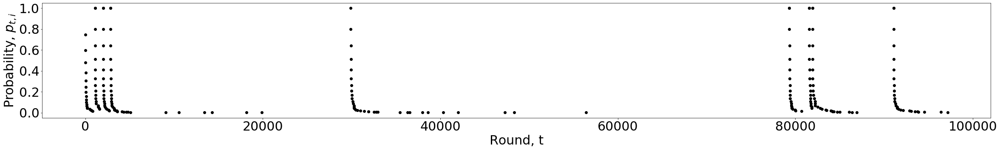

In [11]:
%matplotlib inline
A = Pull_p[:,9]
for i in range(len(A)):
    if A[i] == 0:
        A[i] = np.nan
plt.figure(figsize=(40,5))
plt.plot(A, 'ko')
plt.xlabel('Round, t', fontsize=30)
plt.ylabel('Probability, $p_{t,i}$', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

## Plots of TRD high voltage channels on ALICE, indicating when AliceBandit queried each channel

## The blue line is the sequence of voltages (normalised) taken between January and May 2015 at intervals of approximately 2 seconds

## The red vertical lines indicate when AliceBandit chose to observe feedback from that channel

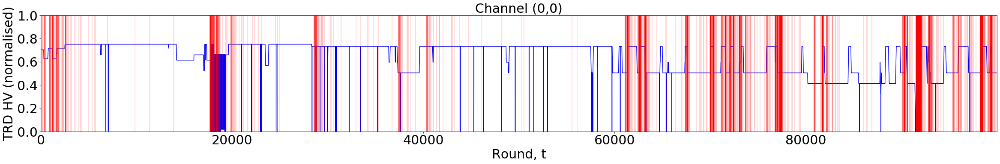

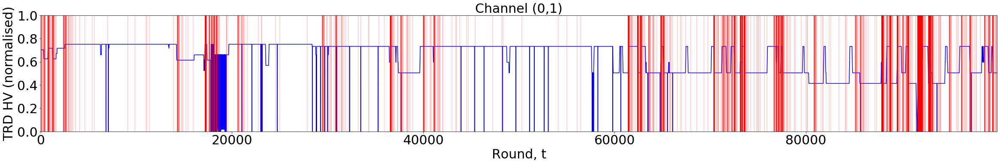

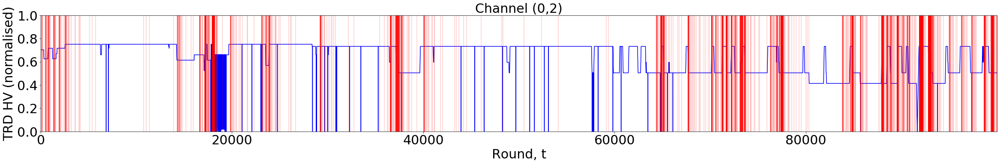

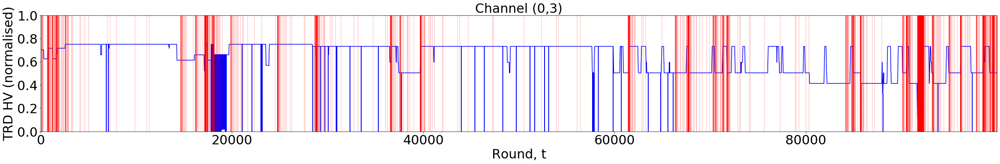

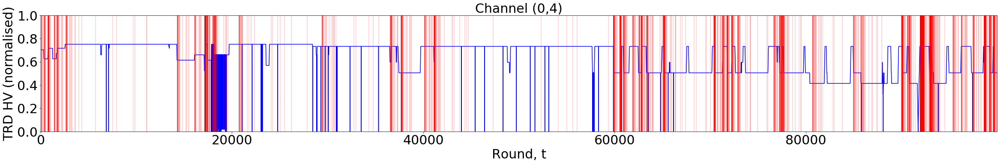

...

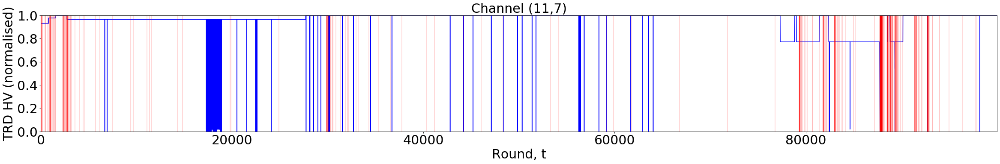

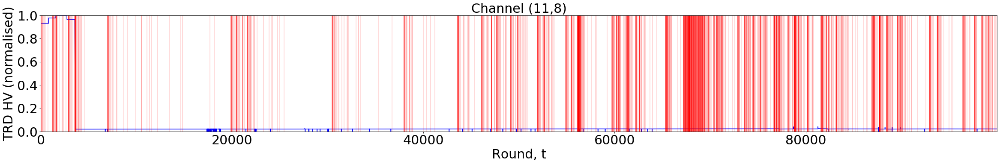

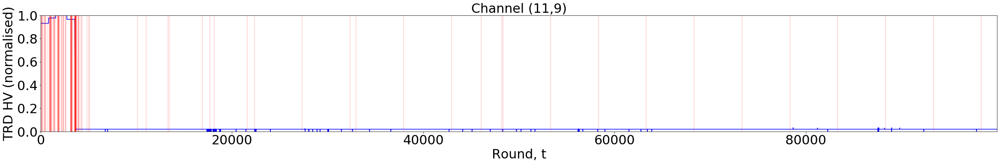

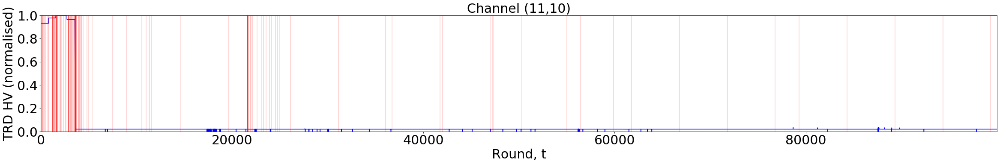

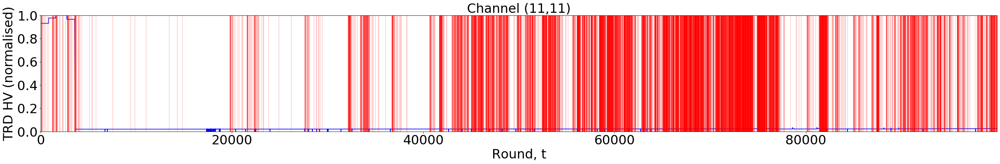

In [13]:
round_ = T-3

%matplotlib inline
for i in range(dim):
    for j in range(dim):
        arm_i = i
        arm_j = j
        arm_ = dim*arm_i + arm_j
        above = Prev_t[arm_].astype(int)
        plt.figure(figsize=(40,5))
        plt.plot(Y[:,dim*arm_i+arm_j], color='blue')
        for j in range(len(above)):
            plt.axvline(x=above[j], color='red', alpha=0.2)
        #plt.plot(threshold, 'k')
        #plt.plot(threshold_, 'k')
        plt.xlim([0,round_+1])
        plt.ylim([0,1])
        plt.title('Channel ({},{})'.format(arm_i,arm_j), fontsize=30)
        plt.xlabel('Round, t', fontsize=30)
        plt.ylabel('TRD HV (normalised)', fontsize=30)
        plt.xticks(fontsize=30)
        plt.yticks(fontsize=30)
        plt.show()

## Further plots of specific channels. The channel is split into smaller chunks of rounds to ease visualisation

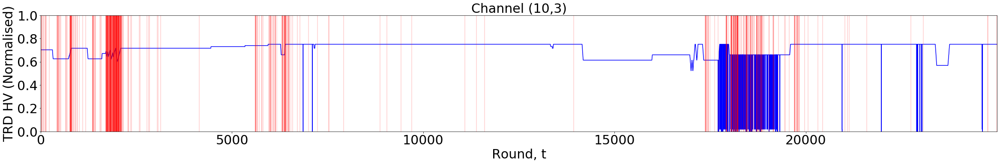

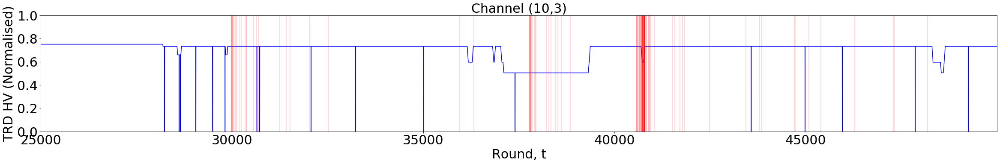

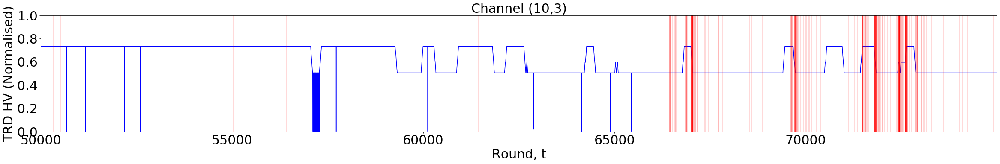

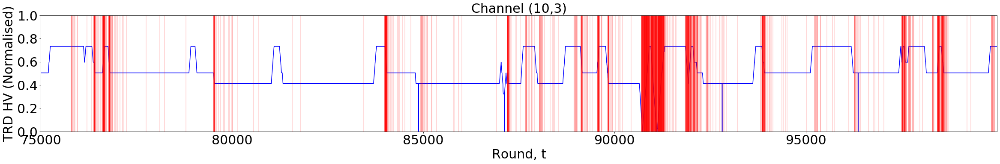

In [15]:
arm_i = 10
arm_j = 3
arm_ = dim*arm_i + arm_j
above = Prev_t[arm_].astype(int)
interval_t = 25000

for i in range(0,T,interval_t):
    if i+interval_t-1<T:
        plt.figure(figsize=(40,5))
        plt.plot(Y[:,dim*arm_i+arm_j], color='blue')
        for j in range(len(above)):
            plt.axvline(x=above[j], color='red', alpha=0.2)
        plt.ylim([0,1])
        plt.xlim([i,i+interval_t-1])
        plt.title('Channel ({},{})'.format(arm_i,arm_j), fontsize=30)
        plt.xlabel('Round, t', fontsize=30)
        plt.ylabel('TRD HV (Normalised)', fontsize=30)
        plt.xticks(fontsize=30)
        plt.yticks(fontsize=30)
        plt.show()
    else:
        plt.figure(figsize=(40,5))
        plt.plot(Y[:,dim*arm_i+arm_j], color='blue')
        for j in range(len(above)):
            plt.axvline(x=above[j], color='red', alpha=0.2)
        plt.ylim([0,1])
        plt.xlim([i,i+T-1])
        plt.title('Channel ({},{})'.format(arm_i,arm_j), fontsize=30)
        plt.xlabel('Round, t', fontsize=30)
        plt.ylabel('TRD HV (Normalised)', fontsize=30)
        plt.xticks(fontsize=30)
        plt.yticks(fontsize=30)
        plt.show()

## Technical details for the associated channel

In [16]:
print('File:',TRD_HV_files[arm_])
df=pd.read_csv(os.getcwd()+'/TRD_DATA/'+str(TRD_HV_files[arm_]), sep=',',header=None,warn_bad_lines=True, error_bad_lines=False)
Channel = df.iloc[0,0]
print('Channel:',Channel)
Interval = np.abs(boundary*(max_val - min_val) + min_val)
print('Interval size: {} V'.format(Interval))
print('Start date:',df.iloc[0,2])
print('End date:',df.iloc[T,2])
print('Example of data give for channel {}'.format(TRD_HV_files[arm_]))
df.head()

File: 1251.csv


/home/bower5005/ALICE_TRD/ALICE_TRD_HV/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Channel: 2890831758405
Interval size: 41.78077905273437 V
Start date: 21-JAN-15 02.41.36.297000000 PM
End date: 14-MAY-15 05.05.58.285000000 PM
Example of data give for channel 1251.csv


,0,1,2
0,2890831758405,1499.995361,21-JAN-15 02.41.36.297000000 PM
1,2890831758405,1499.991699,21-JAN-15 02.43.21.684000000 PM
2,2890831758405,1499.997559,21-JAN-15 02.45.03.287000000 PM
3,2890831758405,1499.999756,21-JAN-15 02.46.46.792000000 PM
4,2890831758405,1499.995361,21-JAN-15 02.48.31.483000000 PM


## Performance details of AliceBandit

In [35]:
print('{} out of {} arms sampled each round'.format(num_samples,dim**2))
print('AliceBandit detected {} changes in the TRD HV channel {}'.format(len(above),Channel))

47 out of 144 arms sampled each round
AliceBandit detected 2204 changes in the TRD HV channel 2890831758405


In [29]:
Thresholded = np.zeros(T)
for i in range(1,T):
    if Y[i,arm_] > Y[i-1,arm_]+boundary or Y[i,arm_] < Y[i-1,arm_]-boundary:
        Thresholded[i] = i
Thresholded = Thresholded[Thresholded !=0].astype(int)

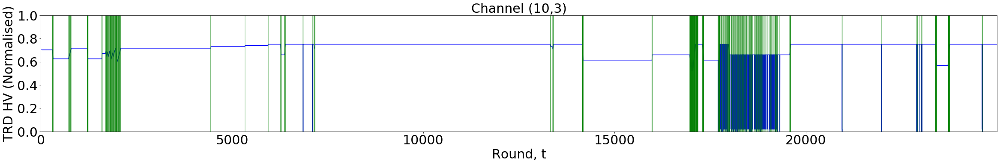

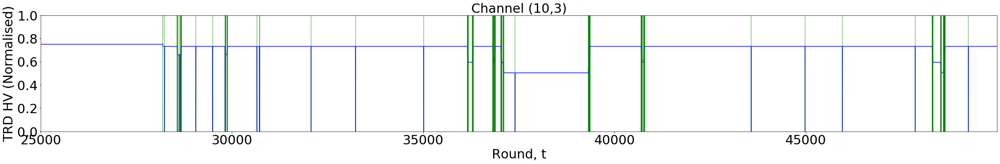

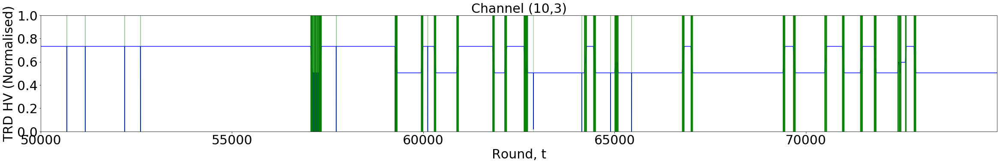

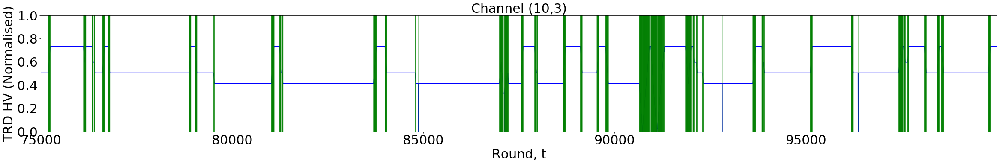

In [30]:
for i in range(0,T,interval_t):
    if i+interval_t-1<T:
        plt.figure(figsize=(40,5))
        plt.plot(Y[:,dim*arm_i+arm_j], color='blue')
        for j in range(len(Thresholded)):
            plt.axvline(x=Thresholded[j], color='green', alpha=0.2)
        plt.ylim([0,1])
        plt.xlim([i,i+interval_t-1])
        plt.title('Channel ({},{})'.format(arm_i,arm_j), fontsize=30)
        plt.xlabel('Round, t', fontsize=30)
        plt.ylabel('TRD HV (Normalised)', fontsize=30)
        plt.xticks(fontsize=30)
        plt.yticks(fontsize=30)
        plt.show()

In [38]:
print('Total of {} actual changes in TRD HV channel {}'.format(len(Thresholded),Channel))
print('Percentage of changes detected:',len(above)/np.float(len(Thresholded)))

Total of 5575 actual changes in TRD HV channel 2890831758405
Percentage of changes detected: 0.3953363228699552
